In [ ]:
# 구글 드라이브 마운트 먼저하세요

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# 경로로 이동
%cd /content/drive/MyDrive/AI_application 23_2/papers

/content/drive/.shortcut-targets-by-id/1nLQ_XwyMisgxw0CYBg1KOiiFqRsYSQgX/papers


In [ ]:
# installall.py는 인스톨 및 임포트 라이브러리를 미리 실행시키도록 제작하였습니다.
# 이 코드 실행 후 keras install을 하였으므로 런타임 재시작하셔야 합니다!

%run pyfile/import_everything.py
installall()
(np, pd, BeautifulSoup, SentenceTransformer, PCA, TruncatedSVD, sm, core, re, json, sns, plt, warnings,
            TfidfVectorizer, torch, ElectraModel, BertModel, BertTokenizer, AutoTokenizer, AutoModel,
            go, px, make_subplots, statistics, class_weight, Sequential, Model, load_model, Conv1D, MaxPooling1D, Flatten, Dense, Dropout, Input, Lambda,
            train_test_split, GridSearchCV, classification_report, confusion_matrix, accuracy_score, f1_score, make_scorer, roc_curve, roc_auc_score,
            ModelCheckpoint, Callback, K, regularizers, mode, KerasClassifier) = load_libraries()

Installing emoji...
emoji has been installed.
Installing sentence_transformers...
sentence_transformers has been installed.
transformers is already installed.
Installing pyod...
pyod has been installed.
Installing Keras version 2.12.0...
Keras version 2.12.0 has been installed.


<IPython.core.display.Javascript object>

Doing Import np...
Doing Import pandas...
Doing Import bs4...
Doing Import sentence_transformers...
Doing Import sklearn.decomposition...
Doing Import sm...
Doing Import emoji...
Doing Import re...
Doing Import json...
Doing Import seaborn...
Doing Import matplotlib.pyplot...
Doing Import warnings...
Doing Import TfidfVectorizer...
Doing Import torch...
Doing Import ElectraModel...
Doing Import BertModel...
Doing Import BertTokenizer...
Doing Import AutoTokenizer...
Doing Import AutoModel...
Doing Import go...
Doing Import px...
Doing Import make_subplots...
Doing Import statistics...
Doing Import class_weight...
Doing Import Sequential...
Doing Import Model...
Doing Import load_model...
Doing Import LSTM...
Doing Import RepeatVector...
Doing Import TimeDistributed...
Doing Import Conv1D...
Doing Import MaxPooling1D...
Doing Import Flatten...
Doing Import Dense...
Doing Import Dropout...
Doing Import Input...
Doing Import Lambda...
Doing Import train_test_split...
Doing Import GridSear

ValueError: ignored

# 댓글 파일 불러오기

In [ ]:
# 이 아래에는 호출형 라이브러리를 적는 곳입니다.
import pandas as pd
#from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
import statsmodels.api as sm
import re
import json
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import numpy as np
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report, precision_score, recall_score
# 모든 경고를 무시하려면
warnings.filterwarnings("ignore")

%matplotlib inline

In [ ]:
your_route

'/content/drive/MyDrive/AI_application 23_2/papers'

In [ ]:
# 이 아래에는 본인의 루트경로를 적는 곳입니다. 추후 통합
your_route='/content/drive/MyDrive/AI_application 23_2/papers'

수정 사항
1. 데이터셋 변경(3개의 영상에서 수집)
2. 텍스트 전처리된 파일로 진행(제 노트북에서 미리 해놨습니다), 추후에 코드 제출 필요시 제출 가능
-> 코랩 매번 돌릴 때마다 전처리 쓰는 시간 절약


In [ ]:
df = pd.read_excel("/content/drive/MyDrive/AI_application 23_2/text_novelty_detection_sample_preprocessed.xlsx")
df

,comment,author,date,num_likes,title,length
0,cctv가 버젓이 있는데무슨 생각으로 저랬을까,downy,2023-11-03T02:10:38Z,0,'부산 서면 돌려차기 사건' 드디어 밝혀진 진실 [shorts],25
1,35년에서 판사가 용서해줘서 형량 줄어들지 않았나,ㅇ,2023-11-02T22:06:15Z,0,'부산 서면 돌려차기 사건' 드디어 밝혀진 진실 [shorts],27
2,참고로 주먹은 자기자신보다 강한사람을 때리는것 이지요,서종범,2023-11-02T14:04:18Z,0,'부산 서면 돌려차기 사건' 드디어 밝혀진 진실 [shorts],29
3,사회에 나와봐야 도움도 안됨 사형이 답 또 다른 피해자를 만들지 마소서,식물 그리고 커피한잔,2023-11-02T13:02:30Z,0,'부산 서면 돌려차기 사건' 드디어 밝혀진 진실 [shorts],39
4,잘 된 일이기는 한데 어케 조두순보다 형량이 높지,프라다임페리얼,2023-11-02T08:31:06Z,0,'부산 서면 돌려차기 사건' 드디어 밝혀진 진실 [shorts],27
...,...,...,...,...,...,...
17542,자식이 없는걸 지구님은 바라실겁니다 인간의 번식은 가치쓸모가 없는 쓰레기라고 지구님...,E지구에 붙어사는 인간!,2023-09-10T05:17:08Z,1,"[자막뉴스] ""넌 자식이 없어서 그러냐?"" 폭언하던 학부모, 결국... / YTN",203
17543,집에서 당신이 키우세요,카일라스를 꿈꾸며,2023-09-10T05:15:41Z,88,"[자막뉴스] ""넌 자식이 없어서 그러냐?"" 폭언하던 학부모, 결국... / YTN",12
17544,애를 소중히 한다고는 하면서 애 망치는 부모들,김준하,2023-09-10T05:12:01Z,721,"[자막뉴스] ""넌 자식이 없어서 그러냐?"" 폭언하던 학부모, 결국... / YTN",25
17545,부모들이 아니라 정확히 엄마들 선생 괴롭히는거 다 여자들임,ㅇㅇ,2023-09-10T07:47:14Z,8,"[자막뉴스] ""넌 자식이 없어서 그러냐?"" 폭언하던 학부모, 결국... / YTN",32


# 스팸 댓글 사전 및 라벨 만들기

In [ ]:
#with open(your_route+"/AI_application 23_2/filter_words.json") as f:
with open("/content/drive/MyDrive/AI_application 23_2/political_comments_dict.json") as f:
    filter_words = json.load(f)
#filter_words = [str(word) for word in filter_words]
#filter_words = str(filter_words).strip("[]")
print(filter_words)

예수|하나님|석열|슬롯|문재인|문재앙|이재명|윤석열|민주당|한동훈|장관|법무부|더불어민주당|허경영|전라도|대깨문|좌파|우파|극우|극좌|이준석|정치|국회의원|선전|선동|사상|검찰|대통령|천공|건희|국민의힘|국힘|운동권|탄핵|정권교체|좌좀|이념|일베|클리앙|남팍|홍어|노무현|김대중|땅끄|전두환|국회|국개|의원|오세훈|검새|완박|새누리|박근혜|우병우|최순실|대남|국정|청문회|박정희|이승만|야당|여당|민노총|최강욱|추미애|윤버버|황교안|간첩|안철수|윤통|자유한국당|미래통합당|보수|진보|검수완박|법조|공직|1찍|2찍|김동연|윤두창|박형준|이명박|대선|총선|정치병|정권|장관|유승민


In [ ]:
df['class'] = df['comment'].apply(lambda x: 1 if re.search(filter_words, x) else 0)
df

,comment,author,date,num_likes,title,length,class
0,cctv가 버젓이 있는데무슨 생각으로 저랬을까,downy,2023-11-03T02:10:38Z,0,'부산 서면 돌려차기 사건' 드디어 밝혀진 진실 [shorts],25,0
1,35년에서 판사가 용서해줘서 형량 줄어들지 않았나,ㅇ,2023-11-02T22:06:15Z,0,'부산 서면 돌려차기 사건' 드디어 밝혀진 진실 [shorts],27,0
2,참고로 주먹은 자기자신보다 강한사람을 때리는것 이지요,서종범,2023-11-02T14:04:18Z,0,'부산 서면 돌려차기 사건' 드디어 밝혀진 진실 [shorts],29,0
3,사회에 나와봐야 도움도 안됨 사형이 답 또 다른 피해자를 만들지 마소서,식물 그리고 커피한잔,2023-11-02T13:02:30Z,0,'부산 서면 돌려차기 사건' 드디어 밝혀진 진실 [shorts],39,0
4,잘 된 일이기는 한데 어케 조두순보다 형량이 높지,프라다임페리얼,2023-11-02T08:31:06Z,0,'부산 서면 돌려차기 사건' 드디어 밝혀진 진실 [shorts],27,0
...,...,...,...,...,...,...,...
17542,자식이 없는걸 지구님은 바라실겁니다 인간의 번식은 가치쓸모가 없는 쓰레기라고 지구님...,E지구에 붙어사는 인간!,2023-09-10T05:17:08Z,1,"[자막뉴스] ""넌 자식이 없어서 그러냐?"" 폭언하던 학부모, 결국... / YTN",203,0
17543,집에서 당신이 키우세요,카일라스를 꿈꾸며,2023-09-10T05:15:41Z,88,"[자막뉴스] ""넌 자식이 없어서 그러냐?"" 폭언하던 학부모, 결국... / YTN",12,0
17544,애를 소중히 한다고는 하면서 애 망치는 부모들,김준하,2023-09-10T05:12:01Z,721,"[자막뉴스] ""넌 자식이 없어서 그러냐?"" 폭언하던 학부모, 결국... / YTN",25,0
17545,부모들이 아니라 정확히 엄마들 선생 괴롭히는거 다 여자들임,ㅇㅇ,2023-09-10T07:47:14Z,8,"[자막뉴스] ""넌 자식이 없어서 그러냐?"" 폭언하던 학부모, 결국... / YTN",32,0


In [ ]:
df[df["class"]==1].head() # 5개만 추출

,comment,author,date,num_likes,title,length,class
28,폭력으로 징역 12년 심하지 않냐 더한 정치 범과 경제사범들이 있는데 있는자들에게는...,은김오,2023-10-31T08:36:45Z,0,'부산 서면 돌려차기 사건' 드디어 밝혀진 진실 [shorts],71,1
191,이런놈이 더큰소리치는이유국회에 전과자놈들이 많기때문국회 전과자 색출 시급합니다,pil7 any,2023-10-17T21:19:48Z,0,'부산 서면 돌려차기 사건' 드디어 밝혀진 진실 [shorts],43,1
247,이런 악질범도 사형 선고를 내리면 문재인은 정말 싫어 할 겁니다,이슬,2023-10-13T06:52:09Z,0,'부산 서면 돌려차기 사건' 드디어 밝혀진 진실 [shorts],35,1
341,국개들 일하자 법좀 바꾸자,비타민D,2023-10-02T13:26:13Z,0,'부산 서면 돌려차기 사건' 드디어 밝혀진 진실 [shorts],14,1
413,이재명도 이렇게 해야하는데,김명분,2023-09-28T13:58:12Z,0,'부산 서면 돌려차기 사건' 드디어 밝혀진 진실 [shorts],14,1


In [ ]:
df["class"].value_counts()
# 라벨 만들어봄 -> 상당히 불균형함

0    17129
1      418
Name: class, dtype: int64

In [ ]:
# 지금 현재 데이터셋의 컬럼이 comment, author, date, num_likes, title, length, class가 있는데 title의 Nan값을 대치시키거나 삭제하는 방법 둘 중 하나를 고민해야할듯요.
# 아래의 코드는 title에 Nan 갯수 및 제외한 상태의 분포를 확인하기 위한 목적으로 작성되었습니다.
# 결론:모든 행이 Nan으로 판별되었습니다.

# Using Sentence Transformer (kor)
> 이상치 탐지에서 불균형 데이터를 교수님께서 과제란에 권유하셨으므로 이부분은 저희가 해결해나가야 할 부분이라고 생각합니다.

> 1.   SentenceTransformer로 임베딩 시도(1000->2000개의 sample)
> 2.   EDA 시도


In [ ]:
#from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
df_sample = df[["comment", "class"]].reset_index(drop = True)
df_sample

,comment,class
0,cctv가 버젓이 있는데무슨 생각으로 저랬을까,0
1,35년에서 판사가 용서해줘서 형량 줄어들지 않았나,0
2,참고로 주먹은 자기자신보다 강한사람을 때리는것 이지요,0
3,사회에 나와봐야 도움도 안됨 사형이 답 또 다른 피해자를 만들지 마소서,0
4,잘 된 일이기는 한데 어케 조두순보다 형량이 높지,0
...,...,...
17542,자식이 없는걸 지구님은 바라실겁니다 인간의 번식은 가치쓸모가 없는 쓰레기라고 지구님...,0
17543,집에서 당신이 키우세요,0
17544,애를 소중히 한다고는 하면서 애 망치는 부모들,0
17545,부모들이 아니라 정확히 엄마들 선생 괴롭히는거 다 여자들임,0


In [ ]:
df_sample["class"].value_counts()
# 추출한 데이터에서도 불균형이 심함
# 0: 정상, 1: 스팸(이상)

0    17129
1      418
Name: class, dtype: int64

In [ ]:
# TF-IDF 벡터화
#tfidf_vectorizer = TfidfVectorizer()
#tfidf_matrix = tfidf_vectorizer.fit_transform(df_sample["comment"])

In [ ]:
# <pre-trained language model list>
# ko-sentence-transformers: "jhgan/ko-sroberta-multitask"
# sentence-transformers/xlm-r-100langs-bert-base-nli-stsb-mean-tokens
# kcbert: beomi/kcbert-base
# kcelectra: beomi/KcELECTRA-base

In [ ]:
embedder = SentenceTransformer("beomi/KcELECTRA-base")

In [ ]:
corpus_embeddings = embedder.encode(list(df_sample["comment"])) # 리스트 형태로 넣어야 작동함
corpus_embeddings

array([[-0.24850026, -0.6058738 , -0.2883851 , ...,  0.5696975 ,
         0.06455339,  0.20843308],
       [-0.5422946 , -0.35160294, -0.14354019, ...,  0.3425459 ,
         0.1065304 , -0.05804093],
       [-0.4302056 , -0.80538064, -0.26102832, ...,  0.40336737,
         0.05961338, -0.17213127],
       ...,
       [-0.2734331 , -0.32321188,  0.37726882, ...,  0.24083424,
         0.45369625,  0.6711734 ],
       [-0.3313096 , -0.8590968 ,  0.06097853, ...,  0.9353684 ,
        -0.24002573,  0.26760986],
       [-0.3194963 , -0.3423445 , -0.1899158 , ...,  0.32505798,
        -0.56024384, -0.35132995]], dtype=float32)

In [ ]:
corpus_embeddings.shape

(17547, 768)

# 변수 선택: PCA

In [ ]:
from sklearn.decomposition import PCA
# PCA를 사용하여 차원 축소
n_components = 5  # 원하는 차원 수
pca = PCA(n_components=n_components)
#corpus_embeddings = pca.fit_transform(corpus_embeddings.toarray())
corpus_embeddings = pca.fit_transform(corpus_embeddings)
corpus_embeddings

array([[-0.39361012, -0.05602428,  2.9185061 , -1.2635801 ,  0.19999681],
       [-1.7591772 ,  2.3547246 , -3.462492  ,  2.0512593 , -1.7821165 ],
       [-2.0458188 ,  0.26109615,  0.33170494,  0.9573519 ,  2.2527804 ],
       ...,
       [-0.77699596,  0.22213444,  4.495342  ,  2.2826557 ,  0.2166161 ],
       [-2.0534708 , -1.9351956 ,  3.0408387 ,  1.9015064 , -0.24142689],
       [-0.0624185 , -1.5122823 ,  1.6799333 , -0.49723032,  2.4167597 ]],
      dtype=float32)

In [ ]:
df_sembed = pd.DataFrame(corpus_embeddings)
df_sembed["class"] = df_sample["class"]
df_sembed

,0,1,2,3,4,class
0,-0.393610,-0.056024,2.918506,-1.263580,0.199997,0
1,-1.759177,2.354725,-3.462492,2.051259,-1.782117,0
2,-2.045819,0.261096,0.331705,0.957352,2.252780,0
3,-2.818538,5.197435,0.577403,0.524934,-1.863878,0
4,-1.418520,1.555139,-0.595873,0.489835,-2.646461,0
...,...,...,...,...,...,...
17542,-4.916927,0.017381,1.068410,0.321257,2.994494,0
17543,2.110383,1.192015,4.739378,1.700831,2.773086,0
17544,-0.776996,0.222134,4.495342,2.282656,0.216616,0
17545,-2.053471,-1.935196,3.040839,1.901506,-0.241427,0


15

In [ ]:
# 줄인 차원 수에 대응되게끔 열 이름 변경
x_columns = []

for i in range(1, len(df_sembed.columns)):
  x_columns.append(f"x{i}")

x_columns.append("class")
df_sembed.columns = x_columns
df_sembed

,x1,x2,x3,x4,x5,class
0,-0.393610,-0.056024,2.918506,-1.263580,0.199997,0
1,-1.759177,2.354725,-3.462492,2.051259,-1.782117,0
2,-2.045819,0.261096,0.331705,0.957352,2.252780,0
3,-2.818538,5.197435,0.577403,0.524934,-1.863878,0
4,-1.418520,1.555139,-0.595873,0.489835,-2.646461,0
...,...,...,...,...,...,...
17542,-4.916927,0.017381,1.068410,0.321257,2.994494,0
17543,2.110383,1.192015,4.739378,1.700831,2.773086,0
17544,-0.776996,0.222134,4.495342,2.282656,0.216616,0
17545,-2.053471,-1.935196,3.040839,1.901506,-0.241427,0


In [ ]:
df_sembed["class"].value_counts()

0    17129
1      418
Name: class, dtype: int64

In [ ]:
from sklearn.model_selection import train_test_split
# 종속 변수와 독립 변수 설정
y = df_sembed['class']
X = df_sembed.drop(columns=['class'])

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=96, shuffle=True)

In [ ]:
print('X_train shape : ', X_train.shape)
print('X_test shape : ', X_test.shape)
print('y_train shape : ', y_train.shape)
print('y_test shape : ', y_test.shape)

X_train shape :  (14037, 5)
X_test shape :  (3510, 5)
y_train shape :  (14037,)
y_test shape :  (3510,)


In [ ]:
X_train

,x1,x2,x3,x4,x5
14597,-4.382021,0.758188,-1.501004,-0.166603,0.663945
6000,4.384054,-2.583748,0.232404,0.110100,-1.217679
13931,6.079473,-3.672393,-0.785395,-0.139692,-0.689385
14710,-3.815344,0.116413,-1.451598,-0.134000,1.259975
16715,-3.417069,-1.577499,1.753127,-0.739255,-0.218327
...,...,...,...,...,...
13793,-2.496075,1.892222,-1.879925,0.092313,-0.161510
8801,-1.055564,2.988863,0.950048,1.973168,-0.415201
2412,11.482990,-1.605237,-0.677610,-0.089199,0.237840
9638,-0.122839,4.169051,-0.977573,-1.090888,-1.758172


In [ ]:
y_test.value_counts()

0    3408
1     102
Name: class, dtype: int64

<Figure size 800x500 with 0 Axes>

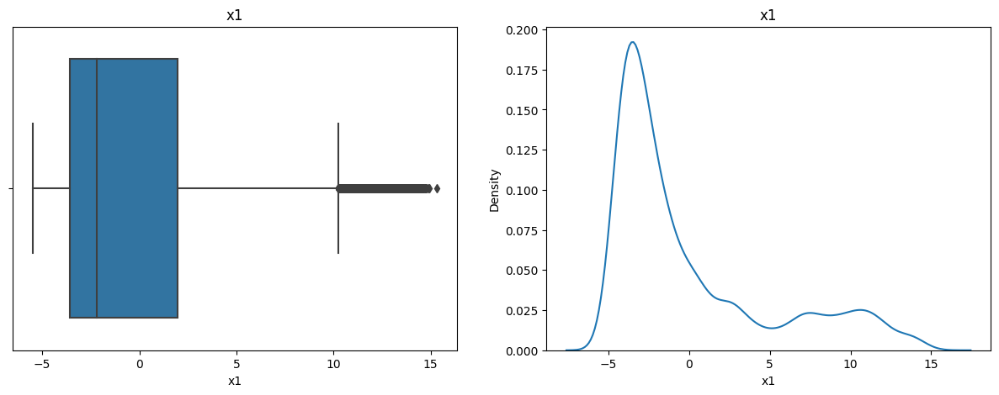

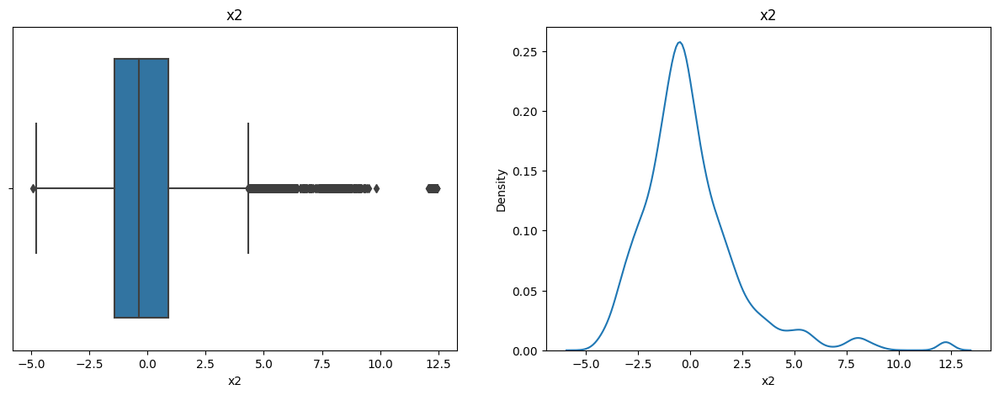

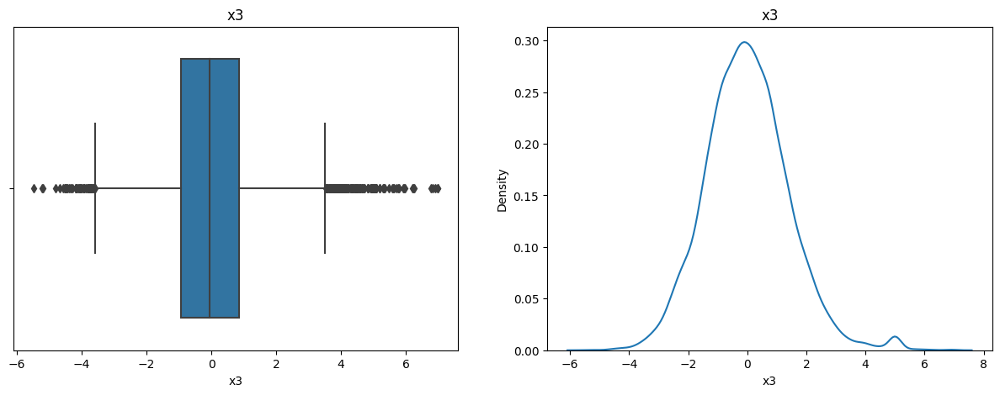

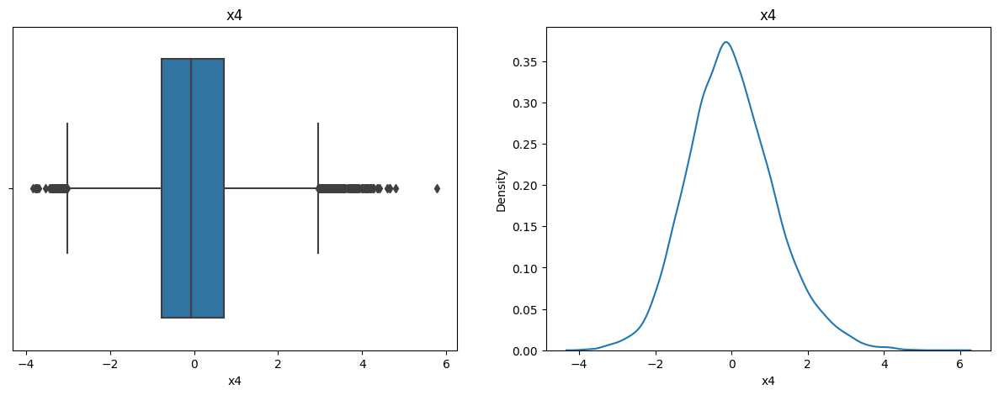

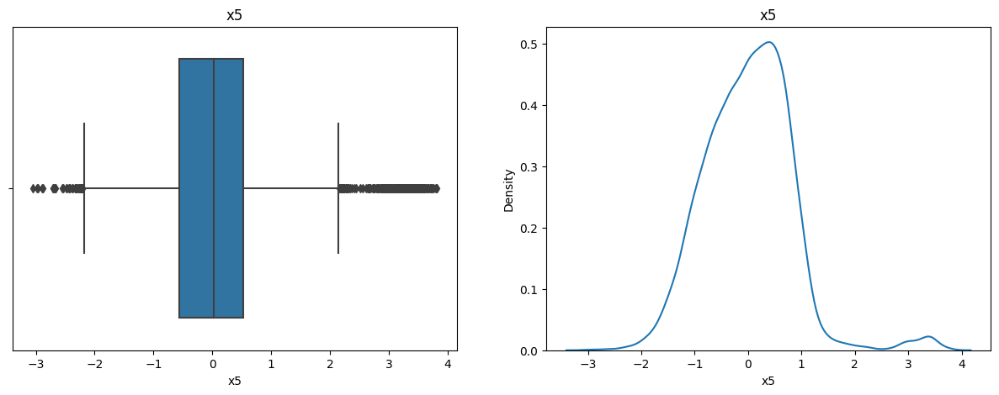

In [ ]:
# 연속변인 박스 플롯
plt.figure(figsize = (8,5))
for col in df_sembed.drop("class", axis = 1).columns:
    fig, axes = plt.subplots(1,2, figsize=(15, 5))
    sns.boxplot(data = df_sembed, x = col, ax=axes[0])
    axes[0].set_title(col)

    sns.kdeplot(data = df_sembed, x = col, ax=axes[1])
    axes[1].set_title(col)

    plt.show()

# TF-IDF 임베딩 & PCA를 통한 차원축소

In [ ]:
!pip install konlpy
!pip install python-mecab-ko # 토크나이저

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.4/19.4 MB 81.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 465.3/465.3 kB 41.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 573.9/573.9 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.5/34.5 MB 20.2 MB/s eta 0:00:00


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from konlpy.tag import Okt
import mecab

In [ ]:
df_sample = df[["comment", "class"]].reset_index(drop = True)
df_sample

,comment,class
0,cctv가 버젓이 있는데무슨 생각으로 저랬을까,0
1,35년에서 판사가 용서해줘서 형량 줄어들지 않았나,0
2,참고로 주먹은 자기자신보다 강한사람을 때리는것 이지요,0
3,사회에 나와봐야 도움도 안됨 사형이 답 또 다른 피해자를 만들지 마소서,0
4,잘 된 일이기는 한데 어케 조두순보다 형량이 높지,0
...,...,...
17542,자식이 없는걸 지구님은 바라실겁니다 인간의 번식은 가치쓸모가 없는 쓰레기라고 지구님...,0
17543,집에서 당신이 키우세요,0
17544,애를 소중히 한다고는 하면서 애 망치는 부모들,0
17545,부모들이 아니라 정확히 엄마들 선생 괴롭히는거 다 여자들임,0


In [ ]:
# 불용어 정의
stopwords = ['의','가','이','은','들','는','좀','잘','걍','과','도','를','으로','자','에','와','한','하다']
m = mecab.MeCab()

In [ ]:
#okt = Okt()
tokenized_data = []
for sentence in df['comment']:
    temp_X = m.morphs(sentence) # 토큰화
    temp_X = [word for word in temp_X if not word in stopwords] # 불용어 제거
    tokenized_data.append(temp_X)

df_sample["tokenized"] = tokenized_data

df_sample

,comment,class,tokenized
0,cctv가 버젓이 있는데무슨 생각으로 저랬을까,0,"[cctv, 버젓이, 있, 는데, 무슨, 생각, 저랬, 을까]"
1,35년에서 판사가 용서해줘서 형량 줄어들지 않았나,0,"[35, 년, 에서, 판사, 용서, 해, 줘서, 형량, 줄어들, 지, 않, 았, 나]"
2,참고로 주먹은 자기자신보다 강한사람을 때리는것 이지요,0,"[참고, 로, 주먹, 자기, 자신, 보다, 강한, 사람, 을, 때리, 것, 지요]"
3,사회에 나와봐야 도움도 안됨 사형이 답 또 다른 피해자를 만들지 마소서,0,"[사회, 나와, 봐야, 도움, 안, 됨, 사형, 답, 또, 다른, 피해자, 만들, ..."
4,잘 된 일이기는 한데 어케 조두순보다 형량이 높지,0,"[된, 일, 기, 한데, 어, 케, 조두순, 보다, 형량, 높, 지]"
...,...,...,...
17542,자식이 없는걸 지구님은 바라실겁니다 인간의 번식은 가치쓸모가 없는 쓰레기라고 지구님...,0,"[자식, 없, 걸, 지구, 님, 바라, 실, 겁니다, 인간, 번식, 가치, 쓸모, ..."
17543,집에서 당신이 키우세요,0,"[집, 에서, 당신, 키우, 세요]"
17544,애를 소중히 한다고는 하면서 애 망치는 부모들,0,"[애, 소중히, 한다고, 하, 면서, 애, 망치, 부모]"
17545,부모들이 아니라 정확히 엄마들 선생 괴롭히는거 다 여자들임,0,"[부모, 아니, 라, 정확히, 엄마, 선생, 괴롭히, 거, 다, 여자, 임]"


In [ ]:
df_sample = df_sample[['comment','tokenized', "class"]]
df_sample

,comment,tokenized,class
0,cctv가 버젓이 있는데무슨 생각으로 저랬을까,"[cctv, 버젓이, 있, 는데, 무슨, 생각, 저랬, 을까]",0
1,35년에서 판사가 용서해줘서 형량 줄어들지 않았나,"[35, 년, 에서, 판사, 용서, 해, 줘서, 형량, 줄어들, 지, 않, 았, 나]",0
2,참고로 주먹은 자기자신보다 강한사람을 때리는것 이지요,"[참고, 로, 주먹, 자기, 자신, 보다, 강한, 사람, 을, 때리, 것, 지요]",0
3,사회에 나와봐야 도움도 안됨 사형이 답 또 다른 피해자를 만들지 마소서,"[사회, 나와, 봐야, 도움, 안, 됨, 사형, 답, 또, 다른, 피해자, 만들, ...",0
4,잘 된 일이기는 한데 어케 조두순보다 형량이 높지,"[된, 일, 기, 한데, 어, 케, 조두순, 보다, 형량, 높, 지]",0
...,...,...,...
17542,자식이 없는걸 지구님은 바라실겁니다 인간의 번식은 가치쓸모가 없는 쓰레기라고 지구님...,"[자식, 없, 걸, 지구, 님, 바라, 실, 겁니다, 인간, 번식, 가치, 쓸모, ...",0
17543,집에서 당신이 키우세요,"[집, 에서, 당신, 키우, 세요]",0
17544,애를 소중히 한다고는 하면서 애 망치는 부모들,"[애, 소중히, 한다고, 하, 면서, 애, 망치, 부모]",0
17545,부모들이 아니라 정확히 엄마들 선생 괴롭히는거 다 여자들임,"[부모, 아니, 라, 정확히, 엄마, 선생, 괴롭히, 거, 다, 여자, 임]",0


In [ ]:
# 리스트를 문자열로 변환하는 함수 정의
def list_to_string(lst):
    return ', '.join(map(str, lst))

okt = Okt()
def stemming(word):
  stem_word = okt.morphs(word ,stem=True)
  return stem_word

def remove_commas(lst):
    return [word for word in lst if word != ',']

In [ ]:
df_sample['tokenized'] = df_sample['tokenized'].apply(list_to_string)
df_sample

,comment,tokenized,class
0,cctv가 버젓이 있는데무슨 생각으로 저랬을까,"cctv, 버젓이, 있, 는데, 무슨, 생각, 저랬, 을까",0
1,35년에서 판사가 용서해줘서 형량 줄어들지 않았나,"35, 년, 에서, 판사, 용서, 해, 줘서, 형량, 줄어들, 지, 않, 았, 나",0
2,참고로 주먹은 자기자신보다 강한사람을 때리는것 이지요,"참고, 로, 주먹, 자기, 자신, 보다, 강한, 사람, 을, 때리, 것, 지요",0
3,사회에 나와봐야 도움도 안됨 사형이 답 또 다른 피해자를 만들지 마소서,"사회, 나와, 봐야, 도움, 안, 됨, 사형, 답, 또, 다른, 피해자, 만들, 지...",0
4,잘 된 일이기는 한데 어케 조두순보다 형량이 높지,"된, 일, 기, 한데, 어, 케, 조두순, 보다, 형량, 높, 지",0
...,...,...,...
17542,자식이 없는걸 지구님은 바라실겁니다 인간의 번식은 가치쓸모가 없는 쓰레기라고 지구님...,"자식, 없, 걸, 지구, 님, 바라, 실, 겁니다, 인간, 번식, 가치, 쓸모, 없...",0
17543,집에서 당신이 키우세요,"집, 에서, 당신, 키우, 세요",0
17544,애를 소중히 한다고는 하면서 애 망치는 부모들,"애, 소중히, 한다고, 하, 면서, 애, 망치, 부모",0
17545,부모들이 아니라 정확히 엄마들 선생 괴롭히는거 다 여자들임,"부모, 아니, 라, 정확히, 엄마, 선생, 괴롭히, 거, 다, 여자, 임",0


In [ ]:
df_sample['tokenized'] = df_sample['tokenized'].apply(stemming)
df_sample

,comment,tokenized,class
0,cctv가 버젓이 있는데무슨 생각으로 저랬을까,"[cctv, ,, 버젓이, ,, 있다, ,, 는데, ,, 무슨, ,, 생각, ,, ...",0
1,35년에서 판사가 용서해줘서 형량 줄어들지 않았나,"[35, ,, 년, ,, 에서, ,, 판사, ,, 용서, ,, 해, ,, 주다, ,...",0
2,참고로 주먹은 자기자신보다 강한사람을 때리는것 이지요,"[참고, ,, 로, ,, 주먹, ,, 자기, ,, 자신, ,, 보다, ,, 강하다,...",0
3,사회에 나와봐야 도움도 안됨 사형이 답 또 다른 피해자를 만들지 마소서,"[사회, ,, 나오다, ,, 보다, ,, 도움, ,, 안, ,, 되다, ,, 사형,...",0
4,잘 된 일이기는 한데 어케 조두순보다 형량이 높지,"[되다, ,, 일, ,, 기, ,, 한데, ,, 어, ,, 케, ,, 조두순, ,,...",0
...,...,...,...
17542,자식이 없는걸 지구님은 바라실겁니다 인간의 번식은 가치쓸모가 없는 쓰레기라고 지구님...,"[자식, ,, 없다, ,, 걸, ,, 지구, ,, 님, ,, 바라다, ,, 실, ,...",0
17543,집에서 당신이 키우세요,"[집, ,, 에서, ,, 당신, ,, 키우다, ,, 세요]",0
17544,애를 소중히 한다고는 하면서 애 망치는 부모들,"[애, ,, 소중하다, ,, 하다, ,, 하, ,, 면서, ,, 애, ,, 망치, ...",0
17545,부모들이 아니라 정확히 엄마들 선생 괴롭히는거 다 여자들임,"[부모, ,, 아니다, ,, 라, ,, 정확하다, ,, 엄마, ,, 선생, ,, 괴...",0


In [ ]:
df_sample['tokenized'] = df_sample['tokenized'].apply(remove_commas)
df_sample

,comment,tokenized,class
0,cctv가 버젓이 있는데무슨 생각으로 저랬을까,"[cctv, 버젓이, 있다, 는데, 무슨, 생각, 저렇다, 을까]",0
1,35년에서 판사가 용서해줘서 형량 줄어들지 않았나,"[35, 년, 에서, 판사, 용서, 해, 주다, 형량, 줄어들다, 지다, 않다, 았...",0
2,참고로 주먹은 자기자신보다 강한사람을 때리는것 이지요,"[참고, 로, 주먹, 자기, 자신, 보다, 강하다, 사람, 을, 때리다, 것, 지요]",0
3,사회에 나와봐야 도움도 안됨 사형이 답 또 다른 피해자를 만들지 마소서,"[사회, 나오다, 보다, 도움, 안, 되다, 사형, 답, 또, 다른, 피해자, 만들...",0
4,잘 된 일이기는 한데 어케 조두순보다 형량이 높지,"[되다, 일, 기, 한데, 어, 케, 조두순, 보다, 형량, 높다, 지다]",0
...,...,...,...
17542,자식이 없는걸 지구님은 바라실겁니다 인간의 번식은 가치쓸모가 없는 쓰레기라고 지구님...,"[자식, 없다, 걸, 지구, 님, 바라다, 실, 겁니다, 인간, 번식, 가치, 쓸모...",0
17543,집에서 당신이 키우세요,"[집, 에서, 당신, 키우다, 세요]",0
17544,애를 소중히 한다고는 하면서 애 망치는 부모들,"[애, 소중하다, 하다, 하, 면서, 애, 망치, 부모]",0
17545,부모들이 아니라 정확히 엄마들 선생 괴롭히는거 다 여자들임,"[부모, 아니다, 라, 정확하다, 엄마, 선생, 괴롭히다, 거, 다, 여자, 임]",0


In [ ]:
df_sample['tokenized'] = df_sample['tokenized'].apply(list_to_string)
df_sample

,comment,tokenized,class
0,cctv가 버젓이 있는데무슨 생각으로 저랬을까,"cctv, 버젓이, 있다, 는데, 무슨, 생각, 저렇다, 을까",0
1,35년에서 판사가 용서해줘서 형량 줄어들지 않았나,"35, 년, 에서, 판사, 용서, 해, 주다, 형량, 줄어들다, 지다, 않다, 았, 나",0
2,참고로 주먹은 자기자신보다 강한사람을 때리는것 이지요,"참고, 로, 주먹, 자기, 자신, 보다, 강하다, 사람, 을, 때리다, 것, 지요",0
3,사회에 나와봐야 도움도 안됨 사형이 답 또 다른 피해자를 만들지 마소서,"사회, 나오다, 보다, 도움, 안, 되다, 사형, 답, 또, 다른, 피해자, 만들다...",0
4,잘 된 일이기는 한데 어케 조두순보다 형량이 높지,"되다, 일, 기, 한데, 어, 케, 조두순, 보다, 형량, 높다, 지다",0
...,...,...,...
17542,자식이 없는걸 지구님은 바라실겁니다 인간의 번식은 가치쓸모가 없는 쓰레기라고 지구님...,"자식, 없다, 걸, 지구, 님, 바라다, 실, 겁니다, 인간, 번식, 가치, 쓸모,...",0
17543,집에서 당신이 키우세요,"집, 에서, 당신, 키우다, 세요",0
17544,애를 소중히 한다고는 하면서 애 망치는 부모들,"애, 소중하다, 하다, 하, 면서, 애, 망치, 부모",0
17545,부모들이 아니라 정확히 엄마들 선생 괴롭히는거 다 여자들임,"부모, 아니다, 라, 정확하다, 엄마, 선생, 괴롭히다, 거, 다, 여자, 임",0


클래스별 단어 비율

In [ ]:
df_sample_eda = df_sample.copy()

In [ ]:
df_sample_eda

,comment,tokenized,class
0,cctv가 버젓이 있는데무슨 생각으로 저랬을까,"[cctv, 버젓이, 있, 는데, 무슨, 생각, 저랬, 을까]",0
1,35년에서 판사가 용서해줘서 형량 줄어들지 않았나,"[35, 년, 에서, 판사, 용서, 해, 줘서, 형량, 줄어들, 지, 않, 았, 나]",0
2,참고로 주먹은 자기자신보다 강한사람을 때리는것 이지요,"[참고, 로, 주먹, 자기, 자신, 보다, 강한, 사람, 을, 때리, 것, 지요]",0
3,사회에 나와봐야 도움도 안됨 사형이 답 또 다른 피해자를 만들지 마소서,"[사회, 나와, 봐야, 도움, 안, 됨, 사형, 답, 또, 다른, 피해자, 만들, ...",0
4,잘 된 일이기는 한데 어케 조두순보다 형량이 높지,"[된, 일, 기, 한데, 어, 케, 조두순, 보다, 형량, 높, 지]",0
...,...,...,...
17542,자식이 없는걸 지구님은 바라실겁니다 인간의 번식은 가치쓸모가 없는 쓰레기라고 지구님...,"[자식, 없, 걸, 지구, 님, 바라, 실, 겁니다, 인간, 번식, 가치, 쓸모, ...",0
17543,집에서 당신이 키우세요,"[집, 에서, 당신, 키우, 세요]",0
17544,애를 소중히 한다고는 하면서 애 망치는 부모들,"[애, 소중히, 한다고, 하, 면서, 애, 망치, 부모]",0
17545,부모들이 아니라 정확히 엄마들 선생 괴롭히는거 다 여자들임,"[부모, 아니, 라, 정확히, 엄마, 선생, 괴롭히, 거, 다, 여자, 임]",0


In [ ]:
tokenized_data = []
for sentence in df_sample_eda['comment']:
    temp_X = m.pos(sentence) # 토큰화
    temp_X = [word for word in temp_X if not word in stopwords] # 불용어 제거
    tokenized_data.append(temp_X)

df_sample_eda["tokenized"] = tokenized_data

In [ ]:
#df_sample_eda['tokenized'] = df_sample_eda['tokenized'].apply(list_to_string)
#df_sample_eda['tokenized'] = df_sample_eda['tokenized'].apply(stemming)
#df_sample_eda['tokenized'] = df_sample_eda['tokenized'].apply(remove_commas)

In [ ]:
df_sample_eda

,comment,tokenized,class
0,cctv가 버젓이 있는데무슨 생각으로 저랬을까,"[(cctv, SL), (가, JKS), (버젓이, MAG), (있, VV), (는...",0
1,35년에서 판사가 용서해줘서 형량 줄어들지 않았나,"[(35, SN), (년, NNBC), (에서, JKB), (판사, NNG), (가...",0
2,참고로 주먹은 자기자신보다 강한사람을 때리는것 이지요,"[(참고, NNG), (로, JKB), (주먹, NNG), (은, JX), (자기,...",0
3,사회에 나와봐야 도움도 안됨 사형이 답 또 다른 피해자를 만들지 마소서,"[(사회, NNG), (에, JKB), (나와, VV+EC), (봐야, VX+EC)...",0
4,잘 된 일이기는 한데 어케 조두순보다 형량이 높지,"[(잘, MAG), (된, VV+ETM), (일, NNG), (이, VCP), (기...",0
...,...,...,...
17542,자식이 없는걸 지구님은 바라실겁니다 인간의 번식은 가치쓸모가 없는 쓰레기라고 지구님...,"[(자식, NNG), (이, JKS), (없, VA), (는, ETM), (걸, N...",0
17543,집에서 당신이 키우세요,"[(집, NNG), (에서, JKB), (당신, NP), (이, JKS), (키우,...",0
17544,애를 소중히 한다고는 하면서 애 망치는 부모들,"[(애, NNG), (를, JKO), (소중히, MAG), (한다고, VV+EC),...",0
17545,부모들이 아니라 정확히 엄마들 선생 괴롭히는거 다 여자들임,"[(부모, NNG), (들, XSN), (이, JKC), (아니, VCN), (라,...",0


In [ ]:
df_sample_eda['tokenized'].value_counts()

[(사형, NNG), (시켜라, XSV+EC)]                                                                                                                                                                                                                                                                                   28
[(사형, NNG), (이, JKS), (답, NNG), (이, VCP), (다, EC)]                                                                                                                                                                                                                                                           25
[(무기, NNG), (징역, NNG)]                                                                                                                                                                                                                                                                                        8
[(사형, NNG), (시켜야, XSV+EC), (한다, VX+EC)]                                                 

In [ ]:
df_sample_eda.to_excel("/content/drive/MyDrive/AI_application 23_2/papers/df_sample_eda.xlsx")

In [ ]:
df_sample_eda[df_sample_eda['tokenized'].apply(lambda x: len(x) > 1 and any(tag in x[1] for tag in ['NNG']))] # ,

,comment,tokenized,class
6,여자엉덩이 손대면 성추행이자나 들어올릴때 얼덩이에 손있네,"[(여자, NNG), (엉덩이, NNG), (손대, VV), (면, EC), (성추...",0
7,내세금 아깝지않으니 평생 이 사회와 격리 시켜야 한다,"[(내, NP+JKG), (세금, NNG), (아깝, VA), (지, EC), (않...",0
10,얼마 전에 법원에서 20년 형 확정되었음 고의 살인미수 30년 이상 고의 살인 50...,"[(얼마, NNG), (전, NNG), (에, JKB), (법원, NNG), (에서...",0
12,이번사건으로 반성문감형은 사라지겟구나 법개선1개고침,"[(이번, NNG), (사건, NNG), (으로, JKB), (반성, NNG), (...",0
13,무기징역이 아니라 짜증나지만 감형없이 꼭 만기 다 채우고 나오기 전에 몹쓸 죽을병에...,"[(무기, NNG), (징역, NNG), (이, JKC), (아니, VCN), (라...",0
...,...,...,...
17527,도대체 밖에서 얼마나 무시를 받으면 그걸 유치원교사에게 화풀이냐,"[(도대체, MAG), (밖, NNG), (에서, JKB), (얼마나, MAG), ...",0
17531,아동학대법 개정 아동복지법 개정 학교폭력법 개정 악성 민원인 법적 처벌 이거면 됩니...,"[(아동학, NNG), (대법, NNG), (개정, NNG), (아동, NNG), ...",0
17536,부모 부메랑,"[(부모, NNG), (부메랑, NNG)]",0
17538,또 중고등학교 가면 엄마가 예전에 했던거 다 까먹고 엄마가 또 진상짓 할 예정,"[(또, MAG), (중고, NNG), (등, NNB), (학교, NNG), (가,...",0


In [ ]:
df_sample_eda[df_sample_eda['tokenized'].apply(lambda x: len(x) > 1 and any(tag not in x for tag in ['MAG', 'NNG','VA', 'VV']))]

,comment,tokenized,class
0,cctv가 버젓이 있는데무슨 생각으로 저랬을까,"[(cctv, SL), (가, JKS), (버젓이, MAG), (있, VV), (는...",0
1,35년에서 판사가 용서해줘서 형량 줄어들지 않았나,"[(35, SN), (년, NNBC), (에서, JKB), (판사, NNG), (가...",0
2,참고로 주먹은 자기자신보다 강한사람을 때리는것 이지요,"[(참고, NNG), (로, JKB), (주먹, NNG), (은, JX), (자기,...",0
3,사회에 나와봐야 도움도 안됨 사형이 답 또 다른 피해자를 만들지 마소서,"[(사회, NNG), (에, JKB), (나와, VV+EC), (봐야, VX+EC)...",0
4,잘 된 일이기는 한데 어케 조두순보다 형량이 높지,"[(잘, MAG), (된, VV+ETM), (일, NNG), (이, VCP), (기...",0
...,...,...,...
17542,자식이 없는걸 지구님은 바라실겁니다 인간의 번식은 가치쓸모가 없는 쓰레기라고 지구님...,"[(자식, NNG), (이, JKS), (없, VA), (는, ETM), (걸, N...",0
17543,집에서 당신이 키우세요,"[(집, NNG), (에서, JKB), (당신, NP), (이, JKS), (키우,...",0
17544,애를 소중히 한다고는 하면서 애 망치는 부모들,"[(애, NNG), (를, JKO), (소중히, MAG), (한다고, VV+EC),...",0
17545,부모들이 아니라 정확히 엄마들 선생 괴롭히는거 다 여자들임,"[(부모, NNG), (들, XSN), (이, JKC), (아니, VCN), (라,...",0


In [ ]:
df_sample_eda[df_sample_eda['tokenized'].apply(lambda x: len(x) > 1 and any(tag in x[1] for tag in ['VV', 'MAG', 'NNG']))]

,comment,tokenized,class
6,여자엉덩이 손대면 성추행이자나 들어올릴때 얼덩이에 손있네,"[(여자, NNG), (엉덩이, NNG), (손대, VV), (면, EC), (성추...",0
7,내세금 아깝지않으니 평생 이 사회와 격리 시켜야 한다,"[(내, NP+JKG), (세금, NNG), (아깝, VA), (지, EC), (않...",0
10,얼마 전에 법원에서 20년 형 확정되었음 고의 살인미수 30년 이상 고의 살인 50...,"[(얼마, NNG), (전, NNG), (에, JKB), (법원, NNG), (에서...",0
12,이번사건으로 반성문감형은 사라지겟구나 법개선1개고침,"[(이번, NNG), (사건, NNG), (으로, JKB), (반성, NNG), (...",0
13,무기징역이 아니라 짜증나지만 감형없이 꼭 만기 다 채우고 나오기 전에 몹쓸 죽을병에...,"[(무기, NNG), (징역, NNG), (이, JKC), (아니, VCN), (라...",0
...,...,...,...
17531,아동학대법 개정 아동복지법 개정 학교폭력법 개정 악성 민원인 법적 처벌 이거면 됩니...,"[(아동학, NNG), (대법, NNG), (개정, NNG), (아동, NNG), ...",0
17536,부모 부메랑,"[(부모, NNG), (부메랑, NNG)]",0
17538,또 중고등학교 가면 엄마가 예전에 했던거 다 까먹고 엄마가 또 진상짓 할 예정,"[(또, MAG), (중고, NNG), (등, NNB), (학교, NNG), (가,...",0
17539,와 너무한거 아냐,"[(와, IC), (너무, MAG), (한, XSA+ETM), (거, NNB), (...",0


In [ ]:
df_sample_eda[df_sample_eda['tokenized'].apply(lambda x: len(x) > 1 and any(tag in x[1] for tag in ['VV', 'MAG', 'NNG']))]

,comment,tokenized,class
6,여자엉덩이 손대면 성추행이자나 들어올릴때 얼덩이에 손있네,"[(여자, NNG), (엉덩이, NNG), (손대, VV), (면, EC), (성추...",0
7,내세금 아깝지않으니 평생 이 사회와 격리 시켜야 한다,"[(내, NP+JKG), (세금, NNG), (아깝, VA), (지, EC), (않...",0
10,얼마 전에 법원에서 20년 형 확정되었음 고의 살인미수 30년 이상 고의 살인 50...,"[(얼마, NNG), (전, NNG), (에, JKB), (법원, NNG), (에서...",0
12,이번사건으로 반성문감형은 사라지겟구나 법개선1개고침,"[(이번, NNG), (사건, NNG), (으로, JKB), (반성, NNG), (...",0
13,무기징역이 아니라 짜증나지만 감형없이 꼭 만기 다 채우고 나오기 전에 몹쓸 죽을병에...,"[(무기, NNG), (징역, NNG), (이, JKC), (아니, VCN), (라...",0
...,...,...,...
17531,아동학대법 개정 아동복지법 개정 학교폭력법 개정 악성 민원인 법적 처벌 이거면 됩니...,"[(아동학, NNG), (대법, NNG), (개정, NNG), (아동, NNG), ...",0
17536,부모 부메랑,"[(부모, NNG), (부메랑, NNG)]",0
17538,또 중고등학교 가면 엄마가 예전에 했던거 다 까먹고 엄마가 또 진상짓 할 예정,"[(또, MAG), (중고, NNG), (등, NNB), (학교, NNG), (가,...",0
17539,와 너무한거 아냐,"[(와, IC), (너무, MAG), (한, XSA+ETM), (거, NNB), (...",0


In [ ]:
# TF-IDF 벡터화
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(df_sample["tokenized"])

In [ ]:
tfidf_matrix

<17547x10306 sparse matrix of type '<class 'numpy.float64'>'
	with 161468 stored elements in Compressed Sparse Row format>

In [ ]:
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots

In [ ]:
# 사실 p-value값이 아래에서 높게 나오는 이유는 이 과정부터의 문제라고 보입니다.
# 모델을 통한 군집축소로 해야 할 수도 있어 보입니다.

# PCA를 사용하여 차원 축소
n_components = 5  # 원하는 차원 수
pca = PCA(n_components=n_components)
corpus_embeddings = pca.fit_transform(tfidf_matrix.toarray())

In [ ]:
corpus_embeddings

array([[-0.01735776, -0.04486716, -0.02394853,  0.00501943, -0.00855041],
       [-0.04013493, -0.03624503, -0.09143708,  0.07674936,  0.02509043],
       [-0.01651258, -0.0337094 , -0.00172469, -0.01061868, -0.05545417],
       ...,
       [-0.03101131, -0.04131614, -0.03650339, -0.00488816,  0.07140239],
       [-0.0247895 , -0.04921299, -0.04617379,  0.01263867, -0.03496066],
       [-0.02097373, -0.03067766, -0.0236058 , -0.00058176, -0.0451927 ]])

In [ ]:
df_sembed = pd.DataFrame(corpus_embeddings)
df_sembed["class"] = df_sample["class"]
df_sembed

,0,1,2,3,4,class
0,-0.017358,-0.044867,-0.023949,0.005019,-0.008550,0
1,-0.040135,-0.036245,-0.091437,0.076749,0.025090,0
2,-0.016513,-0.033709,-0.001725,-0.010619,-0.055454,0
3,-0.111062,0.125000,-0.042705,0.041141,0.054081,0
4,-0.027975,-0.042077,-0.059478,0.045290,0.024445,0
...,...,...,...,...,...,...
17542,-0.040804,-0.023343,-0.051804,0.012116,-0.001800,0
17543,-0.037294,-0.051623,-0.127835,0.093792,0.016416,0
17544,-0.031011,-0.041316,-0.036503,-0.004888,0.071402,0
17545,-0.024789,-0.049213,-0.046174,0.012639,-0.034961,0


In [ ]:
df_sembed.to_csv(your_route+"/tfidf_embedding.csv")

In [ ]:
df_sembed = pd.read_csv(your_route+"/tfidf_embedding.csv")
df_sembed

,Unnamed: 0,x1,x2,x3,x4,x5,class
0,0,-0.017358,-0.044867,-0.023949,0.005019,-0.008550,0
1,1,-0.040135,-0.036245,-0.091437,0.076749,0.025090,0
2,2,-0.016513,-0.033709,-0.001725,-0.010619,-0.055454,0
3,3,-0.111062,0.125000,-0.042705,0.041141,0.054081,0
4,4,-0.027975,-0.042077,-0.059478,0.045290,0.024445,0
...,...,...,...,...,...,...,...
17542,17542,-0.040804,-0.023343,-0.051804,0.012116,-0.001800,0
17543,17543,-0.037294,-0.051623,-0.127835,0.093792,0.016416,0
17544,17544,-0.031011,-0.041316,-0.036503,-0.004888,0.071402,0
17545,17545,-0.024789,-0.049213,-0.046174,0.012639,-0.034961,0


In [ ]:
df_sembed = df_sembed.drop('Unnamed: 0', axis = 1)
df_sembed

,x1,x2,x3,x4,x5,class
0,-0.017358,-0.044867,-0.023949,0.005019,-0.008550,0
1,-0.040135,-0.036245,-0.091437,0.076749,0.025090,0
2,-0.016513,-0.033709,-0.001725,-0.010619,-0.055454,0
3,-0.111062,0.125000,-0.042705,0.041141,0.054081,0
4,-0.027975,-0.042077,-0.059478,0.045290,0.024445,0
...,...,...,...,...,...,...
17542,-0.040804,-0.023343,-0.051804,0.012116,-0.001800,0
17543,-0.037294,-0.051623,-0.127835,0.093792,0.016416,0
17544,-0.031011,-0.041316,-0.036503,-0.004888,0.071402,0
17545,-0.024789,-0.049213,-0.046174,0.012639,-0.034961,0


In [ ]:
# 줄인 차원 수에 대응되게끔 열 이름 변경
x_columns = []

for i in range(1, len(df_sembed.columns)):
  x_columns.append(f"x{i}")

x_columns.append("class")
df_sembed.columns = x_columns
df_sembed

,x1,x2,x3,x4,x5,class
0,-0.017358,-0.044867,-0.023949,0.005019,-0.008550,0
1,-0.040135,-0.036245,-0.091437,0.076749,0.025090,0
2,-0.016513,-0.033709,-0.001725,-0.010619,-0.055454,0
3,-0.111062,0.125000,-0.042705,0.041141,0.054081,0
4,-0.027975,-0.042077,-0.059478,0.045290,0.024445,0
...,...,...,...,...,...,...
17542,-0.040804,-0.023343,-0.051804,0.012116,-0.001800,0
17543,-0.037294,-0.051623,-0.127835,0.093792,0.016416,0
17544,-0.031011,-0.041316,-0.036503,-0.004888,0.071402,0
17545,-0.024789,-0.049213,-0.046174,0.012639,-0.034961,0


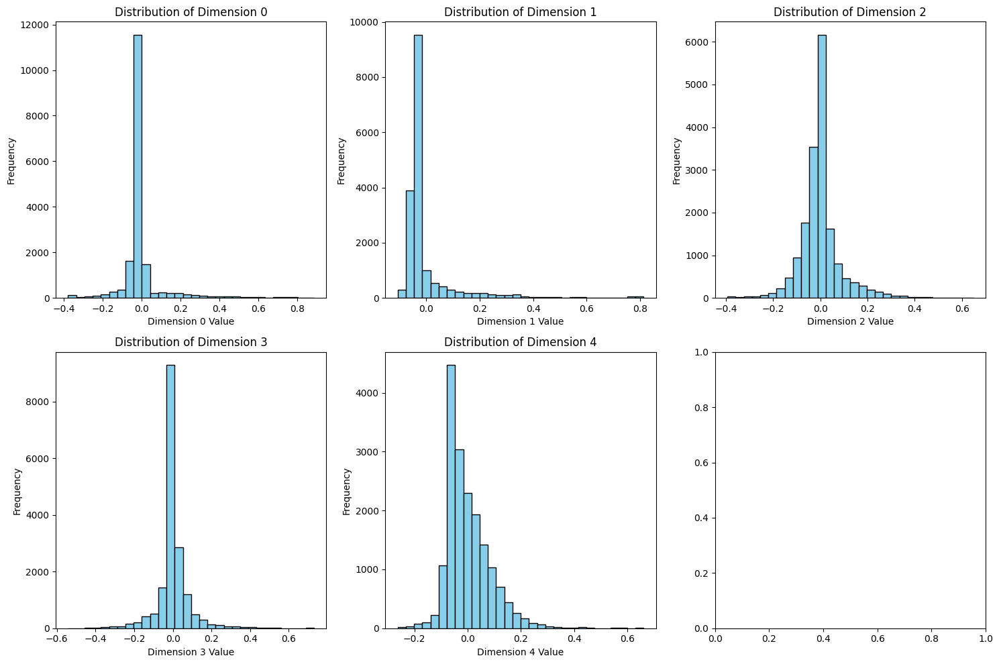

In [ ]:
show_dimension_graph(df_sembed)

In [ ]:
X_train

,x1,x2,x3,x4,x5
7141,0.341196,0.648051,0.028737,0.213837,0.347233
12081,0.689897,0.803864,0.047945,0.300092,0.376019
7240,0.315257,0.646487,-0.046042,0.296508,0.454072
412,0.316211,0.623271,-0.052273,0.265433,0.404488
11647,0.343257,0.628196,0.079952,0.175462,0.377402
...,...,...,...,...,...
13793,0.331569,0.649494,0.019354,0.217475,0.342173
8801,0.331798,0.629771,-0.035806,0.268203,0.400560
2412,0.333153,0.652805,0.025733,0.208700,0.341544
9638,0.576490,0.744320,0.262931,0.565644,0.373584


In [ ]:
df_sembed = min_max_scaler(df_sembed)
df_sembed = zero_centered_scaling(df_sembed)
df_sembed

NameError: ignored

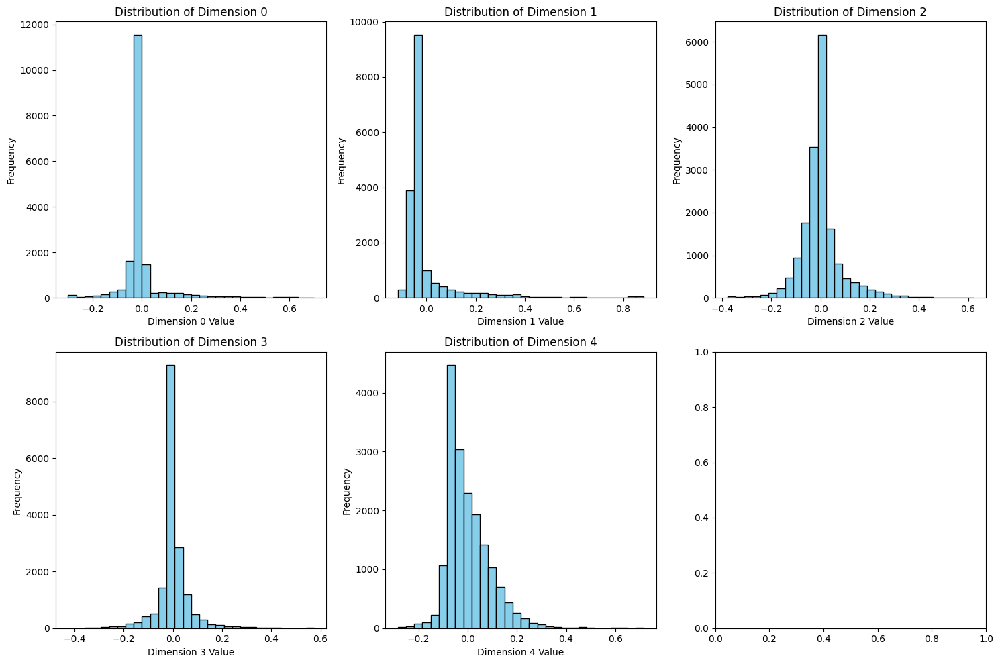

In [ ]:
show_dimension_graph(df_sembed)

In [ ]:
from sklearn.model_selection import train_test_split
# 종속 변수와 독립 변수 설정
y = df_sembed['class']
X = df_sembed.drop(columns=['class'])

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=96, shuffle=True)

In [ ]:
X_train

,x1,x2,x3,x4,x5
7141,0.000629,-0.029767,0.009784,-0.012010,-0.060459
12081,0.349330,0.126046,0.028991,0.074245,-0.031672
7240,-0.025310,-0.031330,-0.064996,0.070660,0.046380
412,-0.024356,-0.054547,-0.071227,0.039585,-0.003203
11647,0.002690,-0.049622,0.060998,-0.050385,-0.030289
...,...,...,...,...,...
13793,-0.008998,-0.028324,0.000401,-0.008372,-0.065519
8801,-0.008769,-0.048047,-0.054759,0.042356,-0.007131
2412,-0.007415,-0.025013,0.006779,-0.017148,-0.066148
9638,0.235923,0.066502,0.243978,0.339796,-0.034107


In [ ]:
df_check = X_train.copy()
df_check['class'] = y_train
df_check

,x1,x2,x3,x4,x5,class
7141,0.000629,-0.029767,0.009784,-0.012010,-0.060459,0
12081,0.349330,0.126046,0.028991,0.074245,-0.031672,0
7240,-0.025310,-0.031330,-0.064996,0.070660,0.046380,0
412,-0.024356,-0.054547,-0.071227,0.039585,-0.003203,0
11647,0.002690,-0.049622,0.060998,-0.050385,-0.030289,0
...,...,...,...,...,...,...
13793,-0.008998,-0.028324,0.000401,-0.008372,-0.065519,0
8801,-0.008769,-0.048047,-0.054759,0.042356,-0.007131,0
2412,-0.007415,-0.025013,0.006779,-0.017148,-0.066148,0
9638,0.235923,0.066502,0.243978,0.339796,-0.034107,0


In [ ]:
df_check['class'].value_counts()

0    12862
1      298
Name: class, dtype: int64

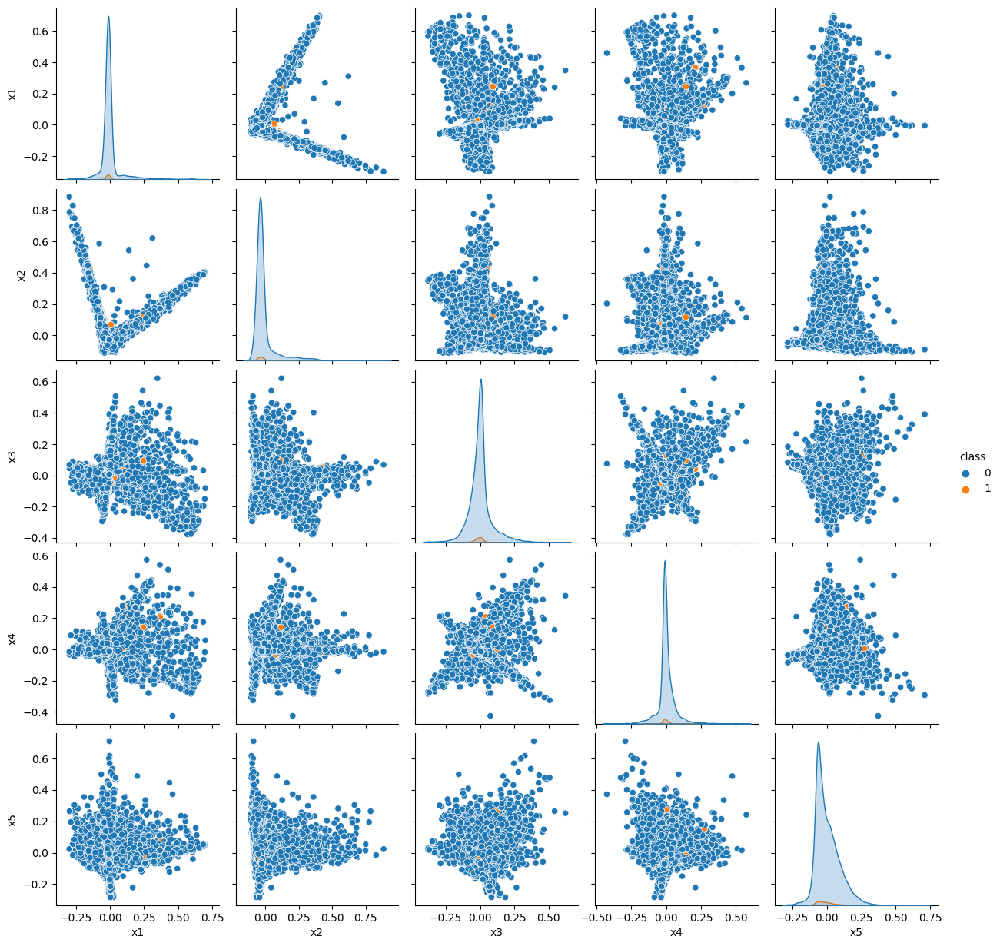

In [ ]:
sns.pairplot(df_check, hue="class")

In [ ]:
# 각 열마다 클래스 0 (정상 댓글)에 해당되는 값들의 중앙값
print("<class 0>")
for col in X_train.columns:
  print(f"{col}:", df_check.groupby('class').agg(median=(col, 'median'))['median'][0])
print()
print()

print("<class 1>")
for col in X_train.columns:
  print(f"{col}:", df_check.groupby('class').agg(median=(col, 'median'))['median'][1])

<class 0>
x1: -0.016217486398372526
x2: -0.032277045959863596
x3: -0.0009025551107703348
x4: -0.01075464641315892
x5: -0.019413877227237586


<class 1>
x1: -0.01878933151754518
x2: -0.03123207197103285
x3: -0.005808004257804002
x4: -0.011735234656347791
x5: -0.019763364825860753


In [ ]:
df_check.groupby('class').agg(median=(col, 'median'))

,median
class,
0,-0.019414
1,-0.019763


In [ ]:
# 각 열마다 클래스 0 (정상 댓글)에 해당되는 값들의 median
for col in X_train.columns:
  print(f"{col}:", df_check.groupby('class').agg(median=(col, 'median'))['median'][0])
print()
print()

print("<class 1>")
for col in X_train.columns:
  print(f"{col}:", df_check.groupby('class').agg(median=(col, 'median'))['median'][1])

x1: -0.016217486398372498
x2: -0.032277045959863554
x3: -0.0009025551107703
x4: -0.010754646413158899
x5: -0.01941387722723755


<class 1>
x1: -0.018789331517545152
x2: -0.031232071971032803
x3: -0.00580800425780395
x4: -0.011735234656347751
x5: -0.019763364825860698


In [ ]:
  weight_list_for_novelty = []
  weight_list_for_normal = []

  value_for_weight = 0.5
  value_for_normal = 21

  # 각 열마다 가중치를 구한다 (정상치용)
  for col in df_check.drop("class", axis = 1).describe().columns:
    df_median = df_check.groupby('class').agg(median=(col, 'median'))
    weight = abs(df_median['median'][0] * value_for_normal)
    weight_list_for_normal.append(weight)
    print(f"{col}:",weight)
  print()
  print()

  # 각 열마다 가중치를 구한다 (이상치용)
  for col in df_check.drop("class", axis = 1).describe().columns:
    df_median = df_check.groupby('class').agg(median=(col, 'median'))
    weight = abs(df_median['median'][1] * value_for_weight)
    weight_list_for_novelty.append(weight)
    print(f"{col}:",weight)





x1: 0.34056721436582243
x2: 0.6778179651571347
x3: 0.0189536573261763
x4: 0.22584757467633687
x5: 0.4076914217719886


x1: 0.009394665758772576
x2: 0.015616035985516401
x3: 0.002904002128901975
x4: 0.0058676173281738755
x5: 0.009881682412930349


In [ ]:
  # 이상치에 각 열마다 구한 가중치를 반영
  column_index = df_check.drop("class", axis = 1).describe().columns
  for col in range(len(column_index)):
    df_check[column_index[col]] = np.where(df_check['class'] == 1, df_check[column_index[col]] + weight_list_for_novelty[col], df_check[column_index[col]])

  # 정상치에 각 열마다 구한 가중치를 반영
  column_index = df_check.drop("class", axis = 1).describe().columns
  for col in range(len(column_index)):
    df_check[column_index[col]] = np.where(df_check['class'] == 0, df_check[column_index[col]] + weight_list_for_normal[col], df_check[column_index[col]])

In [ ]:
df_check

,x1,x2,x3,x4,x5,class
7141,0.341196,0.648051,0.028737,0.213837,0.347233,0
12081,0.689897,0.803864,0.047945,0.300092,0.376019,0
7240,0.315257,0.646487,-0.046042,0.296508,0.454072,0
412,0.316211,0.623271,-0.052273,0.265433,0.404488,0
11647,0.343257,0.628196,0.079952,0.175462,0.377402,0
...,...,...,...,...,...,...
13793,0.331569,0.649494,0.019354,0.217475,0.342173,0
8801,0.331798,0.629771,-0.035806,0.268203,0.400560,0
2412,0.333153,0.652805,0.025733,0.208700,0.341544,0
9638,0.576490,0.744320,0.262931,0.565644,0.373584,0


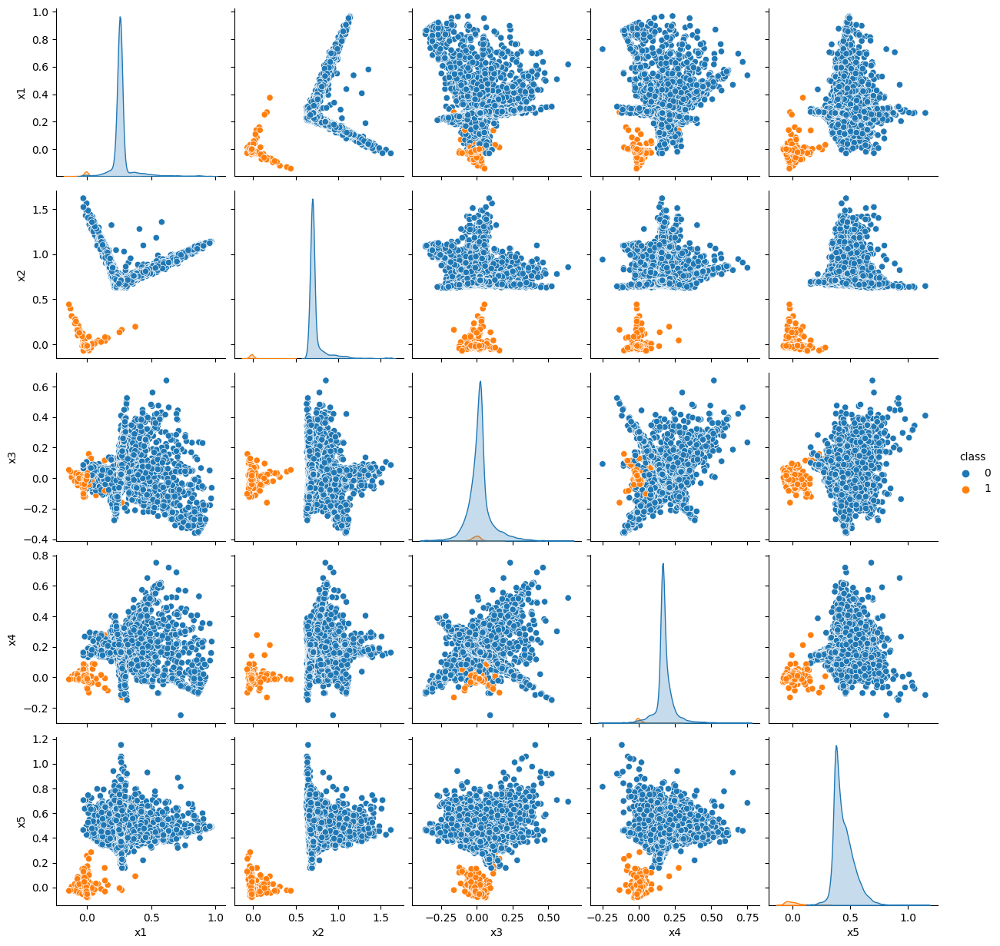

In [ ]:
sns.pairplot(df_check, hue="class")

#### no (설명은 나중에 적을게요 ㅠ)

In [ ]:
X_train

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10
7141,-0.012693,-0.028607,-0.071090,-0.105372,0.047988,0.010057,-0.022445,-0.008244,-0.001951,-0.010620
12081,-0.006859,-0.029971,-0.008035,-0.008766,-0.014887,-0.006310,0.054101,0.111093,0.174944,0.163871
7240,-0.003202,-0.008275,0.001071,0.011006,-0.006492,0.001786,-0.006559,-0.000943,0.003919,-0.001129
412,-0.004335,-0.007913,0.002638,0.011371,-0.006108,0.000605,-0.012243,-0.005438,-0.002419,-0.005165
11647,0.065331,-0.001454,0.001163,0.008934,-0.004865,-0.000203,-0.007827,-0.007426,0.006574,-0.000492
...,...,...,...,...,...,...,...,...,...,...
13793,-0.004268,-0.009628,0.001675,0.011656,-0.007016,0.001622,-0.008070,-0.002054,-0.000011,-0.005477
8801,-0.005957,-0.010297,0.002752,0.006084,-0.005517,0.001610,-0.000893,0.009561,0.010645,0.004128
2412,-0.003060,-0.007673,0.001201,0.010968,-0.006103,0.001865,-0.007371,-0.003167,-0.000022,-0.004888
9638,-0.001083,-0.038070,-0.009942,-0.012480,-0.024040,-0.010676,0.134457,0.275868,-0.208472,-0.007397


In [ ]:
df_check = X_train.copy()
df_check['class'] = y_train
df_check

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,class
7141,-0.012693,-0.028607,-0.071090,-0.105372,0.047988,0.010057,-0.022445,-0.008244,-0.001951,-0.010620,0
12081,-0.006859,-0.029971,-0.008035,-0.008766,-0.014887,-0.006310,0.054101,0.111093,0.174944,0.163871,0
7240,-0.003202,-0.008275,0.001071,0.011006,-0.006492,0.001786,-0.006559,-0.000943,0.003919,-0.001129,0
412,-0.004335,-0.007913,0.002638,0.011371,-0.006108,0.000605,-0.012243,-0.005438,-0.002419,-0.005165,0
11647,0.065331,-0.001454,0.001163,0.008934,-0.004865,-0.000203,-0.007827,-0.007426,0.006574,-0.000492,0
...,...,...,...,...,...,...,...,...,...,...,...
13793,-0.004268,-0.009628,0.001675,0.011656,-0.007016,0.001622,-0.008070,-0.002054,-0.000011,-0.005477,0
8801,-0.005957,-0.010297,0.002752,0.006084,-0.005517,0.001610,-0.000893,0.009561,0.010645,0.004128,0
2412,-0.003060,-0.007673,0.001201,0.010968,-0.006103,0.001865,-0.007371,-0.003167,-0.000022,-0.004888,0
9638,-0.001083,-0.038070,-0.009942,-0.012480,-0.024040,-0.010676,0.134457,0.275868,-0.208472,-0.007397,0


In [ ]:
# 각 열마다 클래스 0 (정상 댓글)에 해당되는 값들의 중앙값
print("<class 0>")
for col in X_train.columns:
  print(f"{col}:", df_check.groupby('class').agg(median=(col, 'median'))['median'][0])
print()
print()

print("<class 1>")
for col in X_train.columns:
  print(f"{col}:", df_check.groupby('class').agg(median=(col, 'median'))['median'][1])

<class 0>
x1: -0.004458802389492462
x2: -0.008199570800214964
x3: 0.0011901660655840437
x4: 0.010855463865775766
x5: -0.006494402709568012
x6: 0.0014580889193211001
x7: -0.007701091282241852
x8: -0.0032129849967754715
x9: -2.1782086312914507e-05
x10: -0.005308995559418984


<class 1>
x1: -0.004135763580287662
x2: -0.00830969801789795
x3: 0.0011174822968055761
x4: 0.011154355460427413
x5: -0.006606900642281997
x6: 0.0016277643391788173
x7: -0.008371722057933503
x8: -0.0034335958436395877
x9: -2.178209014267217e-05
x10: -0.005387278687570979


In [ ]:
# 각 열마다 클래스 0 (정상 댓글)에 해당되는 값들의 평균
print("<class 0>")
for col in X_train.columns:
  print(f"{col}:", df_check.groupby('class').agg(mean=(col, 'mean'))['mean'][0])
print()
print()

print("<class 1>")
for col in X_train.columns:
  print(f"{col}:", df_check.groupby('class').agg(mean=(col, 'mean'))['mean'][1])

<class 0>
x1: 3.7289931794225277e-06
x2: 0.00026140363514937266
x3: 0.00025341474314679734
x4: -0.0002852527454580497
x5: 2.790278090974816e-05
x6: -0.0002535381429470837
x7: 0.00015199999511702458
x8: 3.161481030202931e-05
x9: -0.0002644509891334758
x10: -0.0004309678268068616


<class 1>
x1: -0.004789790514146542
x2: -0.006178469199318375
x3: -0.0009954374300904334
x4: 0.008863265490785551
x5: -0.004518789036826835
x6: 0.0014690054215788788
x7: -0.006029368731860867
x8: -0.0007423002673827932
x9: 0.0015030766344696438
x10: -0.001760594211328556


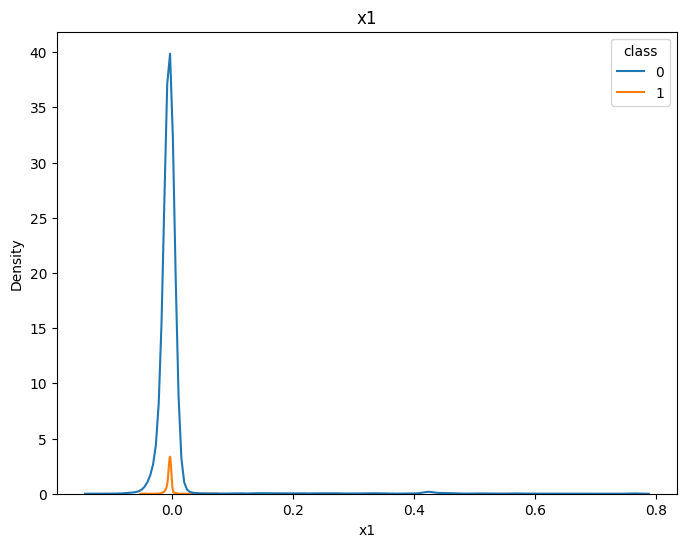

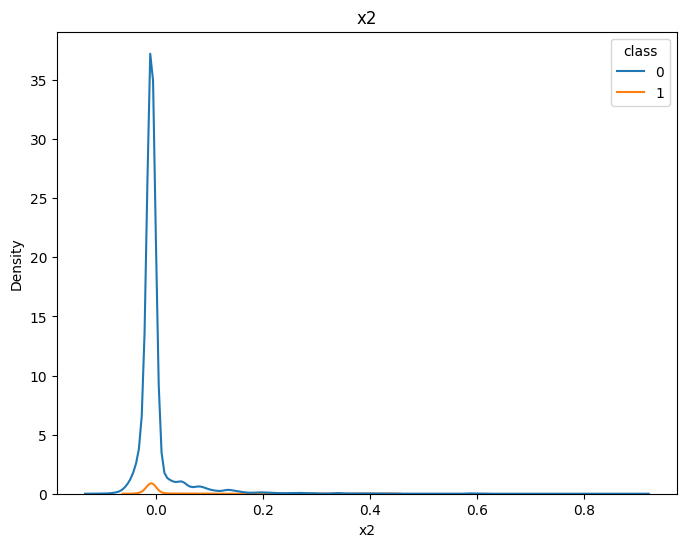

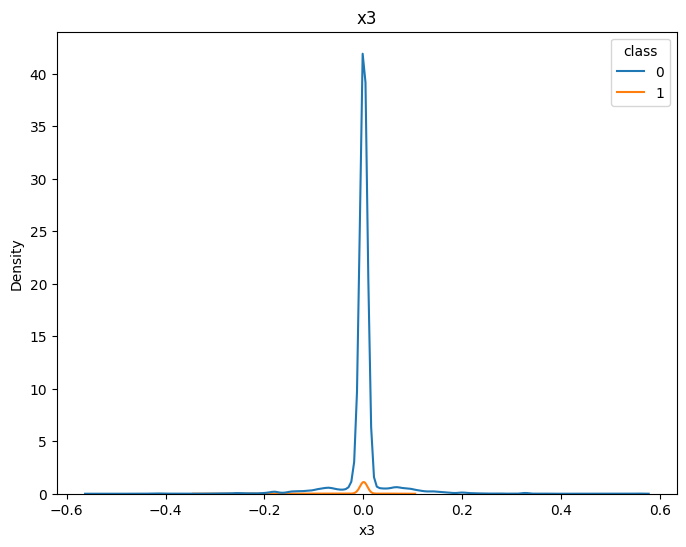

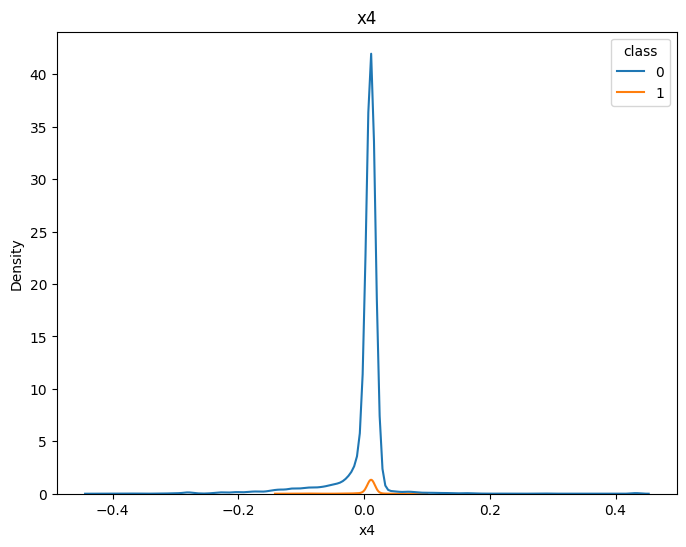

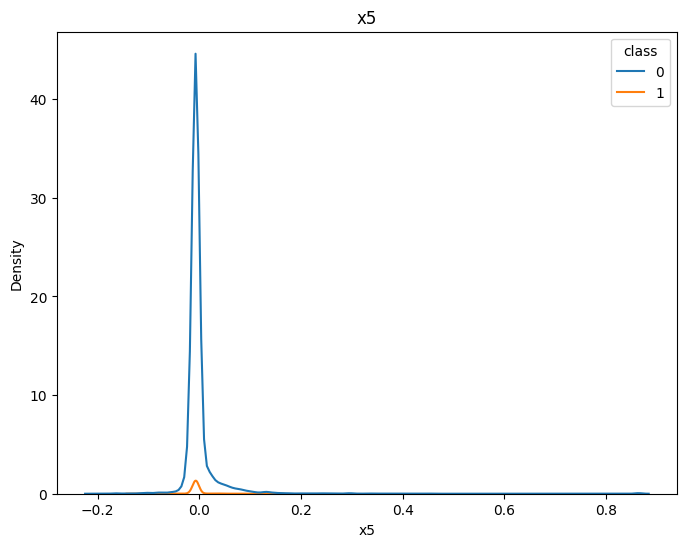

...

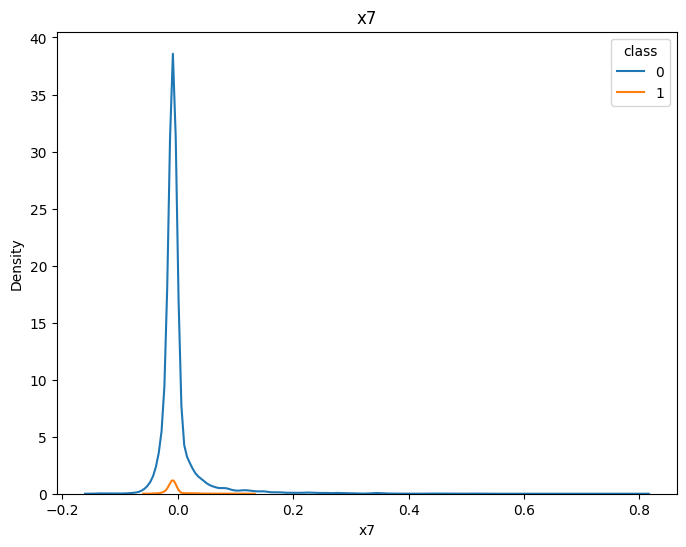

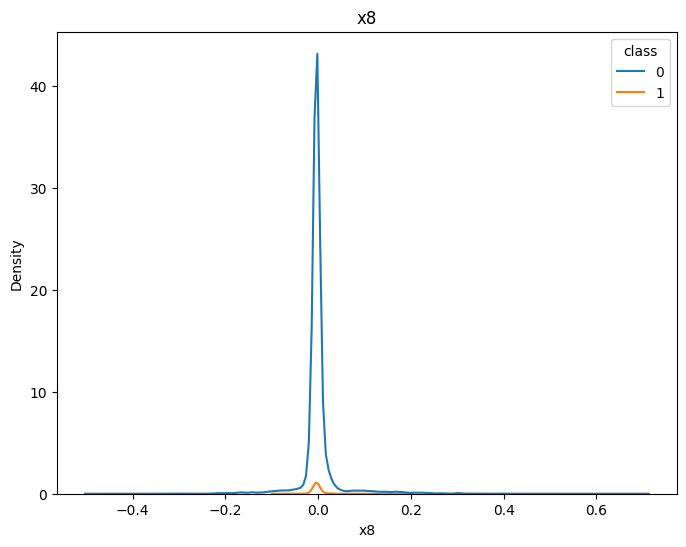

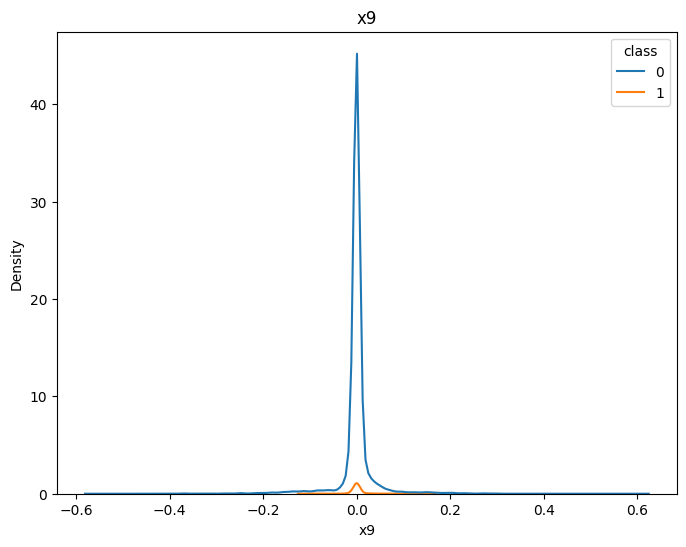

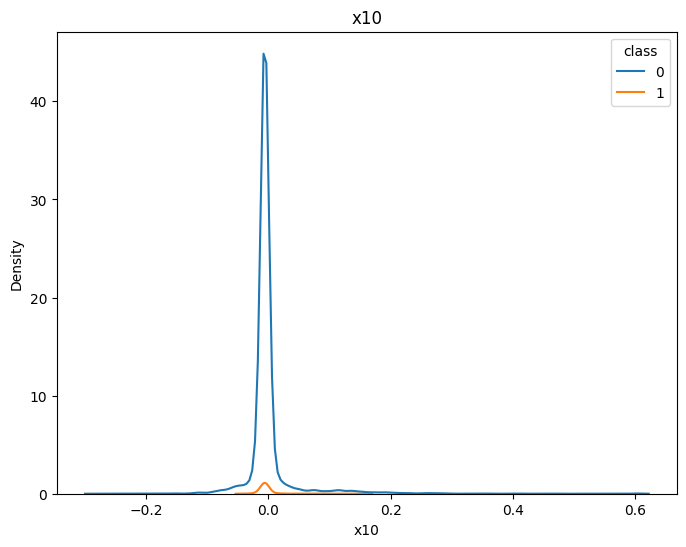

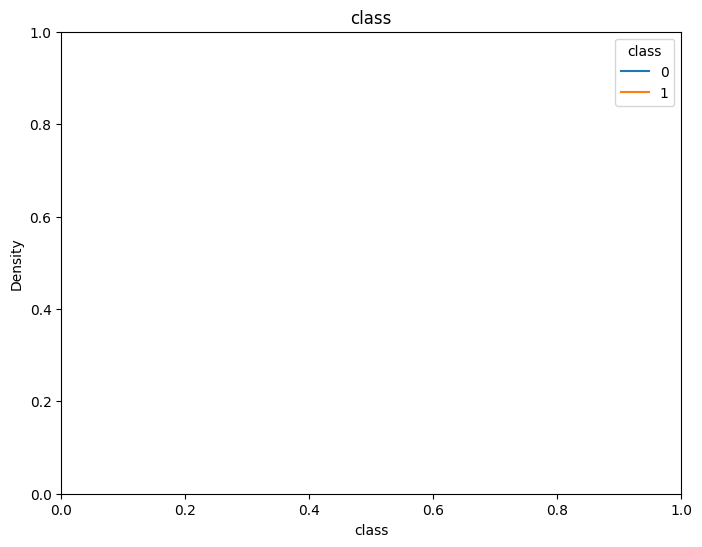

In [ ]:
for col in df_check.columns:
    plt.figure(figsize=(8, 6))
    sns.kdeplot(data=df_check, x=df_check.loc[df_check[col].notnull(), col], hue='class')
    plt.title(col)

In [ ]:
  weight_list_for_novelty = []
  weight_list_for_normal = []

  value_for_weight = 1
  value_for_normal = 5

  # 각 열마다 가중치를 구한다 (이상치용)
  for col in df_check.drop("class", axis = 1).describe().columns:
    df_median = df_check.groupby('class').agg(median=(col, 'median'))
    weight = abs(df_median['median'][1] * value_for_weight)
    weight_list_for_novelty.append(weight)
    print(f"{col}:",weight)

  print()
  print()

  # 각 열마다 가중치를 구한다 (정상치용)
  for col in df_check.drop("class", axis = 1).describe().columns:
    df_median = df_check.groupby('class').agg(median=(col, 'median'))
    weight = abs(df_median['median'][0] * value_for_normal)
    weight_list_for_normal.append(weight)
    print(f"{col}:",weight)


x1: 0.014164034821734485
x2: 0.005455086005727134
x3: 0.21969607173072198
x4: 0.02274350707314645
x5: 0.02796167520489335
x6: 0.02789751397754609
x7: 0.007406172504744681
x8: 0.03161022531758993
x9: 0.4719933125485093
x10: 0.008448121675676701


x1: 3.7347301680740568
x2: 4.096866590613449
x3: 3.1150301572856853
x4: 4.647273486796389
x5: 3.9710421356934864
x6: 2.316153940502948
x7: 4.140665368922287
x8: 3.5318331165197554
x9: 2.406462964193639
x10: 4.072796508167765


In [ ]:
  # 이상치에 각 열마다 구한 가중치를 반영
  column_index = df_check.drop("class", axis = 1).describe().columns
  for col in range(len(column_index)):
    df_check[column_index[col]] = np.where(df_check['class'] == 1, df_check[column_index[col]] + weight_list_for_novelty[col], df_check[column_index[col]])

  # 정상치에 각 열마다 구한 가중치를 반영
  column_index = df_check.drop("class", axis = 1).describe().columns
  for col in range(len(column_index)):
    df_check[column_index[col]] = np.where(df_check['class'] == 0, df_check[column_index[col]] + weight_list_for_normal[col], df_check[column_index[col]])

In [ ]:
df_check

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,class
7141,2.216709,4.071179,0.523993,5.322360,3.295189,0.739101,3.828101,1.598249,0.008940,2.643878,0
12081,2.222542,4.069815,0.587048,5.418966,3.232314,0.722735,3.904646,1.717586,0.185836,2.818369,0
7240,2.226199,4.091510,0.596154,5.438737,3.240709,0.730830,3.843987,1.605549,0.014810,2.653368,0
412,2.225066,4.091872,0.597721,5.439102,3.241093,0.729650,3.838302,1.601055,0.008472,2.649332,0
11647,2.294733,4.098332,0.596246,5.436666,3.242336,0.728841,3.842719,1.599066,0.017465,2.654005,0
...,...,...,...,...,...,...,...,...,...,...,...
13793,2.225133,4.090157,0.596758,5.439388,3.240185,0.730666,3.842475,1.604438,0.010880,2.649021,0
8801,2.223445,4.089489,0.597835,5.433815,3.241684,0.730655,3.849653,1.616054,0.021536,2.658626,0
2412,2.226342,4.092112,0.596284,5.438700,3.241099,0.730910,3.843175,1.603325,0.010869,2.649610,0
9638,2.228318,4.061716,0.585141,5.415252,3.223162,0.718369,3.985003,1.882360,-0.197581,2.647101,0


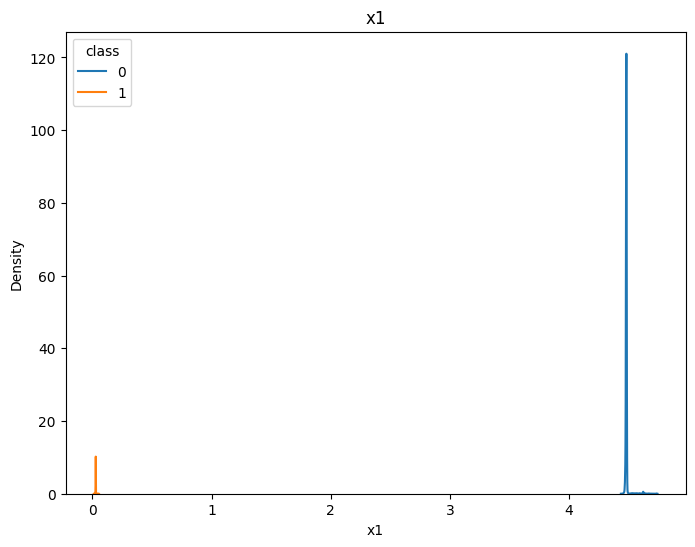

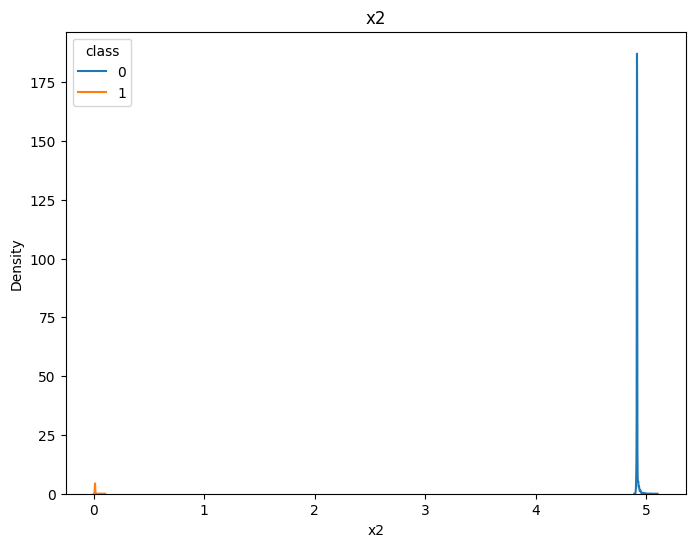

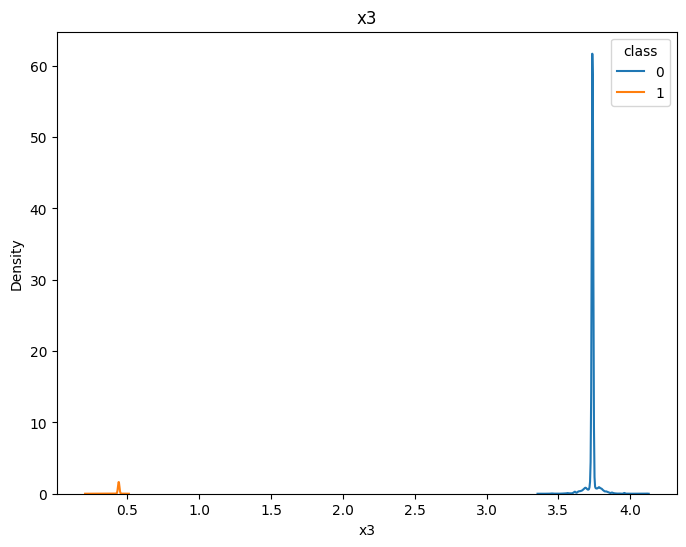

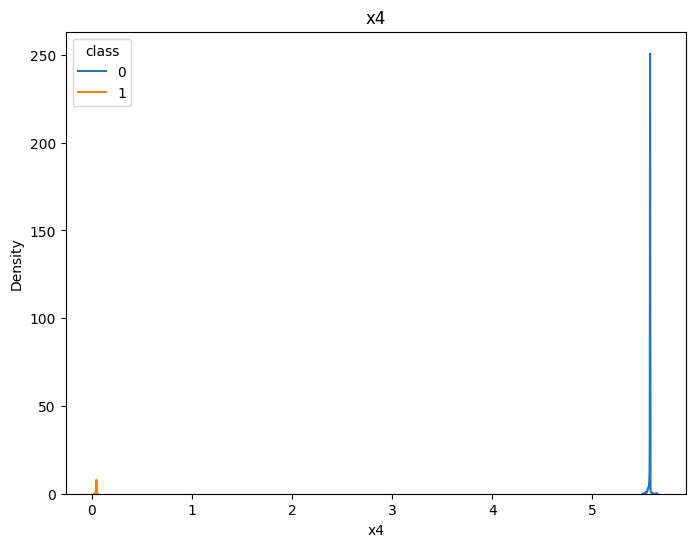

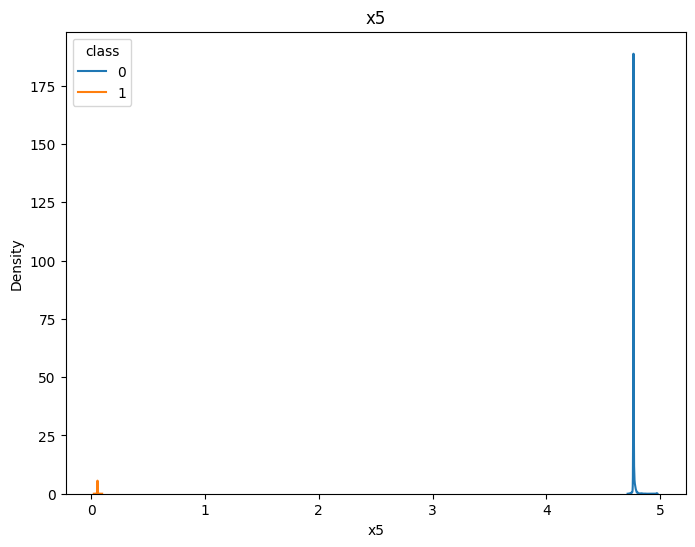

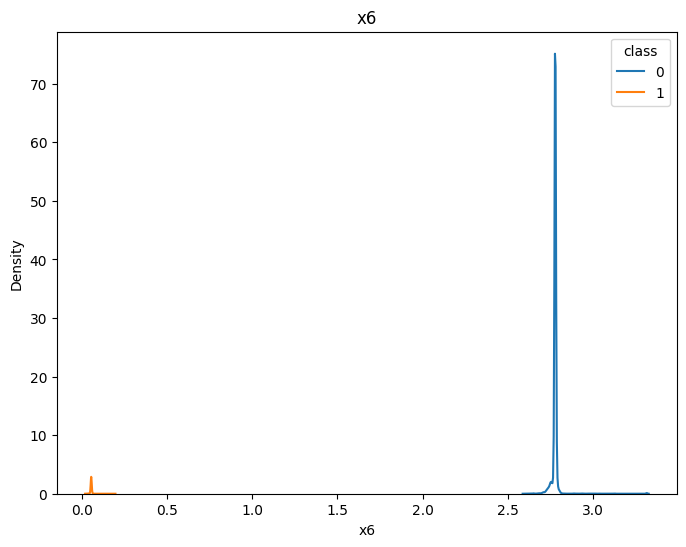

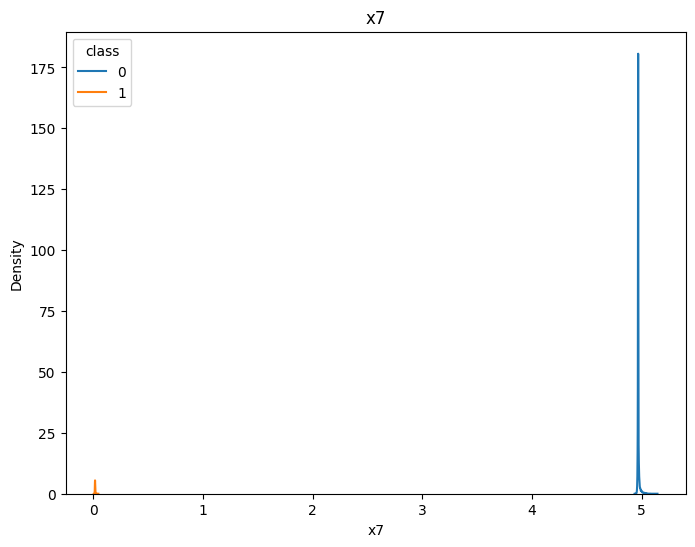

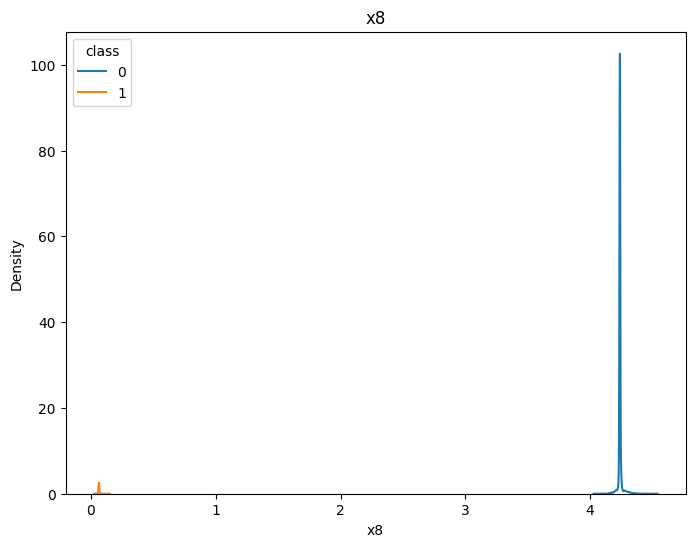

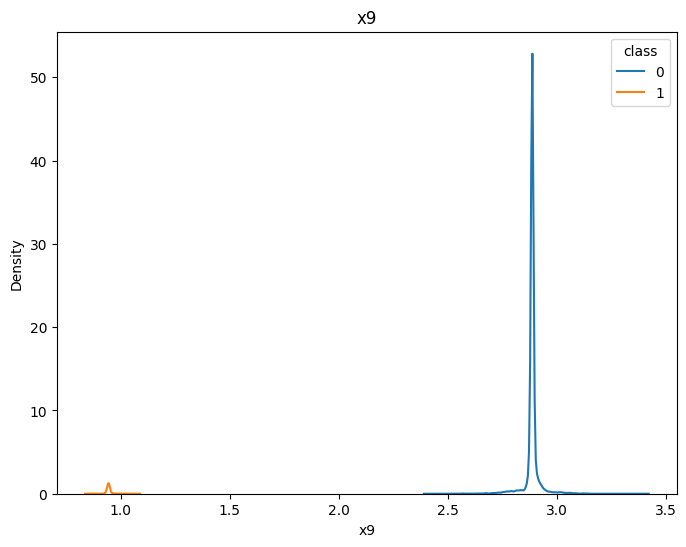

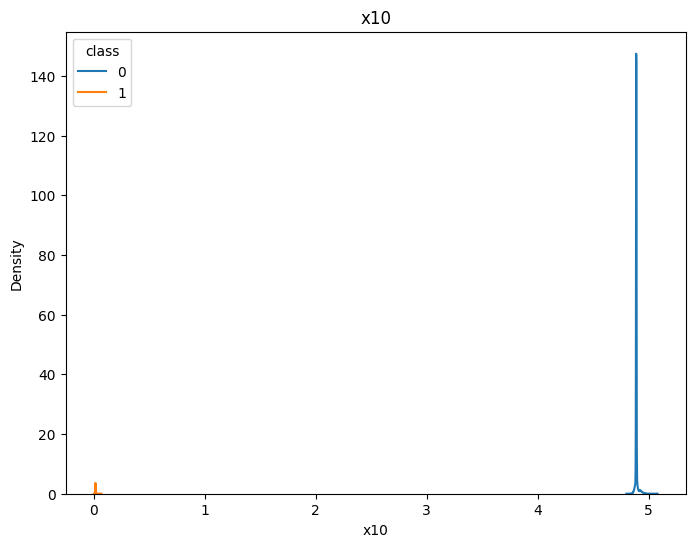

In [ ]:
for col in df_check.drop('class', axis = 1).columns:
    plt.figure(figsize=(8, 6))
    sns.kdeplot(data=df_check, x=df_check.loc[df_check[col].notnull(), col], hue='class')
    plt.title(col)

In [ ]:
# min_max_normalization 함수
def min_max_normalization(x):
    min_val = x.min()
    max_val = x.max()
    normalized_x = (x - min_val) / (max_val - min_val)
    return normalized_x

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

from sklearn.preprocessing import MinMaxScaler
#scaler = MinMaxScaler()

In [ ]:
df_check["class"].value_counts()

0    12862
1      298
Name: class, dtype: int64

In [ ]:
df_check = pd.DataFrame(scaler.fit_transform(df_check))
df_check.columns = ['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'class']
df_check["class"] = np.where(df_check["class"] < 0 , 0, 1)
df_check


,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,class
0,0.112514,0.104537,-0.580661,0.021547,0.250522,0.230598,0.112444,0.115862,-0.037251,0.125764,0
1,0.129878,0.102307,0.052079,0.141450,0.120819,0.089476,0.245791,0.608928,4.413292,0.566164,0
2,0.140762,0.137784,0.143458,0.165989,0.138137,0.159281,0.140119,0.146027,0.110436,0.149716,0
3,0.137390,0.138376,0.159184,0.166442,0.138929,0.149100,0.130216,0.127456,-0.049016,0.139530,0
4,0.344747,0.148939,0.144374,0.163418,0.141493,0.142129,0.137909,0.119241,0.177225,0.151324,0
...,...,...,...,...,...,...,...,...,...,...,...
13155,0.137590,0.135572,0.149517,0.166796,0.137056,0.157865,0.137486,0.141436,0.011558,0.138744,0
13156,0.132564,0.134479,0.160325,0.159880,0.140149,0.157765,0.149989,0.189427,0.279669,0.162985,0
13157,0.141186,0.138769,0.144759,0.165942,0.138940,0.159966,0.138704,0.136838,0.011291,0.140230,0
13158,0.147069,0.089062,0.032938,0.136840,0.101939,0.051830,0.385777,1.289725,-5.233140,0.133897,0


In [ ]:
df_check["class"].value_counts()

0    12862
1      298
Name: class, dtype: int64

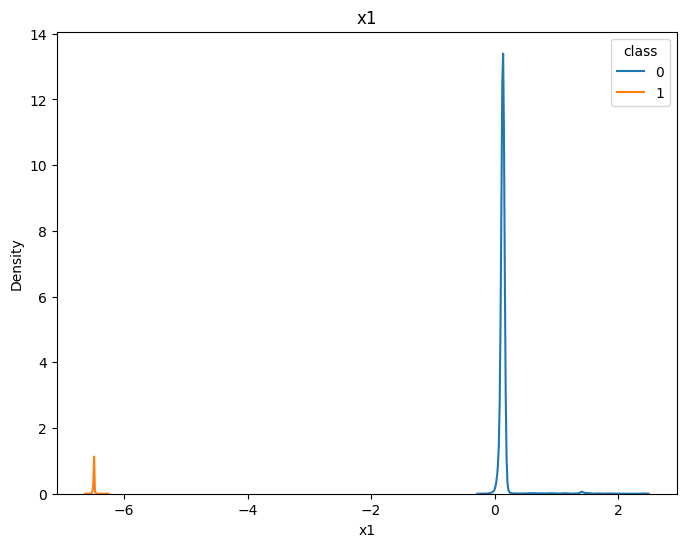

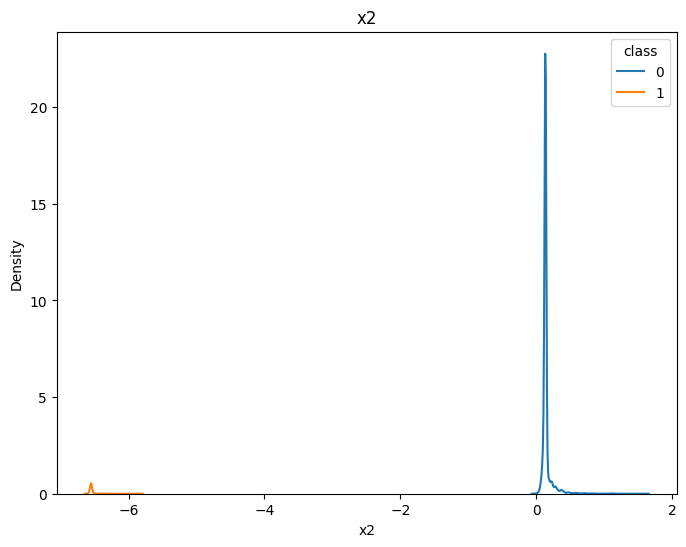

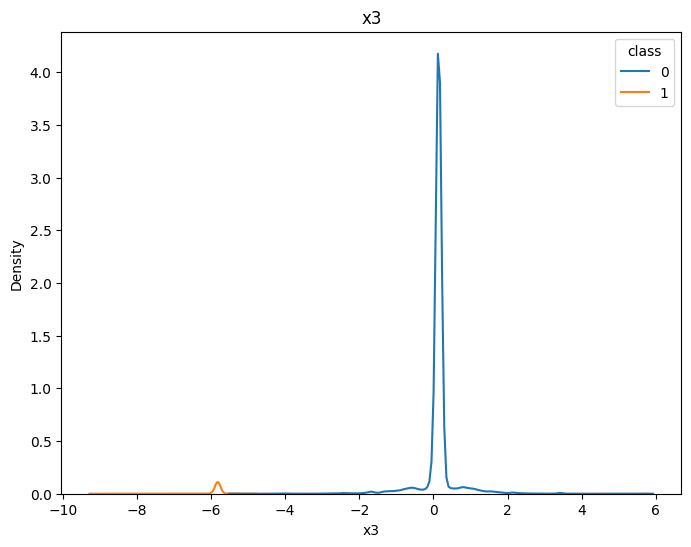

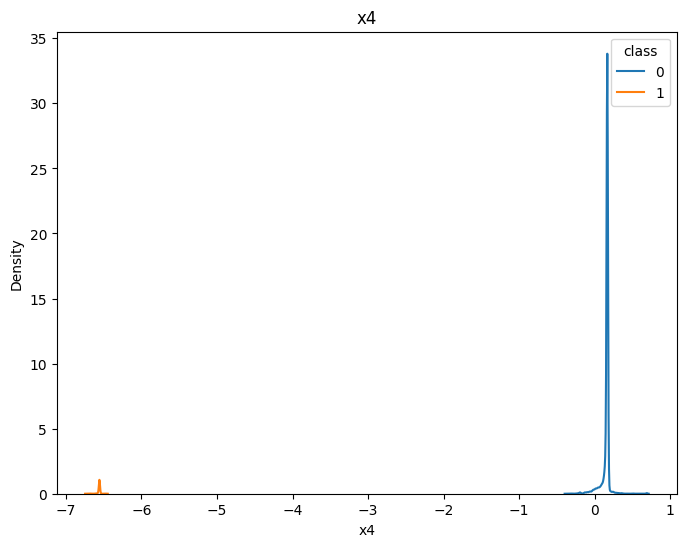

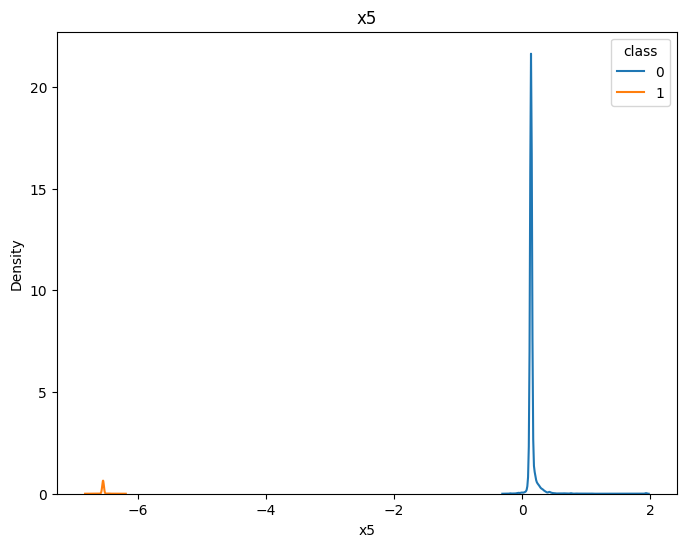

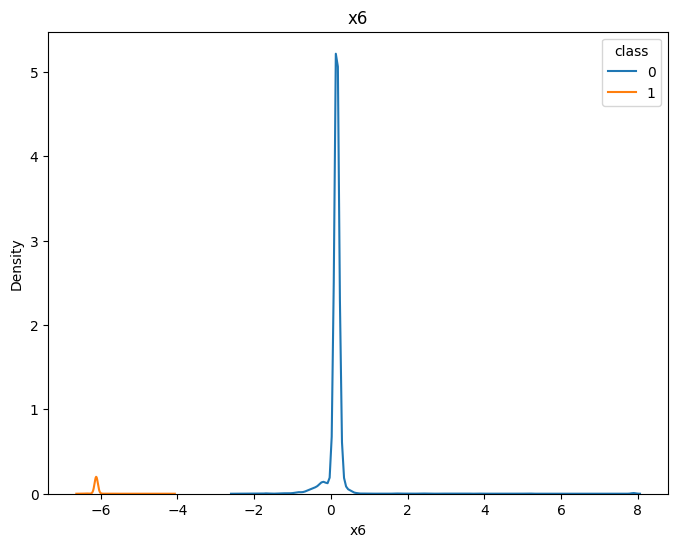

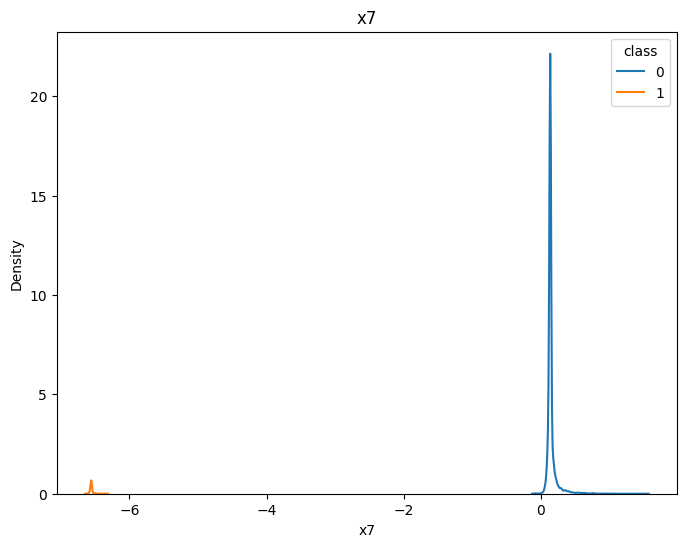

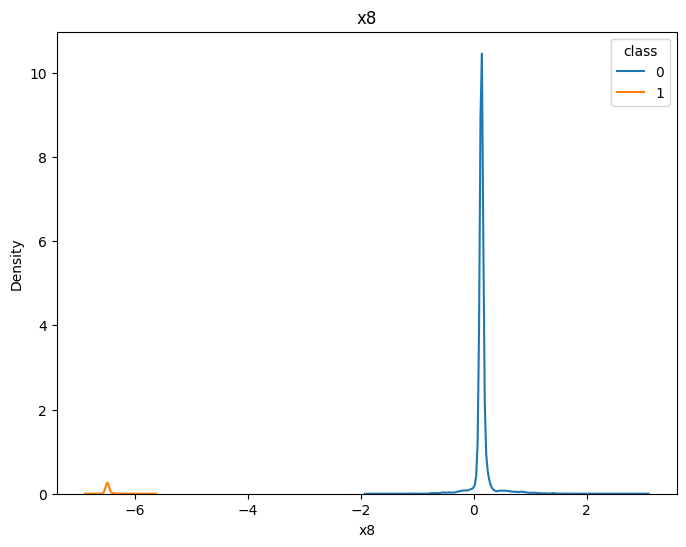

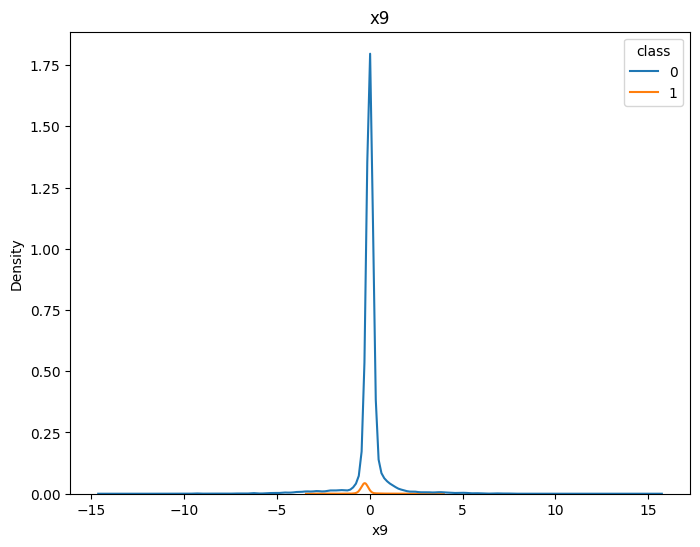

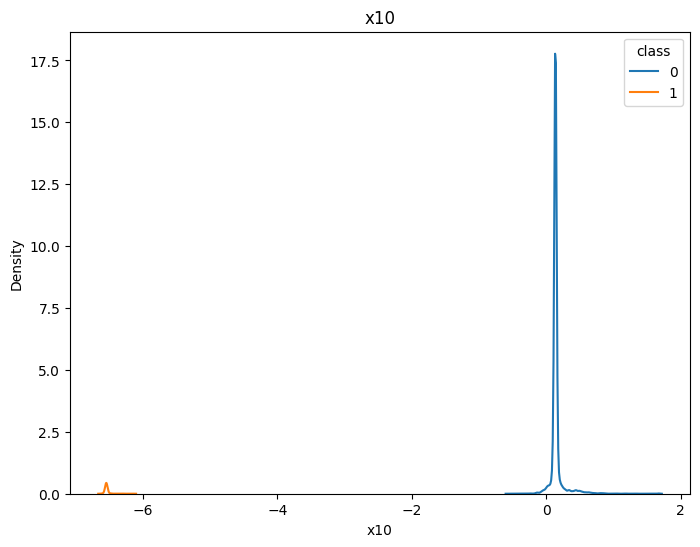

In [ ]:
for col in df_check.drop('class', axis = 1).columns:
    plt.figure(figsize=(8, 6))
    sns.kdeplot(data=df_check, x=df_check.loc[df_check[col].notnull(), col], hue='class')
    plt.title(col)

In [ ]:
for col in X_train.columns:
    df_check[col] = min_max_normalization(df_check[col])

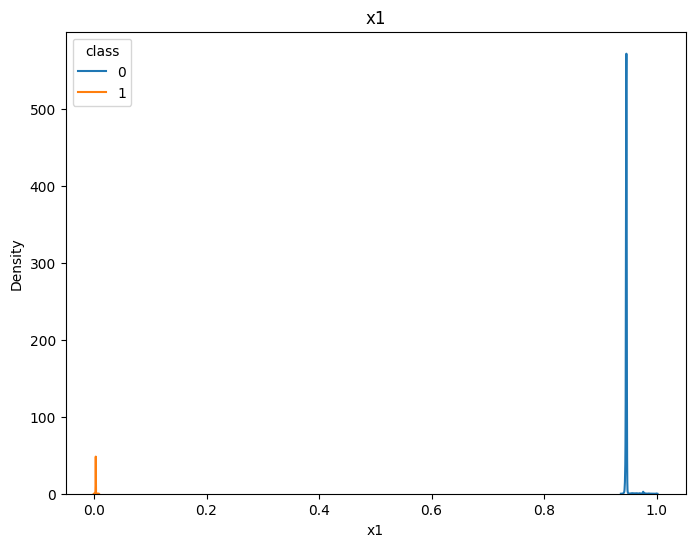

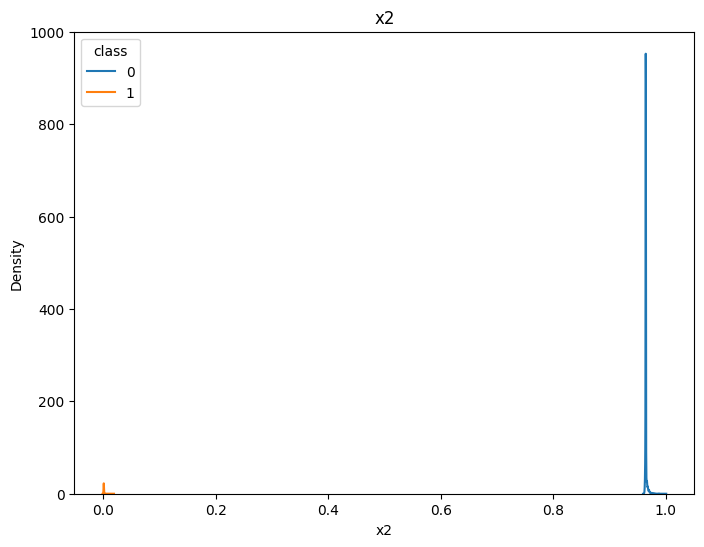

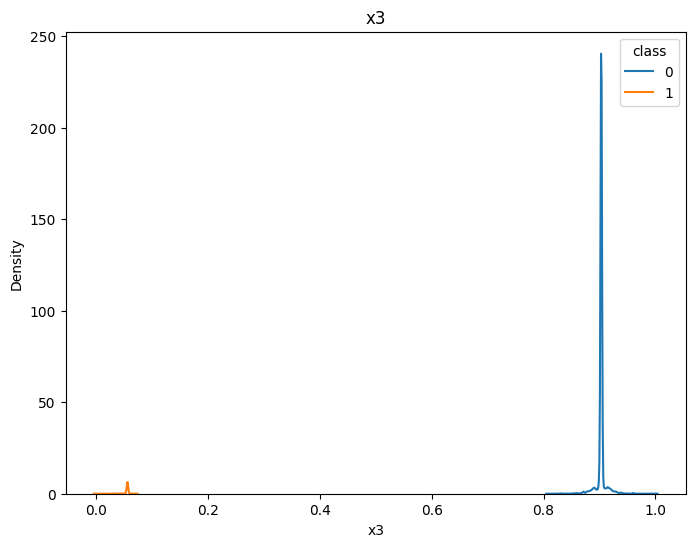

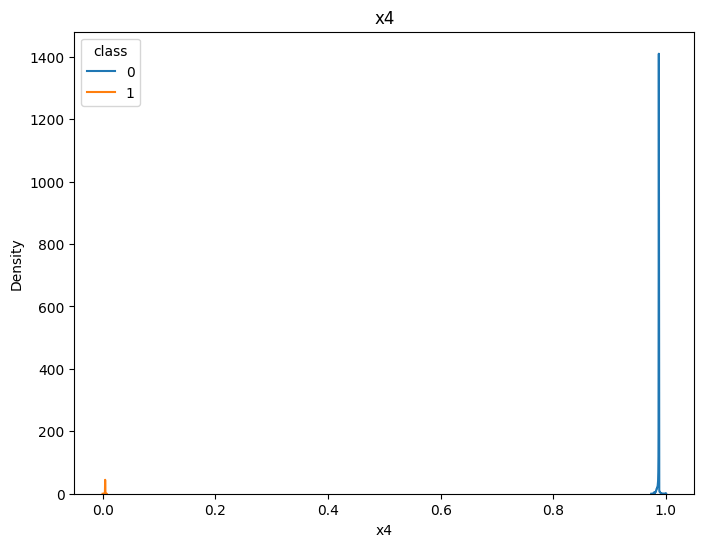

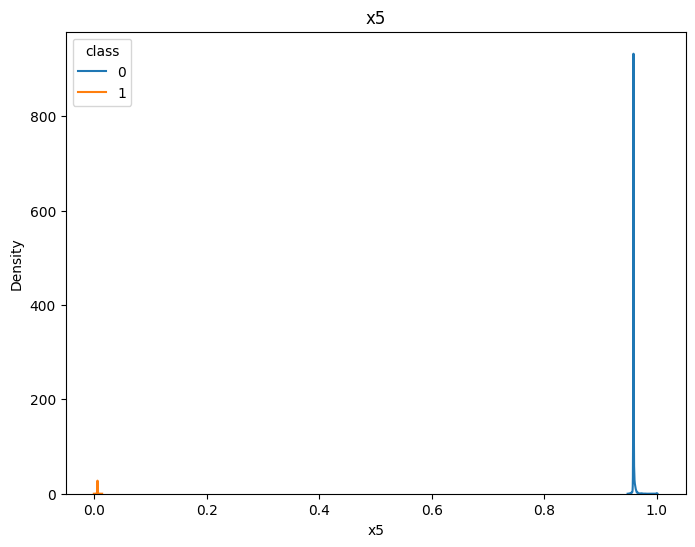

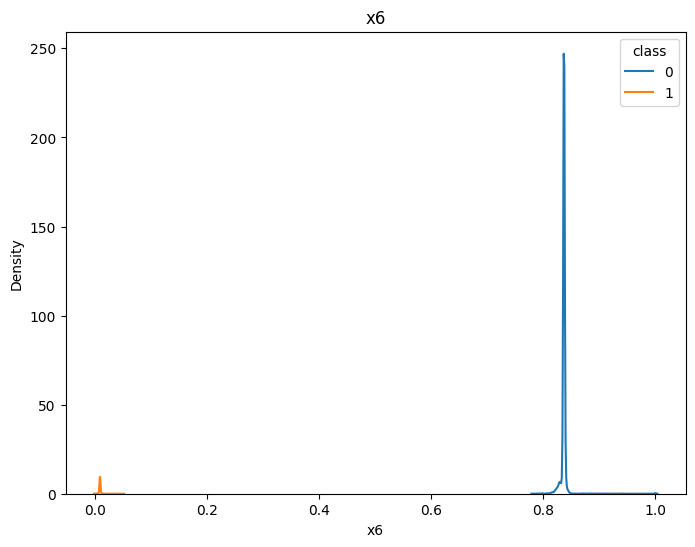

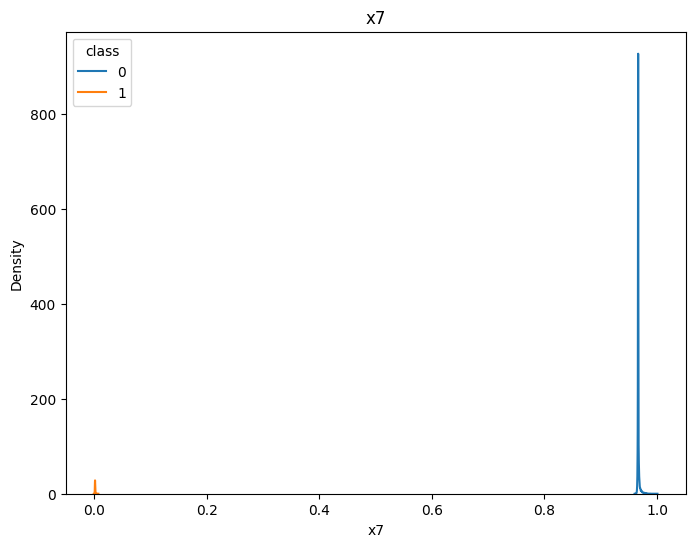

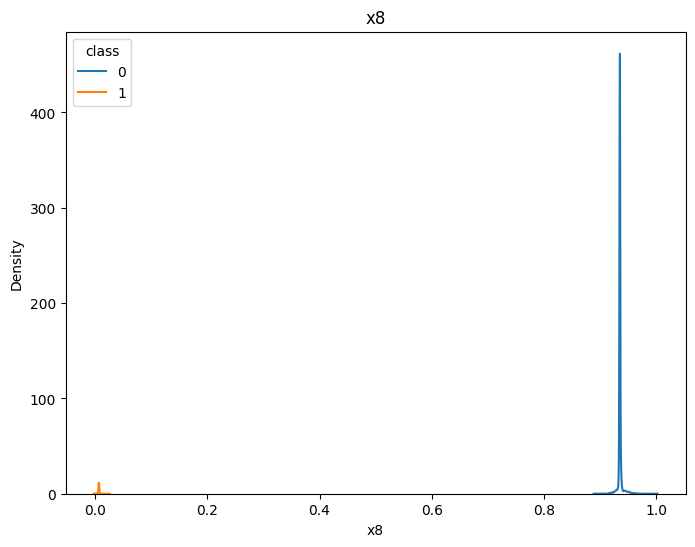

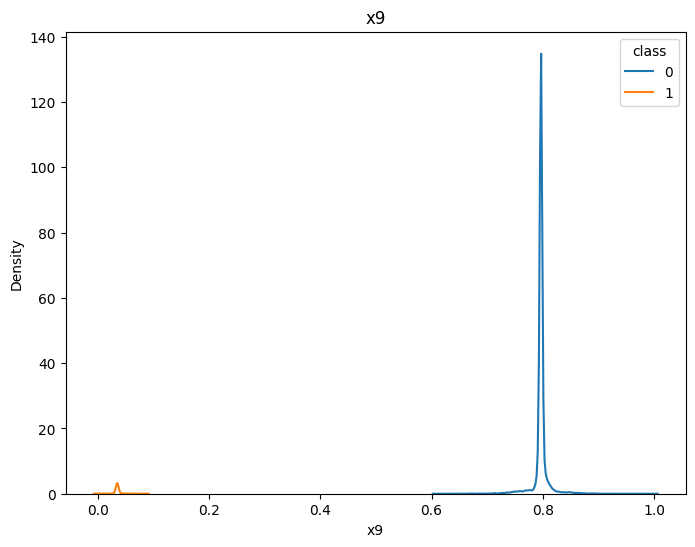

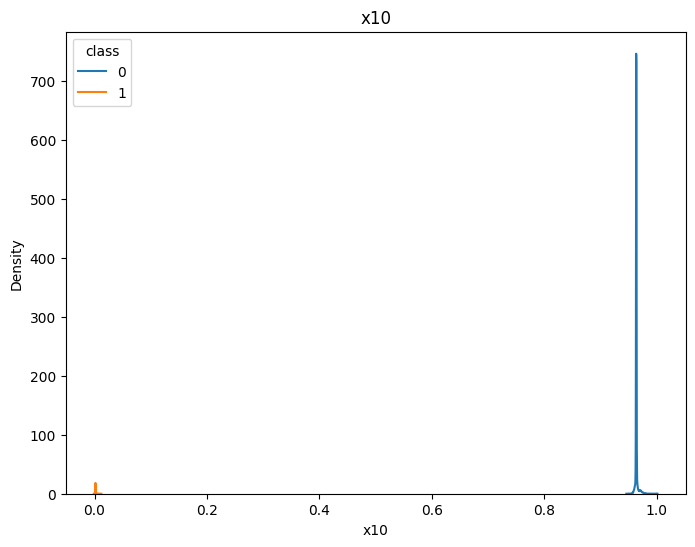

In [ ]:
for col in df_check.drop('class', axis = 1).columns:
    plt.figure(figsize=(8, 6))
    sns.kdeplot(data=df_check, x=df_check.loc[df_check[col].notnull(), col], hue='class')
    plt.title(col)

In [ ]:
df_check

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,class
0,0.744234,0.815314,0.573933,0.909998,0.807090,0.468378,0.824984,0.704249,0.479642,0.812943,0
1,0.746156,0.815043,0.616743,0.926170,0.792224,0.458581,0.841332,0.754474,0.630986,0.866038,0
2,0.747360,0.819358,0.622925,0.929480,0.794209,0.463427,0.828377,0.707322,0.484664,0.815831,0
3,0.746987,0.819430,0.623989,0.929541,0.794300,0.462720,0.827163,0.705430,0.479242,0.814603,0
4,0.769931,0.820715,0.622987,0.929133,0.794594,0.462236,0.828106,0.704593,0.486935,0.816025,0
...,...,...,...,...,...,...,...,...,...,...,...
13155,0.747009,0.819089,0.623335,0.929589,0.794085,0.463329,0.828054,0.706854,0.481302,0.814508,0
13156,0.746453,0.818956,0.624066,0.928656,0.794440,0.463322,0.829587,0.711743,0.490419,0.817431,0
13157,0.747407,0.819478,0.623013,0.929474,0.794301,0.463475,0.828204,0.706386,0.481293,0.814687,0
13158,0.748058,0.813431,0.615448,0.925548,0.790060,0.455968,0.858494,0.823821,0.302951,0.813924,0


In [ ]:
df_test = X_test.copy()
df_test['class'] = y_test
df_test

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,class
0,0.100560,0.122323,0.592913,0.428341,0.174075,0.250983,0.135808,0.542281,0.378364,0.188832,0
1,0.101692,0.101251,0.584195,0.410704,0.164220,0.245103,0.225410,0.732129,0.241945,0.177680,0
2,0.100582,0.122485,0.592889,0.428135,0.174200,0.250979,0.135756,0.542263,0.378280,0.188931,0
3,0.108463,0.110997,0.592602,0.428632,0.168063,0.250114,0.150201,0.555441,0.395010,0.197343,0
4,0.101696,0.122218,0.591602,0.425541,0.175010,0.251128,0.135301,0.542143,0.378234,0.188624,0
...,...,...,...,...,...,...,...,...,...,...,...
4382,0.099771,0.122663,0.592130,0.429017,0.174649,0.250817,0.134819,0.542967,0.378365,0.189459,0
4383,0.100648,0.122689,0.592875,0.427920,0.174318,0.250976,0.135912,0.542278,0.378295,0.189083,0
4384,0.098509,0.120236,0.593486,0.429056,0.173545,0.251176,0.133800,0.542309,0.379830,0.183410,0
4385,0.098134,0.129040,0.585715,0.431968,0.170888,0.251405,0.130770,0.541381,0.377479,0.189121,0


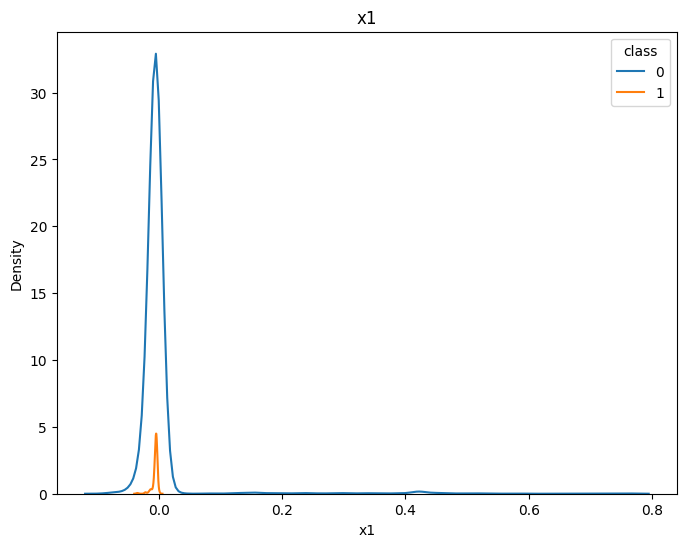

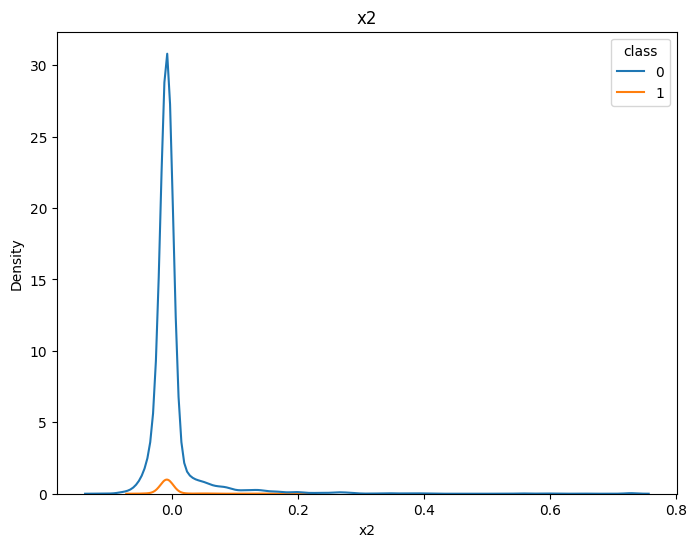

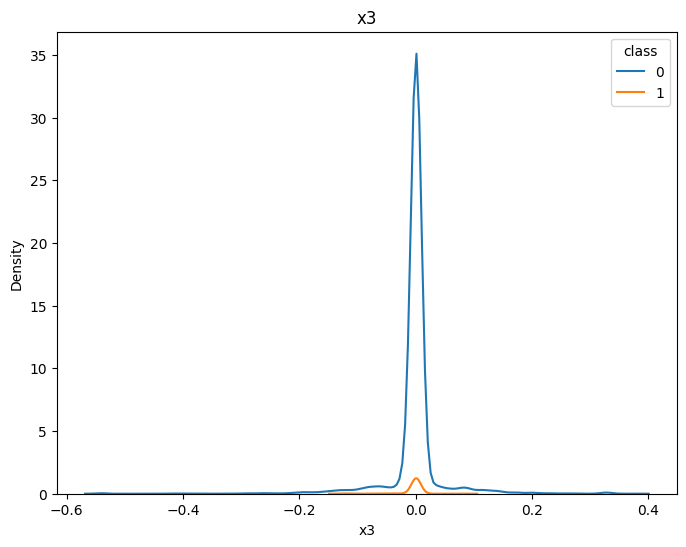

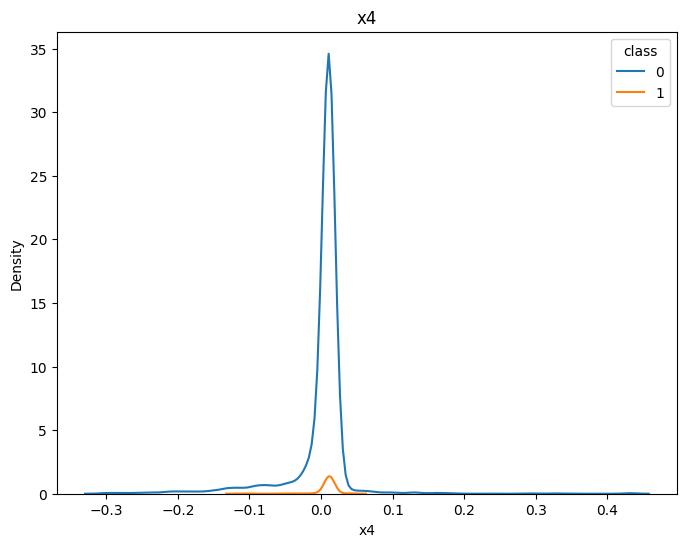

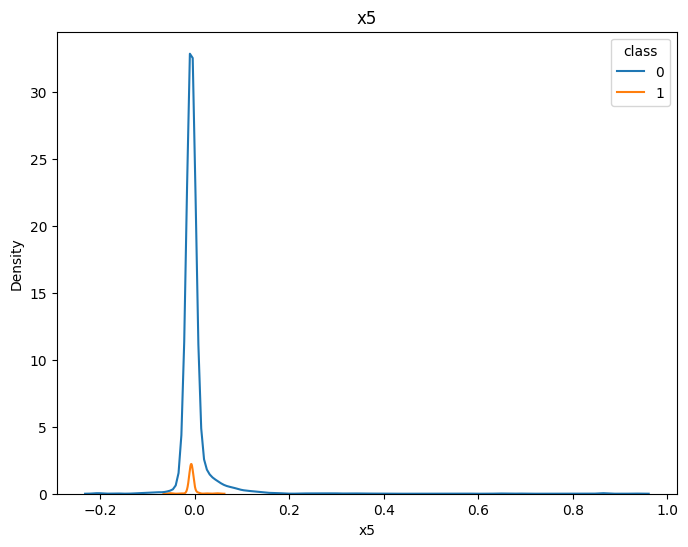

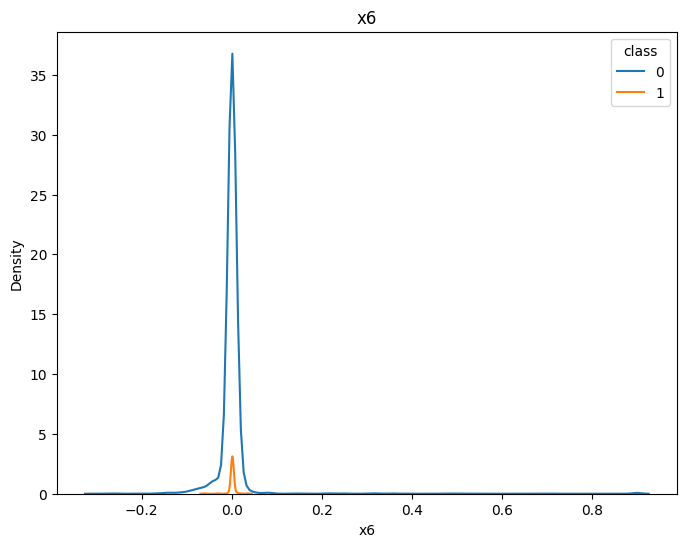

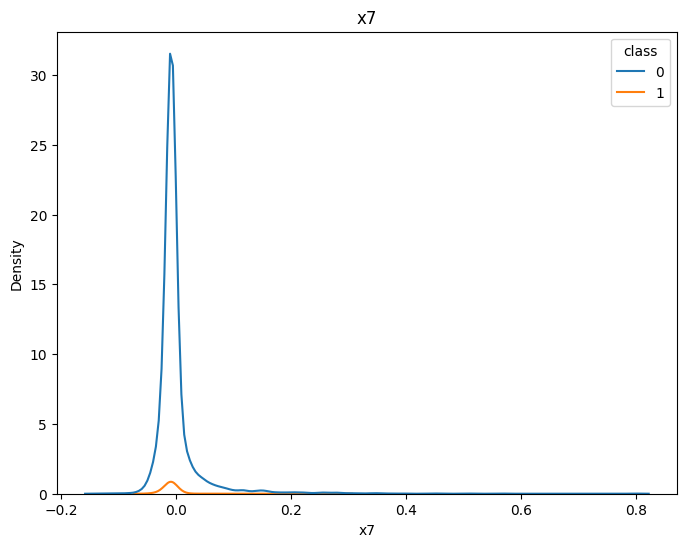

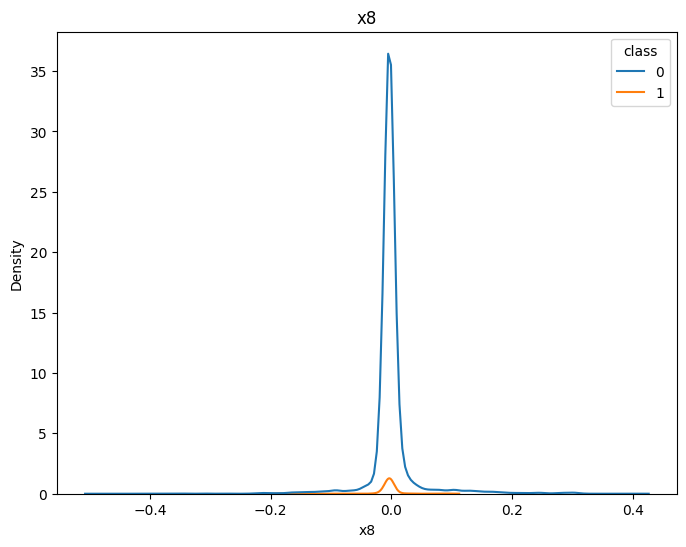

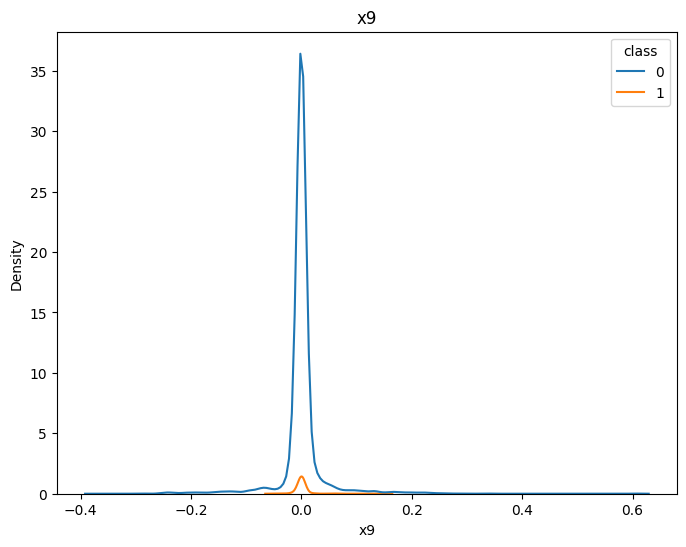

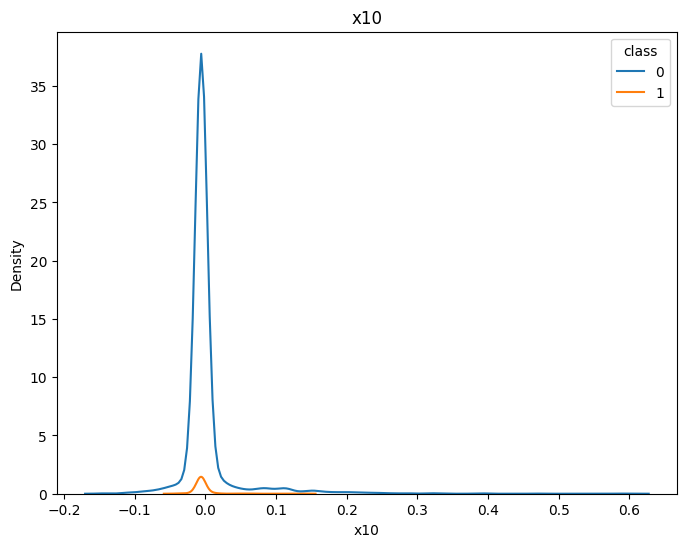

In [ ]:
for col in df_test.drop("class", axis = 1).columns:
    plt.figure(figsize=(8, 6))
    sns.kdeplot(data=df_test, x=df_test[col], hue = "class")
    plt.title(col)

In [ ]:
df_test = pd.DataFrame(scaler.fit_transform(df_test))
df_test.columns = ['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'class']
df_test

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,class
0,-0.064509,-0.154475,0.041084,0.246509,-0.139301,0.026322,-0.173567,-0.076807,-0.015478,-0.158437,-0.167699
1,-0.046451,-0.512271,-0.130652,-0.043406,-0.375858,-0.124283,1.774562,4.066278,-3.295727,-0.363881,-0.167699
2,-0.064152,-0.151719,0.040618,0.243121,-0.136292,0.026218,-0.174694,-0.077187,-0.017516,-0.156618,-0.167699
3,0.061522,-0.346792,0.034964,0.251295,-0.283621,0.004079,0.139377,0.210398,0.384763,-0.001654,-0.167699
4,-0.046390,-0.156253,0.015272,0.200484,-0.116859,0.030036,-0.184575,-0.079808,-0.018617,-0.162274,-0.167699
...,...,...,...,...,...,...,...,...,...,...,...
4382,-0.077081,-0.148692,0.025660,0.257623,-0.125506,0.022092,-0.195058,-0.061842,-0.015469,-0.146896,-0.167699
4383,-0.063093,-0.148263,0.040343,0.239580,-0.133453,0.026159,-0.171305,-0.076873,-0.017137,-0.153828,-0.167699
4384,-0.097204,-0.189906,0.052371,0.258256,-0.152019,0.031269,-0.217219,-0.076203,0.019764,-0.258328,-0.167699
4385,-0.103194,-0.040424,-0.100705,0.306125,-0.215787,0.037131,-0.283102,-0.096443,-0.036773,-0.153126,-0.167699


In [ ]:
df_test["class"] = np.where(df_test["class"] < 0 , 0, 1)
df_test

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,class
0,-0.064509,-0.154475,0.041084,0.246509,-0.139301,0.026322,-0.173567,-0.076807,-0.015478,-0.158437,0
1,-0.046451,-0.512271,-0.130652,-0.043406,-0.375858,-0.124283,1.774562,4.066278,-3.295727,-0.363881,0
2,-0.064152,-0.151719,0.040618,0.243121,-0.136292,0.026218,-0.174694,-0.077187,-0.017516,-0.156618,0
3,0.061522,-0.346792,0.034964,0.251295,-0.283621,0.004079,0.139377,0.210398,0.384763,-0.001654,0
4,-0.046390,-0.156253,0.015272,0.200484,-0.116859,0.030036,-0.184575,-0.079808,-0.018617,-0.162274,0
...,...,...,...,...,...,...,...,...,...,...,...
4382,-0.077081,-0.148692,0.025660,0.257623,-0.125506,0.022092,-0.195058,-0.061842,-0.015469,-0.146896,0
4383,-0.063093,-0.148263,0.040343,0.239580,-0.133453,0.026159,-0.171305,-0.076873,-0.017137,-0.153828,0
4384,-0.097204,-0.189906,0.052371,0.258256,-0.152019,0.031269,-0.217219,-0.076203,0.019764,-0.258328,0
4385,-0.103194,-0.040424,-0.100705,0.306125,-0.215787,0.037131,-0.283102,-0.096443,-0.036773,-0.153126,0


In [ ]:
df_test["class"].value_counts()

0    4267
1     120
Name: class, dtype: int64

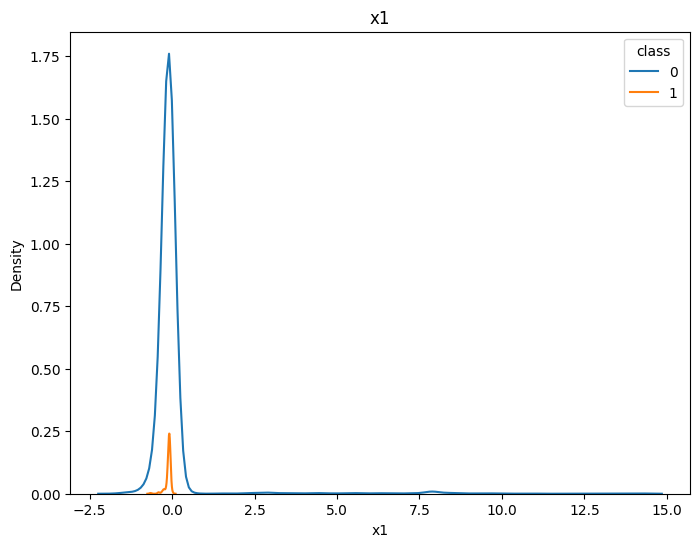

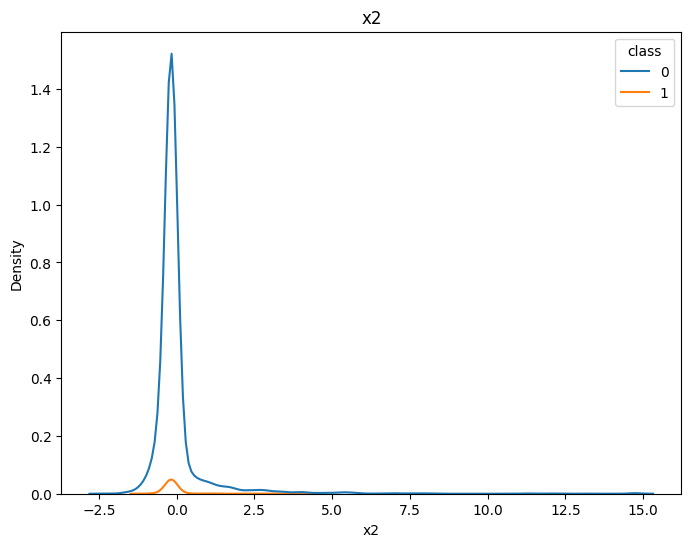

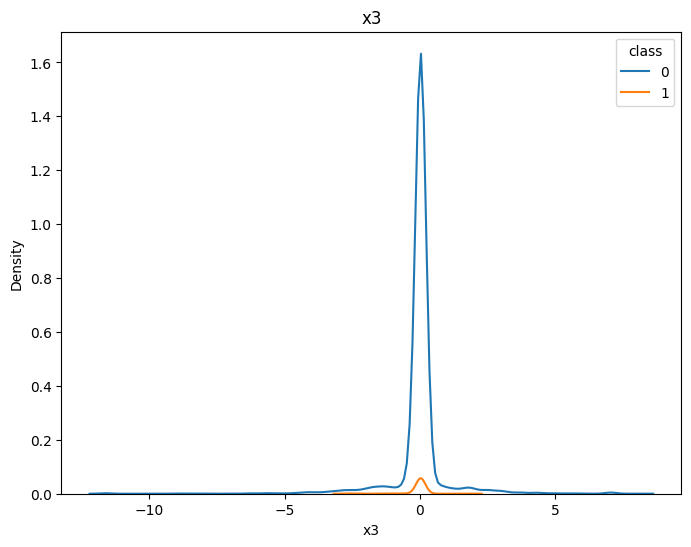

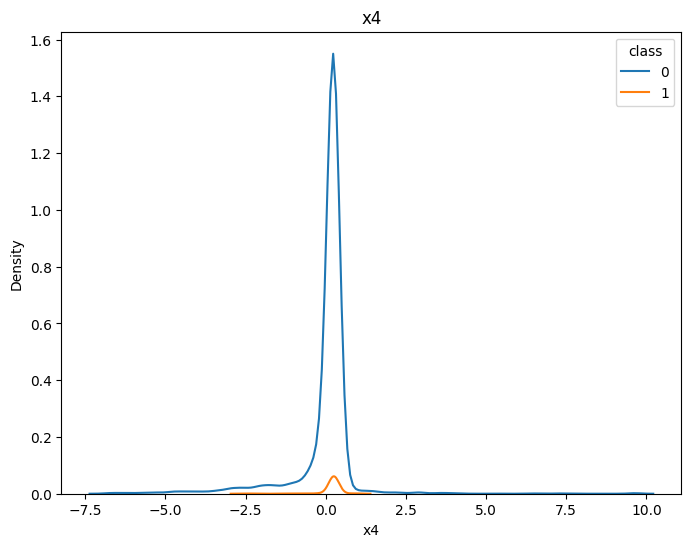

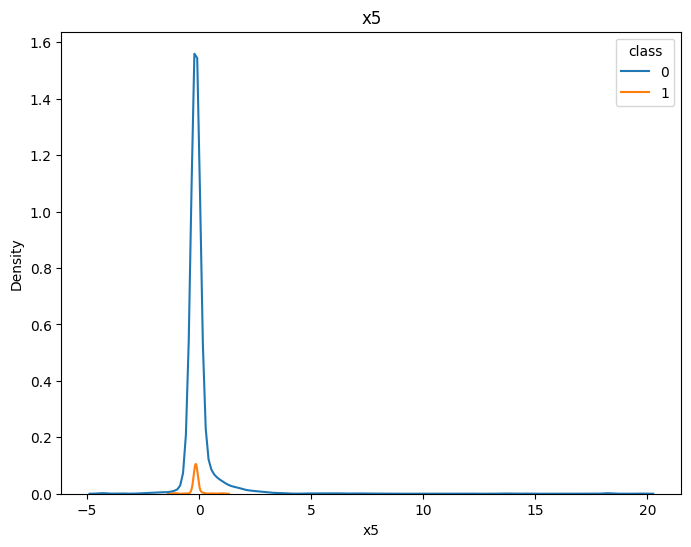

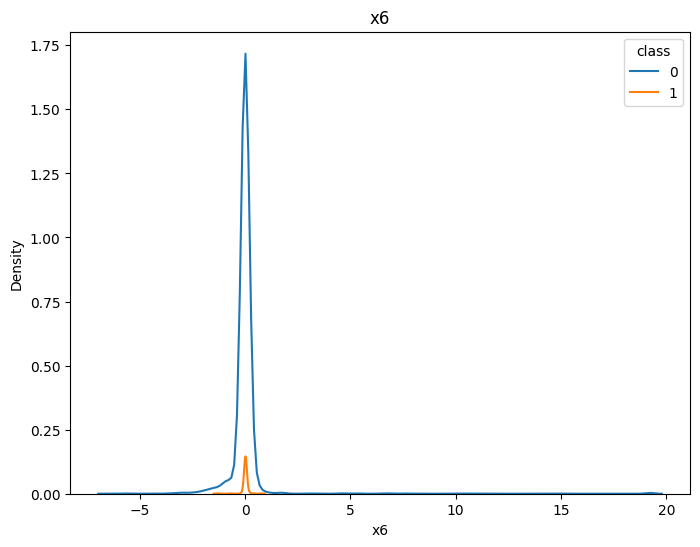

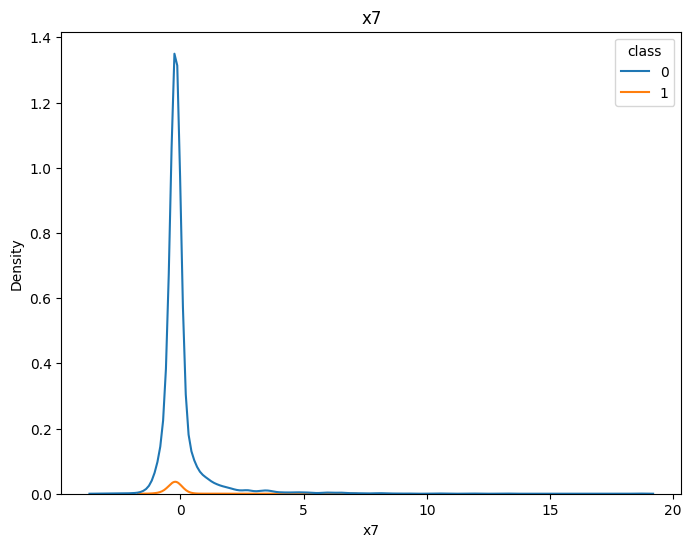

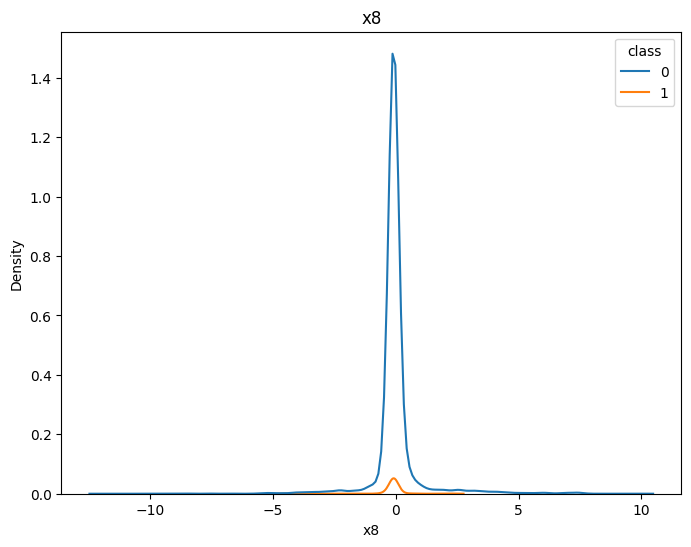

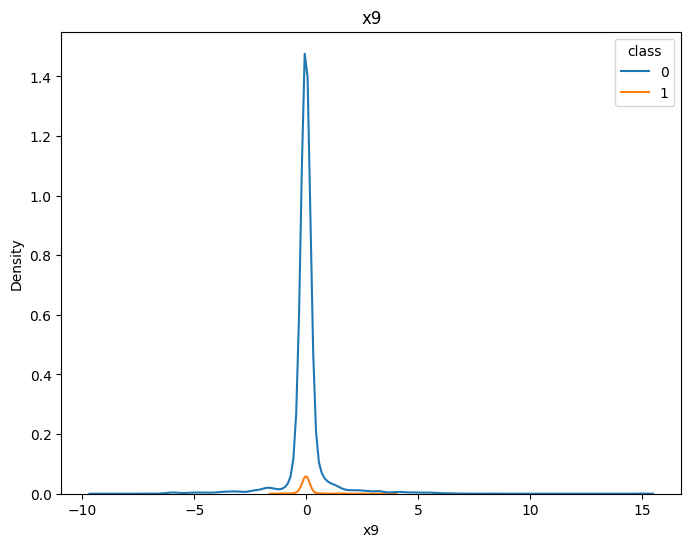

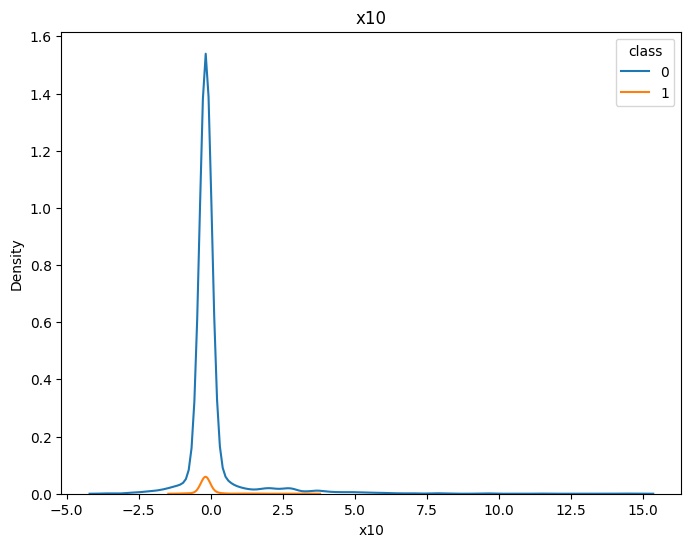

In [ ]:
for col in df_test.drop("class", axis = 1).columns:
    plt.figure(figsize=(8, 6))
    sns.kdeplot(data=df_test, x=df_test[col], hue = "class")
    plt.title(col)

In [ ]:
for col in X_test.columns:
    df_test[col] = min_max_normalization(df_test[col])

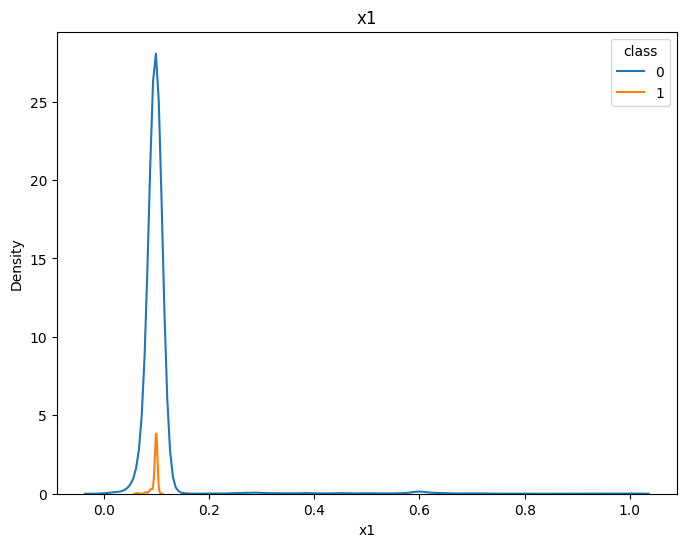

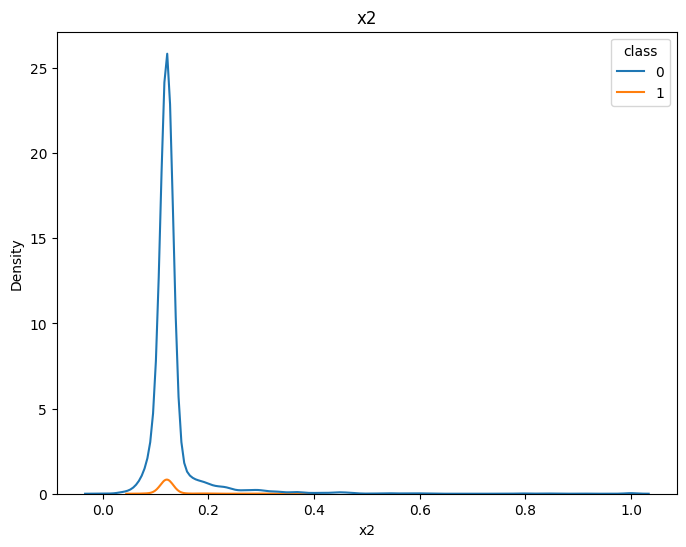

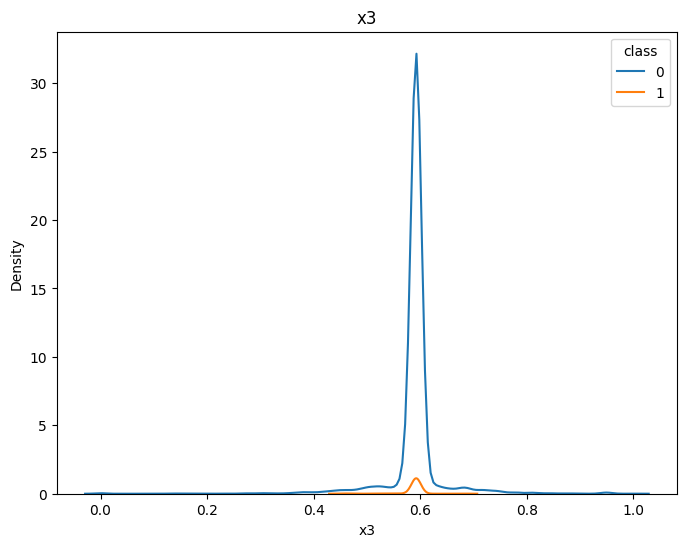

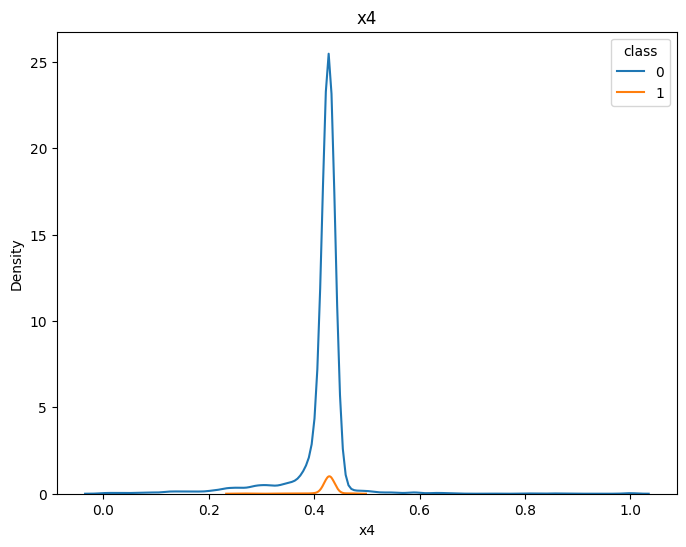

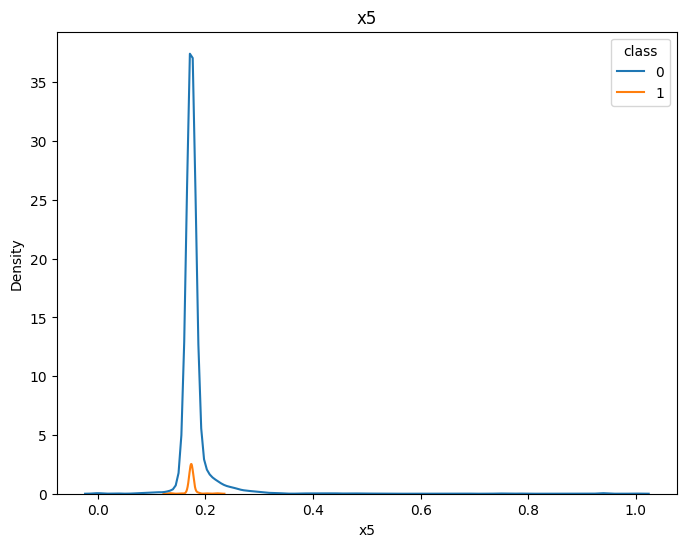

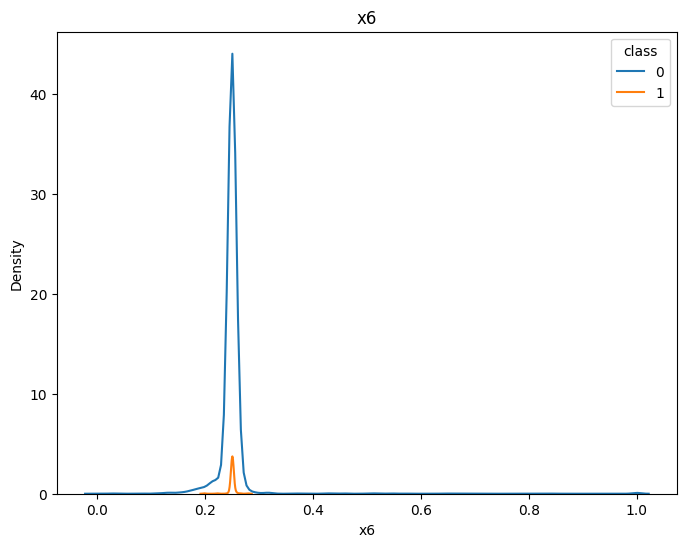

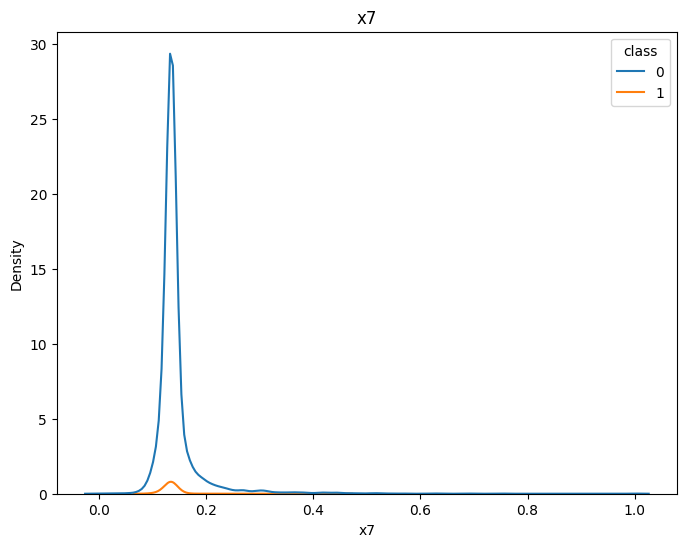

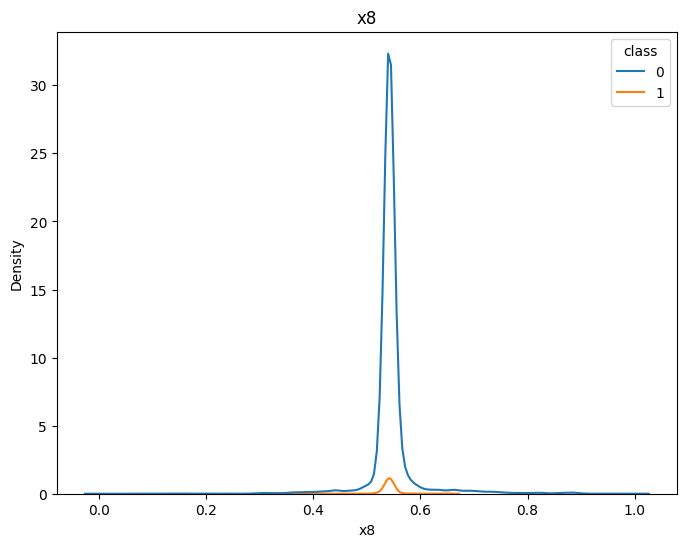

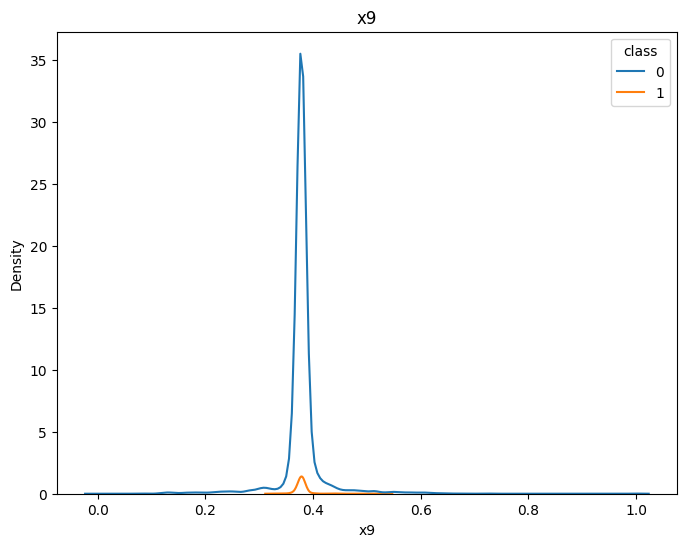

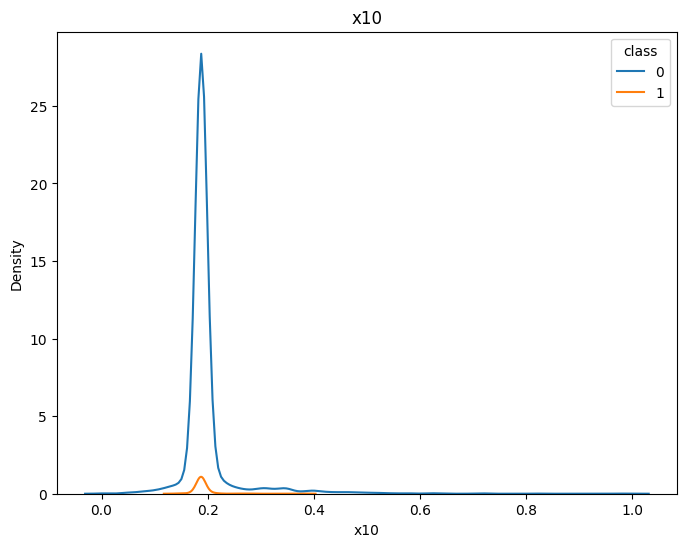

In [ ]:
for col in df_test.drop("class", axis = 1).columns:
    plt.figure(figsize=(8, 6))
    sns.kdeplot(data=df_test, x=df_test[col], hue = "class")
    plt.title(col)

#### dd

In [ ]:
# 개별 모델 셋팅 및 가중치 설정 전용 함수를 따로 py로 제작하였습니다.

%run /content/drive/MyDrive/papers/pyfile/SetModel.py

<Figure size 640x480 with 0 Axes>

In [ ]:
%run /content/drive/MyDrive/papers/pyfile/pca.py

In [ ]:
# tfidf
custom_dataset_tfidf = CustomDataset(df_sembed, 'tfidf')
X, y, df_tfidf = custom_dataset_tfidf.makeDataset()
datasetsplit_tfidf=custom_dataset_tfidf.splitdata()
custom_dataset_tfidf.showtypes()
class_weight_tfidf=custom_dataset_tfidf.setWeights()

X_train shape :  (14037, 10)
X_test shape :  (3510, 10)
y_train shape :  (14037,)
y_test shape :  (3510,)


In [ ]:
class_weight_tfidf

array([ 0.51218711, 21.01347305])

In [ ]:
custom_dataset_tfidf

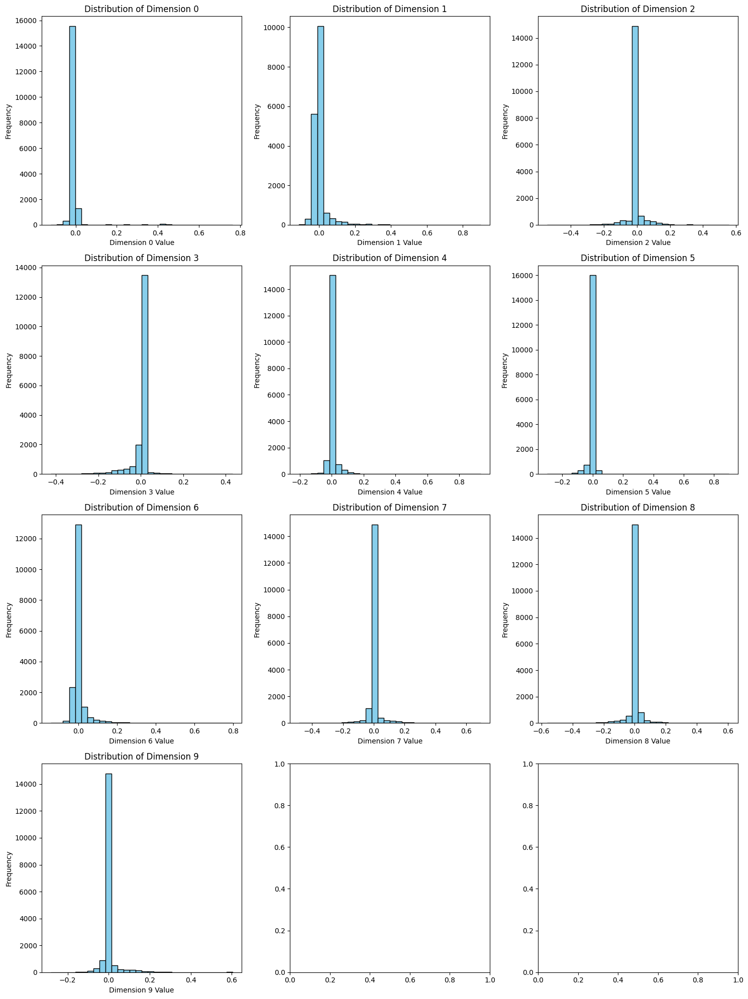

In [ ]:
show_dimension_graph(df_tfidf)

KeyError: ignored

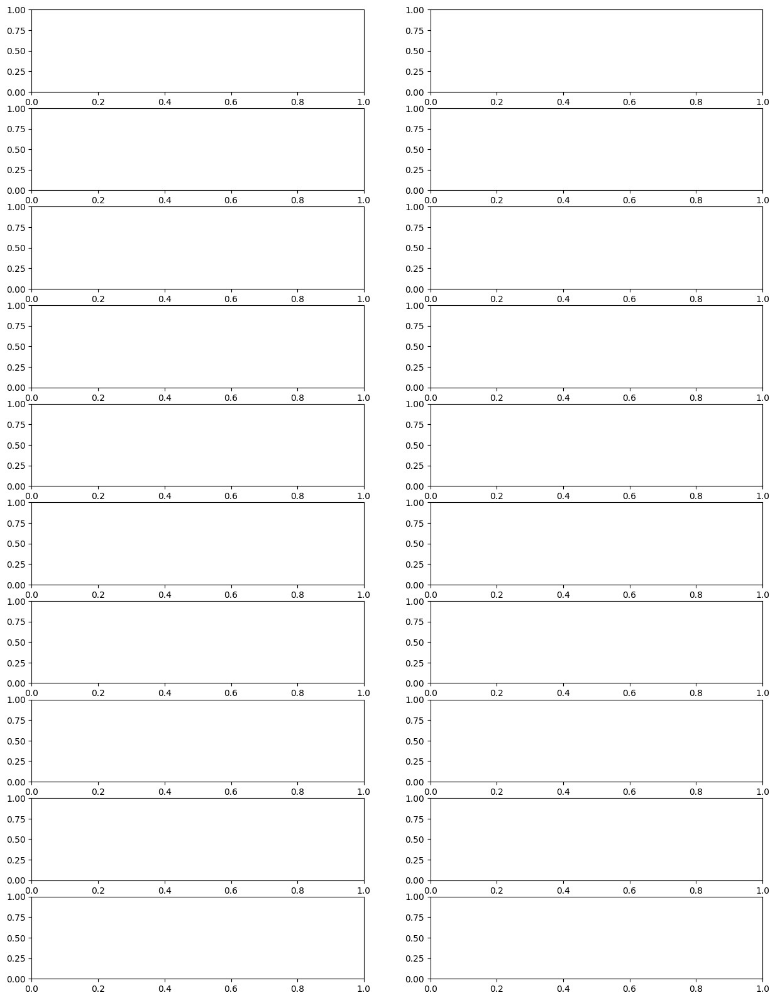

In [ ]:
# 가중치를 반영한 데이터 분포 시각화
custom_dataset_tfidf.show_weighted_vector_distribution()

In [ ]:
class_weight_tfidf

array([ 0.51218711, 21.01347305])

In [ ]:
df_check = X_train.copy()
df_check['class'] = y_train
df_check

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,class
7141,0.121633,0.081160,0.428688,0.371672,0.236344,0.258367,0.126906,0.403816,0.479642,0.306156,0
12081,0.128231,0.079810,0.486091,0.484575,0.177493,0.244700,0.208461,0.505060,0.630986,0.503100,0
7240,0.132367,0.101282,0.494382,0.507682,0.185351,0.251460,0.143832,0.410010,0.484664,0.316867,0
412,0.131086,0.101640,0.495808,0.508109,0.185710,0.250474,0.137775,0.406197,0.479242,0.312312,0
11647,0.209884,0.108033,0.494465,0.505261,0.186874,0.249799,0.142481,0.404510,0.486935,0.317586,0
...,...,...,...,...,...,...,...,...,...,...,...
13793,0.131162,0.099943,0.494931,0.508442,0.184860,0.251323,0.142222,0.409067,0.481302,0.311961,0
8801,0.129252,0.099281,0.495912,0.501930,0.186264,0.251313,0.149869,0.418922,0.490419,0.322801,0
2412,0.132528,0.101878,0.494500,0.507638,0.185715,0.251526,0.142967,0.408123,0.481293,0.312625,0
9638,0.134764,0.071795,0.484355,0.480235,0.168926,0.241054,0.294076,0.644852,0.302951,0.309793,0


In [ ]:
  value_for_weight = class_weight_tfidf[0]
  value_for_normal = class_weight_tfidf[1]

# 이상치에 각 열마다 구한 가중치를 반영
  column_index = df_check.drop("class", axis = 1).describe().columns
  for col in range(len(column_index)):
    df_check[column_index[col]] = np.where(df_check['class'] == 1, df_check[column_index[col]] + value_for_weight, df_check[column_index[col]])

  # 정상치에 각 열마다 구한 가중치를 반영
  column_index = df_check.drop("class", axis = 1).describe().columns
  for col in range(len(column_index)):
    df_check[column_index[col]] = np.where(df_check['class'] == 0, df_check[column_index[col]] + value_for_normal, df_check[column_index[col]])

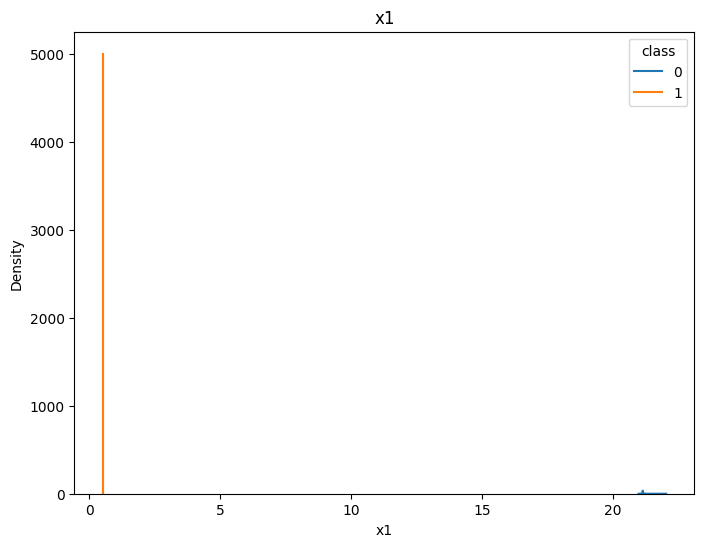

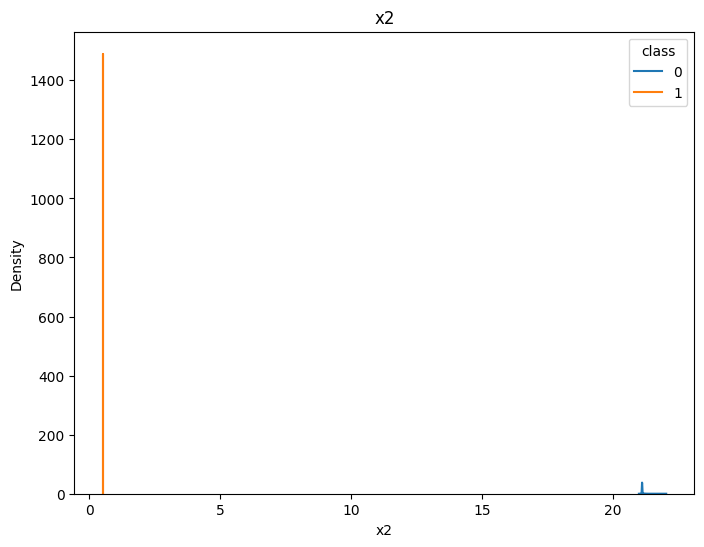

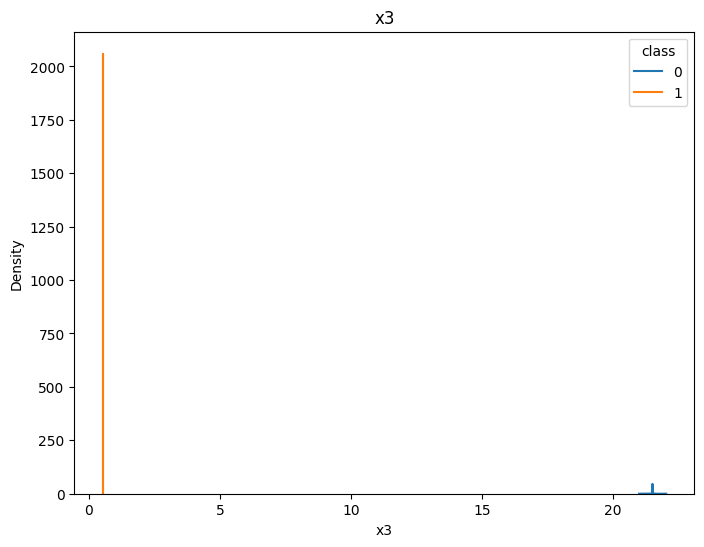

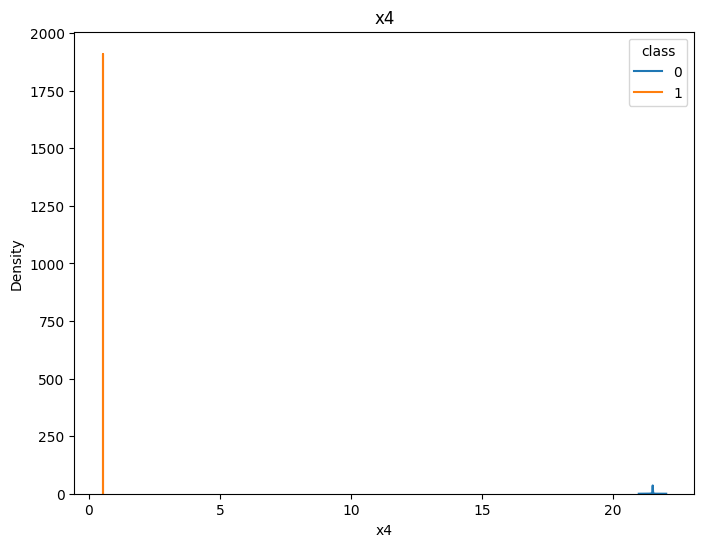

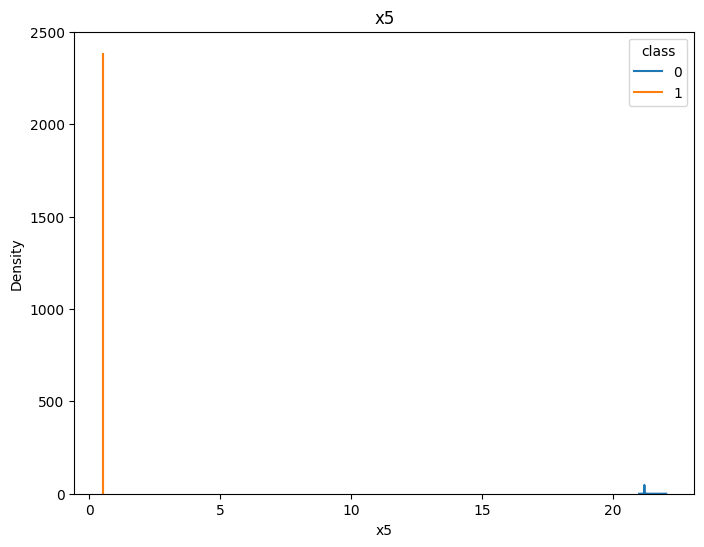

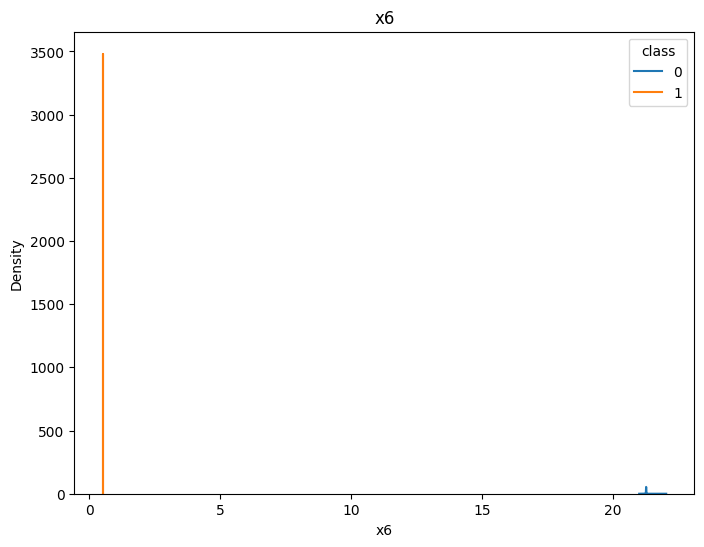

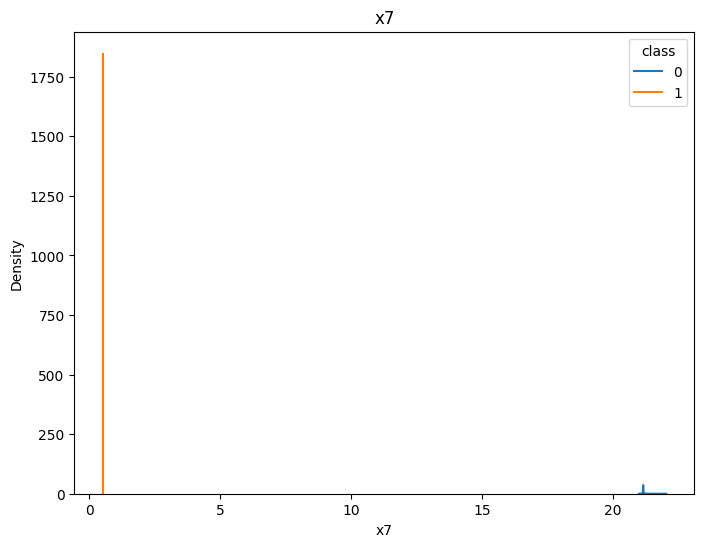

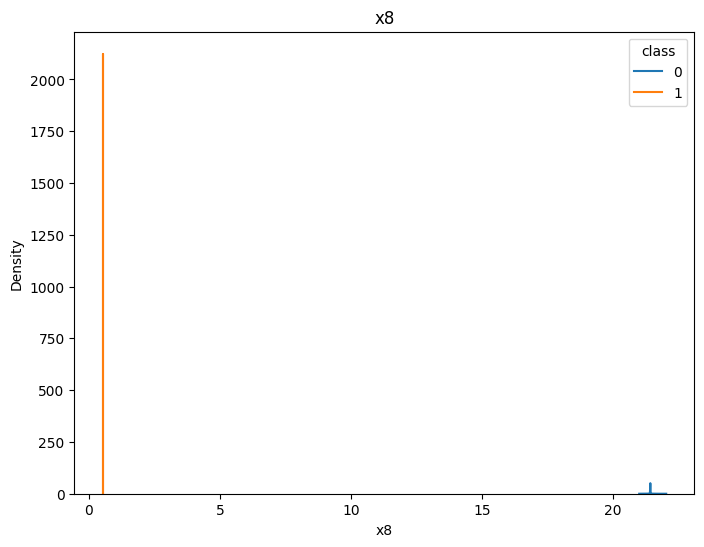

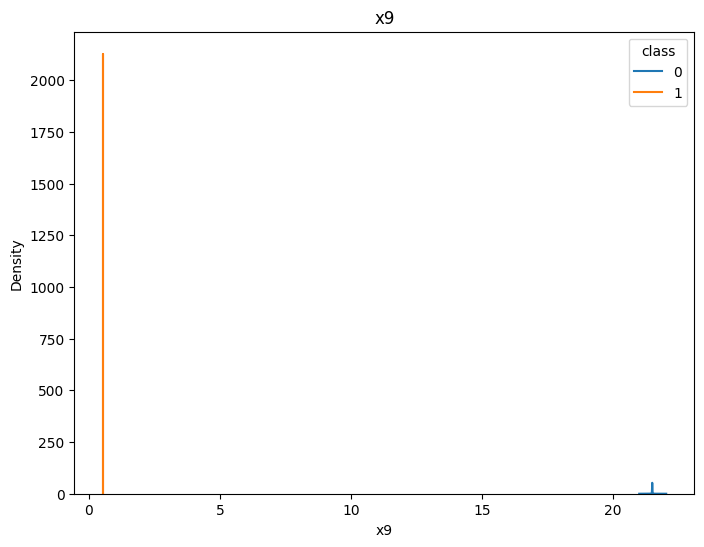

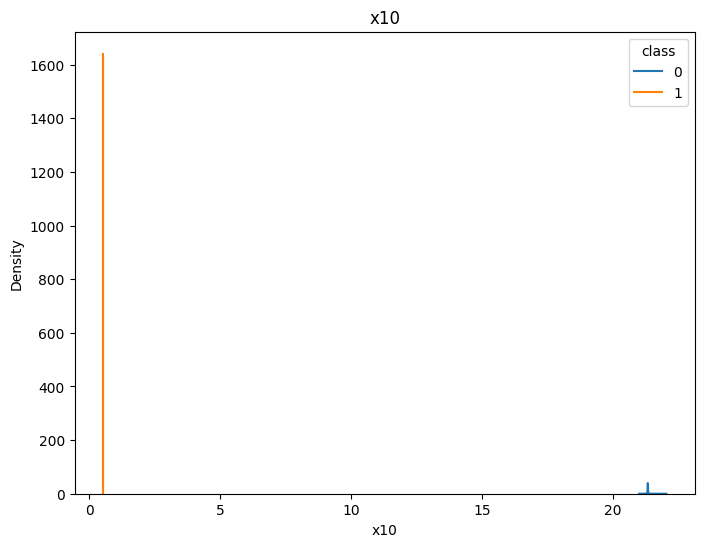

In [ ]:
for col in X_train.columns:
    plt.figure(figsize=(8, 6))
    sns.kdeplot(data=df_check, x=df_check.loc[df_check[col].notnull(), col], hue='class')
    plt.title(col)

In [ ]:
# min_max_normalization 함수
def min_max_normalization(x):
    min_val = x.min()
    max_val = x.max()
    normalized_x = (x - min_val) / (max_val - min_val)
    return normalized_x

In [ ]:
for col in X_train.columns:
    df_check[col] = min_max_normalization(df_check[col])

In [ ]:
for col in X_test.columns:
    X_test[col] = min_max_normalization(X_test[col])

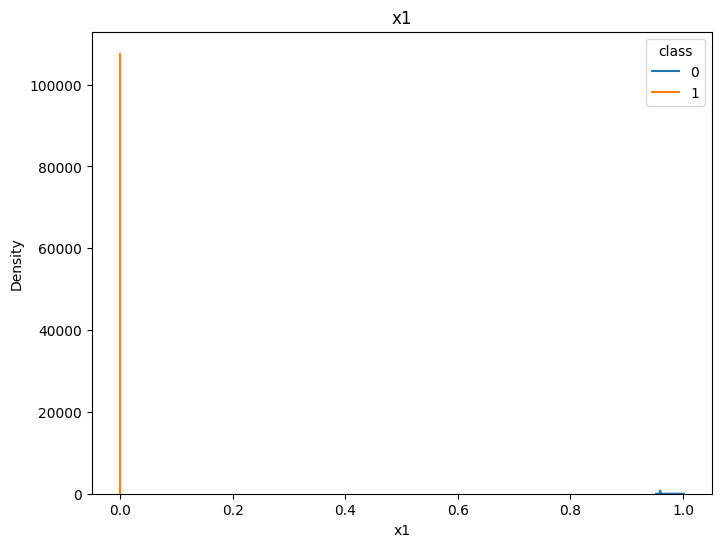

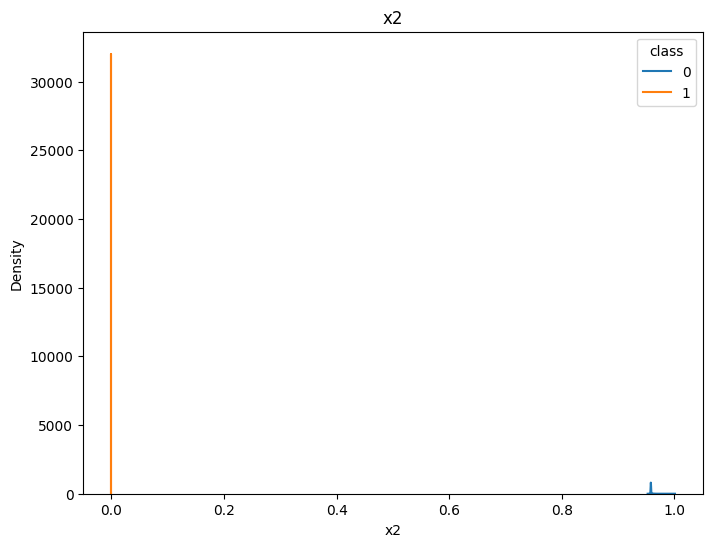

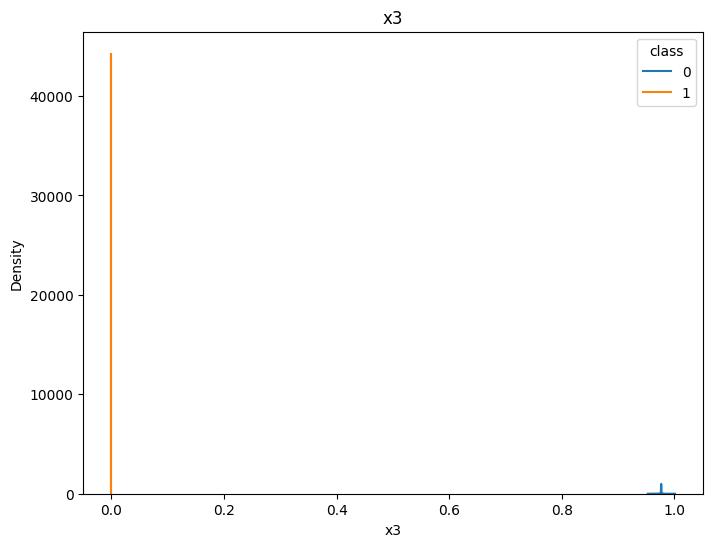

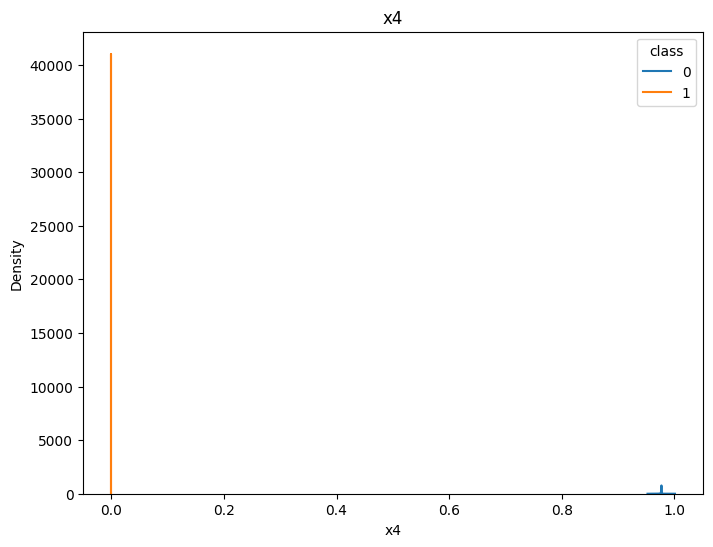

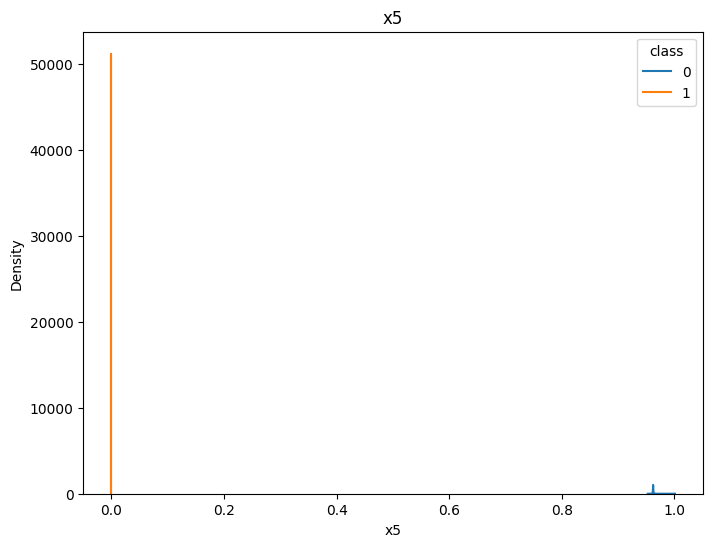

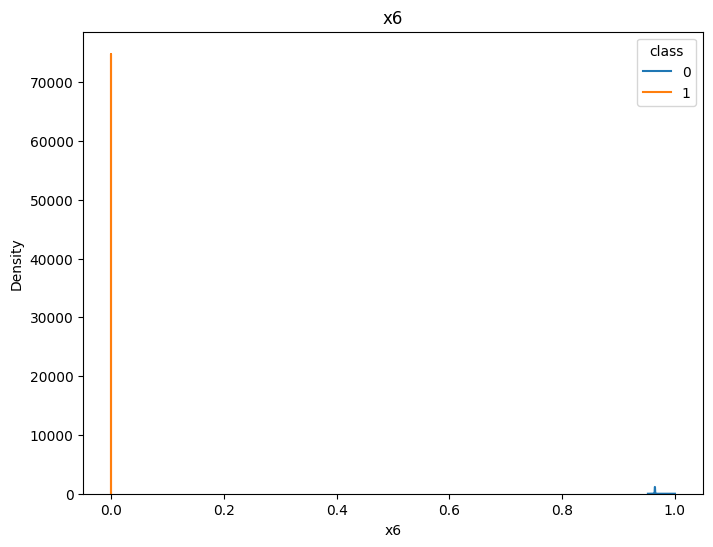

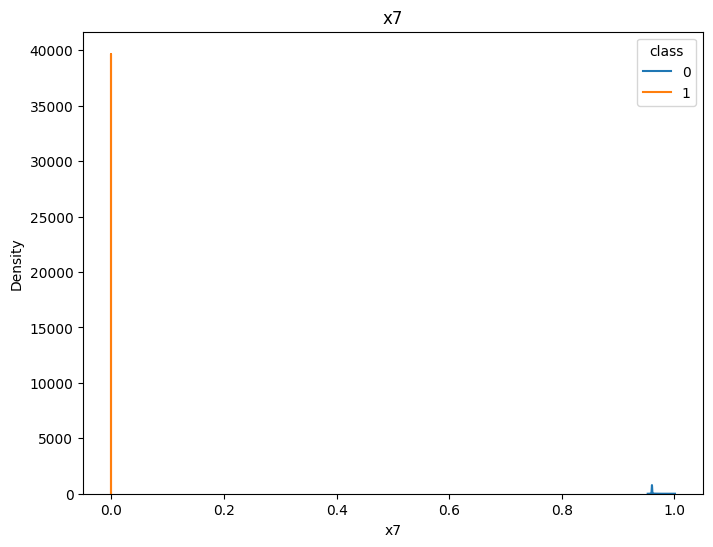

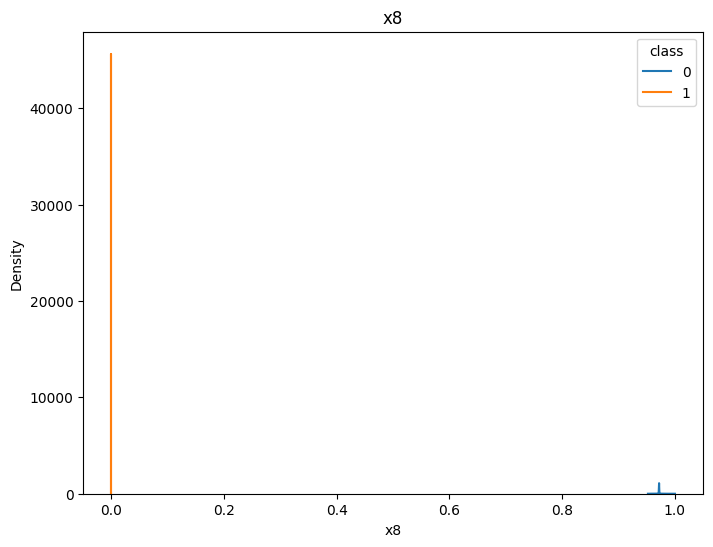

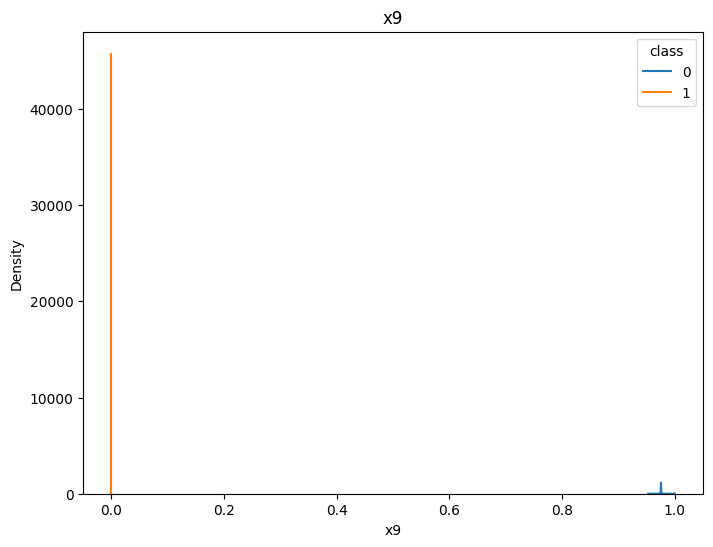

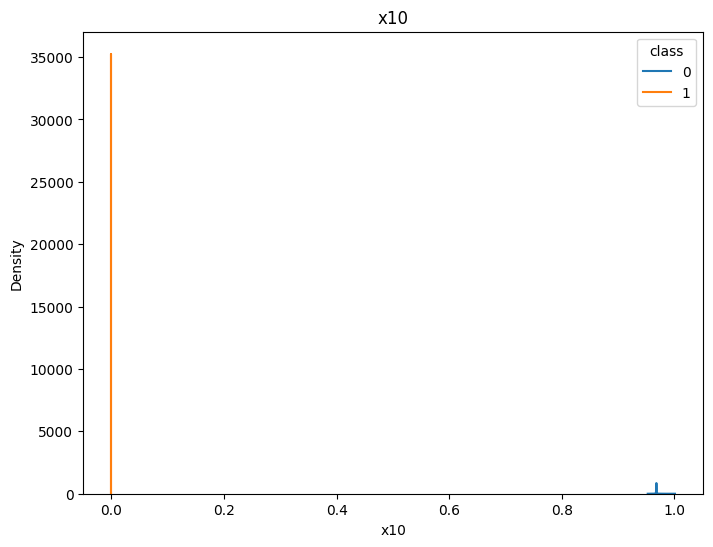

In [ ]:
for col in X_train.columns:
    plt.figure(figsize=(8, 6))
    sns.kdeplot(data=df_check, x=df_check.loc[df_check[col].notnull(), col], hue='class')
    plt.title(col)

In [ ]:
weight_list_for_novelty = []
  weight_list_for_normal = []

  # 각 열마다 가중치를 구한다 (이상치용)
  for col in train_dataset.drop("class", axis = 1).describe().columns:
    df_median = train_dataset.groupby('class').agg(median=(col, 'median'))
    weight_list_for_novelty.append((df_median['median'][0] - df_median['median'][1]) * value_for_weight)

  # 각 열마다 가중치를 구한다 (정상치용)
  for col in train_dataset.drop("class", axis = 1).describe().columns:
    df_median = train_dataset.groupby('class').agg(median=(col, 'median'))
    weight_list_for_normal.append((df_median['median'][0] - df_median['median'][1]) * offset_for_nomral)

  # 이상 치에 각 열마다 구한 가중치를 반영
  column_index = train_dataset.drop("class", axis = 1).describe().columns
  for col in range(len(column_index)):
    train_dataset[column_index[col]] = np.where(train_dataset['class'] == 1, train_dataset[column_index[col]] * weight_list_for_novelty[col], train_dataset[column_index[col]])

  # 정상치에 각 열마다 구한 가중치를 반영
  column_index = train_dataset.drop("class", axis = 1).describe().columns
  for col in range(len(column_index)):
    train_dataset[column_index[col]] = np.where(train_dataset['class'] == 0, train_dataset[column_index[col]] * weight_list_for_normal[col], train_dataset[column_index[col]])

train dataset에만 가중치를 적용

In [ ]:
import statistics

def makeboxplot(class_0_weight=1, class_1_weight=1):
    # 문자열을 정수로 변환
    box_plot_df_sembed = X_train.copy()
    box_plot_df_sembed['class'] = y_train.astype(int)
    columns_to_plot = box_plot_df_sembed.columns[:-1]
    num_columns = 3
    for i in range(0, len(columns_to_plot), num_columns):
        fig = make_subplots(rows=1, cols=num_columns)
        for j, col in enumerate(columns_to_plot[i:i + num_columns]):
            # 클래스 0은 blue, 클래스 1은 red로 색상 할당
            colors = box_plot_df_sembed['class'].map({0: 'blue', 1: 'red'})

            # Find the mode value in class 0 for the specific column
            mode_value_class_0 = statistics.mode(box_plot_df_sembed.loc[box_plot_df_sembed['class'] == 0, col])
            # 각 열마다 0인 클래스들의 값을 모아서 최빈치 구하기

            # Apply weights to the respective classes using mode value
            box_plot_df_sembed.loc[box_plot_df_sembed['class'] == 0, col] *= class_0_weight
            # 클래스가 0인거에는 해당 열에서 클래스 0인 값들의 최빈치를 곱해줌
            box_plot_df_sembed.loc[box_plot_df_sembed['class'] == 1, col] = (box_plot_df_sembed.loc[box_plot_df_sembed['class'] == 1, col] + mode_value_class_0) * class_1_weight
            # 클래스가 1인거에는 mode_value_class_0을 더한 뒤에 class_1_weight(1)만큼 곱해줌 -> mode_value_class_0을 더한게 다인겨

            fig.add_trace(go.Box(x=box_plot_df_sembed['class'][box_plot_df_sembed['class'] == 0],
                                y=box_plot_df_sembed[col][box_plot_df_sembed['class'] == 0],
                                marker_color='blue'), row=1, col=j + 1)
            fig.add_trace(go.Box(x=box_plot_df_sembed['class'][box_plot_df_sembed['class'] == 1],
                                y=box_plot_df_sembed[col][box_plot_df_sembed['class'] == 1],
                                marker_color='red'), row=1, col=j + 1)
        if len(columns_to_plot) == i + num_columns - 1:
            fig.update_layout(title_text=f"Boxplot for Embedded Columns {i+1}~{i+num_columns-1}")
        else:
            fig.update_layout(title_text=f"Boxplot for Embedded Columns {i+1}~{i+num_columns}")
        fig.show()
    return box_plot_df_sembed


In [ ]:
# min_max_normalization 함수
def min_max_normalization(x):
    min_val = x.min()
    max_val = x.max()
    normalized_x = (x - min_val) / (max_val - min_val)
    return normalized_x

In [ ]:
box_plot_df_sembed=makeboxplot(1,1) # default parameter는 class_0_weight, class_1_weight 모두 1로 잡았습니다.

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
X_train = box_plot_df_sembed.drop("class", axis = 1)
X_train

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10
7141,-0.012689,-0.028610,-0.070868,-0.105340,0.048480,0.010270,-0.022539,-0.008126,-0.002020,-0.011039
12081,-0.006861,-0.029938,-0.008157,-0.009251,-0.014598,-0.006005,0.054036,0.111440,0.176651,0.161592
7240,-0.003200,-0.008269,0.001087,0.010848,-0.006465,0.001899,-0.006636,-0.000882,0.003881,-0.001473
412,-0.004336,-0.007910,0.002578,0.011328,-0.006156,0.000617,-0.012145,-0.005628,-0.002177,-0.005088
11647,0.065350,-0.001437,0.002400,0.007895,-0.004716,0.000628,-0.008831,-0.005389,0.003748,-0.003121
...,...,...,...,...,...,...,...,...,...,...
13793,-0.004265,-0.009627,0.001689,0.011577,-0.007018,0.001711,-0.008146,-0.002012,-0.000017,-0.005620
8801,-0.005936,-0.010319,0.002760,0.005924,-0.005238,0.001804,-0.001585,0.008953,0.009423,0.001816
2412,-0.003056,-0.007669,0.001219,0.010834,-0.006067,0.001996,-0.007476,-0.003129,-0.000056,-0.005233
9638,-0.001081,-0.038064,-0.009864,-0.012714,-0.023899,-0.010622,0.133962,0.275547,-0.209285,-0.005409


In [ ]:
X_test

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10
9401,-0.003132,-0.007976,0.001259,0.011139,-0.006344,0.002012,-0.007584,-0.003110,-0.000008,-0.005425
2206,-0.002168,-0.025661,-0.006694,-0.001829,-0.017540,-0.005088,0.075544,0.164958,-0.133506,-0.012097
10725,-0.003113,-0.007841,0.001233,0.010997,-0.006200,0.002006,-0.007631,-0.003139,-0.000083,-0.005341
6303,0.003606,-0.017647,0.000597,0.013817,-0.014398,-0.001189,0.007524,0.008689,0.015183,0.003954
11225,-0.002163,-0.008064,0.000052,0.009082,-0.005273,0.002180,-0.008043,-0.003256,-0.000109,-0.005555
...,...,...,...,...,...,...,...,...,...,...
4942,-0.003806,-0.007690,0.000541,0.011628,-0.005695,0.001797,-0.008531,-0.002466,-0.000088,-0.004762
12353,-0.003056,-0.007669,0.001219,0.010834,-0.006067,0.001996,-0.007476,-0.003129,-0.000056,-0.005233
5099,-0.004878,-0.009726,0.001806,0.011669,-0.006932,0.002302,-0.009538,-0.003139,0.001382,-0.009778
319,-0.005206,-0.002344,-0.005352,0.013869,-0.010004,0.002532,-0.012265,-0.004084,-0.000371,-0.004956


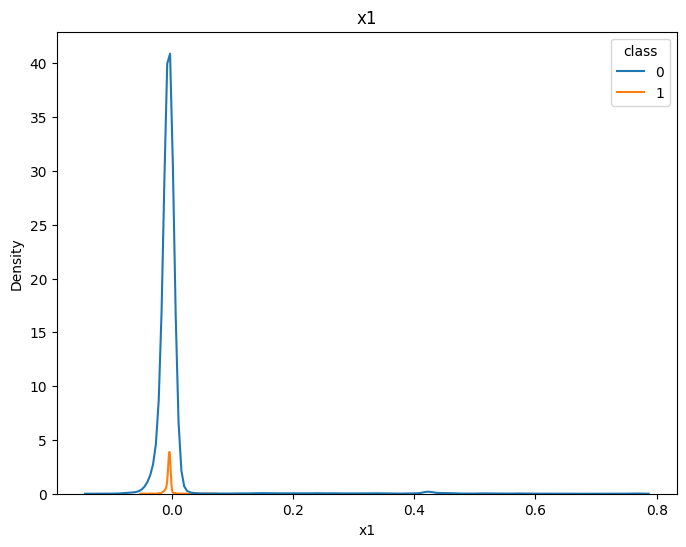

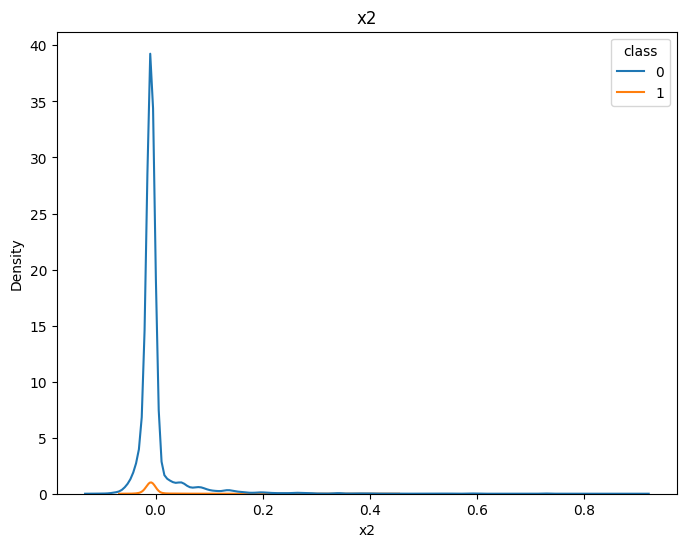

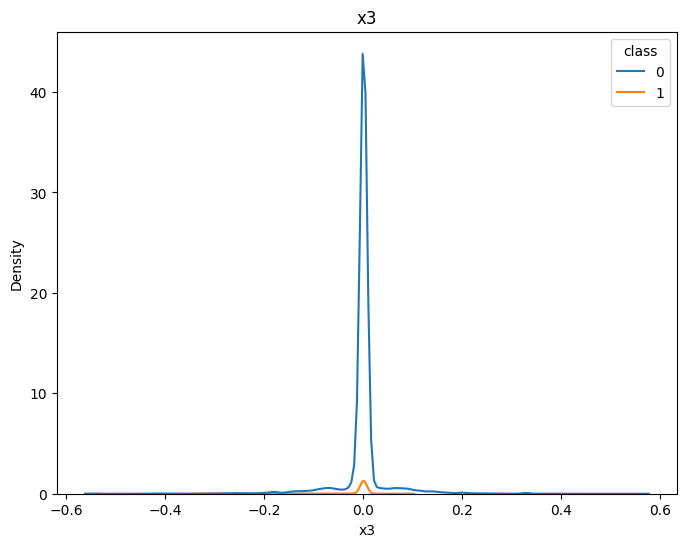

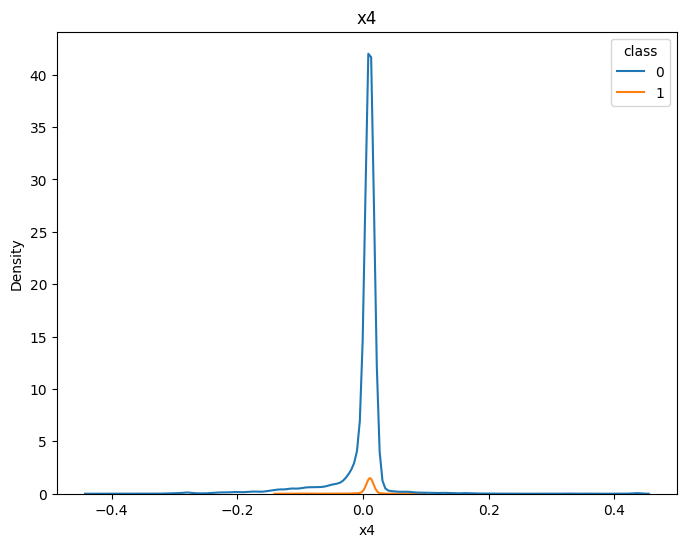

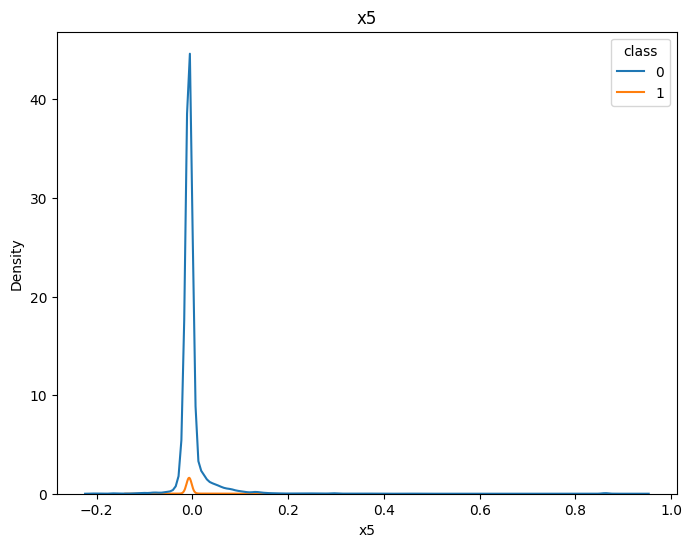

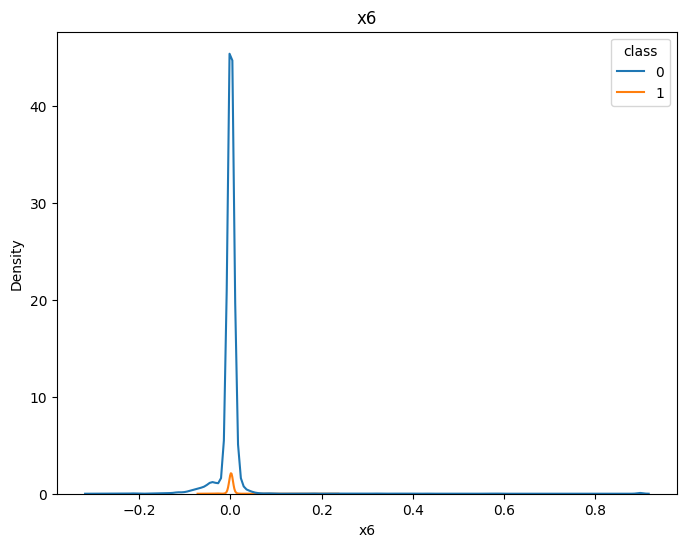

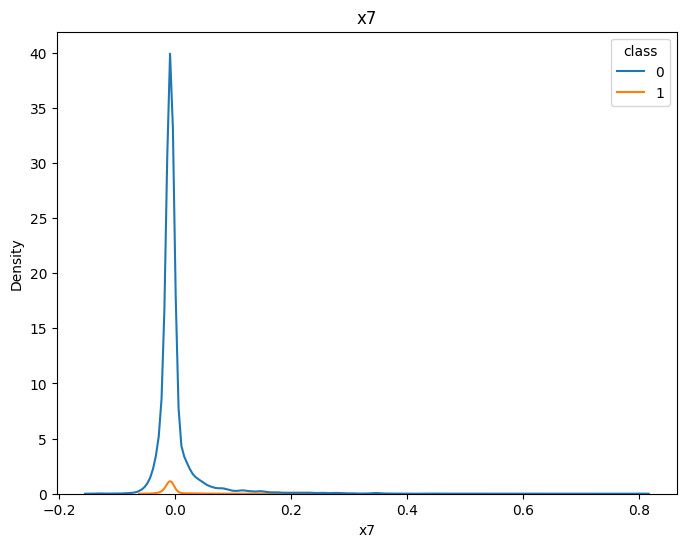

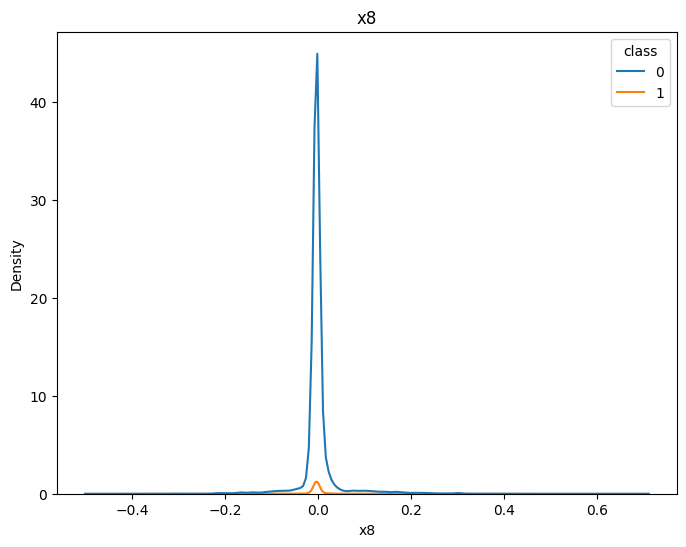

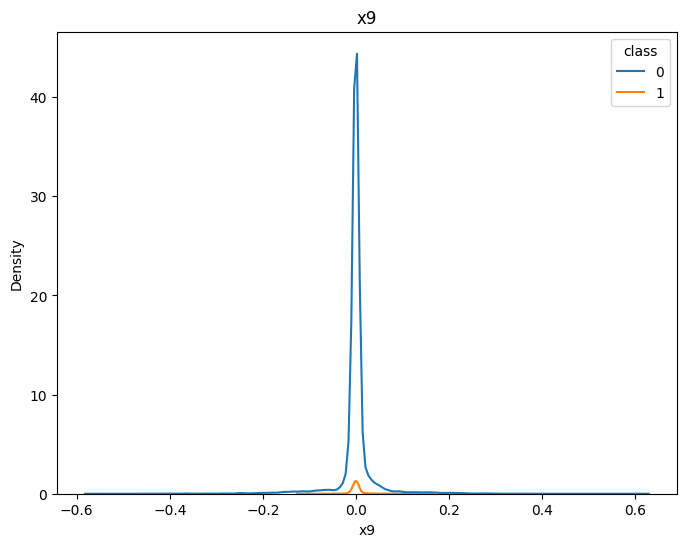

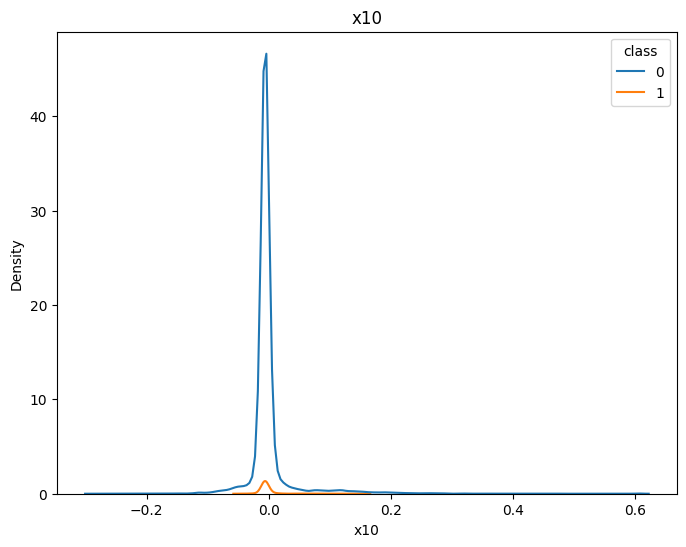

In [ ]:
for col in X_train.columns:
    plt.figure(figsize=(8, 6))
    sns.kdeplot(data=df_sembed, x=df_sembed.loc[df_sembed[col].notnull(), col], hue='class')
    plt.title(col)

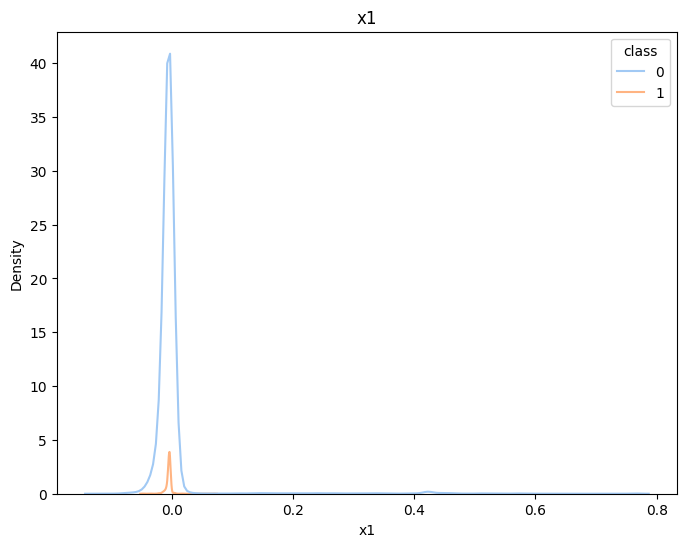

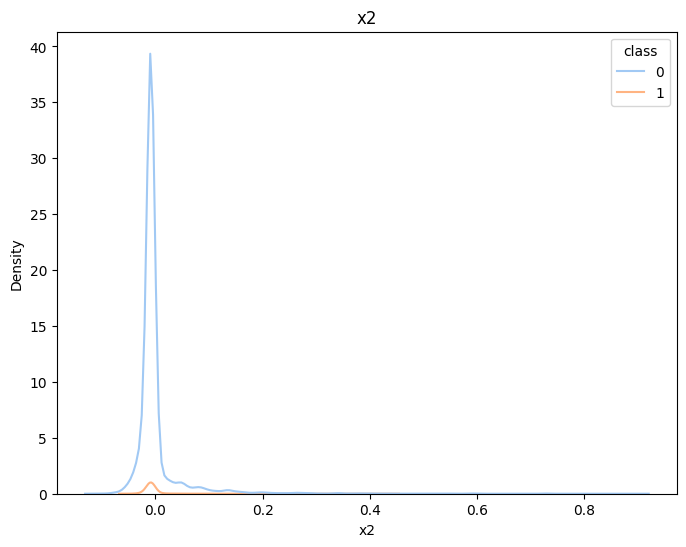

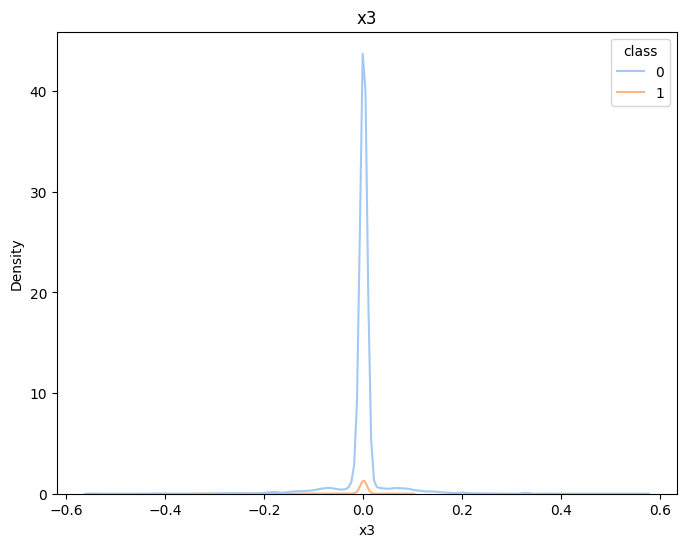

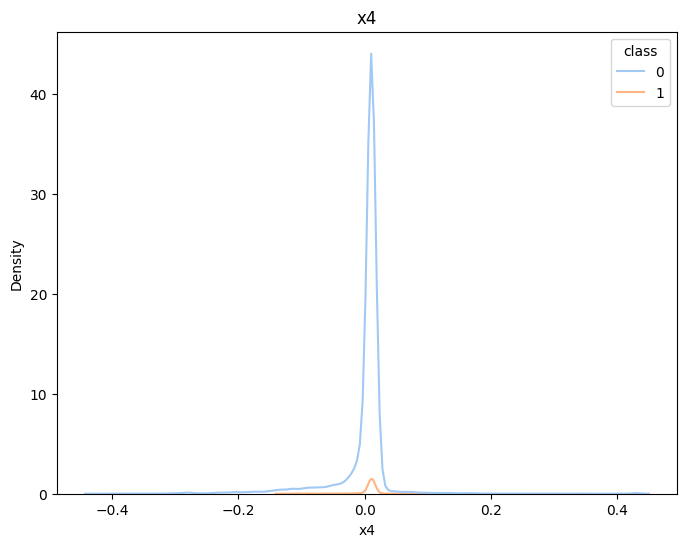

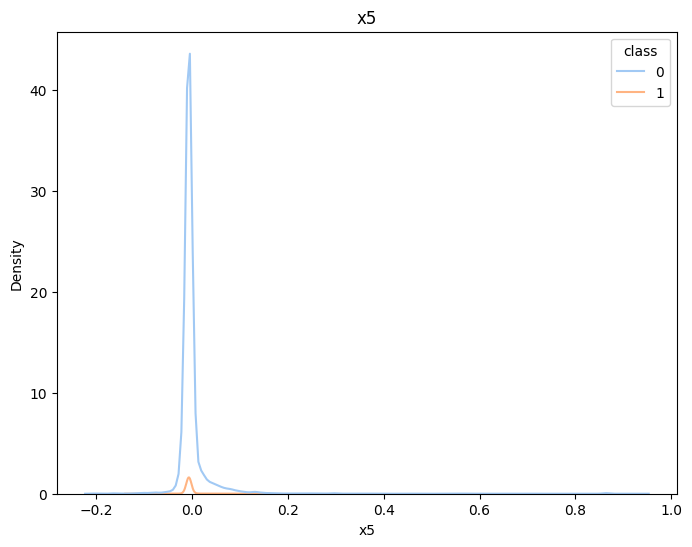

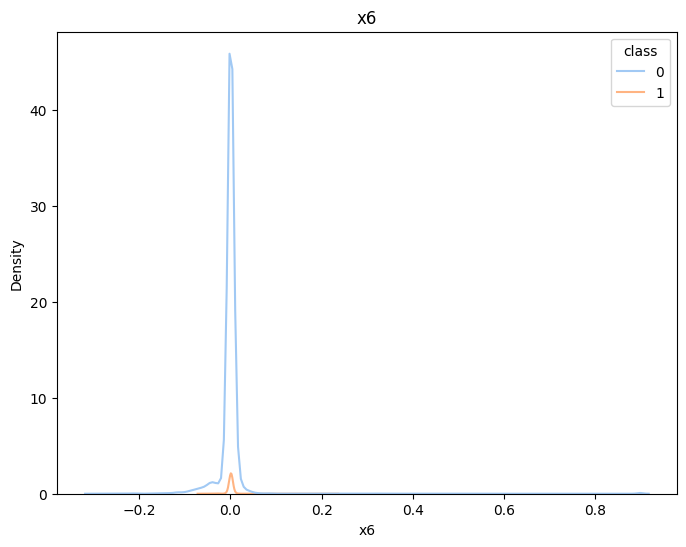

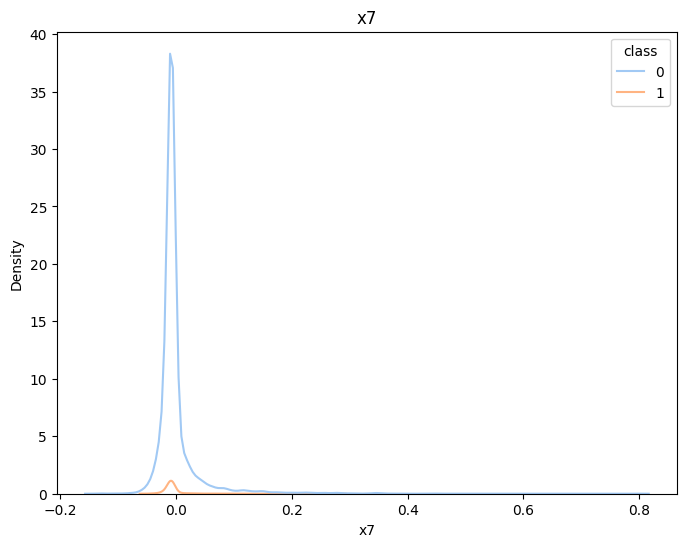

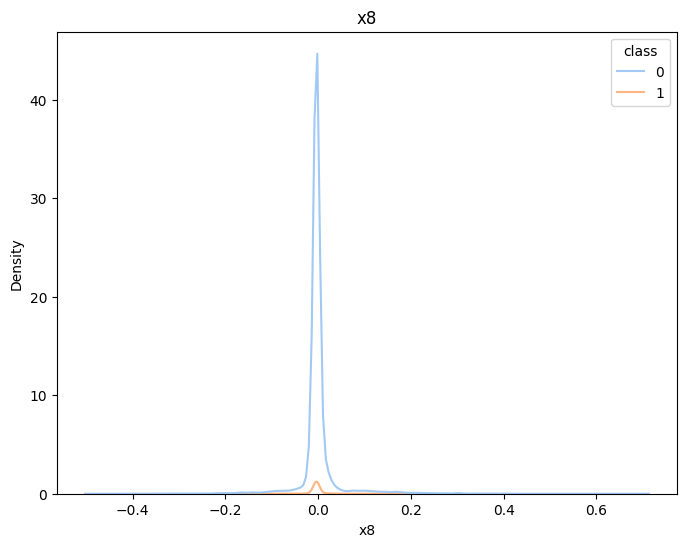

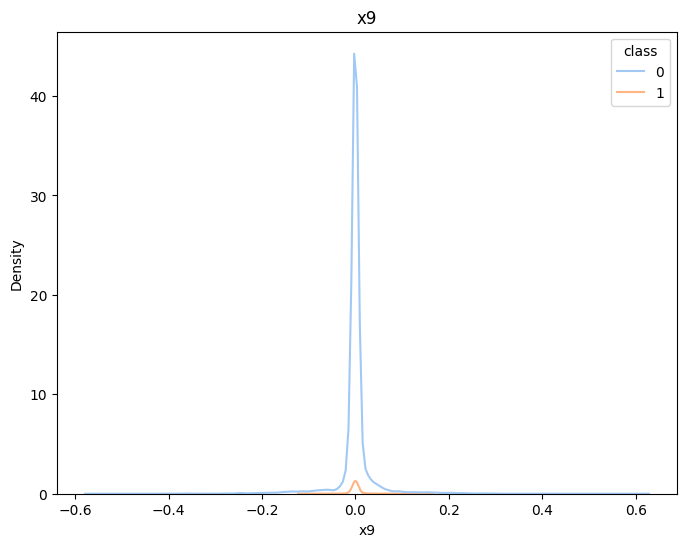

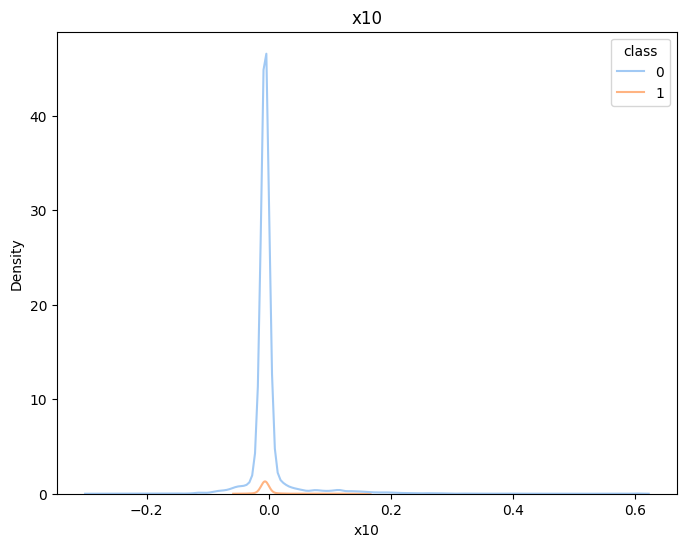

In [ ]:
for col in X_test.columns:
    plt.figure(figsize=(8, 6))
    sns.kdeplot(data=df_sembed, x=df_sembed.loc[df_sembed[col].notnull(), col], hue='class')
    plt.title(col)

### Isolation Forest with tf-idf and gfiving weight by using mode

각 임베딩 벡터(차원, 열)마다 나올 수 있는 값의 범위가 있다.
가중치 반영시 각 벡터의 값 범위를 넘어버리면 과적합의 문제가 있지 않은가?
새로운 데이터는 각 벡터에서 나올 수 있는 일정 벡터 내의 값을 가짐
그러므로, 테스트 셋에서 잘 나올지라도, 새로운 데이터셋에서는 예측력이 떨어질 수밖에 없음

학습 데이터셋에만 가중치를 적용하고, 이로 학습한 모델을 테스트 데이터셋에 적용하여 성능을 평가

가중치를 줄 데이터 셋을 따로 만들기 위해 데이터프레임 복사함

가중치 적용할 학습데이터셋 만들어줌 (x와 y 둘 다 있는 데이터프레임)

In [ ]:
!pip install pyod

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.4/159.4 kB 4.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyod: filename=pyod-1.1.1-py3-none-any.whl size=190074 sha256=8a8bb5eaf0ee7ed1907a592375b3e8721239e4f574c4cbd245f0f5e56147398b
  Stored in directory: /root/.cache/pip/wheels/a3/42/d7/48a53ffc1466bd63932f28583c64ebf442114db14a0bfa8c95
Successfully built pyod


In [ ]:
from pyod.models.iforest import IForest
contamination = 0.05
IForest = IForest(contamination=contamination, random_state=96)
X_train = df_check.drop("class", axis = 1)
#X_test = df_test.drop("class", axis = 1)
y_train = df_check['class']
#y_test = df_test['class']

In [ ]:
IForest.fit(X_train)
IForest_train_pred = IForest.predict(X_train)
IForest_test_pred = IForest.predict(X_test)
y_scores = IForest.decision_function(X_test)

In [ ]:
result = X_test.copy()
result['y_scores'] = y_scores
result['y_test'] = y_test
result['IForest_test_pred'] = IForest_test_pred

In [ ]:
result

,x1,x2,x3,x4,x5,y_scores,y_test,IForest_test_pred
9401,-0.007824,-0.025220,0.010288,-0.013978,-0.070747,0.043328,0,1
2206,0.067057,0.014412,0.095893,0.107359,-0.044992,0.018375,0,1
10725,-0.007524,-0.026730,0.007953,-0.013161,-0.070958,0.044673,0,1
6303,-0.003377,-0.043289,0.022366,-0.022552,-0.069511,0.060646,0,1
11225,-0.007763,-0.029804,0.013179,-0.014703,-0.061632,0.045122,0,1
...,...,...,...,...,...,...,...,...
4942,-0.017048,-0.031408,-0.016977,-0.002647,-0.058259,0.046152,0,1
12353,-0.040243,0.046226,-0.047126,0.034374,-0.055087,0.076463,0,1
5099,-0.185978,0.373229,-0.090175,0.068296,0.274649,-0.036461,0,0
319,-0.177185,0.439386,0.020106,-0.019587,0.130941,0.010056,0,1


학습 결과 시각화
<br/> 1. 예측된 클래스에 따른 novelty score (y_scores) 분포 차이
<br/> 2. 실제 클래스에 따른 novelty score (y_scores) 분포 차이
<br/> 3. confusion matrix

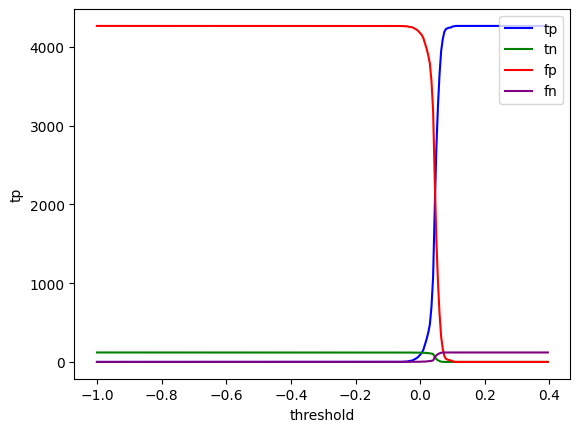

In [ ]:
# 임계치 grid search
threshold_list = np.arange(-1, 0.4, 0.005).tolist()
tp_list = []
fp_list = []
fn_list = []
tn_list = []

for i in range(len(threshold_list)):
  result['LOF_test_pred'] = np.where(result['y_scores'] > threshold_list[i], 1, 0)
  con_mat = confusion_matrix(result['y_test'], result['LOF_test_pred'])
  tp_list.append(con_mat[0][0])
  fp_list.append(con_mat[0][1])
  fn_list.append(con_mat[1][0])
  tn_list.append(con_mat[1][1])

df_threshold = pd.DataFrame()
df_threshold['tp'] = tp_list
df_threshold['fp'] = fp_list
df_threshold['fn'] = fn_list
df_threshold['tn'] = tn_list
df_threshold['threshold'] = threshold_list

# 데이터프레임 df_threshold와 그래프 그리기
sns.lineplot(x=df_threshold['threshold'], y=df_threshold['tp'], label="tp", color="blue")
sns.lineplot(x=df_threshold['threshold'], y=df_threshold['tn'], label="tn", color="green")
sns.lineplot(x=df_threshold['threshold'], y=df_threshold['fp'], label="fp", color="red")
sns.lineplot(x=df_threshold['threshold'], y=df_threshold['fn'], label="fn", color="purple")

# 범례 위치 설정
plt.legend(loc="upper right")

In [ ]:
# 임계값 설정
threshold = 0.035

# 예측을 이상치와 정상치로 분류
result['IForest_test_pred'] = np.where(result['y_scores'] > threshold, 1, 0)
con_mat = confusion_matrix(result['y_test'], result['IForest_test_pred'])

print(con_mat)

[[ 702 3565]
 [  14  106]]


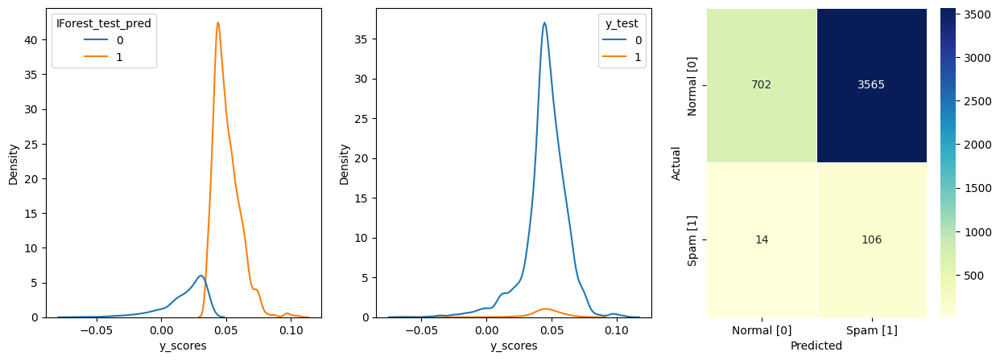

X_train shape :  (13160, 5)
X_test shape :  (4387, 5)
y_train shape :  (13160,)
y_test shape :  (4387,)
contamination: 0.05
con_mat:
[[ 702 3565]
 [  14  106]]
accuracy:  0.04786870298609528
recall:  0.983
precision:  0.027
f1-score:  0.053




In [ ]:
fig, axes = plt.subplots(1,3, figsize=(15, 5))
sns.kdeplot(data=result, x="y_scores", hue='IForest_test_pred', ax=axes[0])
sns.kdeplot(data=result, x="y_scores", hue='y_test', ax=axes[1])

con_mat = confusion_matrix(result['y_test'], result['IForest_test_pred'])
sns.heatmap(pd.DataFrame(con_mat, columns = ['Predicted', 'Actual']),
              xticklabels=['Normal [0]', 'Spam [1]'],
              yticklabels=['Normal [0]', 'Spam [1]'],
              annot=True, fmt="d", linewidths=.5, cmap="YlGnBu", ax=axes[2])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

print('X_train shape : ', X_train.shape)
print('X_test shape : ', X_test.shape)
print('y_train shape : ', y_train.shape)
print('y_test shape : ', y_test.shape)
print("contamination:", contamination)
print("con_mat:")
print(con_mat)
print("accuracy: ", accuracy_score(y_test, IForest_test_pred))
print("recall: ", round(recall_score(y_test, IForest_test_pred),3))
print("precision: ", round(precision_score(y_test, IForest_test_pred),3))
print("f1-score: ", round(f1_score(y_test, IForest_test_pred),3))
print()
print()

In [ ]:
from sklearn.metrics import roc_curve


def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color="red", label="ROC")
    plt.plot([0, 1], [0, 1], color="green", linestyle="--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Receiver Operating Characteristic Curve")
    plt.legend()
    plt.show()

### Local Outlier Factor¶with tf-idf and gfiving weight by using mode

In [ ]:
# min_max_normalization 함수
def min_max_normalization(x):
    min_val = x.min()
    max_val = x.max()
    normalized_x = (x - min_val) / (max_val - min_val)
    return normalized_x

In [ ]:
# min_max_normalization을 train data에 적용
for col in X_train.columns:
    X_train[col] = min_max_normalization(X_train[col])

# min_max_normalization을 test data에 적용
for col in X_test.columns:
    X_test[col] = min_max_normalization(X_test[col])

In [ ]:
  from sklearn.neighbors import LocalOutlierFactor
  contamination = 0.1 #0.0226
  LOF = LocalOutlierFactor(contamination=contamination, novelty=True) #contamination=contamination,
  LOF.fit(X_train)

LocalOutlierFactor(contamination=0.1, novelty=True)

In [ ]:
  LOF_train_pred = LOF.predict(X_train)
  LOF_test_pred = LOF.predict(X_test)
  y_scores = LOF.decision_function(X_test)

In [ ]:
y_scores

array([-0.72606234, -0.83417043, -0.7237061 , ..., -2.34711404,
       -1.59193448, -1.03448679])

In [ ]:
result = X_test.copy()
result['y_scores'] = y_scores
result['y_test'] = y_test
result['LOF_test_pred'] = LOF_test_pred
result['LOF_test_pred'] = np.where(result['LOF_test_pred'] == -1 , 1, 0)
result

,x1,x2,x3,x4,x5,y_scores,y_test,LOF_test_pred
9401,0.291820,0.090777,0.438366,0.425907,0.213365,-0.726062,0,1
2206,0.366701,0.130409,0.535154,0.551295,0.239119,-0.834170,0,1
10725,0.292120,0.089267,0.435727,0.426750,0.213153,-0.723706,0,1
6303,0.296267,0.072708,0.452022,0.417046,0.214600,-0.842796,0,1
11225,0.291881,0.086193,0.441635,0.425158,0.222480,-0.770054,0,1
...,...,...,...,...,...,...,...,...
4942,0.282596,0.084589,0.407540,0.437616,0.225852,-0.827881,0,1
12353,0.259401,0.162223,0.373452,0.475873,0.229024,-0.808271,0,1
5099,0.113666,0.489226,0.324780,0.510927,0.558760,-2.347114,0,1
319,0.122460,0.555383,0.449467,0.420110,0.415052,-1.591934,0,1


<Axes: xlabel='y_scores', ylabel='Density'>

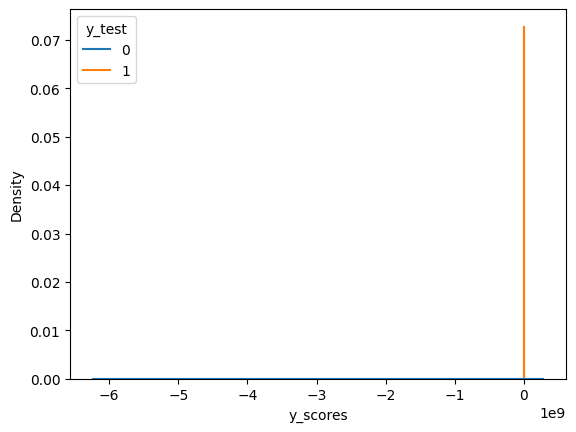

In [ ]:
sns.kdeplot(data=result, x='y_scores', hue = 'y_test')

tf-idf + 최빈값 더하는 방식의 가중치 처리 + lof -> y_scores가 비정상적으로 낮게 나오는 것으로 확인됨
<br/>심지어 conufusion matrix를 그려보았을 때도, 부정확하게 나옴
<br/> novelty score (y_scores)를 min-max normalization을 하니 괜찮아짐

In [ ]:
con_mat = confusion_matrix(result['y_test'], result['LOF_test_pred'])

print(con_mat)

[[  63 4204]
 [   0  120]]


In [ ]:
# 임계치 grid search
threshold_list = np.arange(-3, 0.4, 0.005).tolist()
tp_list = []
fp_list = []
fn_list = []
tn_list = []

for i in range(len(threshold_list)):
  result['LOF_test_pred'] = np.where(result['y_scores'] > threshold_list[i], 1, 0)
  con_mat = confusion_matrix(result['y_test'], result['LOF_test_pred'])
  tp_list.append(con_mat[0][0])
  fp_list.append(con_mat[0][1])
  fn_list.append(con_mat[1][0])
  tn_list.append(con_mat[1][1])

print(tp_list)
print(fp_list)
print(fn_list)
print(tn_list)

[42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 44, 44, 44, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 48, 49, 49, 49, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 51, 51, 51, 51, 52, 52, 52, 52, 52, 52, 52, 52, 54, 54, 54, 54, 54, 55, 55, 55, 56, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 58, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 60, 60, 60, 61, 61, 61, 61, 61, 62, 62, 62, 62, 62, 62, 62, 63, 63, 63, 63, 64, 65, 65, 67, 68, 68, 70, 70, 70, 70, 70, 71, 71, 72, 72, 72, 72, 73, 74, 74, 74, 75, 75, 75, 75, 78, 78, 78, 78, 78, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 80, 80, 80, 81, 83, 83, 83, 86, 86, 86, 88, 91, 91, 95, 98, 99, 100, 100, 101, 101, 101, 101, 102, 102, 104, 104, 106, 106, 108, 108, 108, 108, 110, 110, 114, 114, 115, 115, 116, 117, 117, 117, 118, 118, 122, 122, 122, 123, 124, 126, 127, 

In [ ]:
df_threshold = pd.DataFrame()
df_threshold['tp'] = tp_list
df_threshold['fp'] = fp_list
df_threshold['fn'] = fn_list
df_threshold['tn'] = tn_list
df_threshold['threshold'] = threshold_list

df_threshold

,tp,fp,fn,tn,threshold
0,42,4225,0,120,-3.000
1,42,4225,0,120,-2.995
2,42,4225,0,120,-2.990
3,42,4225,0,120,-2.985
4,42,4225,0,120,-2.980
...,...,...,...,...,...
675,4267,0,120,0,0.375
676,4267,0,120,0,0.380
677,4267,0,120,0,0.385
678,4267,0,120,0,0.390


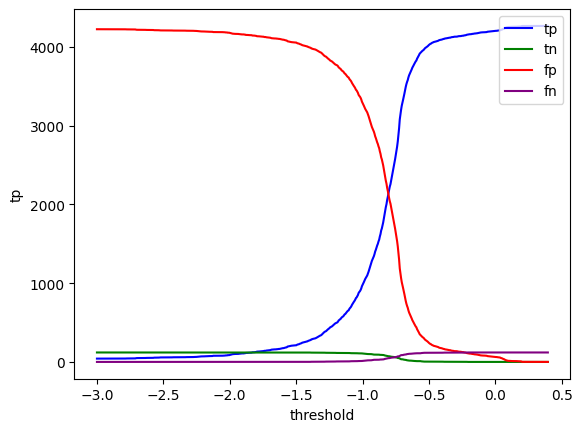

In [ ]:
# 데이터프레임 df_threshold와 그래프 그리기
sns.lineplot(x=df_threshold['threshold'], y=df_threshold['tp'], label="tp", color="blue")
sns.lineplot(x=df_threshold['threshold'], y=df_threshold['tn'], label="tn", color="green")
sns.lineplot(x=df_threshold['threshold'], y=df_threshold['fp'], label="fp", color="red")
sns.lineplot(x=df_threshold['threshold'], y=df_threshold['fn'], label="fn", color="purple")

# 범례 위치 설정
plt.legend(loc="upper right")

<Axes: xlabel='threshold', ylabel='tn'>

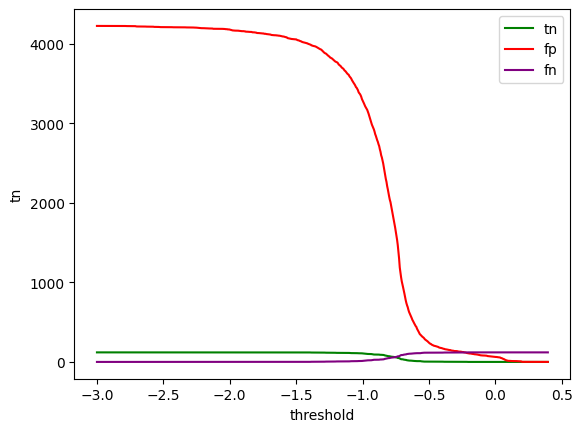

In [ ]:
sns.lineplot(x=df_threshold['threshold'], y=df_threshold['tn'], label="tn", color="green")
sns.lineplot(x=df_threshold['threshold'], y=df_threshold['fp'], label="fp", color="red")
sns.lineplot(x=df_threshold['threshold'], y=df_threshold['fn'], label="fn", color="purple")



In [ ]:
pd.options.display.float_format = '{:.10f}'.format

In [ ]:
# 임계값 설정
threshold = -1

# 예측을 이상치와 정상치로 분류
result['LOF_test_pred'] = np.where(result['y_scores'] > threshold, 1, 0)
con_mat = confusion_matrix(result['y_test'], result['LOF_test_pred'])

print(con_mat)

[[ 978 3289]
 [  13  107]]


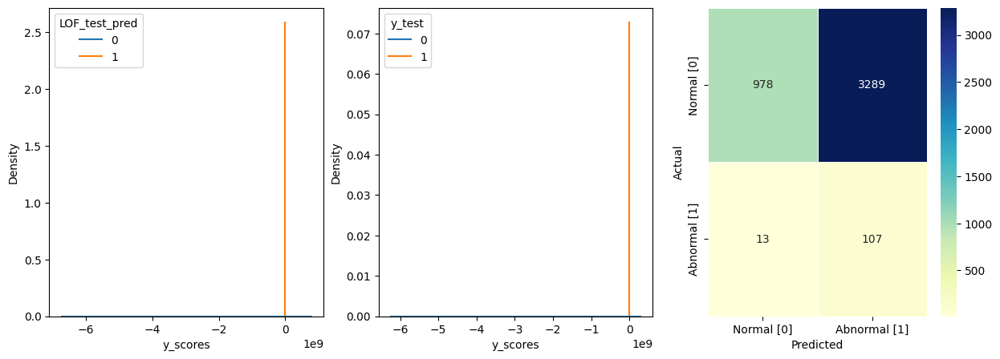

contamination: 0.045
con_mat:
[[ 978 3289]
 [  13  107]]
accuracy:  0.24732163209482563
recall:  0.892
precision:  0.032
f1-score:  0.061


In [ ]:
# Confusion matrix 출력 및 모델 성능 평가
con_mat = confusion_matrix(result['y_test'], result['LOF_test_pred'])

fig, axes = plt.subplots(1,3, figsize=(15, 5))
sns.kdeplot(data=result, x=result["y_scores"], hue=result['LOF_test_pred'], ax=axes[0]) #sns.histplot으로 실행하면 램 부족으로 인해 세션 튕김... -> kde plot으로 변경
sns.kdeplot(data=result, x=result["y_scores"], hue=result['y_test'], ax=axes[1])

sns.heatmap(pd.DataFrame(con_mat, columns = ['Predicted', 'Actual']),
              xticklabels=['Normal [0]', 'Abnormal [1]'],
              yticklabels=['Normal [0]', 'Abnormal [1]'],
              annot=True, fmt="d", linewidths=.5, cmap="YlGnBu", ax=axes[2])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

print("contamination:", contamination)
print("con_mat:")
print(con_mat)
print("accuracy: ", accuracy_score(result['y_test'],  result['LOF_test_pred']))
print("recall: ", round(recall_score(result['y_test'],  result['LOF_test_pred']),3))
print("precision: ", round(precision_score(result['y_test'],  result['LOF_test_pred']),3))
print("f1-score: ", round(f1_score(result['y_test'],  result['LOF_test_pred']),3))


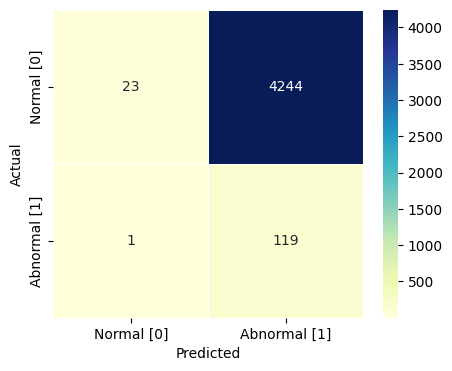

value_for_weight: 0.2
offset_for_nomral: 4.0
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


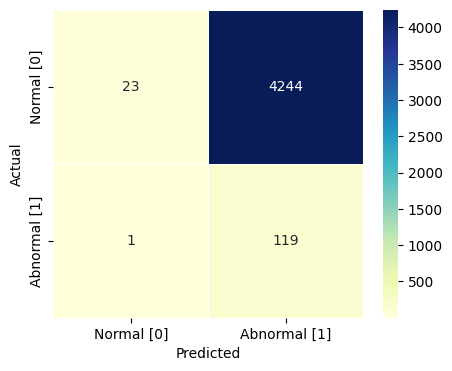

value_for_weight: 0.21250000000000002
offset_for_nomral: 3.9375
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


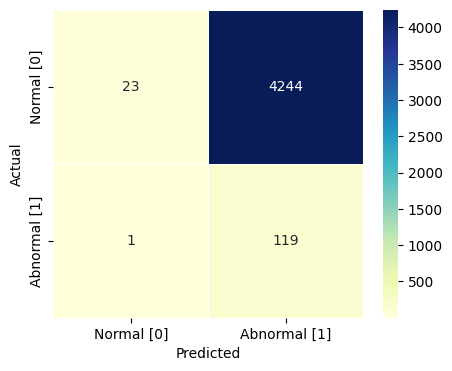

value_for_weight: 0.22500000000000003
offset_for_nomral: 3.8749999999999996
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


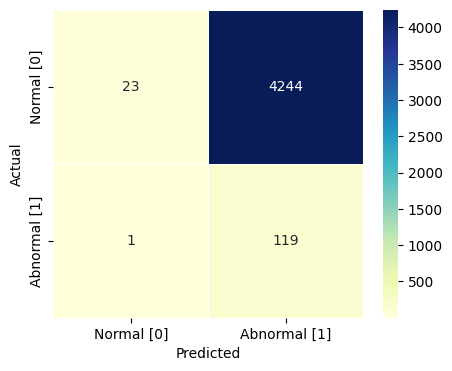

value_for_weight: 0.23750000000000004
offset_for_nomral: 3.8125
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


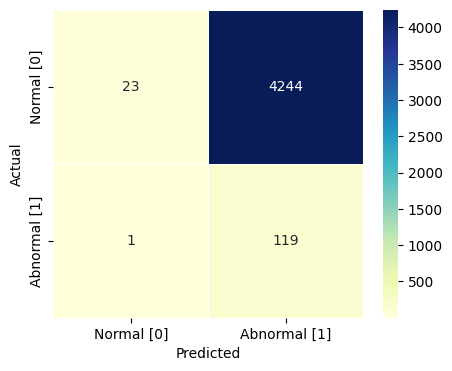

value_for_weight: 0.25000000000000006
offset_for_nomral: 3.75
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


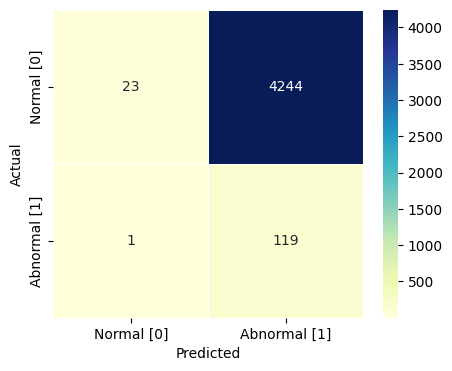

value_for_weight: 0.26250000000000007
offset_for_nomral: 3.6874999999999996
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


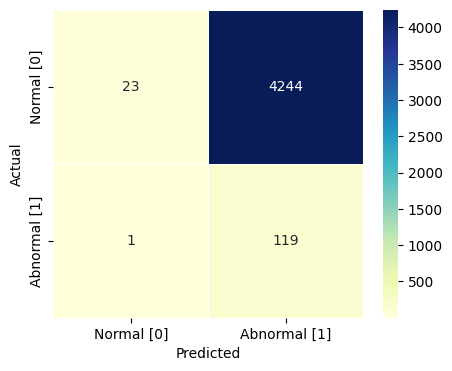

value_for_weight: 0.2750000000000001
offset_for_nomral: 3.624999999999999
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


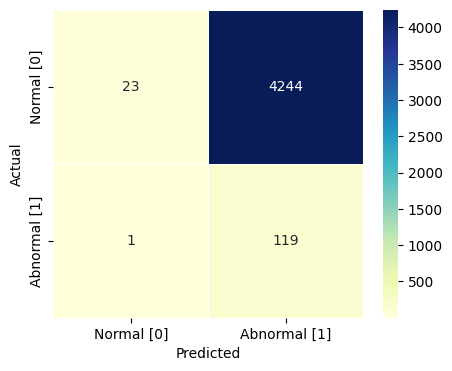

value_for_weight: 0.2875000000000001
offset_for_nomral: 3.5624999999999996
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


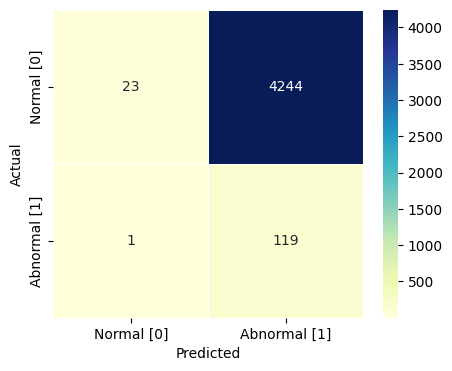

value_for_weight: 0.3000000000000001
offset_for_nomral: 3.5
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


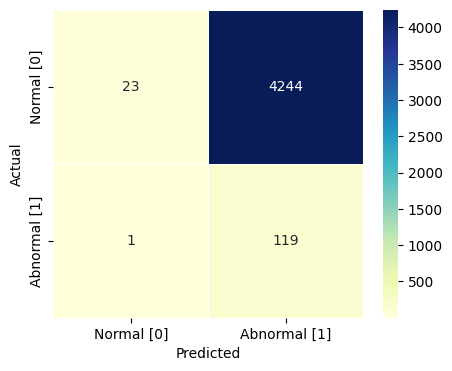

value_for_weight: 0.3125000000000001
offset_for_nomral: 3.4374999999999996
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


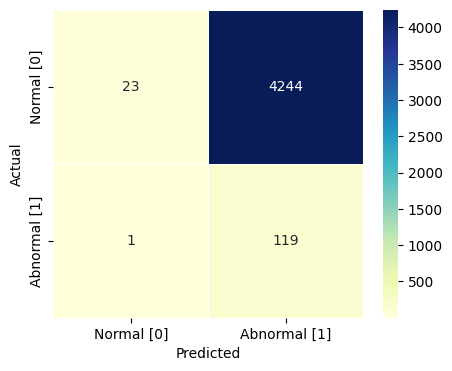

value_for_weight: 0.3250000000000001
offset_for_nomral: 3.374999999999999
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


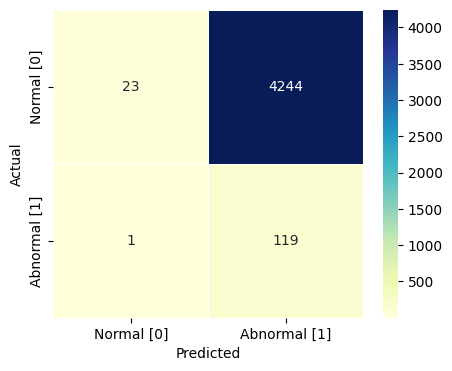

value_for_weight: 0.33750000000000013
offset_for_nomral: 3.312499999999999
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


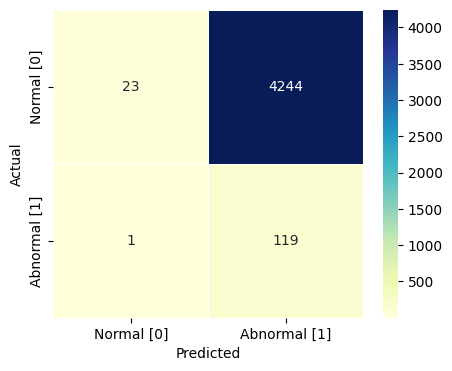

value_for_weight: 0.35000000000000014
offset_for_nomral: 3.2499999999999996
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


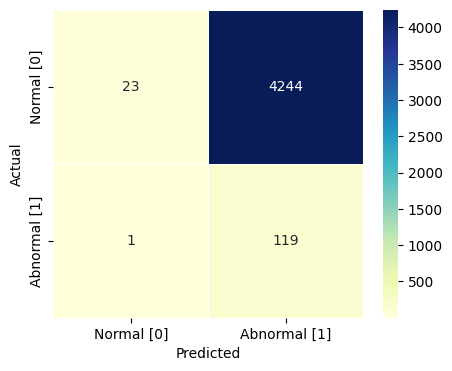

value_for_weight: 0.36250000000000016
offset_for_nomral: 3.187499999999999
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


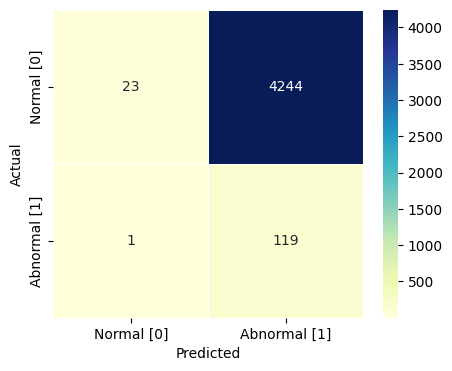

value_for_weight: 0.37500000000000017
offset_for_nomral: 3.124999999999999
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


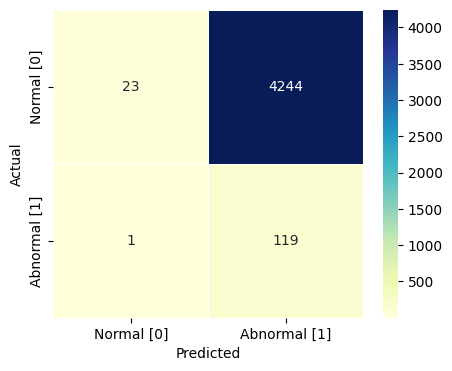

value_for_weight: 0.3875000000000002
offset_for_nomral: 3.062499999999999
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


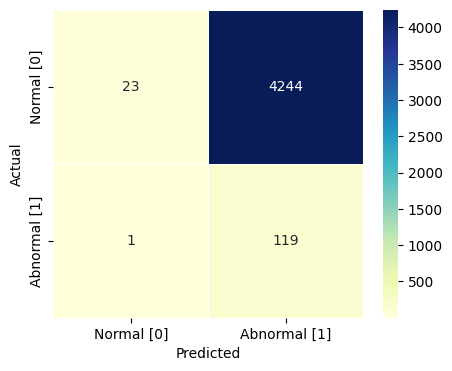

value_for_weight: 0.4000000000000002
offset_for_nomral: 2.999999999999999
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


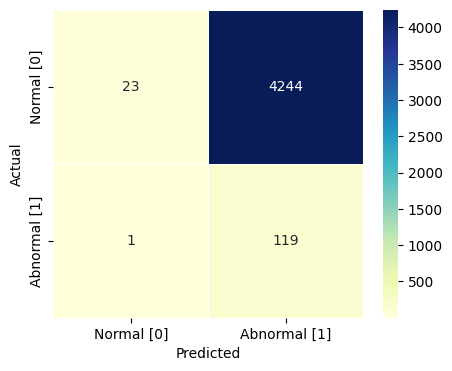

value_for_weight: 0.4125000000000002
offset_for_nomral: 2.937499999999999
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


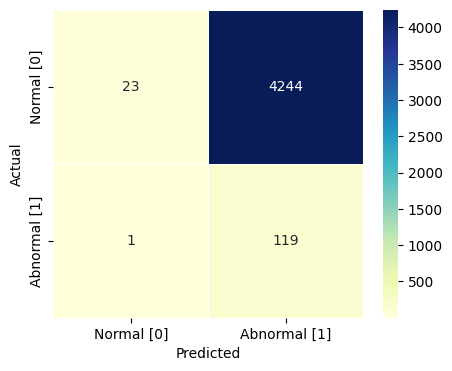

value_for_weight: 0.4250000000000002
offset_for_nomral: 2.8749999999999987
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


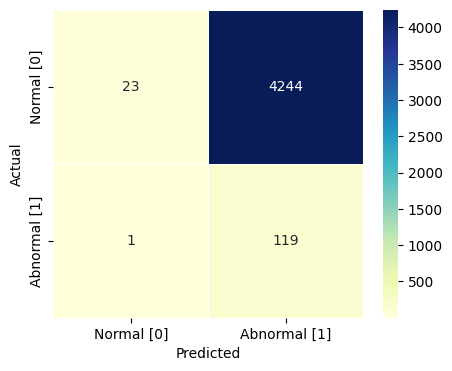

value_for_weight: 0.4375000000000002
offset_for_nomral: 2.812499999999999
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


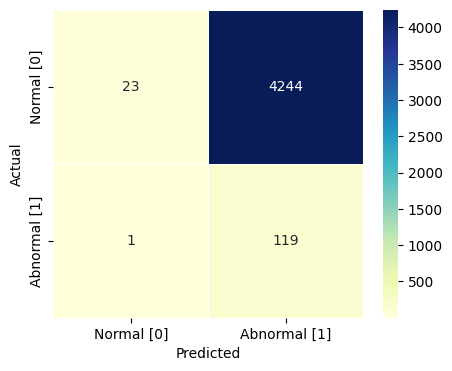

value_for_weight: 0.45000000000000023
offset_for_nomral: 2.749999999999999
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


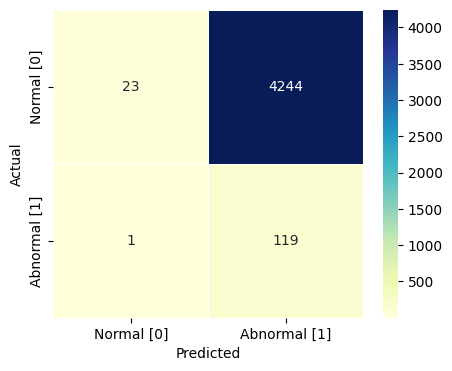

value_for_weight: 0.46250000000000024
offset_for_nomral: 2.6874999999999987
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


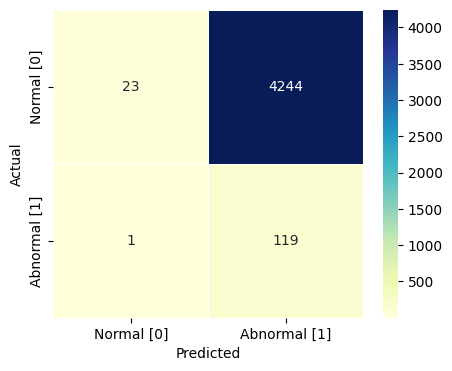

value_for_weight: 0.47500000000000026
offset_for_nomral: 2.6249999999999982
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


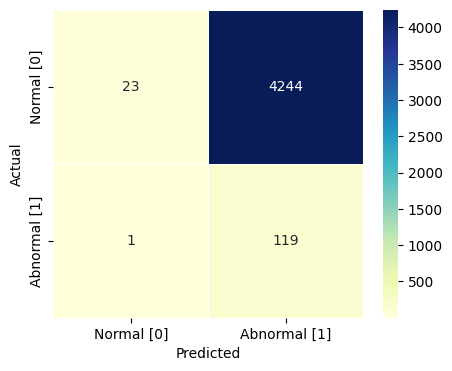

value_for_weight: 0.48750000000000027
offset_for_nomral: 2.5624999999999987
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


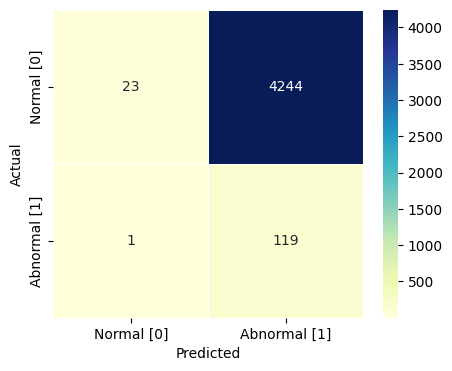

value_for_weight: 0.5000000000000002
offset_for_nomral: 2.499999999999999
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


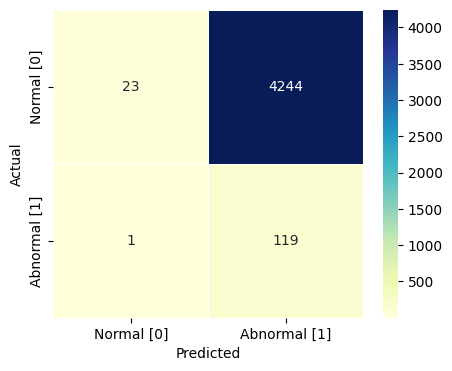

value_for_weight: 0.5125000000000003
offset_for_nomral: 2.4374999999999987
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


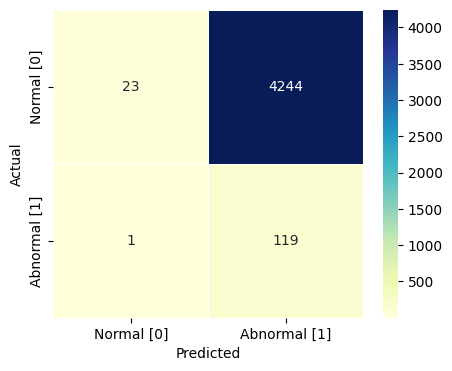

value_for_weight: 0.5250000000000004
offset_for_nomral: 2.3749999999999982
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


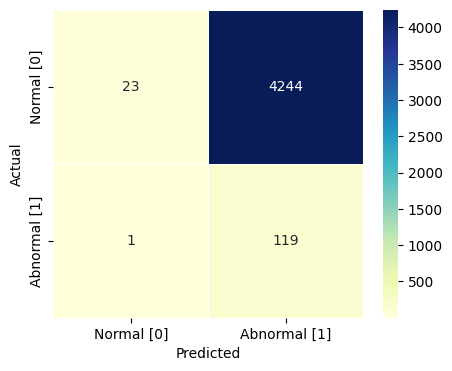

value_for_weight: 0.5375000000000003
offset_for_nomral: 2.3124999999999982
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


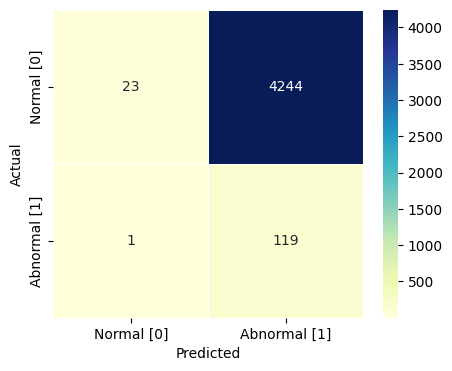

value_for_weight: 0.5500000000000003
offset_for_nomral: 2.2499999999999987
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


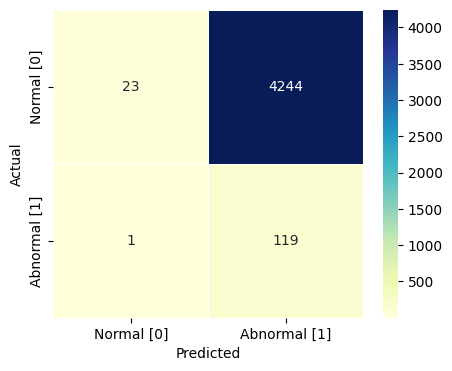

value_for_weight: 0.5625000000000003
offset_for_nomral: 2.1874999999999982
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


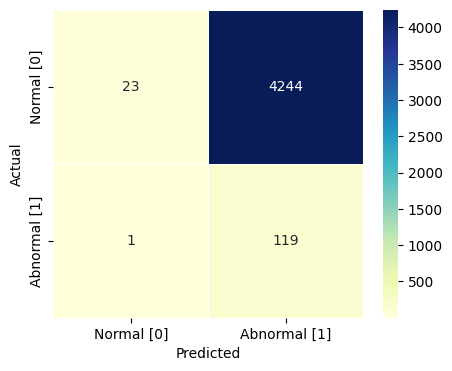

value_for_weight: 0.5750000000000004
offset_for_nomral: 2.1249999999999982
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


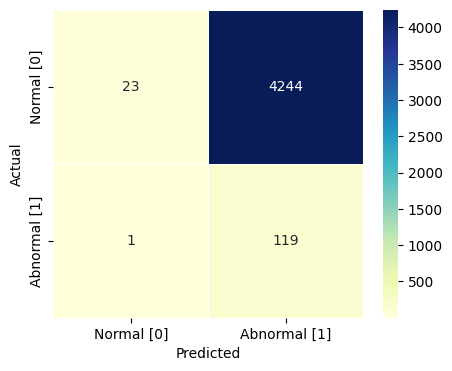

value_for_weight: 0.5875000000000004
offset_for_nomral: 2.0624999999999982
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


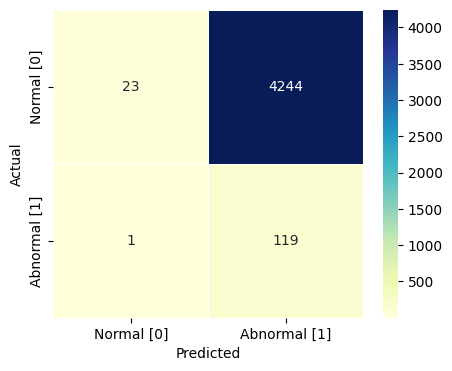

value_for_weight: 0.6000000000000003
offset_for_nomral: 1.9999999999999984
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


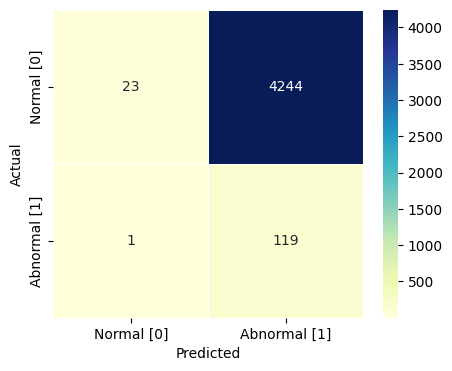

value_for_weight: 0.6125000000000004
offset_for_nomral: 1.9374999999999982
contamination: 0.075
con_mat:
[[  23 4244]
 [   1  119]]
accuracy:  0.03236836106678824
recall:  0.992
precision:  0.027
f1-score:  0.053


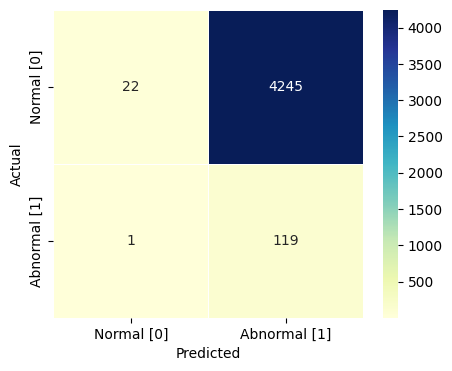

value_for_weight: 0.6250000000000004
offset_for_nomral: 1.8749999999999978
contamination: 0.075
con_mat:
[[  22 4245]
 [   1  119]]
accuracy:  0.03214041486209255
recall:  0.992
precision:  0.027
f1-score:  0.053


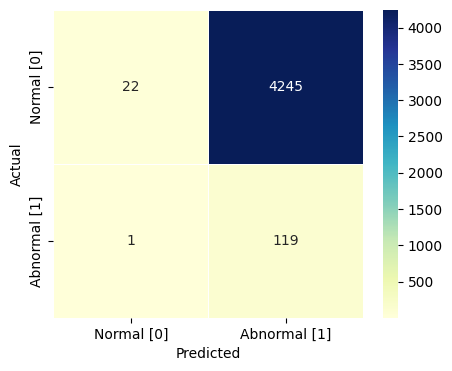

value_for_weight: 0.6375000000000004
offset_for_nomral: 1.812499999999998
contamination: 0.075
con_mat:
[[  22 4245]
 [   1  119]]
accuracy:  0.03214041486209255
recall:  0.992
precision:  0.027
f1-score:  0.053


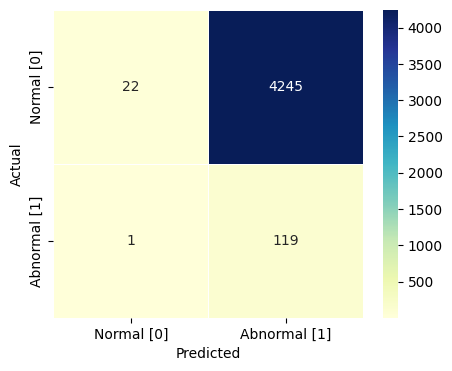

value_for_weight: 0.6500000000000004
offset_for_nomral: 1.7499999999999982
contamination: 0.075
con_mat:
[[  22 4245]
 [   1  119]]
accuracy:  0.03214041486209255
recall:  0.992
precision:  0.027
f1-score:  0.053


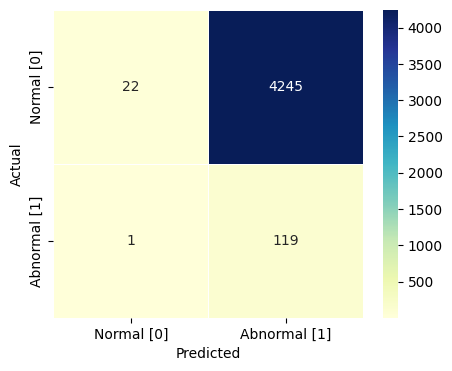

value_for_weight: 0.6625000000000004
offset_for_nomral: 1.6874999999999978
contamination: 0.075
con_mat:
[[  22 4245]
 [   1  119]]
accuracy:  0.03214041486209255
recall:  0.992
precision:  0.027
f1-score:  0.053


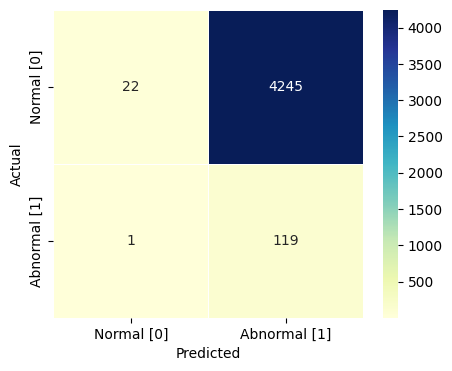

value_for_weight: 0.6750000000000005
offset_for_nomral: 1.6249999999999976
contamination: 0.075
con_mat:
[[  22 4245]
 [   1  119]]
accuracy:  0.03214041486209255
recall:  0.992
precision:  0.027
f1-score:  0.053


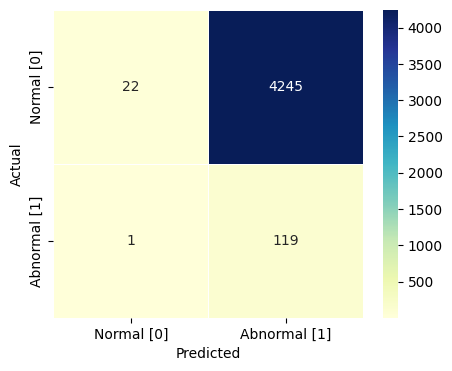

value_for_weight: 0.6875000000000004
offset_for_nomral: 1.5624999999999978
contamination: 0.075
con_mat:
[[  22 4245]
 [   1  119]]
accuracy:  0.03214041486209255
recall:  0.992
precision:  0.027
f1-score:  0.053


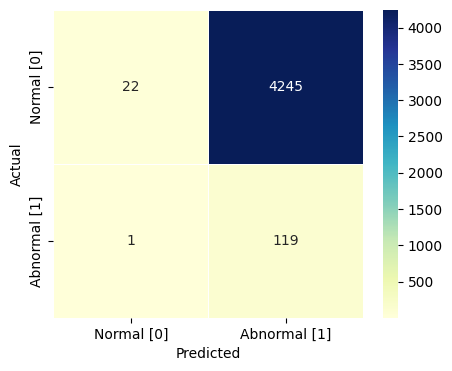

value_for_weight: 0.7000000000000004
offset_for_nomral: 1.499999999999998
contamination: 0.075
con_mat:
[[  22 4245]
 [   1  119]]
accuracy:  0.03214041486209255
recall:  0.992
precision:  0.027
f1-score:  0.053


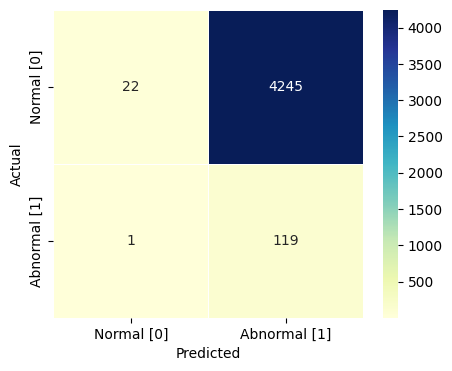

value_for_weight: 0.7125000000000004
offset_for_nomral: 1.4374999999999982
contamination: 0.075
con_mat:
[[  22 4245]
 [   1  119]]
accuracy:  0.03214041486209255
recall:  0.992
precision:  0.027
f1-score:  0.053


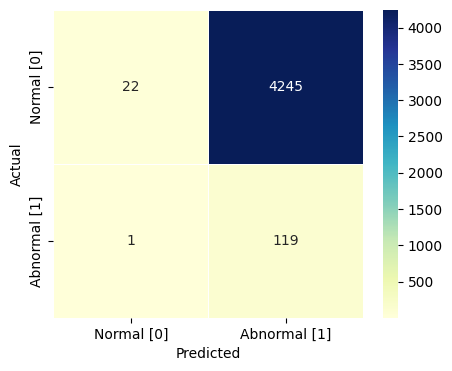

value_for_weight: 0.7250000000000005
offset_for_nomral: 1.3749999999999973
contamination: 0.075
con_mat:
[[  22 4245]
 [   1  119]]
accuracy:  0.03214041486209255
recall:  0.992
precision:  0.027
f1-score:  0.053


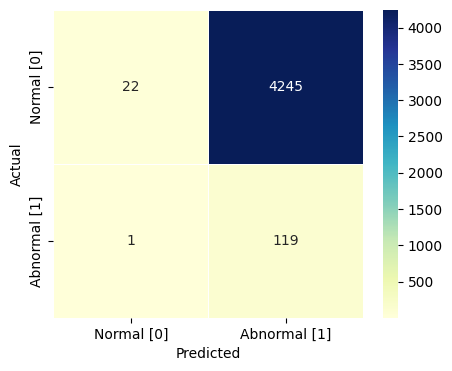

value_for_weight: 0.7375000000000005
offset_for_nomral: 1.3124999999999976
contamination: 0.075
con_mat:
[[  22 4245]
 [   1  119]]
accuracy:  0.03214041486209255
recall:  0.992
precision:  0.027
f1-score:  0.053


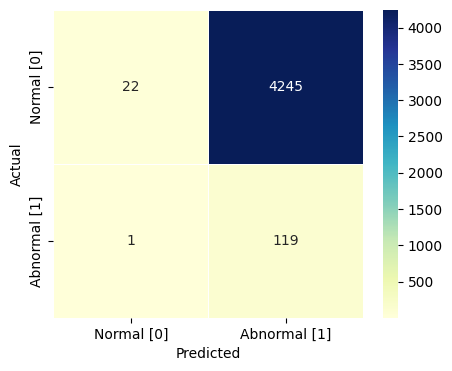

value_for_weight: 0.7500000000000004
offset_for_nomral: 1.2499999999999978
contamination: 0.075
con_mat:
[[  22 4245]
 [   1  119]]
accuracy:  0.03214041486209255
recall:  0.992
precision:  0.027
f1-score:  0.053


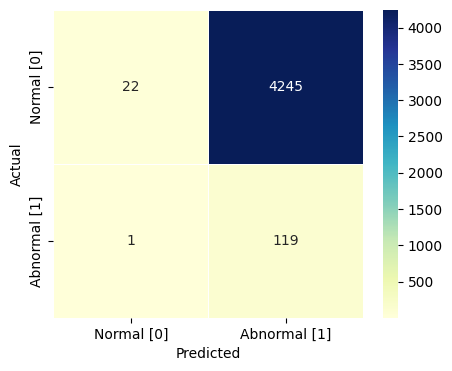

value_for_weight: 0.7625000000000004
offset_for_nomral: 1.187499999999998
contamination: 0.075
con_mat:
[[  22 4245]
 [   1  119]]
accuracy:  0.03214041486209255
recall:  0.992
precision:  0.027
f1-score:  0.053


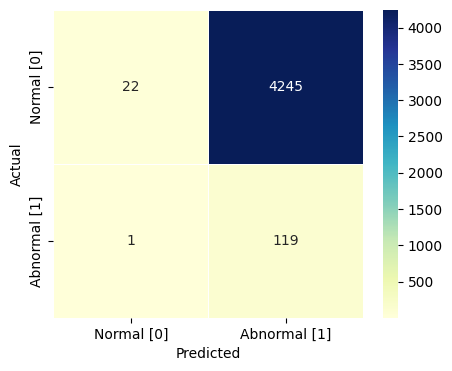

value_for_weight: 0.7750000000000006
offset_for_nomral: 1.1249999999999971
contamination: 0.075
con_mat:
[[  22 4245]
 [   1  119]]
accuracy:  0.03214041486209255
recall:  0.992
precision:  0.027
f1-score:  0.053


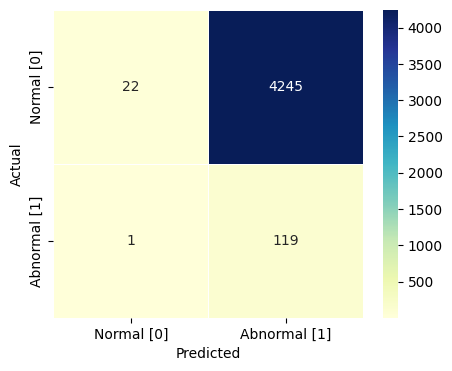

value_for_weight: 0.7875000000000005
offset_for_nomral: 1.0624999999999973
contamination: 0.075
con_mat:
[[  22 4245]
 [   1  119]]
accuracy:  0.03214041486209255
recall:  0.992
precision:  0.027
f1-score:  0.053


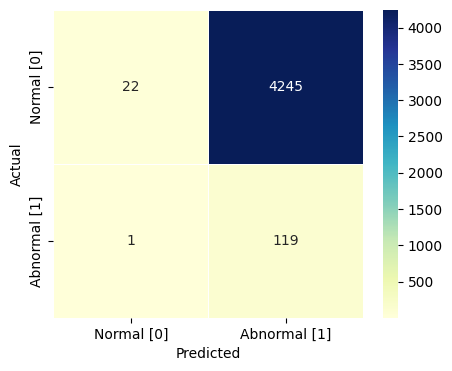

value_for_weight: 0.8000000000000005
offset_for_nomral: 0.9999999999999976
contamination: 0.075
con_mat:
[[  22 4245]
 [   1  119]]
accuracy:  0.03214041486209255
recall:  0.992
precision:  0.027
f1-score:  0.053


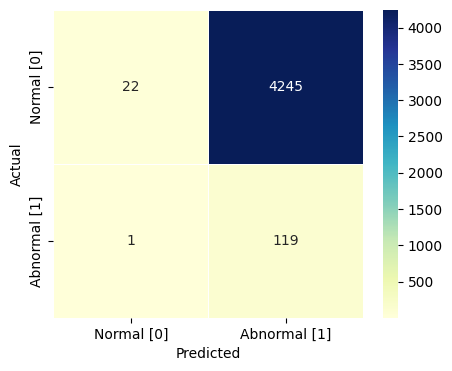

value_for_weight: 0.8125000000000004
offset_for_nomral: 0.9374999999999978
contamination: 0.075
con_mat:
[[  22 4245]
 [   1  119]]
accuracy:  0.03214041486209255
recall:  0.992
precision:  0.027
f1-score:  0.053


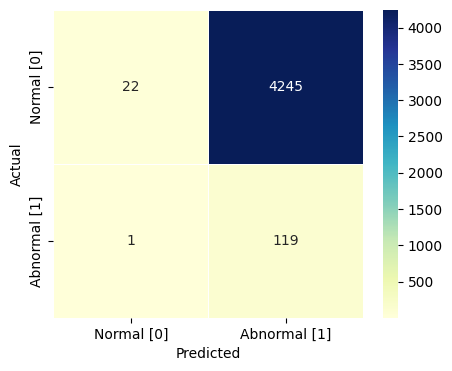

value_for_weight: 0.8250000000000006
offset_for_nomral: 0.8749999999999969
contamination: 0.075
con_mat:
[[  22 4245]
 [   1  119]]
accuracy:  0.03214041486209255
recall:  0.992
precision:  0.027
f1-score:  0.053


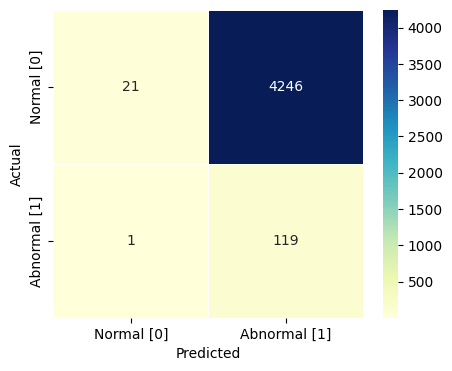

value_for_weight: 0.8375000000000006
offset_for_nomral: 0.8124999999999971
contamination: 0.075
con_mat:
[[  21 4246]
 [   1  119]]
accuracy:  0.03191246865739685
recall:  0.992
precision:  0.027
f1-score:  0.053


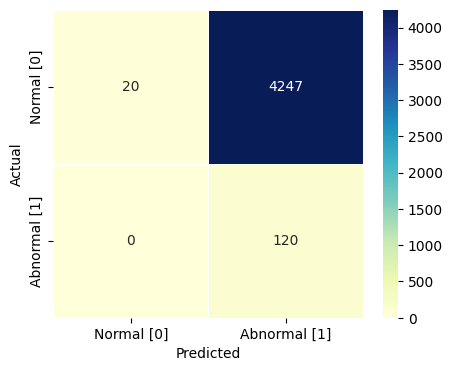

value_for_weight: 0.8500000000000005
offset_for_nomral: 0.7499999999999973
contamination: 0.075
con_mat:
[[  20 4247]
 [   0  120]]
accuracy:  0.03191246865739685
recall:  1.0
precision:  0.027
f1-score:  0.053


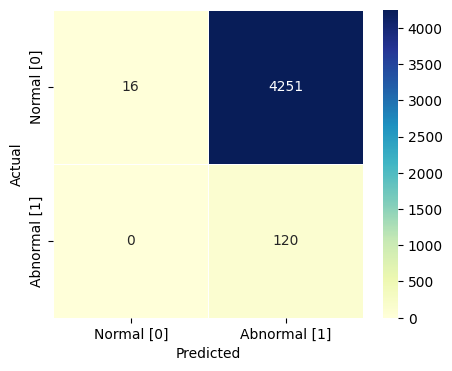

value_for_weight: 0.8625000000000005
offset_for_nomral: 0.6874999999999976
contamination: 0.075
con_mat:
[[  16 4251]
 [   0  120]]
accuracy:  0.031000683838614086
recall:  1.0
precision:  0.027
f1-score:  0.053


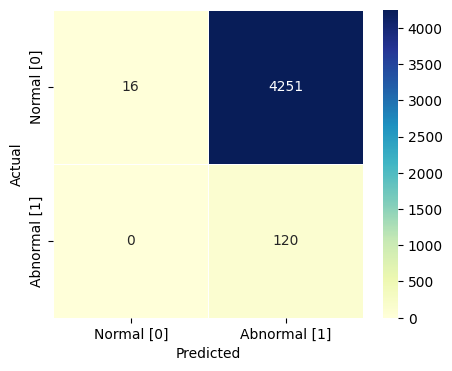

value_for_weight: 0.8750000000000007
offset_for_nomral: 0.6249999999999967
contamination: 0.075
con_mat:
[[  16 4251]
 [   0  120]]
accuracy:  0.031000683838614086
recall:  1.0
precision:  0.027
f1-score:  0.053


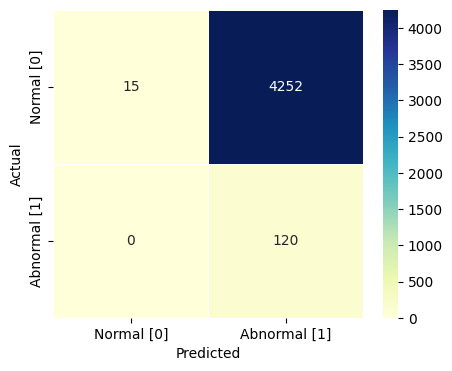

value_for_weight: 0.8875000000000006
offset_for_nomral: 0.5624999999999969
contamination: 0.075
con_mat:
[[  15 4252]
 [   0  120]]
accuracy:  0.030772737633918395
recall:  1.0
precision:  0.027
f1-score:  0.053


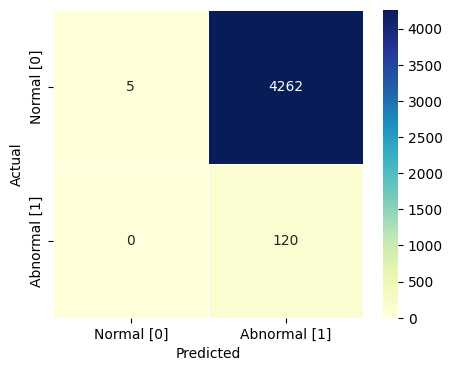

value_for_weight: 0.9000000000000006
offset_for_nomral: 0.4999999999999971
contamination: 0.075
con_mat:
[[   5 4262]
 [   0  120]]
accuracy:  0.028493275586961478
recall:  1.0
precision:  0.027
f1-score:  0.053


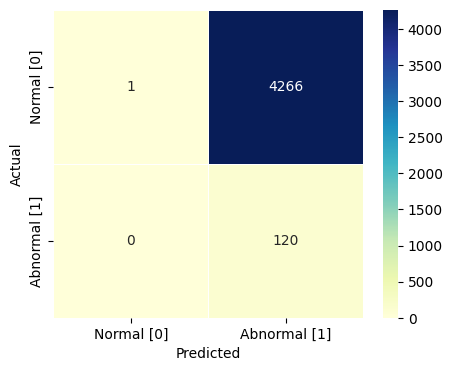

value_for_weight: 0.9125000000000005
offset_for_nomral: 0.43749999999999734
contamination: 0.075
con_mat:
[[   1 4266]
 [   0  120]]
accuracy:  0.02758149076817871
recall:  1.0
precision:  0.027
f1-score:  0.053


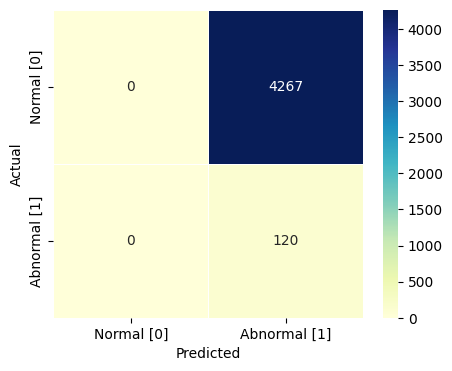

value_for_weight: 0.9250000000000007
offset_for_nomral: 0.37499999999999645
contamination: 0.075
con_mat:
[[   0 4267]
 [   0  120]]
accuracy:  0.027353544563483018
recall:  1.0
precision:  0.027
f1-score:  0.053


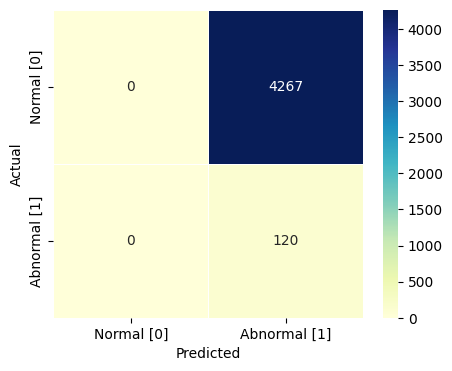

value_for_weight: 0.9375000000000007
offset_for_nomral: 0.31249999999999667
contamination: 0.075
con_mat:
[[   0 4267]
 [   0  120]]
accuracy:  0.027353544563483018
recall:  1.0
precision:  0.027
f1-score:  0.053


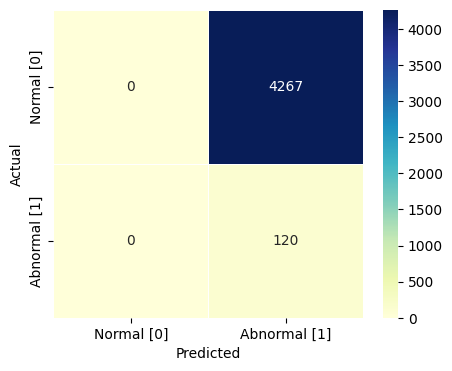

value_for_weight: 0.9500000000000006
offset_for_nomral: 0.2499999999999969
contamination: 0.075
con_mat:
[[   0 4267]
 [   0  120]]
accuracy:  0.027353544563483018
recall:  1.0
precision:  0.027
f1-score:  0.053


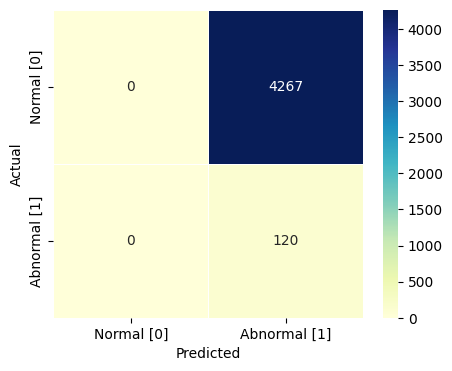

value_for_weight: 0.9625000000000006
offset_for_nomral: 0.1874999999999971
contamination: 0.075
con_mat:
[[   0 4267]
 [   0  120]]
accuracy:  0.027353544563483018
recall:  1.0
precision:  0.027
f1-score:  0.053


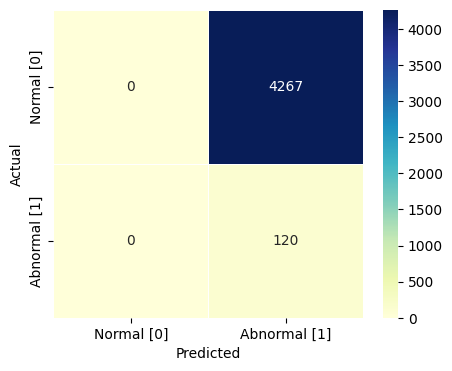

value_for_weight: 0.9750000000000008
offset_for_nomral: 0.12499999999999623
contamination: 0.075
con_mat:
[[   0 4267]
 [   0  120]]
accuracy:  0.027353544563483018
recall:  1.0
precision:  0.027
f1-score:  0.053


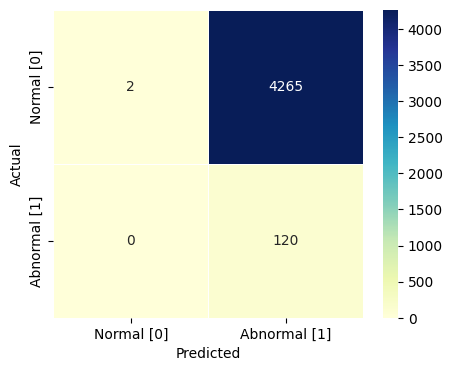

value_for_weight: 0.9875000000000007
offset_for_nomral: 0.06249999999999645
contamination: 0.075
con_mat:
[[   2 4265]
 [   0  120]]
accuracy:  0.027809436972874402
recall:  1.0
precision:  0.027
f1-score:  0.053


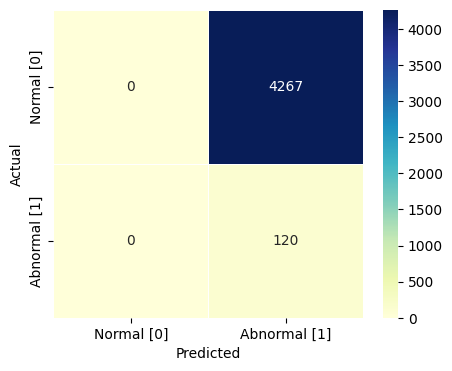

value_for_weight: 1.0000000000000007
offset_for_nomral: -3.3306690738754696e-15
contamination: 0.075
con_mat:
[[   0 4267]
 [   0  120]]
accuracy:  0.027353544563483018
recall:  1.0
precision:  0.027
f1-score:  0.053


In [ ]:
normal_normal_list =[]
spam_spam_list = []
wieght_list = []
normal_weight_list = []

for i in range(len(value_for_weights)):
  value_for_weight = value_for_weights[i]
  wieght_list.append(value_for_weight)
  #offset_for_nomral = 1
  offset_for_nomral = (1 - value_for_weight)*5  # -2.5이 갓
  #offset_for_nomral = 1 - value_for_weight

  y = df_sembed_for_if['class']
  X = df_sembed_for_if.drop(columns=['class'])

  # 데이터 분할
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=96, shuffle=True)
  train_dataset = X_train.copy()
  train_dataset['class'] = y_train

  weight_list_for_novelty = []
  weight_list_for_normal = []

  # 각 열마다 가중치를 구한다 (이상치용)
  for col in train_dataset.drop("class", axis = 1).describe().columns:
    df_median = train_dataset.groupby('class').agg(median=(col, 'median'))
    weight_list_for_novelty.append((df_median['median'][0] - df_median['median'][1]) * value_for_weight)

  # 각 열마다 가중치를 구한다 (정상치용)
  for col in train_dataset.drop("class", axis = 1).describe().columns:
    df_median = train_dataset.groupby('class').agg(median=(col, 'median'))
    weight_list_for_normal.append((df_median['median'][0] - df_median['median'][1]) * offset_for_nomral)

  # 이상 치에 각 열마다 구한 가중치를 반영
  column_index = train_dataset.drop("class", axis = 1).describe().columns
  for col in range(len(column_index)):
    train_dataset[column_index[col]] = np.where(train_dataset['class'] == 1, train_dataset[column_index[col]] * weight_list_for_novelty[col], train_dataset[column_index[col]])

  # 정상치에 각 열마다 구한 가중치를 반영
  column_index = train_dataset.drop("class", axis = 1).describe().columns
  for col in range(len(column_index)):
    train_dataset[column_index[col]] = np.where(train_dataset['class'] == 0, train_dataset[column_index[col]] * weight_list_for_normal[col], train_dataset[column_index[col]])

  X_train = train_dataset.drop('class', axis = 1).copy()
  # min_max_normalization을 train data적용
  for col in X_train.columns:
      X_train[col] = min_max_normalization(X_train[col])

  for col in X_test.columns:
      X_test[col] = min_max_normalization(X_test[col])
  X_train = X_train.reset_index(drop=True)


  from sklearn.neighbors import LocalOutlierFactor
  contamination = 0.075 #0.0226
  LOF = LocalOutlierFactor(contamination=contamination,novelty=True)
  LOF.fit(X_train)

  LOF_train_pred = LOF.predict(X_train)
  LOF_test_pred = LOF.predict(X_test)


  LOF_test_pred = pd.DataFrame(LOF_test_pred)
  LOF_test_pred = LOF_test_pred.replace({-1: 1, 1: 0})

  # Confusion matrix 출력 및 모델 성능 평가
  con_mat = confusion_matrix(y_test, LOF_test_pred)
  fig, axes = plt.subplots(1,1, figsize=(5, 4))

  sns.heatmap(pd.DataFrame(con_mat, columns = ['Predicted', 'Actual']),
              xticklabels=['Normal [0]', 'Abnormal [1]'],
              yticklabels=['Normal [0]', 'Abnormal [1]'],
              annot=True, fmt="d", linewidths=.5, cmap="YlGnBu")
  plt.ylabel('Actual')
  plt.xlabel('Predicted')
  plt.show()
  print("value_for_weight:", value_for_weight)
  print("offset_for_nomral:", offset_for_nomral)
  print("contamination:", contamination)
  print("con_mat:")
  print(con_mat)
  print("accuracy: ", accuracy_score(y_test, LOF_test_pred))
  print("recall: ", round(recall_score(y_test, LOF_test_pred),3))
  print("precision: ", round(precision_score(y_test, LOF_test_pred),3))
  print("f1-score: ", round(f1_score(y_test, LOF_test_pred),3))


### Pricipal Component Analysis with tf-idf and gfiving weight by using mode

In [ ]:
  contamination = 0.045 #0.0226
  from pyod.models.pca import PCA
  PCA = PCA(contamination=contamination)
  PCA.fit(X_train)

  PCA_train_pred = PCA.predict(X_train)
  PCA_test_pred = PCA.predict(X_test)
  y_scores = PCA.decision_function(X_test)

In [ ]:
result = X_test.copy()
result['y_scores'] = y_scores
result['y_test'] = y_test
result['PCA_test_pred'] = PCA_test_pred
result

,x1,x2,x3,x4,x5,y_scores,y_test,PCA_test_pred
9401,-0.009901,-0.023190,0.010723,-0.017785,-0.065343,76.635491,0,0
2206,0.084855,0.013252,0.099950,0.136608,-0.041555,70.520015,0,0
10725,-0.009521,-0.024578,0.008290,-0.016747,-0.065538,76.781047,0,0
6303,-0.004273,-0.039804,0.023312,-0.028696,-0.064201,78.599422,0,0
11225,-0.009824,-0.027404,0.013737,-0.018708,-0.056924,75.372328,0,0
...,...,...,...,...,...,...,...,...
4942,-0.021573,-0.028880,-0.017695,-0.003368,-0.053809,75.762607,0,0
12353,-0.050924,0.042504,-0.049120,0.043738,-0.050879,71.709869,0,0
5099,-0.235340,0.343182,-0.093990,0.086902,0.253669,100.150602,0,0
319,-0.224213,0.404014,0.020956,-0.024923,0.120938,90.782523,0,0


In [ ]:
threshold = 65

# 예측을 이상치와 정상치로 분류
result['PCA_test_pred'] = np.where(result['y_scores'] > threshold, 1, 0)
con_mat = confusion_matrix(result['y_test'], result['PCA_test_pred'])

print(con_mat)

[[ 626 3641]
 [  18  102]]


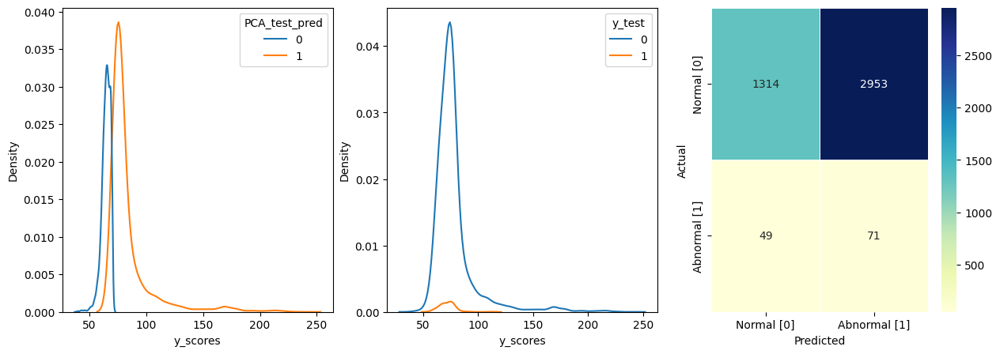

contamination: 0.045
con_mat:
[[1314 2953]
 [  49   71]]
accuracy:  0.31570549350353316
recall:  0.592
precision:  0.023
f1-score:  0.045


In [ ]:
# Confusion matrix 출력 및 모델 성능 평가
con_mat = confusion_matrix(result['y_test'], result['PCA_test_pred'])

fig, axes = plt.subplots(1,3, figsize=(15, 5))
sns.kdeplot(data=result, x=result["y_scores"], hue=result['PCA_test_pred'], ax=axes[0]) #sns.histplot으로 실행하면 램 부족으로 인해 세션 튕김... -> kde plot으로 변경
sns.kdeplot(data=result, x=result["y_scores"], hue=result['y_test'], ax=axes[1])

sns.heatmap(pd.DataFrame(con_mat, columns = ['Predicted', 'Actual']),
              xticklabels=['Normal [0]', 'Abnormal [1]'],
              yticklabels=['Normal [0]', 'Abnormal [1]'],
              annot=True, fmt="d", linewidths=.5, cmap="YlGnBu", ax=axes[2])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

print("contamination:", contamination)
print("con_mat:")
print(con_mat)
print("accuracy: ", accuracy_score(result['y_test'],  result['PCA_test_pred']))
print("recall: ", round(recall_score(result['y_test'],  result['PCA_test_pred']),3))
print("precision: ", round(precision_score(result['y_test'],  result['PCA_test_pred']),3))
print("f1-score: ", round(f1_score(result['y_test'],  result['PCA_test_pred']),3))


# 일단 이상치 모델 돌려보자

를 하기 전에 minority class쪽으로 가중치를 더 주는 작업을 해보자

In [ ]:
from pyod.models.pca import PCA
from sklearn.neighbors import LocalOutlierFactor

### Isolation Forest (가중치를 novelty score에 반영)

In [ ]:
from pyod.models.iforest import IForest
IForest = IForest(contamination=0.2, random_state=96)
IForest.fit(X_train)

IForest(behaviour='old', bootstrap=False, contamination=0.2, max_features=1.0,
    max_samples='auto', n_estimators=100, n_jobs=1, random_state=96,
    verbose=0)

In [ ]:
IForest_train_pred = IForest.predict(X_train)
IForest_test_pred = IForest.predict(X_test)

In [ ]:
y_scores = IForest.decision_function(X_test)

In [ ]:
X_test

,x1,x2,x3,x4,x5
9401,-2.776368,-1.661839,-2.868610,0.387622,0.468445
2206,1.951726,-1.739711,-2.208254,1.538531,-1.334740
10725,-3.080014,-0.885538,-2.572132,0.573590,-1.006019
6303,-2.718030,-1.017511,0.853106,1.446979,1.032539
11225,-2.042443,0.453705,1.533852,0.330977,0.934637
...,...,...,...,...,...
10748,-4.983877,-2.005235,-0.603991,-1.838440,0.633109
5141,-2.528119,-0.886749,-1.570035,0.387700,-0.356144
16899,-0.033229,2.952896,-4.388729,-0.961280,-0.576071
3292,-4.434291,-1.142962,-1.593783,-0.457968,0.376027


In [ ]:
result = X_test.copy()
result['y_scores'] = y_scores
result['y_test'] = y_test
result['IForest_test_pred'] = IForest_test_pred
result

,x1,x2,x3,x4,x5,y_scores,y_test,IForest_test_pred
9401,-2.776368,-1.661839,-2.868610,0.387622,0.468445,-0.043830,0,0
2206,1.951726,-1.739711,-2.208254,1.538531,-1.334740,-0.038244,0,0
10725,-3.080014,-0.885538,-2.572132,0.573590,-1.006019,-0.045676,0,0
6303,-2.718030,-1.017511,0.853106,1.446979,1.032539,-0.067809,0,0
11225,-2.042443,0.453705,1.533852,0.330977,0.934637,-0.085448,0,0
...,...,...,...,...,...,...,...,...
10748,-4.983877,-2.005235,-0.603991,-1.838440,0.633109,-0.006179,0,0
5141,-2.528119,-0.886749,-1.570035,0.387700,-0.356144,-0.094459,0,0
16899,-0.033229,2.952896,-4.388729,-0.961280,-0.576071,0.028635,0,1
3292,-4.434291,-1.142962,-1.593783,-0.457968,0.376027,-0.058635,0,0


In [ ]:
# 0(정상), 1(이상)의 novelty score 각 중위값 및 가중치 도출

df_median = result.groupby('y_test').agg(median=('y_scores', 'median'))
weight = (df_median['median'][0] - df_median['median'][1]) * 10
weight

0.1889059610577118

In [ ]:
result = result.assign(y_scores = np.where(result['y_test'] == 1, result['y_scores']+weight, result['y_scores']))

result

,x1,x2,x3,x4,x5,y_scores,y_test,IForest_test_pred
9401,-2.776368,-1.661839,-2.868610,0.387622,0.468445,-0.043830,0,0
2206,1.951726,-1.739711,-2.208254,1.538531,-1.334740,-0.038244,0,0
10725,-3.080014,-0.885538,-2.572132,0.573590,-1.006019,-0.045676,0,0
6303,-2.718030,-1.017511,0.853106,1.446979,1.032539,-0.067809,0,0
11225,-2.042443,0.453705,1.533852,0.330977,0.934637,-0.085448,0,0
...,...,...,...,...,...,...,...,...
10748,-4.983877,-2.005235,-0.603991,-1.838440,0.633109,-0.006179,0,0
5141,-2.528119,-0.886749,-1.570035,0.387700,-0.356144,-0.094459,0,0
16899,-0.033229,2.952896,-4.388729,-0.961280,-0.576071,0.028635,0,1
3292,-4.434291,-1.142962,-1.593783,-0.457968,0.376027,-0.058635,0,0


<Axes: xlabel='y_scores', ylabel='Count'>

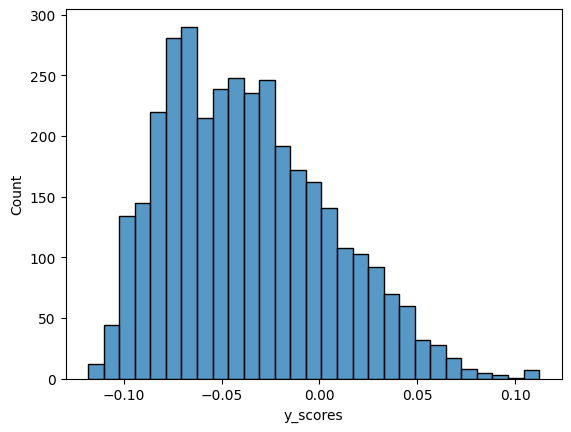

In [ ]:
# 가중치가 반영되지 않은 전체 히스토그램
sns.histplot(result["y_scores"])

<Axes: xlabel='y_scores', ylabel='Count'>

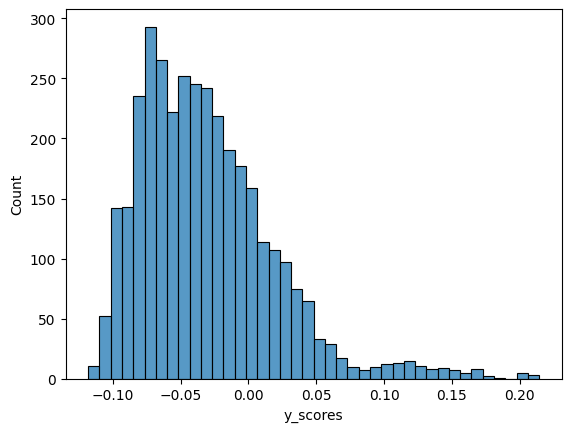

In [ ]:
# 가중치가 반영된 전체 히스토그램
sns.histplot(result["y_scores"])

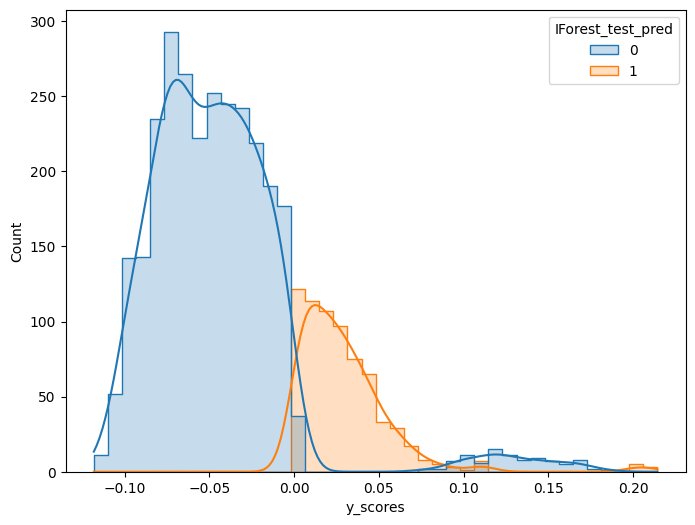

In [ ]:
plt.figure(figsize=(8, 6))
sns.histplot(data=result, x=result["y_scores"], hue='IForest_test_pred', kde=True, element="step", common_norm=False)
plt.show()

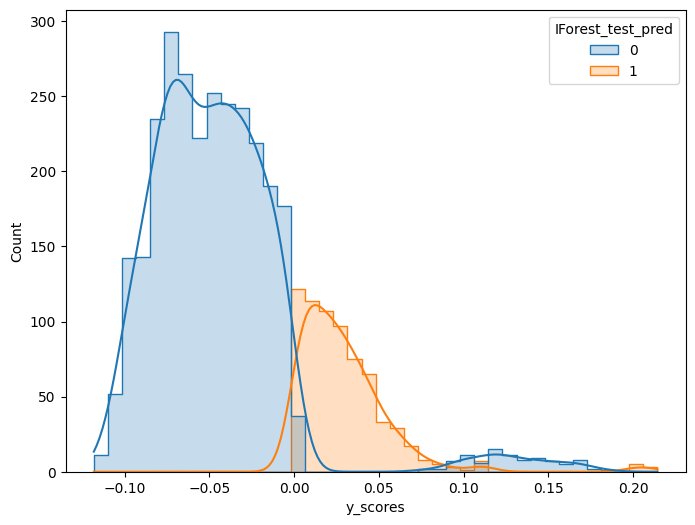

In [ ]:
plt.figure(figsize=(8, 6))
sns.histplot(data=result, x=result["y_scores"], hue='IForest_test_pred', kde=True, element="step", common_norm=False)
plt.show()

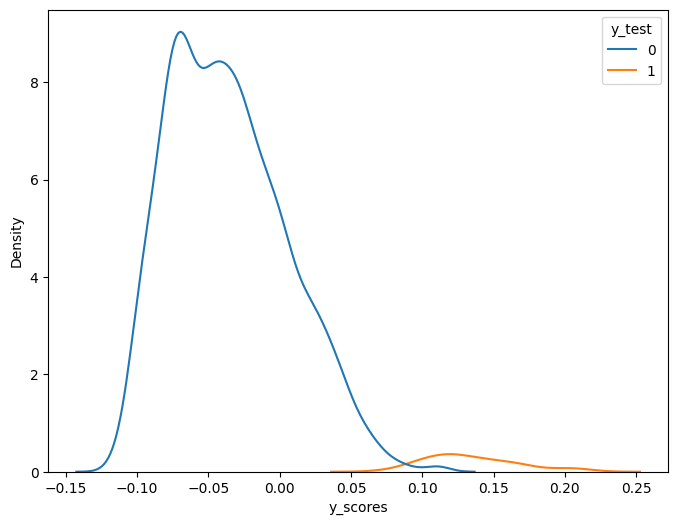

In [ ]:
# 가중치가 반영된 히스토그램
plt.figure(figsize=(8, 6))
sns.kdeplot(data=result, x=result["y_scores"], hue = 'y_test')
plt.show()

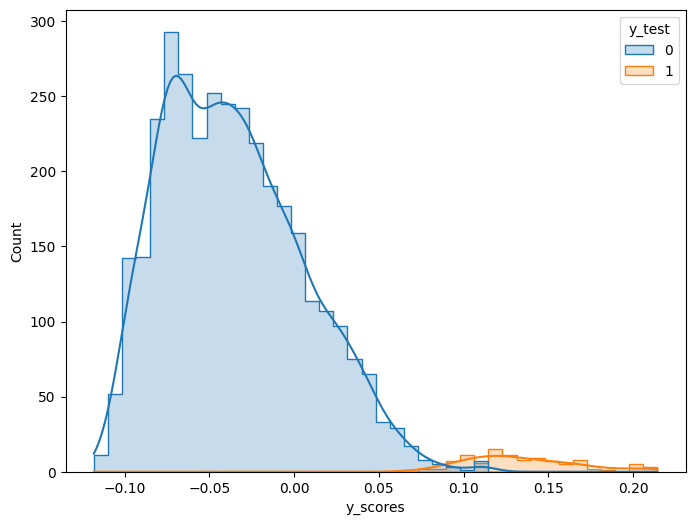

In [ ]:
# 가중치가 반영된 히스토그램
plt.figure(figsize=(8, 6))
sns.histplot(data=result, x = result["y_scores"], hue='y_test', kde=True, element="step", common_norm=False)
plt.show()

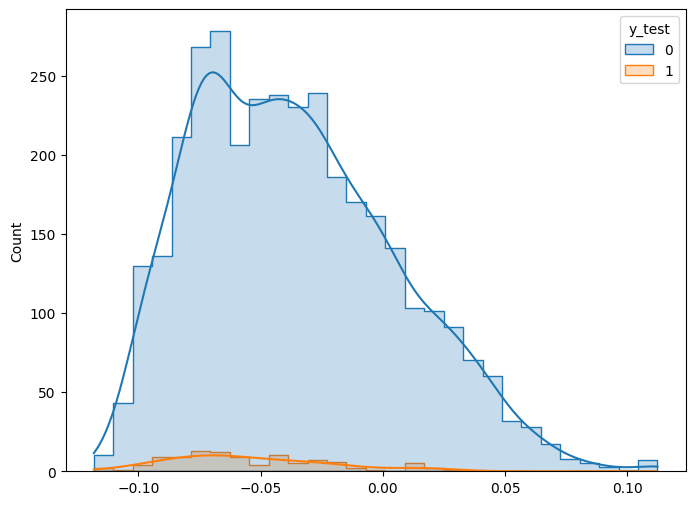

In [ ]:
# 가중치가 반영되지 않은 히스토그램
plt.figure(figsize=(8, 6))
sns.histplot(data=result, x = y_scores, hue='y_test', kde=True, element="step", common_norm=False)
plt.show()

In [ ]:
# 임계값 설정
threshold = 0.0

# 예측을 이상치와 정상치로 분류
result['IForest_test_pred'] = np.where(result['y_scores'] > threshold, 1, 0)



In [ ]:
IForest_test_pred

array([0, 0, 0, ..., 1, 0, 0])

accuracy:  0.7786324786324786
recall:  0.078
precision:  0.012
f1-score:  0.02


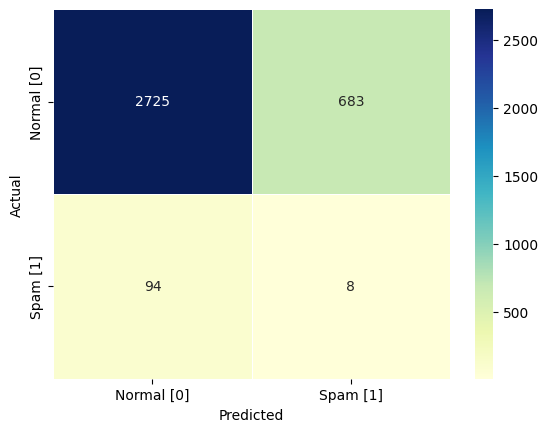

In [ ]:
# <가중치 '미반영'>
# Confusion matrix 출력 및 모델 성능 평가
con_mat = confusion_matrix(y_test, IForest_test_pred)

sns.heatmap(pd.DataFrame(con_mat, columns = ['Predicted', 'Actual']),
            xticklabels=['Normal [0]', 'Spam [1]'],
            yticklabels=['Normal [0]', 'Spam [1]'],
            annot=True, fmt="d", linewidths=.5, cmap="YlGnBu")
plt.ylabel('Actual')
plt.xlabel('Predicted')

print("accuracy: ", accuracy_score(y_test, IForest_test_pred))
print("recall: ", round(recall_score(y_test, IForest_test_pred),3))
print("precision: ", round(precision_score(y_test, IForest_test_pred),3))
print("f1-score: ", round(f1_score(y_test, IForest_test_pred),3))

가중치를 반영했더니 성능이 좋아짐 ㅎㅎ

accuracy:  0.7786324786324786
recall:  0.078
precision:  0.012
f1-score:  0.02


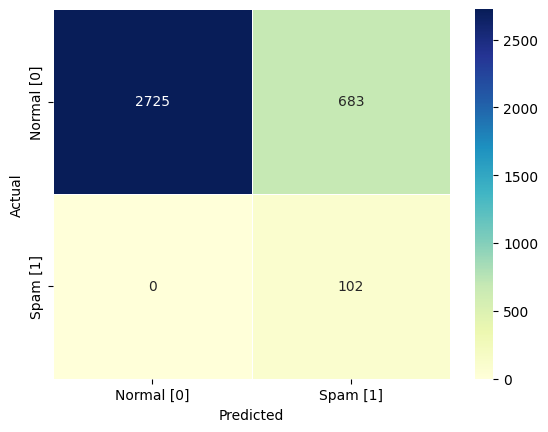

In [ ]:
#<가중치 '반영'>
# Confusion matrix 출력 및 모델 성능 평가
con_mat = confusion_matrix(result['y_test'], result['IForest_test_pred'])

sns.heatmap(pd.DataFrame(con_mat, columns = ['Predicted', 'Actual']),
            xticklabels=['Normal [0]', 'Spam [1]'],
            yticklabels=['Normal [0]', 'Spam [1]'],
            annot=True, fmt="d", linewidths=.5, cmap="YlGnBu")
plt.ylabel('Actual')
plt.xlabel('Predicted')

print("accuracy: ", accuracy_score(y_test, IForest_test_pred))
print("recall: ", round(recall_score(y_test, IForest_test_pred),3))
print("precision: ", round(precision_score(y_test, IForest_test_pred),3))
print("f1-score: ", round(f1_score(y_test, IForest_test_pred),3))

근데 이렇게 하면, 새로운 관측치를 예측할 때, 가중치를 반영할 수가 없는거 아님?

### Isolation Forest (가중치를 처음부터 데이터셋에 반영)

In [ ]:
df_sembed_for_if = df_sembed.copy()
df_sembed_for_if

,x1,x2,x3,x4,x5,class
0,-2.432793,-1.064233,0.325891,0.627945,1.874270,0
1,3.228735,-1.523905,-3.104289,3.351951,1.411579,0
2,-0.909669,-0.188513,-0.090289,-0.812477,-2.016340,0
3,4.521215,-0.468884,0.881497,0.842684,1.744189,0
4,0.626588,-1.115061,-0.939668,2.049380,1.075784,0
...,...,...,...,...,...,...
17542,2.258256,3.348021,0.705742,-0.291575,-1.785178,0
17543,0.176525,2.658218,-4.732656,-0.888078,-0.234195,0
17544,1.036941,5.611968,0.998213,-0.309933,-0.608456,0
17545,1.951383,5.602090,0.912991,-0.254790,0.256818,0


In [ ]:
df_sembed_for_if.describe()

,x1,x2,x3,x4,x5,class
count,1.754700e+04,1.754700e+04,1.754700e+04,1.754700e+04,1.754700e+04,17547.000000
mean,-7.722006e-07,1.669623e-07,7.130681e-08,3.026192e-07,-3.456642e-08,0.023822
std,2.487641e+00,2.106676e+00,1.765578e+00,1.676032e+00,1.456282e+00,0.152498
min,-6.043435e+00,-5.959841e+00,-5.460041e+00,-5.365532e+00,-5.026420e+00,0.000000
25%,-1.908002e+00,-1.282142e+00,-1.237956e+00,-1.110738e+00,-9.806437e-01,0.000000
50%,-7.222849e-02,-3.930680e-01,-2.359297e-02,-1.013560e-01,-3.836746e-02,0.000000
75%,1.825167e+00,8.691668e-01,1.201009e+00,1.008426e+00,9.749823e-01,0.000000
max,6.899436e+00,7.100269e+00,5.972018e+00,6.375112e+00,5.146387e+00,1.000000


In [ ]:
# 각 열마다 가중치를 구한다
weight_list = []
for col in df_sembed_for_if.drop("class", axis = 1).describe().columns:
  df_median = df_sembed_for_if.groupby('class').agg(median=(col, 'median'))
  value_for_weight = 10
  weight_list.append((df_median['median'][0] - df_median['median'][1]) * value_for_weight)

weight_list

[-9.982743859291077,
 -3.5165858268737793,
 1.3415013253688812,
 -8.630539774894714,
 -6.046574711799622]

In [ ]:
# 가중치 반영 전
df_sembed_for_if[df_sembed_for_if['class'] == 1].head(10)

,x1,x2,x3,x4,x5,class
28,4.162220,0.293860,0.675009,0.803371,-0.130775,1
191,1.867233,-0.308250,1.771197,0.469042,0.191298,1
247,4.753463,-2.028888,2.457818,-1.222657,-0.809173,1
341,2.919220,-0.783464,-2.279834,0.185778,1.050851,1
413,-1.047630,-0.666017,-1.928100,0.680204,0.895955,1
414,1.613613,-0.309403,2.169109,1.715069,1.891288,1
488,3.539549,-1.887485,1.249882,-0.907151,-0.437138,1
669,3.574897,-1.810865,-0.754443,-0.916487,-0.358224,1
805,1.345802,-0.147374,-0.829172,1.623840,2.481790,1
830,3.074715,0.562661,0.480309,1.475695,1.530165,1


In [ ]:
# 이상치에 각 열마다 구한 가중치를 반영하고 결과 확인
column_index = df_sembed_for_if.drop("class", axis = 1).describe().columns
for col in range(len(column_index)):
  df_sembed_for_if[column_index[col]] = np.where(df_sembed_for_if['class'] == 1, df_sembed_for_if[column_index[col]] * weight_list[col], df_sembed_for_if[column_index[col]])

df_sembed_for_if[df_sembed_for_if['class'] == 1].head(10)

,x1,x2,x3,x4,x5,class
28,-41.550381,-1.033385,0.905525,-6.933527,0.790739,1
191,-18.640112,1.083988,2.376064,-4.048088,-1.156697,1
247,-47.452606,7.134760,3.297166,10.552192,4.892726,1
341,-29.141830,2.755120,-3.058401,-1.603360,-6.354049,1
413,10.458221,2.342106,-2.586548,-5.870526,-5.417458,1
414,-16.108288,1.088043,2.909863,-14.801970,-11.435811,1
488,-35.334415,6.637505,1.676718,7.829202,2.643185,1
669,-35.687286,6.368063,-1.012086,7.909776,2.166028,1
805,-13.434796,0.518254,-1.112335,-14.014616,-15.006329,1
830,-30.694096,-1.978644,0.644335,-12.736043,-9.252257,1


In [ ]:
# 종속 변수와 독립 변수 설정
y = df_sembed_for_if['class']
X = df_sembed_for_if.drop(columns=['class'])

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=96, shuffle=True)

In [ ]:
print('X_train shape : ', X_train.shape)
print('X_test shape : ', X_test.shape)
print('y_train shape : ', y_train.shape)
print('y_test shape : ', y_test.shape)

X_train shape :  (12282, 5)
X_test shape :  (5265, 5)
y_train shape :  (12282,)
y_test shape :  (5265,)


In [ ]:
from pyod.models.pca import PCA
from sklearn.neighbors import LocalOutlierFactor

In [ ]:
from pyod.models.iforest import IForest
IForest = IForest(contamination=0.2, random_state=96)
IForest.fit(X_train)

IForest(behaviour='old', bootstrap=False, contamination=0.2, max_features=1.0,
    max_samples='auto', n_estimators=100, n_jobs=1, random_state=96,
    verbose=0)

In [ ]:
IForest_train_pred = IForest.predict(X_train)
IForest_test_pred = IForest.predict(X_test)

In [ ]:
y_scores = IForest.decision_function(X_test)

In [ ]:
X_test

,x1,x2,x3,x4,x5
9401,-2.776368,-1.661839,-2.868610,0.387622,0.468445
2206,1.951726,-1.739711,-2.208254,1.538531,-1.334740
10725,-3.080014,-0.885538,-2.572132,0.573590,-1.006019
6303,-2.718030,-1.017511,0.853106,1.446979,1.032539
11225,-2.042443,0.453705,1.533852,0.330977,0.934637
...,...,...,...,...,...
5651,2.964766,-3.409959,0.085891,-2.605946,-1.878771
5142,3.736532,1.055680,0.861497,1.915389,1.152628
15699,1.252495,-0.449358,-0.417420,1.086617,2.338320
555,-1.130392,0.045289,-2.294255,0.433277,-0.891939


In [ ]:
result = X_test.copy()
result['y_scores'] = y_scores
result['y_test'] = y_test
result['IForest_test_pred'] = IForest_test_pred

result

,x1,x2,x3,x4,x5,y_scores,y_test,IForest_test_pred
9401,-2.776368,-1.661839,-2.868610,0.387622,0.468445,-0.036727,0,0
2206,1.951726,-1.739711,-2.208254,1.538531,-1.334740,-0.016491,0,0
10725,-3.080014,-0.885538,-2.572132,0.573590,-1.006019,-0.055826,0,0
6303,-2.718030,-1.017511,0.853106,1.446979,1.032539,-0.061043,0,0
11225,-2.042443,0.453705,1.533852,0.330977,0.934637,-0.079682,0,0
...,...,...,...,...,...,...,...,...
5651,2.964766,-3.409959,0.085891,-2.605946,-1.878771,0.005419,0,1
5142,3.736532,1.055680,0.861497,1.915389,1.152628,-0.031002,0,0
15699,1.252495,-0.449358,-0.417420,1.086617,2.338320,-0.051310,0,0
555,-1.130392,0.045289,-2.294255,0.433277,-0.891939,-0.064194,0,0


<Axes: xlabel='y_scores', ylabel='Count'>

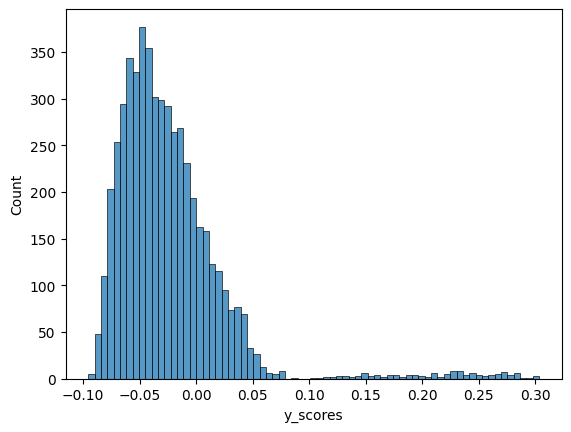

In [ ]:
sns.histplot(result['y_scores'])

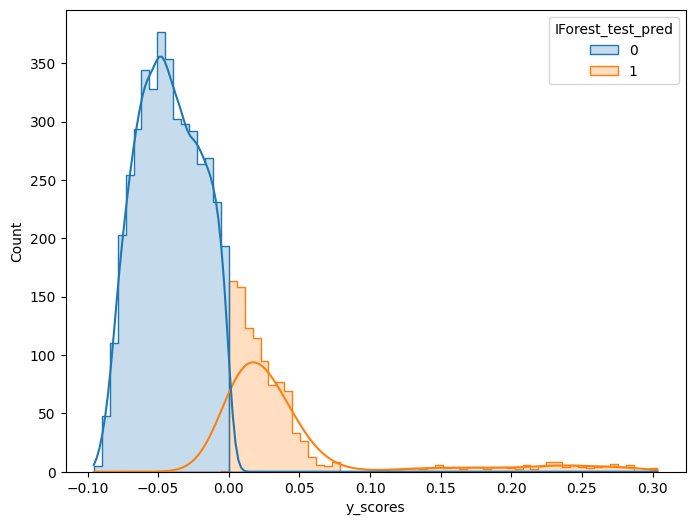

In [ ]:
plt.figure(figsize=(8, 6))
sns.histplot(data=result, x="y_scores", hue='IForest_test_pred', kde=True, element="step", common_norm=False)
plt.show()

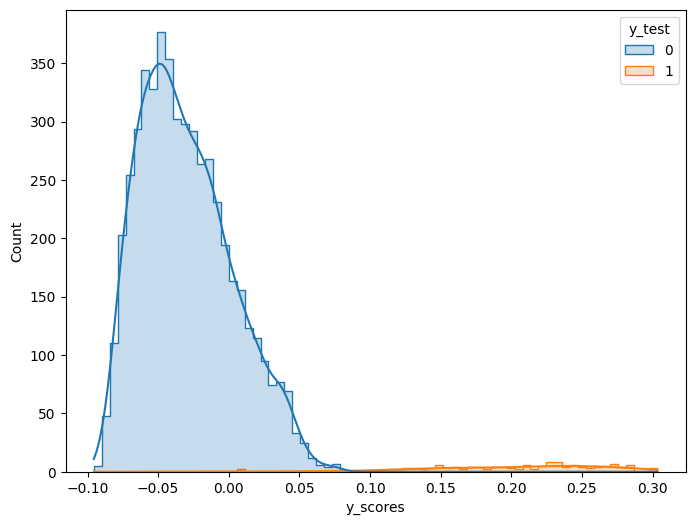

In [ ]:
plt.figure(figsize=(8, 6))
sns.histplot(data=result, x = result["y_scores"], hue='y_test', kde=True, element="step", common_norm=False)
plt.show()

In [ ]:
# <가중치 '미반영'>
# Confusion matrix 출력 및 모델 성능 평가
con_mat = confusion_matrix(result['y_test'], result['IForest_test_pred'])

sns.heatmap(pd.DataFrame(con_mat, columns = ['Predicted', 'Actual']),
            xticklabels=['Normal [0]', 'Spam [1]'],
            yticklabels=['Normal [0]', 'Spam [1]'],
            annot=True, fmt="d", linewidths=.5, cmap="YlGnBu")
plt.ylabel('Actual')
plt.xlabel('Predicted')

print("accuracy: ", accuracy_score(y_test, IForest_test_pred))
print("recall: ", round(recall_score(y_test, IForest_test_pred),3))
print("precision: ", round(precision_score(y_test, IForest_test_pred),3))
print("f1-score: ", round(f1_score(y_test, IForest_test_pred),3))

NameError: ignored

가중치를 반영했더니 성능이 좋아짐 ㅎㅎ

근데 이렇게 하면, 새로운 관측치를 예측할 때, 가중치를 반영할 수가 없는거 아님?

### Isolation Forest (각 차원에 나올 수 있는 범위 내에서 가중치 조정) 과정 설명

각 임베딩 벡터(차원, 열)마다 나올 수 있는 값의 범위가 있다.
가중치 반영시 각 벡터의 값 범위를 넘어버리면 과적합의 문제가 있지 않은가?
새로운 데이터는 각 벡터에서 나올 수 있는 일정 벡터 내의 값을 가짐
그러므로, 테스트 셋에서 잘 나올지라도, 새로운 데이터셋에서는 예측력이 떨어질 수밖에 없음

학습 데이터셋에만 가중치를 적용하고, 이로 학습한 모델을 테스트 데이터셋에 적용하여 성능을 평가

가중치를 줄 데이터 셋을 따로 만들기 위해 데이터프레임 복사함

In [ ]:
df_sembed_for_if = df_sembed.copy()
df_sembed_for_if

,x1,x2,x3,x4,x5,class
0,1.544017,-2.146519,0.122864,-0.732365,-0.144601,0
1,1.441676,-3.007048,-0.645857,0.671026,-0.994955,0
2,-4.061234,0.283042,-0.195230,-1.750255,-0.066052,0
3,-4.100071,-0.093282,2.457932,-0.577881,0.106324,0
4,-3.321541,0.260768,-0.711876,-1.213880,0.067450,0
...,...,...,...,...,...,...
17542,-3.917059,-0.327827,-0.826328,0.940763,1.125883,0
17543,-0.130938,3.638014,1.235715,-1.121292,-1.701917,0
17544,-3.112844,1.878677,-0.061032,1.209846,0.088521,0
17545,-2.907064,0.510233,-3.020213,0.808888,0.060733,0


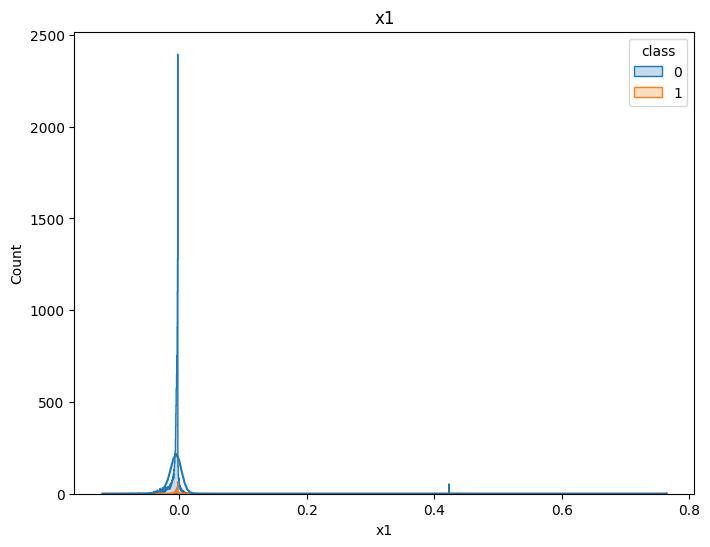

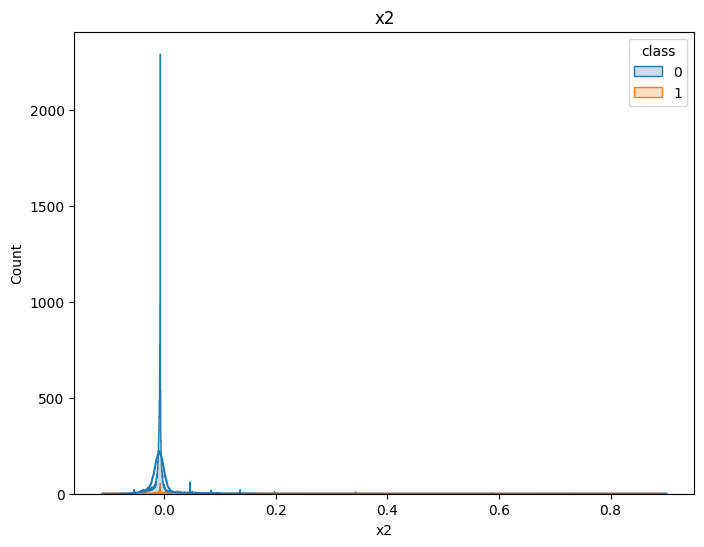

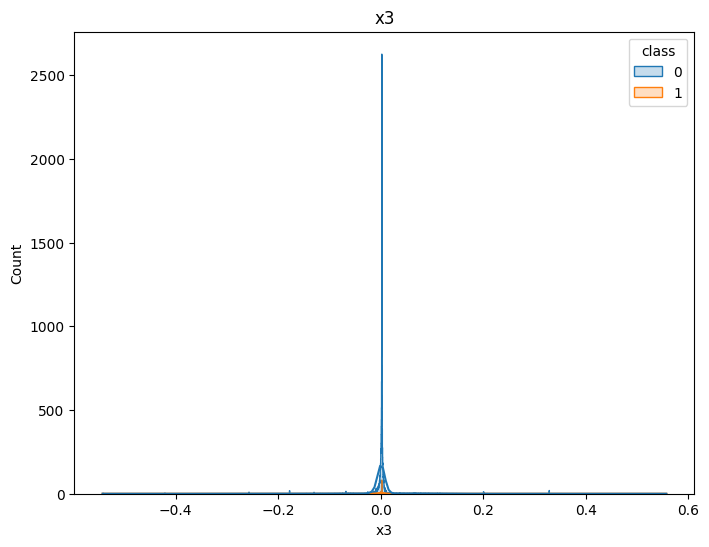

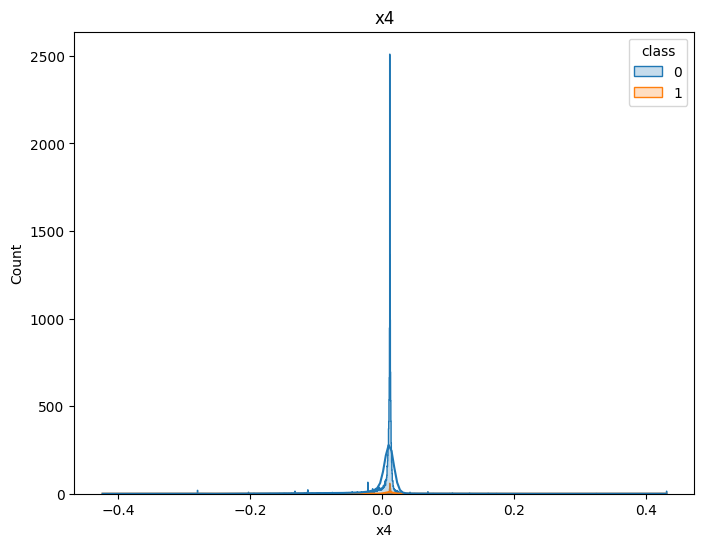

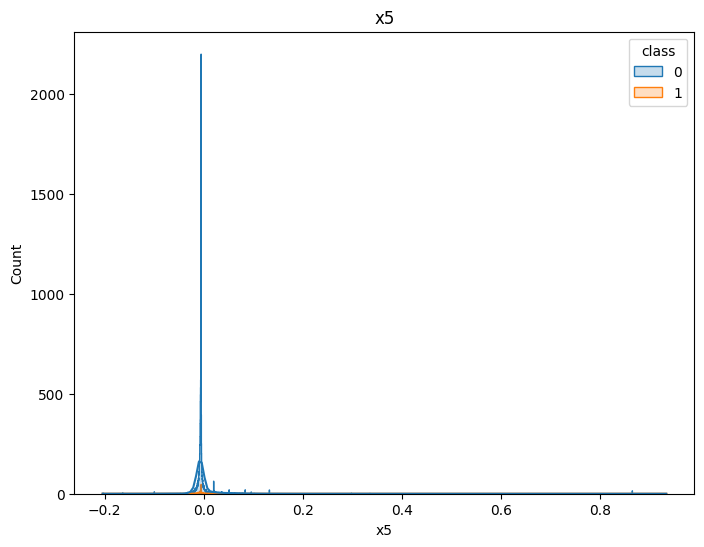

...

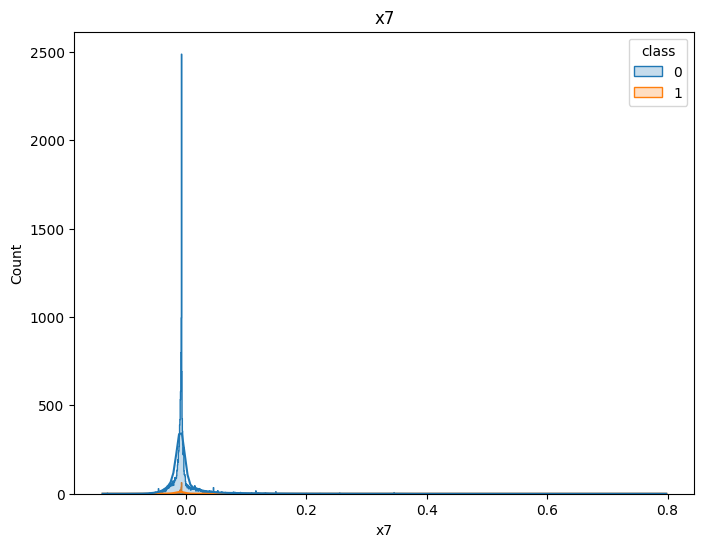

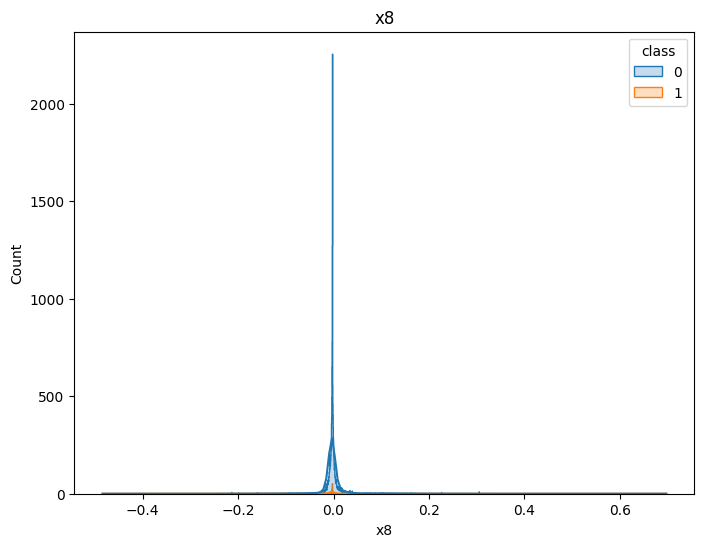

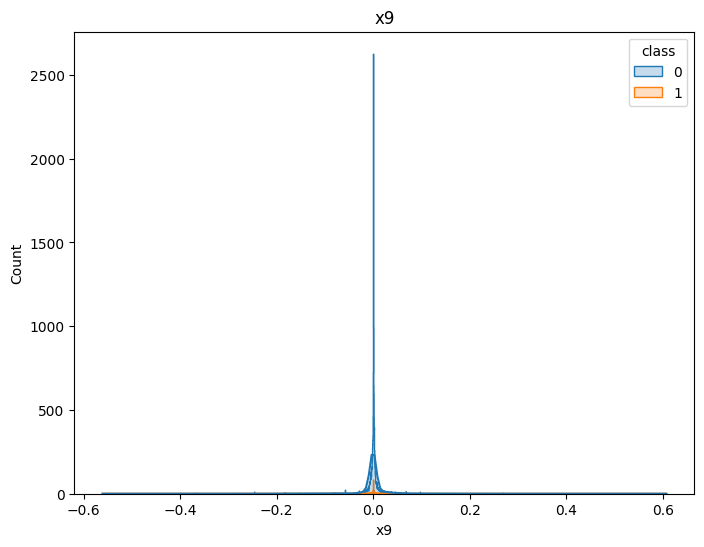

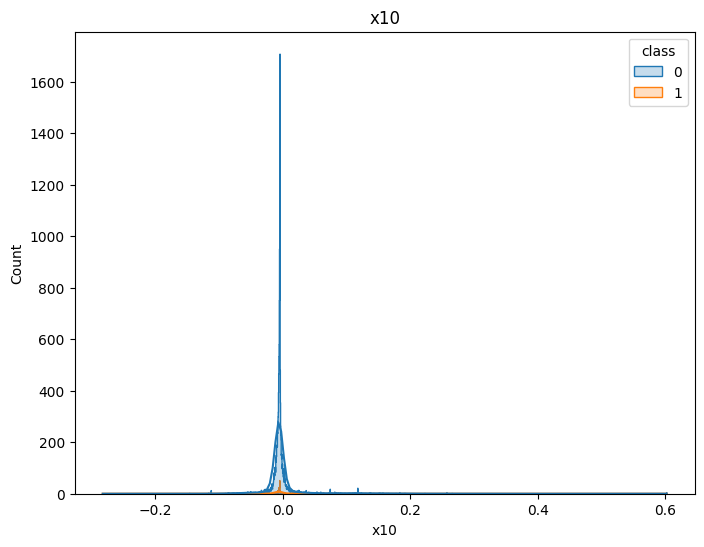

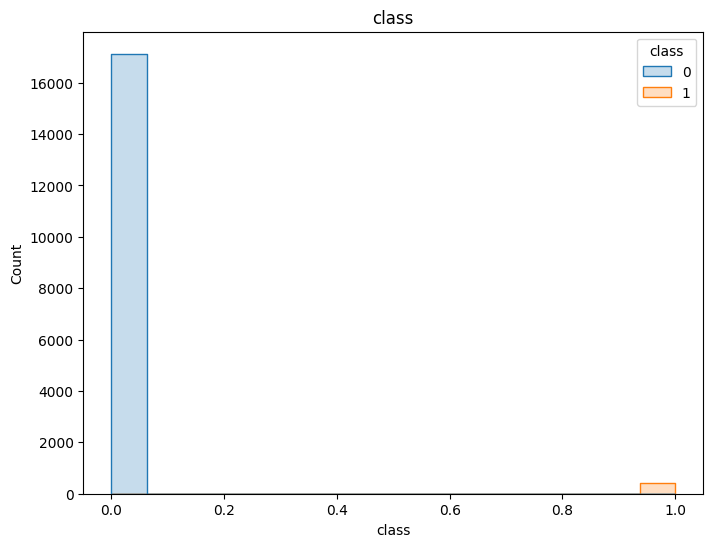

In [ ]:
for col in df_sembed.columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(data=df_sembed, x=df_sembed.loc[df_sembed[col].notnull(), col],
                 hue='class', kde=True, element="step", common_norm=False)
    plt.title(col)

x, y 정하고 train, test셋으로 분리

In [ ]:
from sklearn.model_selection import train_test_split
# 종속 변수와 독립 변수 설정
y = df_sembed_for_if['class']
X = df_sembed_for_if.drop(columns=['class'])

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=96, shuffle=True)

print('X_train shape : ', X_train.shape)
print('X_test shape : ', X_test.shape)
print('y_train shape : ', y_train.shape)
print('y_test shape : ', y_test.shape)

X_train shape :  (13160, 10)
X_test shape :  (4387, 10)
y_train shape :  (13160,)
y_test shape :  (4387,)


각 임베딩 벡터의 분포를 살펴보자

In [ ]:
df_sembed_for_if.describe()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,class
count,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000,17547.000000
mean,-0.000736,0.003220,0.007808,-0.002696,0.001976,0.021409,0.001076,-0.000128,-0.001392,0.002790,0.023822
std,0.053441,0.052221,0.067734,0.047720,0.046378,0.144004,0.042472,0.040646,0.040871,0.043068,0.152498
min,-0.120237,-0.110447,-0.542232,-0.423833,-0.204060,-0.299031,-0.138054,-0.483881,-0.560660,-0.282051,0.000000
25%,-0.007485,-0.010798,-0.000632,0.005742,-0.008118,-0.000805,-0.011248,-0.005905,-0.002717,-0.007868,0.000000
50%,-0.004538,-0.008138,0.001253,0.010779,-0.006412,0.001596,-0.007801,-0.003261,-0.000133,-0.005286,0.000000
75%,-0.003244,-0.006268,0.002314,0.011663,-0.004976,0.002073,-0.004070,-0.000985,0.001748,-0.003219,0.000000
max,0.763916,0.899816,0.556687,0.431017,0.933852,1.123778,0.797805,0.696997,0.607307,0.601554,1.000000


train, test dataset 분리

가중치 적용할 학습데이터셋 만들어줌 (x와 y 둘 다 있는 데이터프레임)

In [ ]:
train_dataset = X_train.copy()
train_dataset['class'] = y_train

In [ ]:
value_for_weight = 5      # 이상치에 곱할 가중치에 적용할 값 정하기
offset_for_nomral = -0.2  # 정상치에 곱할 가중치에 적용할 값 정하기

In [ ]:
# 앞에서 정한 값을 기반으로 각 열에 곱할 가중치를 구함

weight_list_for_novelty = [] # 각 열마다 이상치에 곱할 가중치들이 있는 리스트
weight_list_for_normal = []  # 각 열마다 정상치에 곱할 가중치들이 있는 리스트

# 각 열마다 가중치를 구한다 (이상치용)
for col in train_dataset.drop("class", axis = 1).describe().columns:
  df_median = train_dataset.groupby('class').agg(median=(col, 'median'))
  weight_list_for_novelty.append((df_median['median'][0] - df_median['median'][1]) * value_for_weight)

# 각 열마다 가중치를 구한다 (정상치용)
for col in train_dataset.drop("class", axis = 1).describe().columns:
  df_median = train_dataset.groupby('class').agg(median=(col, 'median'))
  weight_list_for_normal.append((df_median['median'][0] - df_median['median'][1]) * offset_for_nomral)

print(weight_list_for_novelty)
print(weight_list_for_normal)

[8.108053803443909, 0.17354905605316162, 1.4097285270690918, -3.948148190975189, -0.14183677732944489]
[-0.3243221521377564, -0.006941962242126465, -0.056389141082763675, 0.1579259276390076, 0.005673471093177796]


위에서 구한 가중치들을 각 열마다 적용함
<br/> ex. 각 열마다 이상치에 곱할 가중치들 리스트:
<br/> [-4.529990553855896, -1.851721704006195, 0.4497618228197098, -4.21772837638855, -3.2465332746505737]
<br/> x1에 이상치에 해당되는 것에다가 -4.529990553855896를 곱함
<br/> x2에 이상치에 해당되는 것에다가 -1.851721704006195를 곱함
<br/> => x3은 리스트 내 3번째 (index: 2) 값 곱함
<br/> 이런식으로 가중치를 적용하게 됨

In [ ]:
# 이상치에 각 열마다 구한 가중치를 반영
column_index = train_dataset.drop("class", axis = 1).describe().columns
for col in range(len(column_index)):
  train_dataset[column_index[col]] = np.where(train_dataset['class'] == 1, train_dataset[column_index[col]] * weight_list_for_novelty[col], train_dataset[column_index[col]])

# 정상치에 각 열마다 구한 가중치를 반영
column_index = train_dataset.drop("class", axis = 1).describe().columns
for col in range(len(column_index)):
  train_dataset[column_index[col]] = np.where(train_dataset['class'] == 1, train_dataset[column_index[col]] * weight_list_for_normal[col], train_dataset[column_index[col]])

train dataset과 test train dataset에 각각 mix-max normalization를 적용함 <br/> normalization을 하지 않으면, 가중치를 반영했을 때 나오는 임베딩 벡터의 범위와 unseen data의 임베딩 벡터의 범위가 불일치함
<br/> 그러면 일반화 성능이 떨어질 수밖에 없음. 그러므로 normalization을 적용하는 것임
<br/> unseen data도 임베딩 후 normalization만 적용해주면 되는거임!

In [ ]:
# min_max_normalization 함수
def min_max_normalization(x):
    min_val = x.min()
    max_val = x.max()
    normalized_x = (x - min_val) / (max_val - min_val)
    return normalized_x

In [ ]:
# normalization 적용을 하기 전에 y값을 뺌
# y값에 normalization을 적용할 필요는 없기 때문.
X_train = train_dataset.drop('class', axis = 1).copy()

# min_max_normalization을 train data에 적용
for col in X_train.columns:
    X_train[col] = min_max_normalization(X_train[col])

# min_max_normalization을 test data에 적용
for col in X_test.columns:
    X_test[col] = min_max_normalization(X_test[col])
X_train = X_train.reset_index(drop=True)
X_train

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10
0,0.121637,0.081019,0.428908,0.372353,0.235830,0.217299,0.123345,0.402843,0.478300,0.307116
1,0.128228,0.079692,0.486084,0.485518,0.177102,0.205986,0.204482,0.502952,0.630047,0.505063
2,0.132370,0.101138,0.494447,0.508611,0.184928,0.211497,0.140342,0.408913,0.483293,0.317817
3,0.131087,0.101496,0.495796,0.509116,0.185240,0.210598,0.134422,0.405048,0.478063,0.313417
4,0.209901,0.108017,0.495944,0.504948,0.186331,0.210053,0.138212,0.405162,0.482962,0.317729
...,...,...,...,...,...,...,...,...,...,...
13155,0.131165,0.099797,0.494982,0.509399,0.184434,0.211383,0.138706,0.407981,0.479986,0.312982
13156,0.129278,0.099075,0.496005,0.503247,0.185943,0.211394,0.145435,0.417350,0.488004,0.321723
13157,0.132533,0.101733,0.494566,0.508597,0.185303,0.211550,0.139418,0.407059,0.479917,0.313579
13158,0.134766,0.071659,0.484468,0.481120,0.168518,0.202795,0.290398,0.644123,0.302140,0.311574


In [ ]:
from pyod.models.iforest import IForest
contamination = 0.1
IForest = IForest(contamination=contamination, random_state=96)
IForest.fit(X_train)
IForest_train_pred = IForest.predict(X_train)
IForest_test_pred = IForest.predict(X_test)
y_scores = IForest.decision_function(X_test)

In [ ]:
result = X_test.copy()
result['y_scores'] = y_scores
result['y_test'] = y_test
result['IForest_test_pred'] = IForest_test_pred

학습 결과를 시각화하겠습니다.
<br/> 1. 예측된 클래스에 따른 novelty score (y_scores) 분포 차이
<br/> 2. 실제 클래스에 따른 novelty score (y_scores) 분포 차이
<br/> 3. confusion matrix

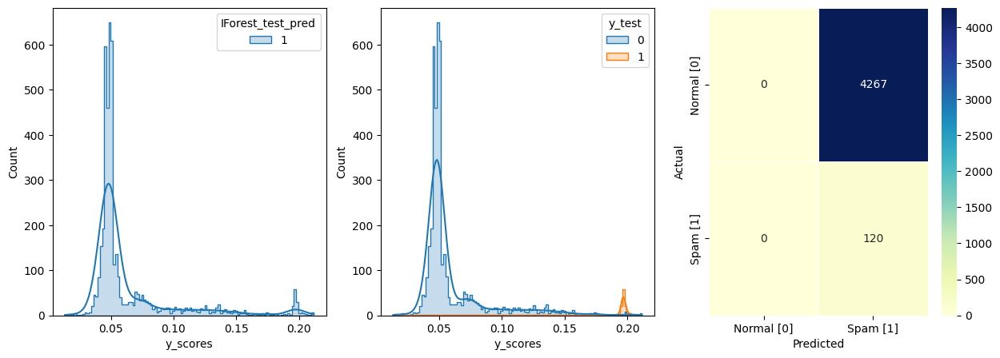

X_train shape :  (13160, 10)
X_test shape :  (4387, 10)
y_train shape :  (13160,)
y_test shape :  (4387,)


NameError: ignored

In [ ]:
fig, axes = plt.subplots(1,3, figsize=(15, 5))
sns.histplot(data=result, x="y_scores", hue='IForest_test_pred',
              kde=True, element="step", common_norm=False, ax=axes[0])
sns.histplot(data=result, x="y_scores", hue='y_test',
              kde=True, element="step", common_norm=False, ax=axes[1])

con_mat = confusion_matrix(y_test, IForest_test_pred)
sns.heatmap(pd.DataFrame(con_mat, columns = ['Predicted', 'Actual']),
              xticklabels=['Normal [0]', 'Spam [1]'],
              yticklabels=['Normal [0]', 'Spam [1]'],
              annot=True, fmt="d", linewidths=.5, cmap="YlGnBu", ax=axes[2])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

#normal_normal_list.append(con_mat[0][0])
#spam_spam_list.append(con_mat[1][1])


print('X_train shape : ', X_train.shape)
print('X_test shape : ', X_test.shape)
print('y_train shape : ', y_train.shape)
print('y_test shape : ', y_test.shape)
print("value_for_weight:", value_for_weight)
print("offset_for_nomral:", offset_for_nomral)
print("contamination:", contamination)
print("con_mat:")
print(con_mat)
print("accuracy: ", accuracy_score(y_test, IForest_test_pred))
print("recall: ", round(recall_score(y_test, IForest_test_pred),3))
print("precision: ", round(precision_score(y_test, IForest_test_pred),3))
print("f1-score: ", round(f1_score(y_test, IForest_test_pred),3))
print()
print()

### Isolation Forest & 가중치 grid search

In [ ]:
# min_max_normalization 함수
def min_max_normalization(x):
    min_val = x.min()
    max_val = x.max()
    normalized_x = (x - min_val) / (max_val - min_val)
    return normalized_x

In [ ]:
from itertools import product

In [ ]:
value_for_weights = np.arange(0, 1.01, 0.0125).tolist()
print(value_for_weights)

#offsets_for_nomral = np.reciprocal(value_for_weights)
#offsets_for_nomral = np.arange(-0.35, 0.35, 0.05).tolist()
#print(value_for_weights)
#print(offsets_for_nomral)

#offsets_for_nomral = []

# 각 요소를 음수로 곱하여 새로운 리스트에 추가
#for element in value_for_weights:
    #element = 1 - value_for_weights
    #offsets_for_nomral.append(element)


#print(offsets_for_nomral)


[0.0, 0.0125, 0.025, 0.037500000000000006, 0.05, 0.0625, 0.07500000000000001, 0.08750000000000001, 0.1, 0.1125, 0.125, 0.1375, 0.15000000000000002, 0.1625, 0.17500000000000002, 0.1875, 0.2, 0.21250000000000002, 0.225, 0.23750000000000002, 0.25, 0.2625, 0.275, 0.28750000000000003, 0.30000000000000004, 0.3125, 0.325, 0.3375, 0.35000000000000003, 0.36250000000000004, 0.375, 0.3875, 0.4, 0.41250000000000003, 0.42500000000000004, 0.4375, 0.45, 0.4625, 0.47500000000000003, 0.48750000000000004, 0.5, 0.5125000000000001, 0.525, 0.5375, 0.55, 0.5625, 0.5750000000000001, 0.5875, 0.6000000000000001, 0.6125, 0.625, 0.6375000000000001, 0.65, 0.6625000000000001, 0.675, 0.6875, 0.7000000000000001, 0.7125, 0.7250000000000001, 0.7375, 0.75, 0.7625000000000001, 0.775, 0.7875000000000001, 0.8, 0.8125, 0.8250000000000001, 0.8375, 0.8500000000000001, 0.8625, 0.875, 0.8875000000000001, 0.9, 0.9125000000000001, 0.925, 0.9375, 0.9500000000000001, 0.9625, 0.9750000000000001, 0.9875, 1.0]


weights_grid_research

In [ ]:
for i in range(len(value_for_weights)):
  value_for_weight = value_for_weights[i]

  #offset_for_nomral = 1
  offset_for_nomral = (1 - value_for_weight)*(-2.5)
  y = df_sembed_for_if['class']
  X = df_sembed_for_if.drop(columns=['class'])

  # 데이터 분할
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=96, shuffle=True)
  train_dataset = X_train.copy()
  train_dataset['class'] = y_train

  weight_list_for_novelty = []
  weight_list_for_normal = []

  # 각 열마다 가중치를 구한다 (이상치용)
  for col in train_dataset.drop("class", axis = 1).describe().columns:
    df_median = train_dataset.groupby('class').agg(median=(col, 'median'))
    weight_list_for_novelty.append((df_median['median'][0] - df_median['median'][1]) * value_for_weight)

  # 각 열마다 가중치를 구한다 (정상치용)
  for col in train_dataset.drop("class", axis = 1).describe().columns:
    df_median = train_dataset.groupby('class').agg(median=(col, 'median'))
    weight_list_for_normal.append((df_median['median'][0] - df_median['median'][1]) * offset_for_nomral)

  # 이상 치에 각 열마다 구한 가중치를 반영
  column_index = train_dataset.drop("class", axis = 1).describe().columns
  for col in range(len(column_index)):
    train_dataset[column_index[col]] = np.where(train_dataset['class'] == 1, train_dataset[column_index[col]] * weight_list_for_novelty[col], train_dataset[column_index[col]])

  # 정상치에 각 열마다 구한 가중치를 반영
  column_index = train_dataset.drop("class", axis = 1).describe().columns
  for col in range(len(column_index)):
    train_dataset[column_index[col]] = np.where(train_dataset['class'] == 0, train_dataset[column_index[col]] * weight_list_for_normal[col], train_dataset[column_index[col]])

  X_train = train_dataset.drop('class', axis = 1).copy()
  # min_max_normalization을 train data적용
  for col in X_train.columns:
      X_train[col] = min_max_normalization(X_train[col])

  for col in X_test.columns:
      X_test[col] = min_max_normalization(X_test[col])
  X_train = X_train.reset_index(drop=True)


  from pyod.models.iforest import IForest
  contamination = 0.075 #0.0226
  IForest = IForest(contamination=contamination, random_state=96)
  IForest.fit(X_train)
  IForest_train_pred = IForest.predict(X_train)
  IForest_test_pred = IForest.predict(X_test)
  y_scores = IForest.decision_function(X_test)

  result = X_test.copy()
  result['y_scores'] = y_scores
  result['y_test'] = y_test
  result['IForest_test_pred'] = IForest_test_pred

  fig, axes = plt.subplots(1,3, figsize=(15, 5))
  sns.histplot(data=result, x="y_scores", hue='IForest_test_pred',
              kde=True, element="step", common_norm=False, ax=axes[0])
  sns.histplot(data=result, x="y_scores", hue='y_test',
              kde=True, element="step", common_norm=False, ax=axes[1])

  con_mat = confusion_matrix(y_test, IForest_test_pred)
  sns.heatmap(pd.DataFrame(con_mat, columns = ['Predicted', 'Actual']),
              xticklabels=['Normal [0]', 'Spam [1]'],
              yticklabels=['Normal [0]', 'Spam [1]'],
              annot=True, fmt="d", linewidths=.5, cmap="YlGnBu", ax=axes[2])
  plt.ylabel('Actual')
  plt.xlabel('Predicted')
  plt.show()

  print('X_train shape : ', X_train.shape)
  print('X_test shape : ', X_test.shape)
  print('y_train shape : ', y_train.shape)
  print('y_test shape : ', y_test.shape)
  print("value_for_weight:", value_for_weight)
  print("offset_for_nomral:", offset_for_nomral)
  print("contamination:", contamination)
  print("con_mat:")
  print(con_mat)
  print("accuracy: ", accuracy_score(y_test, IForest_test_pred))
  print("recall: ", round(recall_score(y_test, IForest_test_pred),3))
  print("precision: ", round(precision_score(y_test, IForest_test_pred),3))
  print("f1-score: ", round(f1_score(y_test, IForest_test_pred),3))
  print()
  print()


Output hidden; open in https://colab.research.google.com to view.

### Local Outlier Factor¶(KCBERT에서 성능 그나마 나음)

In [ ]:
value_for_weights = np.arange(0.2, 1.01, 0.0125).tolist()
print(value_for_weights)

[0.2, 0.21250000000000002, 0.22500000000000003, 0.23750000000000004, 0.25000000000000006, 0.26250000000000007, 0.2750000000000001, 0.2875000000000001, 0.3000000000000001, 0.3125000000000001, 0.3250000000000001, 0.33750000000000013, 0.35000000000000014, 0.36250000000000016, 0.37500000000000017, 0.3875000000000002, 0.4000000000000002, 0.4125000000000002, 0.4250000000000002, 0.4375000000000002, 0.45000000000000023, 0.46250000000000024, 0.47500000000000026, 0.48750000000000027, 0.5000000000000002, 0.5125000000000003, 0.5250000000000004, 0.5375000000000003, 0.5500000000000003, 0.5625000000000003, 0.5750000000000004, 0.5875000000000004, 0.6000000000000003, 0.6125000000000004, 0.6250000000000004, 0.6375000000000004, 0.6500000000000004, 0.6625000000000004, 0.6750000000000005, 0.6875000000000004, 0.7000000000000004, 0.7125000000000004, 0.7250000000000005, 0.7375000000000005, 0.7500000000000004, 0.7625000000000004, 0.7750000000000006, 0.7875000000000005, 0.8000000000000005, 0.8125000000000004, 0

In [ ]:
df_sembed_for_if = df_sembed.copy()
df_sembed_for_if

,x1,x2,x3,x4,x5,class
0,1.544009,-2.146477,0.122849,-0.732367,-0.144594,0
1,1.441677,-3.007016,-0.645845,0.671026,-0.994953,0
2,-4.061233,0.283042,-0.195237,-1.750249,-0.066044,0
3,-4.100071,-0.093279,2.457936,-0.577862,0.106330,0
4,-3.321541,0.260766,-0.711877,-1.213880,0.067455,0
...,...,...,...,...,...,...
17542,-3.917057,-0.327829,-0.826329,0.940763,1.125883,0
17543,-0.130940,3.638017,1.235714,-1.121292,-1.701908,0
17544,-3.112844,1.878678,-0.061033,1.209845,0.088530,0
17545,-2.907063,0.510229,-3.020214,0.808887,0.060733,0


In [ ]:
normal_normal_list =[]
spam_spam_list = []
wieght_list = []
normal_weight_list = []

for i in range(len(value_for_weights)):
  value_for_weight = value_for_weights[i]
  wieght_list.append(value_for_weight)
  #offset_for_nomral = 1
  offset_for_nomral = (1 - value_for_weight)*5  # -2.5이 갓
  #offset_for_nomral = 1 - value_for_weight

  y = df_sembed_for_if['class']
  X = df_sembed_for_if.drop(columns=['class'])

  # 데이터 분할
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=96, shuffle=True)
  train_dataset = X_train.copy()
  train_dataset['class'] = y_train

  weight_list_for_novelty = []
  weight_list_for_normal = []

  # 각 열마다 가중치를 구한다 (이상치용)
  for col in train_dataset.drop("class", axis = 1).describe().columns:
    df_median = train_dataset.groupby('class').agg(median=(col, 'median'))
    weight_list_for_novelty.append((df_median['median'][0] - df_median['median'][1]) * value_for_weight)

  # 각 열마다 가중치를 구한다 (정상치용)
  for col in train_dataset.drop("class", axis = 1).describe().columns:
    df_median = train_dataset.groupby('class').agg(median=(col, 'median'))
    weight_list_for_normal.append((df_median['median'][0] - df_median['median'][1]) * offset_for_nomral)

  # 이상 치에 각 열마다 구한 가중치를 반영
  column_index = train_dataset.drop("class", axis = 1).describe().columns
  for col in range(len(column_index)):
    train_dataset[column_index[col]] = np.where(train_dataset['class'] == 1, train_dataset[column_index[col]] * weight_list_for_novelty[col], train_dataset[column_index[col]])

  # 정상치에 각 열마다 구한 가중치를 반영
  column_index = train_dataset.drop("class", axis = 1).describe().columns
  for col in range(len(column_index)):
    train_dataset[column_index[col]] = np.where(train_dataset['class'] == 0, train_dataset[column_index[col]] * weight_list_for_normal[col], train_dataset[column_index[col]])

  X_train = train_dataset.drop('class', axis = 1).copy()
  # min_max_normalization을 train data적용
  for col in X_train.columns:
      X_train[col] = min_max_normalization(X_train[col])

  for col in X_test.columns:
      X_test[col] = min_max_normalization(X_test[col])
  X_train = X_train.reset_index(drop=True)


  from sklearn.neighbors import LocalOutlierFactor
  contamination = 0.075 #0.0226
  LOF = LocalOutlierFactor(contamination=contamination,novelty=True)
  LOF.fit(X_train)

  LOF_train_pred = LOF.predict(X_train)
  LOF_test_pred = LOF.predict(X_test)


  LOF_test_pred = pd.DataFrame(LOF_test_pred)
  LOF_test_pred = LOF_test_pred.replace({-1: 1, 1: 0})

  # Confusion matrix 출력 및 모델 성능 평가
  con_mat = confusion_matrix(y_test, LOF_test_pred)
  fig, axes = plt.subplots(1,1, figsize=(5, 4))

  sns.heatmap(pd.DataFrame(con_mat, columns = ['Predicted', 'Actual']),
              xticklabels=['Normal [0]', 'Abnormal [1]'],
              yticklabels=['Normal [0]', 'Abnormal [1]'],
              annot=True, fmt="d", linewidths=.5, cmap="YlGnBu")
  plt.ylabel('Actual')
  plt.xlabel('Predicted')
  plt.show()
  print("value_for_weight:", value_for_weight)
  print("offset_for_nomral:", offset_for_nomral)
  print("contamination:", contamination)
  print("con_mat:")
  print(con_mat)
  print("accuracy: ", accuracy_score(y_test, LOF_test_pred))
  print("recall: ", round(recall_score(y_test, LOF_test_pred),3))
  print("precision: ", round(precision_score(y_test, LOF_test_pred),3))
  print("f1-score: ", round(f1_score(y_test, LOF_test_pred),3))


Output hidden; open in https://colab.research.google.com to view.

# Pricipal Component Analysis (KCELCTRA에서 성능 그나마 나음)

In [ ]:
normal_normal_list =[]
spam_spam_list = []
wieght_list = []
normal_weight_list = []

for i in range(len(value_for_weights)):
  value_for_weight = value_for_weights[i]
  wieght_list.append(value_for_weight)
  #offset_for_nomral = 1
  offset_for_nomral = (1 - value_for_weight)*(-2.5)

  y = df_sembed_for_if['class']
  X = df_sembed_for_if.drop(columns=['class'])

  # 데이터 분할
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=96, shuffle=True)
  train_dataset = X_train.copy()
  train_dataset['class'] = y_train

  weight_list_for_novelty = []
  weight_list_for_normal = []

  # 각 열마다 가중치를 구한다 (이상치용)
  for col in train_dataset.drop("class", axis = 1).describe().columns:
    df_median = train_dataset.groupby('class').agg(median=(col, 'median'))
    weight_list_for_novelty.append((df_median['median'][0] - df_median['median'][1]) * value_for_weight)

  # 각 열마다 가중치를 구한다 (정상치용)
  for col in train_dataset.drop("class", axis = 1).describe().columns:
    df_median = train_dataset.groupby('class').agg(median=(col, 'median'))
    weight_list_for_normal.append((df_median['median'][0] - df_median['median'][1]) * offset_for_nomral)

  # 이상 치에 각 열마다 구한 가중치를 반영
  column_index = train_dataset.drop("class", axis = 1).describe().columns
  for col in range(len(column_index)):
    train_dataset[column_index[col]] = np.where(train_dataset['class'] == 1, train_dataset[column_index[col]] * weight_list_for_novelty[col], train_dataset[column_index[col]])

  # 정상치에 각 열마다 구한 가중치를 반영
  column_index = train_dataset.drop("class", axis = 1).describe().columns
  for col in range(len(column_index)):
    train_dataset[column_index[col]] = np.where(train_dataset['class'] == 0, train_dataset[column_index[col]] * weight_list_for_normal[col], train_dataset[column_index[col]])

  X_train = train_dataset.drop('class', axis = 1).copy()
  # min_max_normalization을 train data적용
  for col in X_train.columns:
      X_train[col] = min_max_normalization(X_train[col])

  for col in X_test.columns:
      X_test[col] = min_max_normalization(X_test[col])
  X_train = X_train.reset_index(drop=True)



  contamination = 0.075 #0.0226
  from pyod.models.pca import PCA
  PCA = PCA(contamination=contamination)
  PCA.fit(X_train)

  PCA_train_pred = PCA.predict(X_train)
  PCA_test_pred = PCA.predict(X_test)

  # Confusion matrix 출력 및 모델 성능 평가
  con_mat = confusion_matrix(y_test, PCA_test_pred)

  sns.heatmap(pd.DataFrame(con_mat, columns = ['Predicted', 'Actual']),
              xticklabels=['Normal [0]', 'Abnormal [1]'],
              yticklabels=['Normal [0]', 'Abnormal [1]'],
              annot=True, fmt="d", linewidths=.5, cmap="YlGnBu")
  plt.ylabel('Actual')
  plt.xlabel('Predicted')
  plt.show()
  print("value_for_weight:", value_for_weight)
  print("offset_for_nomral:", offset_for_nomral)
  print("contamination:", contamination)
  print("con_mat:")
  print(con_mat)
  print("accuracy: ", accuracy_score(y_test, PCA_test_pred))
  print("recall: ", round(recall_score(y_test, PCA_test_pred),3))
  print("precision: ", round(precision_score(y_test, PCA_test_pred),3))
  print("f1-score: ", round(f1_score(y_test, PCA_test_pred),3))


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
value_for_weight = 0.7
#offset_for_nomral = 1
offset_for_nomral = 1 - value_for_weight

y = df_sembed_for_if['class']
X = df_sembed_for_if.drop(columns=['class'])

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=96, shuffle=True)
train_dataset = X_train.copy()
train_dataset['class'] = y_train

In [ ]:
weight_list_for_novelty = []
weight_list_for_normal = []

# 각 열마다 가중치를 구한다 (이상치용)
for col in train_dataset.drop("class", axis = 1).describe().columns:
    df_median = train_dataset.groupby('class').agg(median=(col, 'median'))
    weight_list_for_novelty.append((df_median['median'][0] - df_median['median'][1]) * value_for_weight)

# 각 열마다 가중치를 구한다 (정상치용)
for col in train_dataset.drop("class", axis = 1).describe().columns:
    df_median = train_dataset.groupby('class').agg(median=(col, 'median'))
    weight_list_for_normal.append((df_median['median'][0] - df_median['median'][1]) * offset_for_nomral)

In [ ]:
# 이상 치에 각 열마다 구한 가중치를 반영
column_index = train_dataset.drop("class", axis = 1).describe().columns
for col in range(len(column_index)):
    train_dataset[column_index[col]] = np.where(train_dataset['class'] == 1, train_dataset[column_index[col]] * weight_list_for_novelty[col], train_dataset[column_index[col]])
  # 정상치에 각 열마다 구한 가중치를 반영
column_index = train_dataset.drop("class", axis = 1).describe().columns
for col in range(len(column_index)):
    train_dataset[column_index[col]] = np.where(train_dataset['class'] == 0, train_dataset[column_index[col]] * weight_list_for_normal[col], train_dataset[column_index[col]])

X_train = train_dataset.drop('class', axis = 1).copy()
  # min_max_normalization을 train data적용
for col in X_train.columns:
      X_train[col] = min_max_normalization(X_train[col])

for col in X_test.columns:
      X_test[col] = min_max_normalization(X_test[col])
X_train = X_train.reset_index(drop=True)

In [ ]:
def pca_grid_search(contamination):
  from pyod.models.pca import PCA
  PCA = PCA(contamination=contamination)
  PCA.fit(X_train)

  # train data에 대한 예측 값(정상=0, 이상=1)
  PCA_train_pred = PCA.predict(X_train)

  # train data에 대한 예측 값(정상=0, 이상=1)
  PCA_test_pred = PCA.predict(X_test)

  # Confusion matrix 출력 및 모델 성능 평가
  con_mat = confusion_matrix(y_test, PCA_test_pred)

  sns.heatmap(pd.DataFrame(con_mat, columns = ['Predicted', 'Actual']),
              xticklabels=['Normal [0]', 'Abnormal [1]'],
              yticklabels=['Normal [0]', 'Abnormal [1]'],
              annot=True, fmt="d", linewidths=.5, cmap="YlGnBu")
  plt.ylabel('Actual')
  plt.xlabel('Predicted')
  plt.show()
  print("accuracy: ", accuracy_score(y_test, PCA_test_pred))
  print("recall: ", round(recall_score(y_test, PCA_test_pred),3))
  print("precision: ", round(precision_score(y_test, PCA_test_pred),3))
  print("f1-score: ", round(f1_score(y_test, PCA_test_pred),3))
  print()
  print()

In [ ]:
list_contamination = np.arange(0.01, 0.4, 0.025).tolist()
print(list_contamination)

[0.01, 0.035, 0.060000000000000005, 0.085, 0.11, 0.135, 0.16000000000000003, 0.18500000000000003, 0.21000000000000002, 0.23500000000000001, 0.26, 0.28500000000000003, 0.31000000000000005, 0.335, 0.36000000000000004, 0.385]


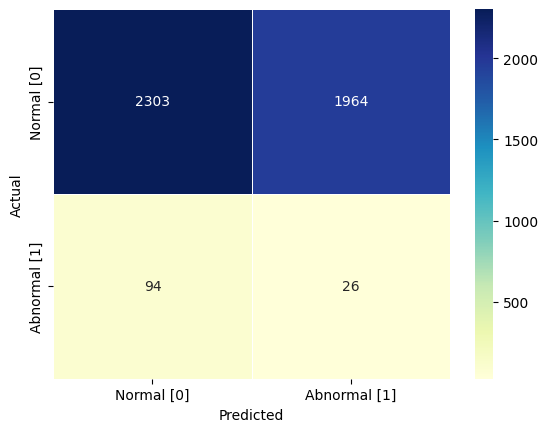

accuracy:  0.5308867107362663
recall:  0.217
precision:  0.013
f1-score:  0.025




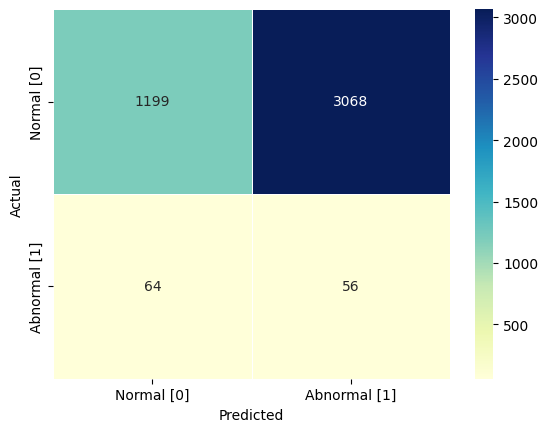

accuracy:  0.2860724868930932
recall:  0.467
precision:  0.018
f1-score:  0.035




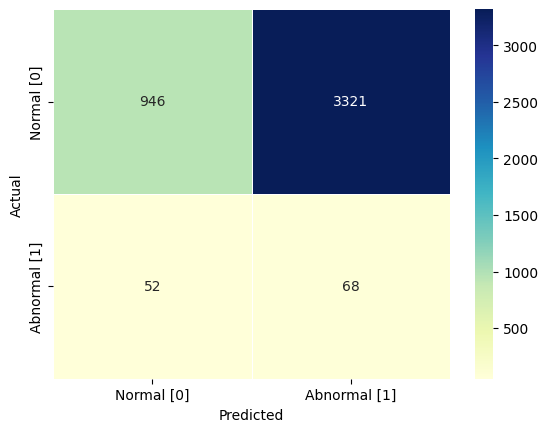

accuracy:  0.2311374515614315
recall:  0.567
precision:  0.02
f1-score:  0.039




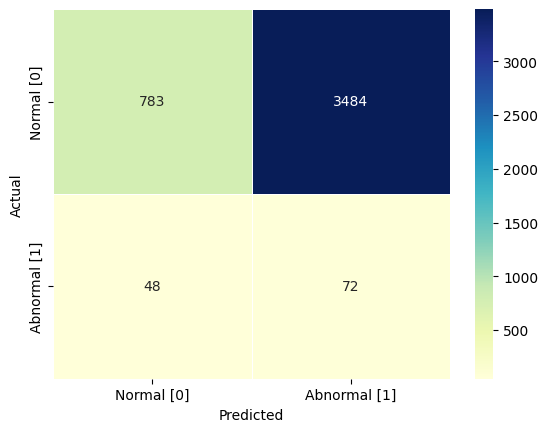

accuracy:  0.1948940050148165
recall:  0.6
precision:  0.02
f1-score:  0.039




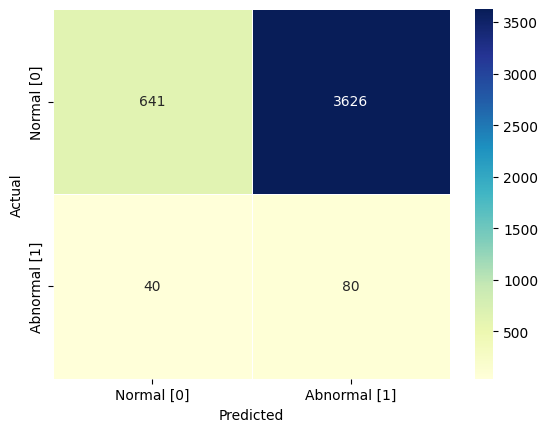

accuracy:  0.1643492135855938
recall:  0.667
precision:  0.022
f1-score:  0.042




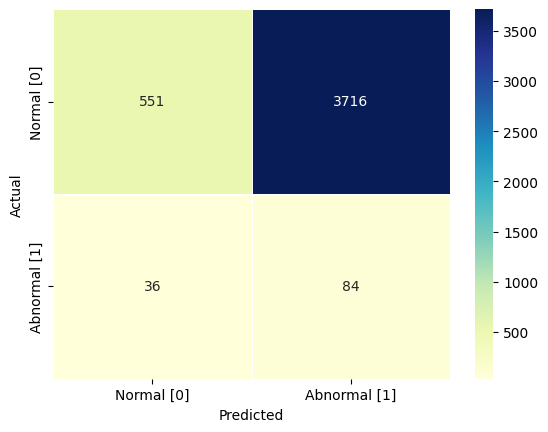

accuracy:  0.1447458399817643
recall:  0.7
precision:  0.022
f1-score:  0.043




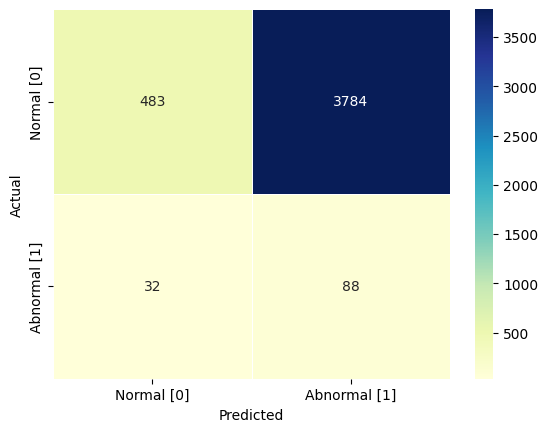

accuracy:  0.13015728288124004
recall:  0.733
precision:  0.023
f1-score:  0.044




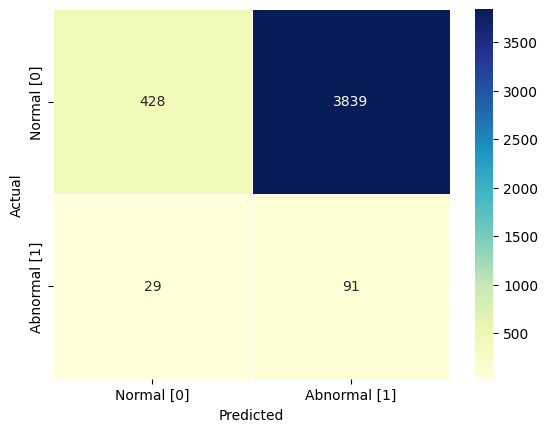

accuracy:  0.11830408023706405
recall:  0.758
precision:  0.023
f1-score:  0.045




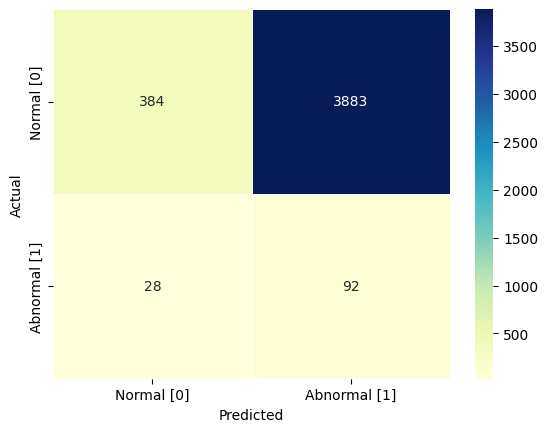

accuracy:  0.10850239343514931
recall:  0.767
precision:  0.023
f1-score:  0.045




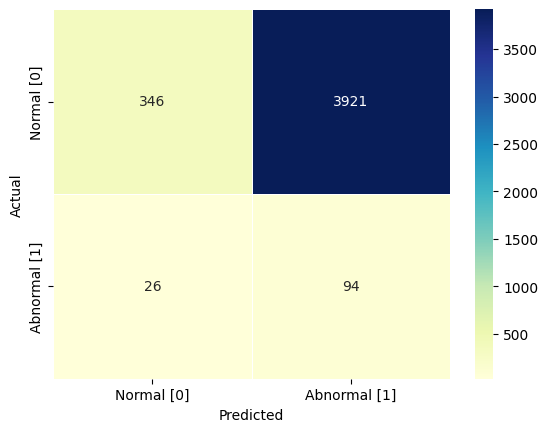

accuracy:  0.1002963300661044
recall:  0.783
precision:  0.023
f1-score:  0.045




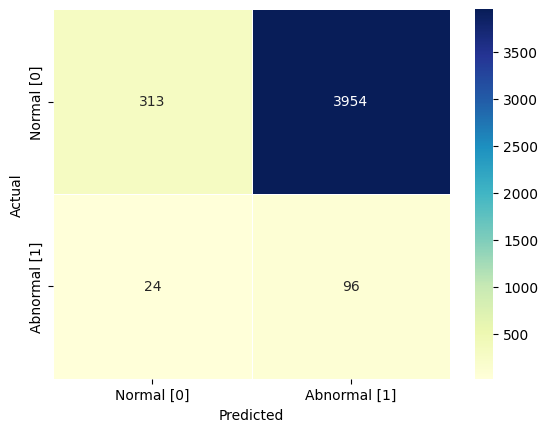

accuracy:  0.09322999772053796
recall:  0.8
precision:  0.024
f1-score:  0.046




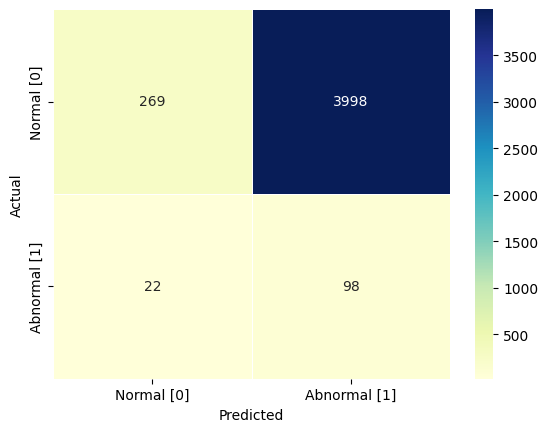

accuracy:  0.0836562571233189
recall:  0.817
precision:  0.024
f1-score:  0.046




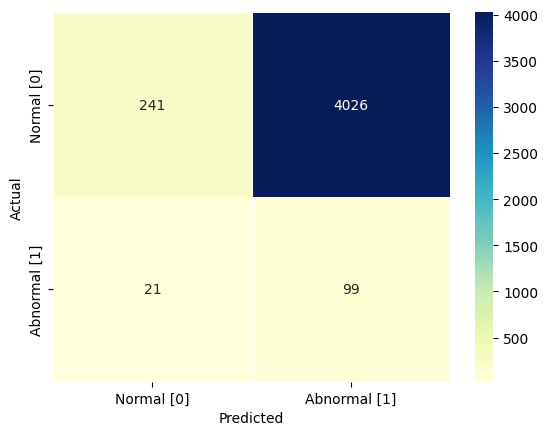

accuracy:  0.07750170959653521
recall:  0.825
precision:  0.024
f1-score:  0.047




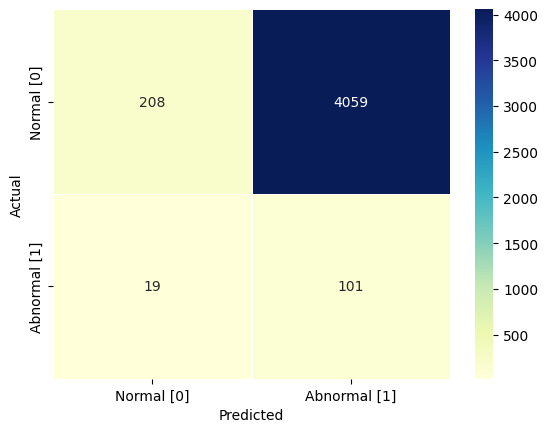

accuracy:  0.07043537725096877
recall:  0.842
precision:  0.024
f1-score:  0.047




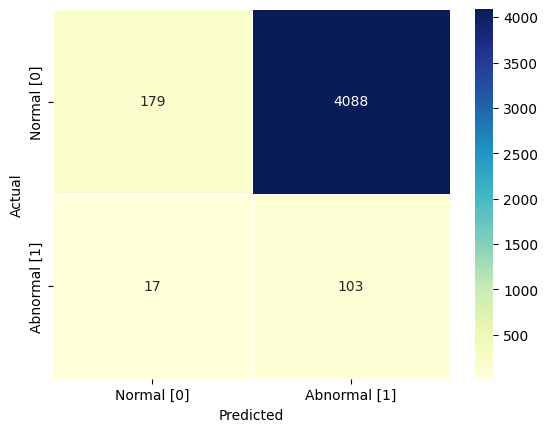

accuracy:  0.0642808297241851
recall:  0.858
precision:  0.025
f1-score:  0.048




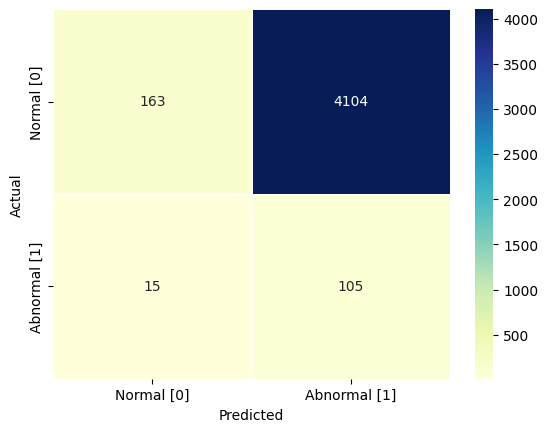

accuracy:  0.06108958285844541
recall:  0.875
precision:  0.025
f1-score:  0.049




In [ ]:
# 0.7
for i in list_contamination:
  pca_grid_search(i)

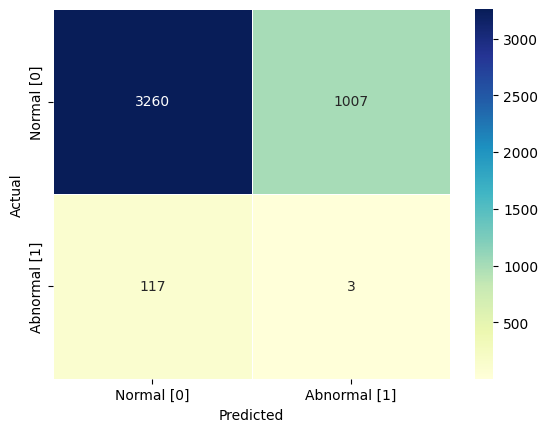

accuracy:  0.7437884659220424
recall:  0.025
precision:  0.003
f1-score:  0.005




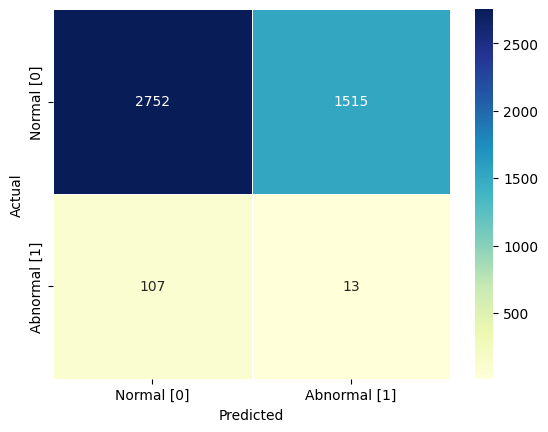

accuracy:  0.6302712559835879
recall:  0.108
precision:  0.009
f1-score:  0.016




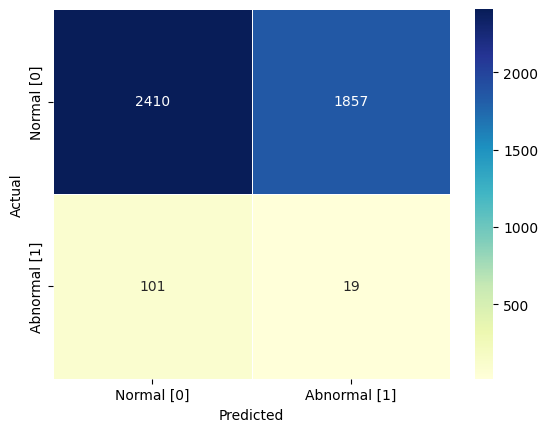

accuracy:  0.5536813312058354
recall:  0.158
precision:  0.01
f1-score:  0.019




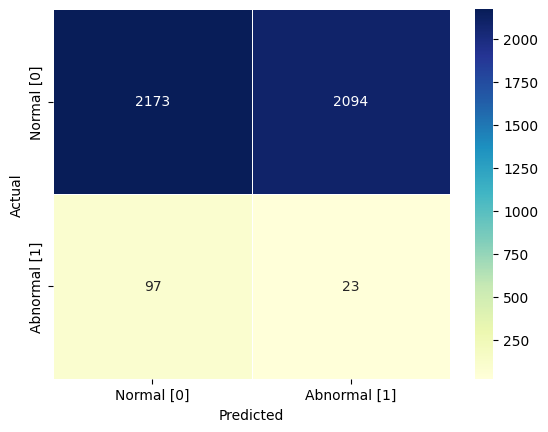

accuracy:  0.5005698655117392
recall:  0.192
precision:  0.011
f1-score:  0.021




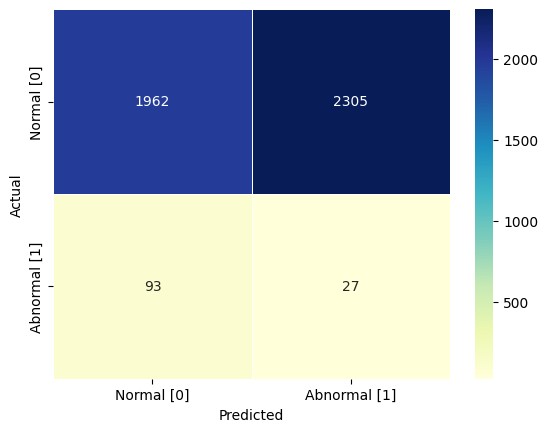

accuracy:  0.453385001139731
recall:  0.225
precision:  0.012
f1-score:  0.022




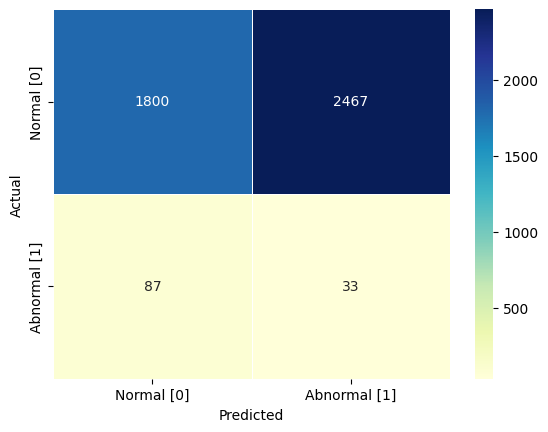

accuracy:  0.4178253932072031
recall:  0.275
precision:  0.013
f1-score:  0.025




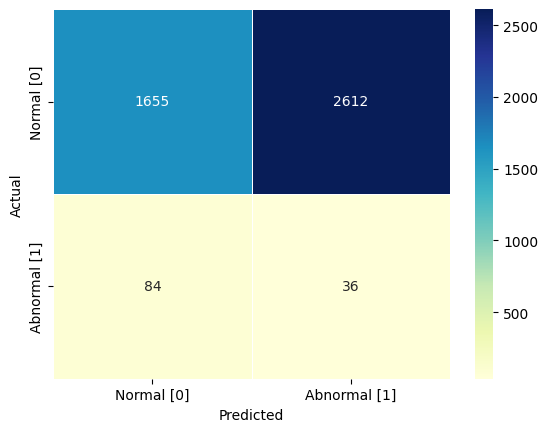

accuracy:  0.3854570321404149
recall:  0.3
precision:  0.014
f1-score:  0.026




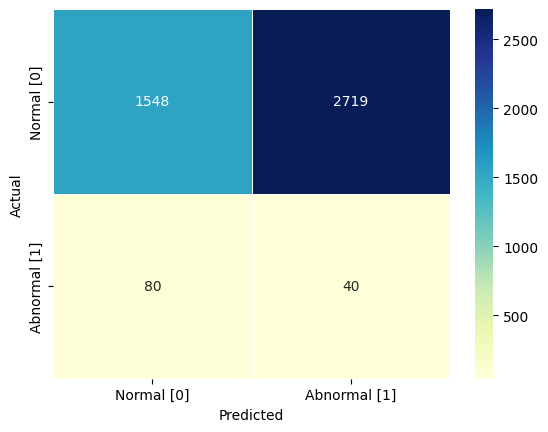

accuracy:  0.3619785730567586
recall:  0.333
precision:  0.014
f1-score:  0.028




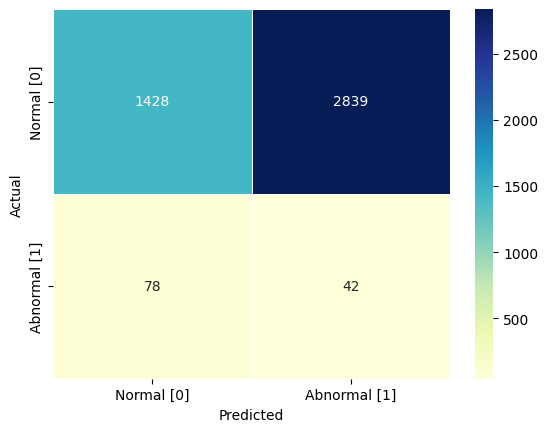

accuracy:  0.33508092090266695
recall:  0.35
precision:  0.015
f1-score:  0.028




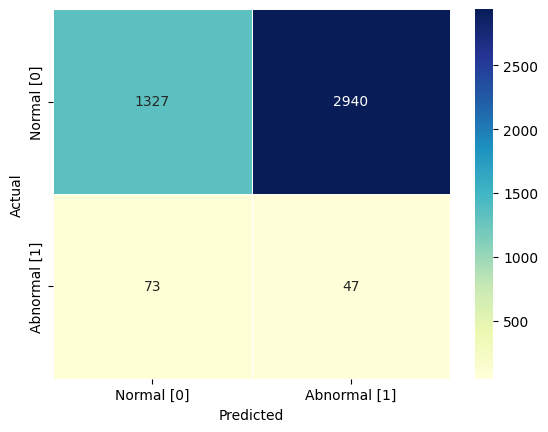

accuracy:  0.31319808525188053
recall:  0.392
precision:  0.016
f1-score:  0.03




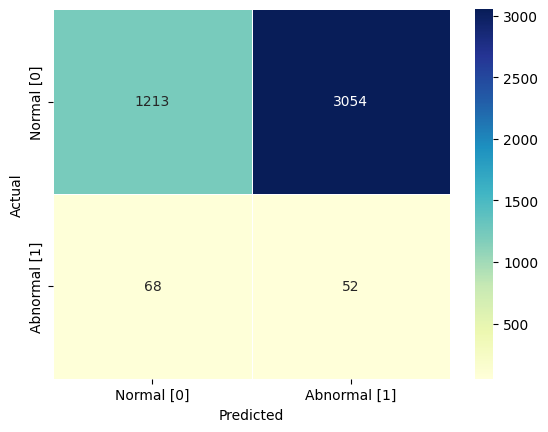

accuracy:  0.2883519489400502
recall:  0.433
precision:  0.017
f1-score:  0.032




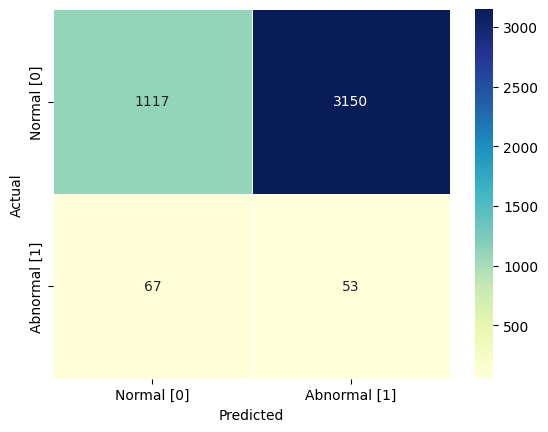

accuracy:  0.26669705949395944
recall:  0.442
precision:  0.017
f1-score:  0.032




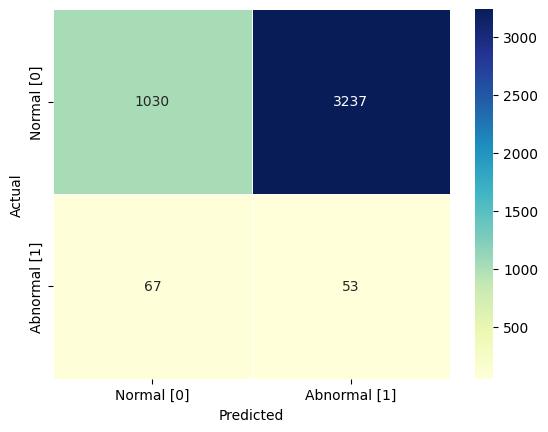

accuracy:  0.24686573968543424
recall:  0.442
precision:  0.016
f1-score:  0.031




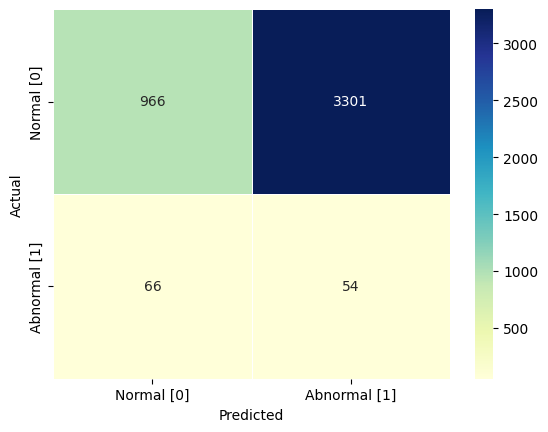

accuracy:  0.23250512878960566
recall:  0.45
precision:  0.016
f1-score:  0.031




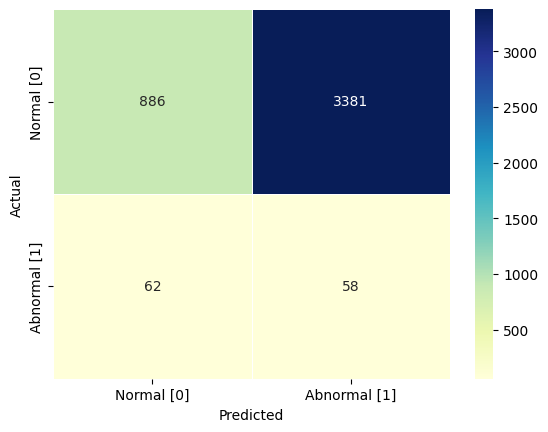

accuracy:  0.21518121723273306
recall:  0.483
precision:  0.017
f1-score:  0.033




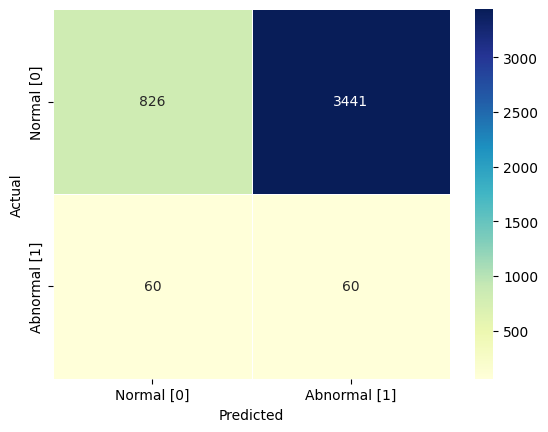

accuracy:  0.20196033736038296
recall:  0.5
precision:  0.017
f1-score:  0.033




In [ ]:
for i in list_contamination:
  pca_grid_search(i)

#  Auto-Encoder

In [ ]:
import tensorflow as tf

In [ ]:
input_dim = X_train.shape[1]

AE = tf.keras.models.Sequential([

    # encode
    tf.keras.layers.Dense(input_dim, activation='elu', input_shape=(input_dim, )),
    tf.keras.layers.Dense(4, activation='elu'),
    tf.keras.layers.Dense(2, activation='elu'),

    # decode
    tf.keras.layers.Dense(4, activation='elu'),
    tf.keras.layers.Dense(input_dim, activation='elu')

])

AE.compile(optimizer="adam", loss="mse")
AE.summary();

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 5)                 30        
                                                                 
 dense_6 (Dense)             (None, 4)                 24        
                                                                 
 dense_7 (Dense)             (None, 2)                 10        
                                                                 
 dense_8 (Dense)             (None, 4)                 12        
                                                                 
 dense_9 (Dense)             (None, 5)                 25        
                                                                 
Total params: 101
Trainable params: 101
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history = AE.fit(
    X_train,
    X_train,
    epochs=100,
    batch_size=32,
    validation_split=0.3
)

Epoch 1/100
288/288 [==============================] - 4s 5ms/step - loss: 0.0871 - val_loss: 0.0131
Epoch 2/100
288/288 [==============================] - 2s 6ms/step - loss: 0.0028 - val_loss: 5.7880e-04
Epoch 3/100
288/288 [==============================] - 2s 6ms/step - loss: 4.8806e-04 - val_loss: 5.7544e-04
Epoch 4/100
288/288 [==============================] - 2s 7ms/step - loss: 4.8702e-04 - val_loss: 5.7442e-04
Epoch 5/100
288/288 [==============================] - 2s 8ms/step - loss: 4.8600e-04 - val_loss: 5.7370e-04
Epoch 6/100
288/288 [==============================] - 1s 5ms/step - loss: 4.8505e-04 - val_loss: 5.7234e-04
Epoch 7/100
288/288 [==============================] - 1s 4ms/step - loss: 4.8383e-04 - val_loss: 5.7300e-04
Epoch 8/100
288/288 [==============================] - 1s 4ms/step - loss: 4.8327e-04 - val_loss: 5.6973e-04
Epoch 9/100
288/288 [==============================] - 1s 5ms/step - loss: 4.8144e-04 - val_loss: 5.7520e-04
Epoch 10/100
288/288 [=========

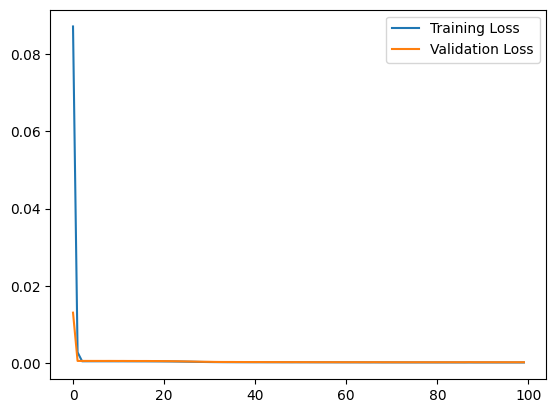

In [ ]:
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.legend()
plt.show()

In [ ]:
# train data에 대한 예측 값
AE_train_pred = AE.predict(X_train)

# 실제 값과 예측 값 사이의 차이인 MSE값을 reconstruction error로 정의 -> Novelty Score
train_mse = np.mean(np.power(X_train - AE_train_pred, 2), axis=1)
train_mse = pd.DataFrame({'Reconstruction_error': train_mse})
train_mse

412/412 [==============================] - 1s 3ms/step


,Reconstruction_error
0,4.827240e-07
1,4.827240e-07
2,4.827240e-07
3,4.827240e-07
4,4.827240e-07
...,...
13155,4.827202e-07
13156,4.827202e-07
13157,4.827202e-07
13158,4.827202e-07


In [ ]:
# train 데이터에 대한 novelty score 기준 상위 10% 의 값을 임계치로 설정
AE_thresh = np.percentile(sorted(train_mse['Reconstruction_error']), 90)
AE_thresh

4.82723976347188e-07

In [ ]:
# test data에 대한 예측 값
AE_test_pred = AE.predict(X_test)

# 실제 값과 예측 값 사이의 차이인 MSE값을 reconstruction error로 정의
test_mse = np.mean(np.power(X_test - AE_test_pred, 2), axis=1)
test_mse

138/138 [==============================] - 0s 3ms/step


9401     0.037006
2206     0.085395
10725    0.021322
6303     0.067988
11225    0.070553
           ...   
4942     0.047735
12353    0.008510
5099     0.069597
319      0.016195
15314    0.075862
Length: 4387, dtype: float32

In [ ]:
# classifier
# AE_thresh 기준, test_mse 값이 더 크면 이상(1), 작으면 정상(0)으로 분류
AE_test_df = []

def novelty_classifier(novelty_score):
    for i in range(len(novelty_score)):
        if novelty_score[i] > AE_thresh:
            AE_test_df.append(1)
        else:
            AE_test_df.append(0)

In [ ]:
novelty_classifier(test_mse.values)

accuracy:  0.027353544563483018
recall:  1.0
precision:  0.027
f1-score:  0.053


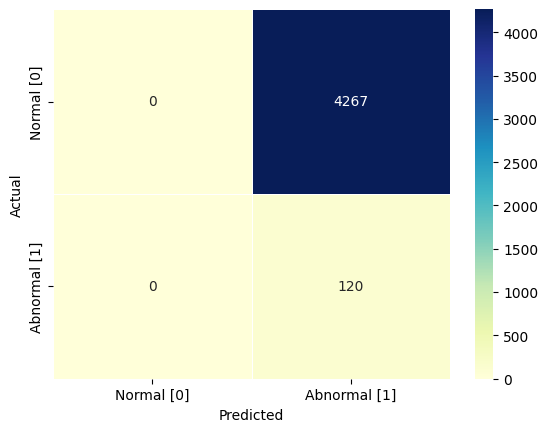

In [ ]:
# Confusion matrix 출력 및 모델 성능 평가
con_mat = confusion_matrix(y_test, AE_test_df) #confusion_matrix 함수 실행

sns.heatmap(pd.DataFrame(con_mat, columns = ['Predicted', 'Actual']),
            xticklabels=['Normal [0]', 'Abnormal [1]'],
            yticklabels=['Normal [0]', 'Abnormal [1]'],
            annot=True, fmt="d", linewidths=.5, cmap="YlGnBu")
plt.ylabel('Actual')
plt.xlabel('Predicted')

print("accuracy: ", accuracy_score(y_test, AE_test_df))
print("recall: ", round(recall_score(y_test, AE_test_df),3))
print("precision: ", round(precision_score(y_test, AE_test_df),3))
print("f1-score: ", round(f1_score(y_test, AE_test_df),3))

# K-Means (오류)

In [ ]:
# K-Means 클러스터링 함수 실행 후 차트 가시화
def k_Means_Plot(Data, Select_k, NAME, Init_Method = 'k-means++', Num_Init=10):
    global sum_of_squared_distance
    sum_of_squared_distance = []
    Data2 = Data[['feature1', 'feature2']]
    fig, axes = plt.subplots(1, (np.max(list(Select_k))-np.min(list(Select_k)))+1, figsize=(15, 4))
    for i in Select_k:
        Kmeans_Clustering = KMeans(n_clusters=i, init=Init_Method, random_state=2020, n_init=Num_Init)
        Kmeans_Clustering.fit(Data2)
        mglearn.discrete_scatter(Data2['feature1'], Data2['feature2'], Kmeans_Clustering.labels_, ax=axes[i - 2], s=5)
        mglearn.discrete_scatter(Kmeans_Clustering.cluster_centers_[:, 0],
                                 Kmeans_Clustering.cluster_centers_[:, 1],
                                 list(range(i)),
                                 markeredgewidth=3,
                                 ax=axes[i - 2], s=10)
        Score = np.round(silhouette_score(Data2, Kmeans_Clustering.labels_),2)
        axes[i - 2].set_title( NAME + ' / k = ' + str(i)+' / S_Score:'+str(Score))
        sum_of_squared_distance.append(Kmeans_Clustering.inertia_)

In [ ]:
df_sembed.columns

Index(['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'class'], dtype='object')

In [ ]:
df_sembed[['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10']]

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10
0,2.034006,0.858066,-2.788210,1.741591,1.812993,-1.605453,-0.649290,-2.772716,0.843163,-1.150438
1,2.622327,1.732430,-2.155679,0.153426,1.589763,-0.209240,0.951726,-1.741248,-0.264042,-0.169654
2,-1.540596,-1.636129,-3.590944,-1.284385,-2.331094,5.385638,1.974425,-1.826699,-0.410397,-1.979829
3,1.004786,-0.189459,0.449547,-0.934098,-0.058720,-0.789443,-0.302672,-0.327611,-1.213211,0.780026
4,-0.978981,-3.097074,0.476290,0.584177,1.354146,-2.236956,0.288802,0.489934,-0.562158,-0.417891
...,...,...,...,...,...,...,...,...,...,...
1995,2.709589,-0.182339,-1.714122,3.927612,-1.416654,0.256820,-0.890876,-2.979321,-0.129086,0.883639
1996,-1.957163,-1.504299,-2.939801,-2.411044,-1.061207,2.180546,-1.035367,-1.121424,0.547233,-0.666610
1997,3.804141,-1.075628,-0.057940,0.519172,-1.622389,-0.057764,0.489753,1.185063,1.143852,1.493942
1998,0.852765,-2.582380,4.135585,-1.214477,0.466809,0.975178,0.349132,0.571442,0.591708,-1.470282


In [ ]:
for i in range(1,10,2):
    k_Means_Plot(Data = df_sembed,
                    Select_k = range(2, 6),
                    NAME = "DATASET",
                    Init_Method='random',Num_Init=i)

KeyError: ignored

# Auto-Encoder + IForest

In [ ]:
!pip install pyod

In [ ]:
history = AE.fit(
    X_train,
    X_train,
    epochs=100,
    batch_size=32,
    validation_split=0.3
)

NameError: ignored

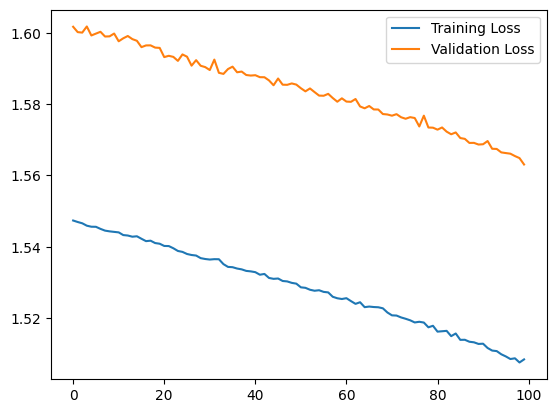

In [ ]:
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.legend()
plt.show()

In [ ]:
AE_train_pred = AE.predict(X_train)
AE_train_pred

44/44 [==============================] - 0s 3ms/step


array([[-0.9322366 , -0.9957562 , -0.98927647, ..., -0.8938534 ,
        -0.16614422, -0.03401243],
       [ 1.5526086 , -0.81172174, -0.09634942, ...,  0.3277824 ,
         0.16972177,  0.46557188],
       [ 1.412331  ,  0.15262294,  1.613719  , ...,  0.4750732 ,
         0.32121384,  0.5293351 ],
       ...,
       [ 2.5388389 , -0.9999793 , -0.99999154, ..., -0.9992956 ,
         0.44372612, -0.09850727],
       [ 2.0061827 , -0.969696  , -0.98592204, ..., -0.7645352 ,
         0.10031663,  0.17709455],
       [ 2.457603  , -0.9878552 , -0.999817  , ..., -0.9432791 ,
        -0.0498555 , -0.16935907]], dtype=float32)

In [ ]:
AE_test_pred = AE.predict(X_test)
AE_test_pred

19/19 [==============================] - 0s 3ms/step


array([[ 1.92143   , -0.9836733 , -0.975927  , ..., -0.80070376,
         0.17874928,  0.26460713],
       [-0.9999916 ,  1.1578872 ,  2.5501747 , ..., -0.98928636,
         0.29055995, -0.21421795],
       [ 1.7103497 ,  2.848151  , -0.29014638, ...,  0.6056297 ,
         0.12913828,  0.18712895],
       ...,
       [-1.        ,  2.642666  ,  0.987138  , ..., -0.9881546 ,
        -0.653285  , -0.74990964],
       [ 1.9440032 , -0.97370917, -0.97659755, ..., -0.75178   ,
         0.13787104,  0.23409289],
       [-0.8531846 , -0.9681464 , -0.87131196, ..., -0.48240075,
        -0.13808091,  0.14782734]], dtype=float32)

In [ ]:
print(AE_train_pred.shape)
print(AE_test_pred.shape)

(1400, 10)
(600, 10)


In [ ]:
from pyod.models.iforest import IForest
from pyod.models.pca import PCA

In [ ]:
IForest = IForest()
IForest.fit(AE_train_pred)

IForest(behaviour='old', bootstrap=False, contamination=0.1, max_features=1.0,
    max_samples='auto', n_estimators=100, n_jobs=1, random_state=None,
    verbose=0)

In [ ]:
IForest_train_pred = IForest.predict(AE_train_pred)
IForest_train_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
IForest_test_pred = IForest.predict(AE_test_pred)
IForest_test_pred

array([1, 1, 1, ..., 1, 1, 1])

accuracy:  0.027353544563483018
recall:  1.0
precision:  0.027
f1-score:  0.053


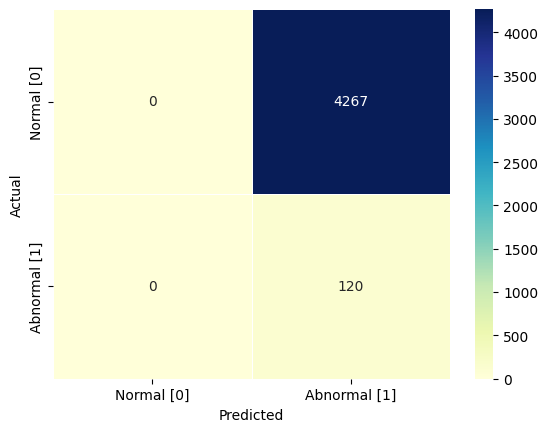

In [ ]:
# Confusion matrix 출력 및 모델 성능 평가
con_mat = confusion_matrix(y_test, IForest_test_pred)

sns.heatmap(pd.DataFrame(con_mat, columns = ['Predicted', 'Actual']),
            xticklabels=['Normal [0]', 'Abnormal [1]'],
            yticklabels=['Normal [0]', 'Abnormal [1]'],
            annot=True, fmt="d", linewidths=.5, cmap="YlGnBu")
plt.ylabel('Actual')
plt.xlabel('Predicted')

print("accuracy: ", accuracy_score(y_test, IForest_test_pred))
print("recall: ", round(recall_score(y_test, IForest_test_pred),3))
print("precision: ", round(precision_score(y_test, IForest_test_pred),3))
print("f1-score: ", round(f1_score(y_test, IForest_test_pred),3))

# Auto-Encoder + LOF

In [ ]:
value_for_weight = 0.8875
offset_for_nomral = -0.1688
#offset_for_nomral = 1

#offset_for_nomral = 1 - value_for_weight

y = df_sembed_for_if['class']
X = df_sembed_for_if.drop(columns=['class'])

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=96, shuffle=True)
train_dataset = X_train.copy()
train_dataset['class'] = y_train

weight_list_for_novelty = []
weight_list_for_normal = []

# 각 열마다 가중치를 구한다 (이상치용)
for col in train_dataset.drop("class", axis = 1).describe().columns:
    df_median = train_dataset.groupby('class').agg(median=(col, 'median'))
    weight_list_for_novelty.append((df_median['median'][0] - df_median['median'][1]) * value_for_weight)

  # 각 열마다 가중치를 구한다 (정상치용)
for col in train_dataset.drop("class", axis = 1).describe().columns:
    df_median = train_dataset.groupby('class').agg(median=(col, 'median'))
    weight_list_for_normal.append((df_median['median'][0] - df_median['median'][1]) * offset_for_nomral)

  # 이상 치에 각 열마다 구한 가중치를 반영
column_index = train_dataset.drop("class", axis = 1).describe().columns
for col in range(len(column_index)):
    train_dataset[column_index[col]] = np.where(train_dataset['class'] == 1, train_dataset[column_index[col]] * weight_list_for_novelty[col], train_dataset[column_index[col]])

  # 정상치에 각 열마다 구한 가중치를 반영
column_index = train_dataset.drop("class", axis = 1).describe().columns
for col in range(len(column_index)):
    train_dataset[column_index[col]] = np.where(train_dataset['class'] == 0, train_dataset[column_index[col]] * weight_list_for_normal[col], train_dataset[column_index[col]])

X_train = train_dataset.drop('class', axis = 1).copy()
  # min_max_normalization을 train data적용
for col in X_train.columns:
      X_train[col] = min_max_normalization(X_train[col])

for col in X_test.columns:
      X_test[col] = min_max_normalization(X_test[col])
X_train = X_train.reset_index(drop=True)

In [ ]:
history = AE.fit(
    X_train,
    X_train,
    epochs=100,
    batch_size=32,
    validation_split=0.3
)

Epoch 1/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0012 - val_loss: 0.0013
Epoch 2/100
288/288 [==============================] - 2s 6ms/step - loss: 0.0012 - val_loss: 0.0013
Epoch 3/100
288/288 [==============================] - 1s 5ms/step - loss: 0.0012 - val_loss: 0.0013
Epoch 4/100
288/288 [==============================] - 1s 4ms/step - loss: 0.0011 - val_loss: 0.0012
Epoch 5/100
288/288 [==============================] - 1s 4ms/step - loss: 0.0011 - val_loss: 0.0012
Epoch 6/100
288/288 [==============================] - 1s 4ms/step - loss: 0.0011 - val_loss: 0.0012
Epoch 7/100
288/288 [==============================] - 2s 7ms/step - loss: 0.0011 - val_loss: 0.0012
Epoch 8/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0011 - val_loss: 0.0012
Epoch 9/100
288/288 [==============================] - 2s 7ms/step - loss: 0.0011 - val_loss: 0.0012
Epoch 10/100
288/288 [==============================] - 2s 7ms/step - loss: 0.0011 - val_lo

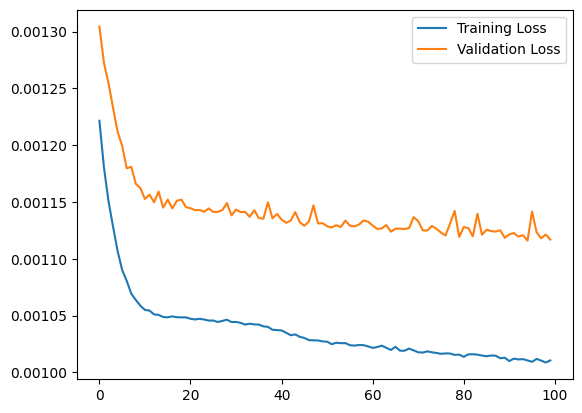

In [ ]:
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.legend()
plt.show()

In [ ]:
AE_train_pred = AE.predict(X_train)
AE_train_pred

412/412 [==============================] - 1s 2ms/step


array([[0.29887727, 0.53023946, 0.52635795, 0.50269693, 0.52331835],
       [0.29400995, 0.5432328 , 0.52511984, 0.5002811 , 0.52280325],
       [0.31346327, 0.48186657, 0.52487594, 0.5100491 , 0.5247063 ],
       ...,
       [0.31680748, 0.46318257, 0.55642706, 0.5117233 , 0.5264197 ],
       [0.29763612, 0.5335623 , 0.5253017 , 0.50208014, 0.52315474],
       [0.31372264, 0.4702257 , 0.45237046, 0.51013047, 0.52161497]],
      dtype=float32)

In [ ]:
AE_test_pred = AE.predict(X_test)
AE_test_pred

138/138 [==============================] - 0s 2ms/step


array([[0.2872949 , 0.29606757, 0.34016338, 0.49657202, 0.51482093],
       [0.2914707 , 0.4408016 , 0.12975708, 0.49403602, 0.50400233],
       [0.28136563, 0.27797338, 0.27937335, 0.49315405, 0.51156074],
       ...,
       [0.2626647 , 0.5694374 , 0.19765216, 0.48199415, 0.50486845],
       [0.23864351, 0.6570015 , 0.5464578 , 0.47337273, 0.51878077],
       [0.30340275, 0.5312944 , 0.6976644 , 0.5043901 , 0.53090566]],
      dtype=float32)

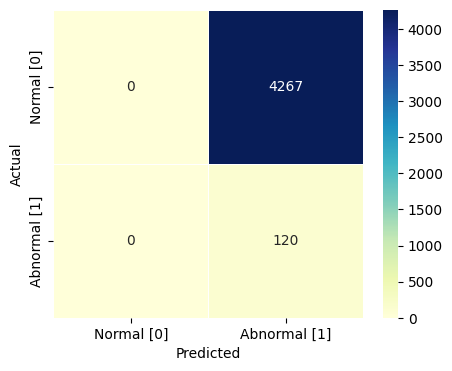

contamination: 0.075
con_mat:
[[   0 4267]
 [   0  120]]
accuracy:  0.027353544563483018
recall:  1.0
precision:  0.027
f1-score:  0.053


In [ ]:
from sklearn.neighbors import LocalOutlierFactor
contamination = 0.075 #0.0226
LOF = LocalOutlierFactor(contamination=contamination,novelty=True)
LOF.fit(AE_train_pred)

LOF_train_pred = LOF.predict(AE_train_pred)
LOF_test_pred = LOF.predict(AE_test_pred)


LOF_test_pred = pd.DataFrame(LOF_test_pred)
LOF_test_pred = LOF_test_pred.replace({-1: 1, 1: 0})

  # Confusion matrix 출력 및 모델 성능 평가
con_mat = confusion_matrix(y_test, LOF_test_pred)
fig, axes = plt.subplots(1,1, figsize=(5, 4))

sns.heatmap(pd.DataFrame(con_mat, columns = ['Predicted', 'Actual']),
              xticklabels=['Normal [0]', 'Abnormal [1]'],
              yticklabels=['Normal [0]', 'Abnormal [1]'],
              annot=True, fmt="d", linewidths=.5, cmap="YlGnBu")
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

print("contamination:", contamination)
print("con_mat:")
print(con_mat)
print("accuracy: ", accuracy_score(y_test, LOF_test_pred))
print("recall: ", round(recall_score(y_test, LOF_test_pred),3))
print("precision: ", round(precision_score(y_test, LOF_test_pred),3))
print("f1-score: ", round(f1_score(y_test, LOF_test_pred),3))




In [ ]:
# LOF 모델 구축
LOF = LocalOutlierFactor(contamination=0.1,novelty=True)
LOF.fit(X_train)

LocalOutlierFactor(contamination=0.1, novelty=True)

In [ ]:
# train data에 대한 예측 값(정상=1, 이상=-1)
LOF_train_pred = LOF.predict(AE_train_pred)
LOF_train_pred# test data에 대한 예측 값(정상=1, 이상=-1)
LOF_test_pred = LOF.predict(AE_test_pred)

LOF_test_pred = pd.DataFrame(LOF_test_pred)
LOF_test_pred = LOF_test_pred.replace({-1: 1, 1: 0})
LOF_test_pred

,0
0,1
1,0
2,1
3,1
4,0
...,...
4382,0
4383,1
4384,0
4385,0


accuracy:  0.5548210622293139
recall:  0.333
precision:  0.021
f1-score:  0.039


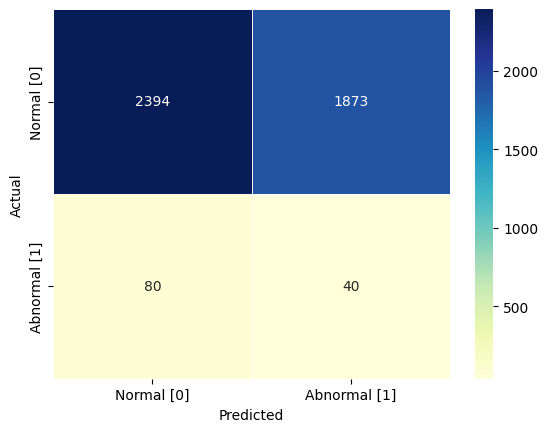

In [ ]:
# Confusion matrix 출력 및 모델 성능 평가
con_mat = confusion_matrix(y_test, LOF_test_pred)

sns.heatmap(pd.DataFrame(con_mat, columns = ['Predicted', 'Actual']),
            xticklabels=['Normal [0]', 'Abnormal [1]'],
            yticklabels=['Normal [0]', 'Abnormal [1]'],
            annot=True, fmt="d", linewidths=.5, cmap="YlGnBu")
plt.ylabel('Actual')
plt.xlabel('Predicted')

print("accuracy: ", accuracy_score(y_test, LOF_test_pred))
print("recall: ", round(recall_score(y_test, LOF_test_pred),3))
print("precision: ", round(precision_score(y_test, LOF_test_pred),3))
print("f1-score: ", round(f1_score(y_test, LOF_test_pred),3))

# Minimum Covariance Determinant (MCD): Tutorial

https://towardsdatascience.com/textual-novelty-detection-ce81d2e689bf

In [ ]:
value_for_weight = 0.7
#offset_for_nomral = 1
offset_for_nomral = 1 - value_for_weight

y = df_sembed_for_if['class']
X = df_sembed_for_if.drop(columns=['class'])

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=96, shuffle=True)
train_dataset = X_train.copy()
train_dataset['class'] = y_train

weight_list_for_novelty = []
weight_list_for_normal = []

# 각 열마다 가중치를 구한다 (이상치용)
for col in train_dataset.drop("class", axis = 1).describe().columns:
    df_median = train_dataset.groupby('class').agg(median=(col, 'median'))
    weight_list_for_novelty.append((df_median['median'][0] - df_median['median'][1]) * value_for_weight)

# 각 열마다 가중치를 구한다 (정상치용)
for col in train_dataset.drop("class", axis = 1).describe().columns:
    df_median = train_dataset.groupby('class').agg(median=(col, 'median'))
    weight_list_for_normal.append((df_median['median'][0] - df_median['median'][1]) * offset_for_nomral)


# 이상 치에 각 열마다 구한 가중치를 반영
column_index = train_dataset.drop("class", axis = 1).describe().columns
for col in range(len(column_index)):
    train_dataset[column_index[col]] = np.where(train_dataset['class'] == 1, train_dataset[column_index[col]] * weight_list_for_novelty[col], train_dataset[column_index[col]])
  # 정상치에 각 열마다 구한 가중치를 반영
column_index = train_dataset.drop("class", axis = 1).describe().columns
for col in range(len(column_index)):
    train_dataset[column_index[col]] = np.where(train_dataset['class'] == 0, train_dataset[column_index[col]] * weight_list_for_normal[col], train_dataset[column_index[col]])

X_train = train_dataset.drop('class', axis = 1).copy()
  # min_max_normalization을 train data적용
for col in X_train.columns:
      X_train[col] = min_max_normalization(X_train[col])

for col in X_test.columns:
      X_test[col] = min_max_normalization(X_test[col])
X_train = X_train.reset_index(drop=True)

NameError: ignored

In [ ]:
df_sample

,comment,class
0,무슨 명복들을 이렇게 빌고있나 그냥 자살한 건데. 제 손으로 열고 제 발로 들어갔다,0
1,니애미 차에 치여도 그소리함?,0
2,칼부림 난동범같은 악한이나 판단능력 떨어지는 자폐아들이 열었다가 사람 집어넣을까 무...,0
3,저렇게 위험한데 쉽게 열수 있다니 정말 기가 찬다~여성분도 쉽게 들어 올리는것 보면...,0
4,저렇게 깊구나,0
...,...,...
1995,지하5층까지 40~50미터?????지하20층인가요...???,0
1996,저런 문제는 소급적용해야 되지 않나? 완전 바깥에 노출된 시설인데..최소한의 안전설...,0
1997,본인이 열고 떨어진건가...진짜...성인이면 인지할 위험을...안전불감증이 낳은 사...,0
1998,시공사 국가관계자 들은 책임 져야합니다 국가에서 책임 배상 하셨으면 합니다삼가고인의...,0


In [ ]:
df_sample['class'].value_counts()

0    1959
1      41
Name: class, dtype: int64

In [ ]:
df_sample['embedding'] = df_sample.comment.apply(lambda x: embedder.encode(x))
df_sample['embedding'] = df_sample['embedding'].apply(np.array)

In [ ]:
df_sample

,comment,class,embedding
0,무슨 명복들을 이렇게 빌고있나 그냥 자살한 건데. 제 손으로 열고 제 발로 들어갔다,0,"[0.1669894, -0.40279448, 0.3672884, -0.6346365..."
1,니애미 차에 치여도 그소리함?,0,"[-0.17843172, -0.624182, 0.47729895, -0.267500..."
2,칼부림 난동범같은 악한이나 판단능력 떨어지는 자폐아들이 열었다가 사람 집어넣을까 무...,0,"[-0.25973776, -0.03606783, 0.076724984, -0.403..."
3,저렇게 위험한데 쉽게 열수 있다니 정말 기가 찬다~여성분도 쉽게 들어 올리는것 보면...,0,"[-0.37941858, -0.0648093, 0.14428923, -0.01422..."
4,저렇게 깊구나,0,"[0.08426348, -0.16259108, 0.06385823, 0.212524..."
...,...,...,...
1995,지하5층까지 40~50미터?????지하20층인가요...???,0,"[-0.3259659, 0.2782266, 0.61820525, -0.9181731..."
1996,저런 문제는 소급적용해야 되지 않나? 완전 바깥에 노출된 시설인데..최소한의 안전설...,0,"[-0.41460642, 0.2309051, -0.029276852, -0.3735..."
1997,본인이 열고 떨어진건가...진짜...성인이면 인지할 위험을...안전불감증이 낳은 사...,0,"[-0.7755897, 0.15340832, 0.21594529, -0.759519..."
1998,시공사 국가관계자 들은 책임 져야합니다 국가에서 책임 배상 하셨으면 합니다삼가고인의...,0,"[0.047551543, -0.24099563, -0.08950018, -0.961..."


In [ ]:
matrix = np.vstack(df_sample['embedding'].values)
matrix.shape

(2000, 768)

In [ ]:
# Reduce the dimensionality of the embeddings to 2D using PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
reduced_matrix = pca.fit_transform(X_train)
reduced_matrix.shape

(13160, 2)

In [ ]:
# Fit the Elliptic Envelope (MCD-based robust estimator)
from sklearn.covariance import EllipticEnvelope

envelope = EllipticEnvelope(contamination=0.2)
envelope.fit(reduced_matrix)

EllipticEnvelope(contamination=0.2)

In [ ]:
# Predict the labels of the sentences
labels = envelope.predict(reduced_matrix)

# Find the indices of the novel sentences
novel_indices = np.where(labels == -1)[0]
novel_indices

#Output: array([8, 9])

array([    1,     5,    10, ..., 13148, 13152, 13158])

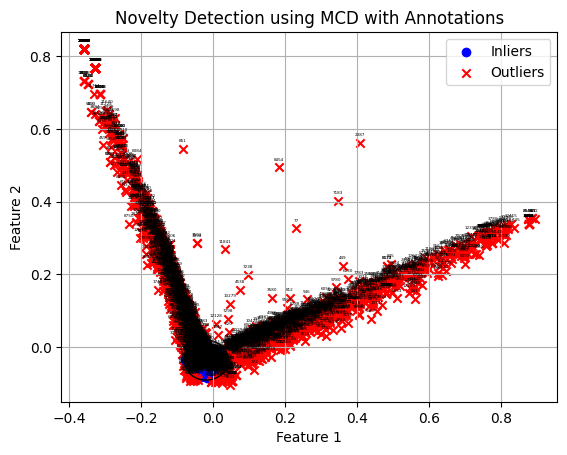

In [ ]:
from matplotlib.patches import Ellipse
# Extract the location and covariance of the central mode
location = envelope.location_
covariance = envelope.covariance_

# Compute the angle, width, and height of the ellipse
eigenvalues, eigenvectors = np.linalg.eigh(covariance)
order = eigenvalues.argsort()[::-1]
eigenvalues, eigenvectors = eigenvalues[order], eigenvectors[:, order]
vx, vy = eigenvectors[:, 0]
theta = np.arctan2(vy, vx)

# Compute the width and height of the ellipse based on the eigenvalues (variances)
width, height = 2 * np.sqrt(eigenvalues)

# Compute the Mahalanobis distance of the reduced 2D embeddings
mahalanobis_distances = envelope.mahalanobis(reduced_matrix)

# Compute the threshold based on the contamination parameter
threshold = np.percentile(mahalanobis_distances, (1 - envelope.contamination) * 100)

# Scale the width and height of the ellipse based on the Mahalanobis distance threshold
width, height = width * np.sqrt(threshold), height * np.sqrt(threshold)

# Plot the inliers and outliers
inliers = reduced_matrix[labels == 1]
outliers = reduced_matrix[labels == -1]

# Re-plot the inliers and outliers along with the elliptic envelope with annotations
plt.scatter(inliers[:, 0], inliers[:, 1], c='b', label='Inliers')
plt.scatter(outliers[:, 0], outliers[:, 1], c='r', label='Outliers', marker='x')
ellipse = Ellipse(location, width, height, angle=np.degrees(theta), edgecolor='k', facecolor='none')
plt.gca().add_patch(ellipse)

# Annotate each point with its index
for i, (x, y) in enumerate(reduced_matrix):
    plt.annotate(str(i), (x, y), textcoords="offset points", xytext=(0, 5), ha='center', fontsize = 3)

plt.title('Novelty Detection using MCD with Annotations')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report, precision_score, recall_score
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
# 이상치 점수를 사용하여 이상치를 결정 (예: 이상치 점수가 임계값보다 큰 경우는 이상치)
predicted_outliers = (mahalanobis_distances > threshold).astype(int)

# 원래 클래스 정보와 비교하여 Confusion Matrix를 생성
true_classes = y_test  # 원래의 클래스 정보
confusion = confusion_matrix(true_classes, predicted_outliers)

# Confusion Matrix 시각화
sns.heatmap(confusion, annot=True, fmt='d', cmap='YlGnBu', xticklabels=['normal', 'abnormal'], yticklabels=['normal', 'abnormal'])
plt.xlabel('predicted value')
plt.ylabel('real value')
plt.title('Confusion Matrix')
plt.show()

ValueError: ignored

In [ ]:
df_sample["predicted_class"] = predicted_outliers
df_sample

,comment,class,embedding,predicted_class
0,무슨 명복들을 이렇게 빌고있나 그냥 자살한 건데. 제 손으로 열고 제 발로 들어갔다,0,"[0.1669894, -0.40279448, 0.3672884, -0.6346365...",0
1,니애미 차에 치여도 그소리함?,0,"[-0.17843172, -0.624182, 0.47729895, -0.267500...",0
2,칼부림 난동범같은 악한이나 판단능력 떨어지는 자폐아들이 열었다가 사람 집어넣을까 무...,0,"[-0.25973776, -0.03606783, 0.076724984, -0.403...",1
3,저렇게 위험한데 쉽게 열수 있다니 정말 기가 찬다~여성분도 쉽게 들어 올리는것 보면...,0,"[-0.37941858, -0.0648093, 0.14428923, -0.01422...",0
4,저렇게 깊구나,0,"[0.08426348, -0.16259108, 0.06385823, 0.212524...",1
...,...,...,...,...
1995,지하5층까지 40~50미터?????지하20층인가요...???,0,"[-0.3259659, 0.2782266, 0.61820525, -0.9181731...",1
1996,저런 문제는 소급적용해야 되지 않나? 완전 바깥에 노출된 시설인데..최소한의 안전설...,0,"[-0.41460642, 0.2309051, -0.029276852, -0.3735...",0
1997,본인이 열고 떨어진건가...진짜...성인이면 인지할 위험을...안전불감증이 낳은 사...,0,"[-0.7755897, 0.15340832, 0.21594529, -0.759519...",0
1998,시공사 국가관계자 들은 책임 져야합니다 국가에서 책임 배상 하셨으면 합니다삼가고인의...,0,"[0.047551543, -0.24099563, -0.08950018, -0.961...",0


In [ ]:
df_sample[df_sample.predicted_class == 1]['comment'].head(50)

2      칼부림 난동범같은 악한이나 판단능력 떨어지는 자폐아들이 열었다가 사람 집어넣을까 무...
4                                                저렇게 깊구나
6                         아 조옷나 웃기네ㅋㅋㅋㅋㅋㅋㅋ 술처먹고ㅋㅋㅋㅋㅋㅋㅋㅋㅋ
7                                         4~50미터는 에바 아닌가
9      저런 환기구덮개가 너무 얇고 부실한데 연식상관없이 100프로 다 강화덮개로 의무교체...
11                                        참 정말 가지가지한다 ;;
12                   사망하신건 안타깝지만 술먹고 뚜껑을 열은건 자기잘못 아닌가요??
13                                             ㅋㅋㅋㅋ ㅋㅋㅋㅋ
15                   지자체 탓하지말고 지자체,나라에서 보상해주지마세요 그냥 사고니까
17                                                  잘가시개
18                               너무 속상해 ㅠㅠ 아까운 목숨 어떻게 해?
26               40 50 미터? 꼴깝터내 ㅋㅋㅋ 줬나 깊어봐야 25매다 댈라나 ㅋㅋㅋ
30                                          그냥 열리는게 레전드네
32                                             능지보니 자연사네
35          지존운지맨ㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷㄷ
36     판교 환기구 사건 보고 그이후로환기구 위로 절대 안걸어다님..안전불감증으로 언제 화...
37                                                 경계선인가
38                             

In [ ]:
df_sample[df_sample.predicted_class == 0]['comment'].head(50)

0        무슨 명복들을 이렇게 빌고있나 그냥 자살한 건데. 제 손으로 열고 제 발로 들어갔다
1                                      니애미 차에 치여도 그소리함?
3     저렇게 위험한데 쉽게 열수 있다니 정말 기가 찬다~여성분도 쉽게 들어 올리는것 보면...
5           일단 술이 문제다 술먹고 체하면 맨정신 일때보다 몆배는더사고날 확률이 높아진다
8                                               존나 허술하네
10    깊이40m나되는환기구덮개가누구나열수있게설치되었다는것에깜놀입니다깊이를모른채열었다가얼마...
14                                          그러니 술 좀 적당히
16    나이 마흔 먹고도 환기구 깊이를 하수구로 생각하는건가??아무리 술먹고.그랬어도. 상...
19                              저 위로 걸어다니는 인간은 진짜 강심장이다
20                                          안전하게 만들어줘야지
21    저렇게 깊은 환기구를 만들어 놓으면서 꼴랑 철망 올려놓은 저게 다라고??? 건물 설...
22                                    와 딱봐도 ㅈㄴ 위험해 보이는데
23                     환기구 바닥에 담배꽁초 있는거 레전드 ㅋㅋ 담배값좀 올려라
24    가끔 보면 진짜 아찔한 정도로 깊은 환기구 종종 보이던데.. 그래서 그 위로는 안걷...
25    40대 강남살면서 핸드폰하나 때문에 죽다니 사람앞날 모른다고.. 왜 구지 뜯어가지고...
27                                                 이세카이
28    죽었는데 휴대폰 주우려고 죽은지 아닌지 어떻게 알아?열려 있는거 모르고 떨어질수도 ...
29           저게 수십미터 환기구인줄 알고 열었겠냐 그냥 1미터정도 하수구인